<a href="https://colab.research.google.com/github/phmouras/Critical-Phenomena-in-gravitational-collapse-via-spectral-methods/blob/main/Origin_MSSC_N500_filter_Potential_working.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

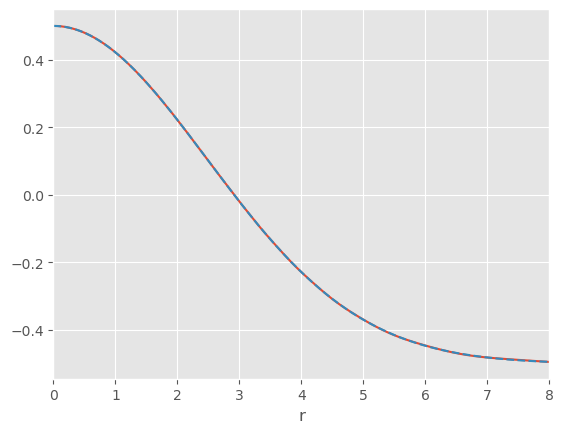

In [7]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import math
%matplotlib inline
mpl.style.use('ggplot')


N = 50                                                   # Truncation ordem

L0 = 2                                             # Map parameter

col = np.cos(np.arange(2*N + 3)*math.pi /(2*N + 2))      # collocation points (Verificado)

colr = col[1:N+2]                                                         # physical domain (Verificado)

r1 = L0 * colr/(np.sqrt(1-colr**2))
r = np.flip(r1)                                           # physical domain (Verificado)

#out_r = open('r_30_L02.txt', 'a')
#out_r.write(' ' +' '.join(str('%.18f'%n) for n in r)+'\n')
#out_r.close()


# Base Matrix (Tchebyshev Polinomials):

SB = np.zeros([N+2,N+1])
rSB = np.zeros([N+2,N+1])
rrSB = np.zeros([N+2,N+1])


for i in range(N+1+1):                                    # SB[:,0] = function in origin
  SB[i,] = np.sin((2*i+1)*np.arctan(L0/r))

for i in range(N+1+1):
  rSB[i,] = -np.cos((2*i+1)*np.arctan(L0/r))*(2*i+1)*L0/(r**2*(1+L0**2/r**2))

for i in range(N+1+1):
  rrSB[i,] = -np.sin((2*i+1)*np.arctan(L0/r))*(2*i+1)**2*L0**2/(r**4*(1+L0**2/r**2)**2)+2*np.cos((2*i+1)*np.arctan(L0/r))*(2*i+1)*L0/(r**3*(1+L0**2/r**2))-2*np.cos((2*i+1)*np.arctan(L0/r))*(2*i+1)*L0**3/(r**5*(1+L0**2/r**2)**2)

# Base function



psi = SB[0:N+1,:]        # origin included in psi[:,0]
rpsi = rSB[0:N+1,:]
rrpsi = rrSB[0:N+1,:]



# Initial conditions of Phi (Scalar field)

#r0 = 0

#sigma = 1/2

# L0 = 1 and sigma = 1/2 and Phi_init = A0*(np.exp(-(r-r0)**2/sigma**2) + np.exp(-(r+r0)**2/sigma**2))

#A0 =  0.76  #  0.7602785  -> disperse ;  # 0.77 -> colapse

# L0 = 3 and sigma = 1/2 and Phi_init = A0*(np.exp(-(r-r0)**2/sigma**2) + np.exp(-(r+r0)**2/sigma**2))

#A0 =  0.75981136951800  #  0.759811369518  -> disperse ;  # 0.759811369518001   -> colapse

Phi_c = 1/2

Phi_vac = -1/2

R0 = 3.5  # 0.05 -> disperse ;  # 0.  -> colapse   A0 substitution

Phi_init = (Phi_c - Phi_vac)*np.exp(-r**2/R0**2) + Phi_vac          # Phi initial data out of origin (Verificado)

inv_psi = np.linalg.inv(psi)

a0 = np.dot(Phi_init, inv_psi)  # coeficients a(0)  (Verificado)

#out_a = open('a0_30_L02.txt', 'a')
#out_a.write(' ' +' '.join(str('%.18f'%n) for n in a0)+'\n')
#out_a.close()


Phi = np.dot(a0, psi)        # approximative solution in t = 0
rPhi= np.dot(a0, rpsi)

########################### Plot: Initial Conditions of Phi

M = 3000       # plot truncation

rplot = np.linspace(0.00000000000000001,8,M)

colplot = rplot/np.sqrt(L0**2 + rplot**2)

SBplot = np.zeros([N+1,M])
rSBplot = np.zeros([N+1,M])
rrSBplot = np.zeros([N+1,M])

for i in range(N+1):
  SBplot[i,] = np.sin((2*i+1)*np.arctan(L0/rplot))

for i in range(N+1):
  rSBplot[i,] = -np.cos((2*i+1)*np.arctan(L0/rplot))*(2*i+1)*L0/(rplot**2*(1+L0**2/rplot**2))

for i in range(N+1):
  rrSBplot[i,] = -np.sin((2*i+1)*np.arctan(L0/rplot))*(2*i+1)**2*L0**2/(rplot**4*(1+L0**2/rplot**2)**2)+2*np.cos((2*i+1)*np.arctan(L0/rplot))*(2*i+1)*L0/(rplot**3*(1+L0**2/rplot**2))-2*np.cos((2*i+1)*np.arctan(L0/rplot))*(2*i+1)*L0**3/(rplot**5*(1+L0**2/rplot**2)**2)

psiplot = SBplot[0:(N+1),:]
rpsiplot = rSBplot[0:(N+1),:]
rrpsiplot = rrSBplot[0:(N+1),:]

Phiplot_init = (Phi_c - Phi_vac)*np.exp(-rplot**2/R0**2) + Phi_vac

#Phiplot_init = np.hstack((0, Phiplot_int))

Phiplot = np.dot(a0, psiplot)

plt.plot(rplot, Phiplot, rplot, Phiplot_init, "--")   #(Verificado)
plt.xlabel('r')
plt.xlim(0,8)
plt.show()


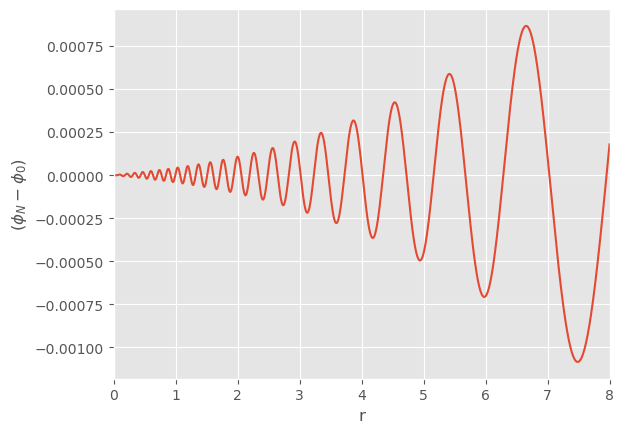

In [8]:
erro = Phiplot_init - Phiplot

plt.plot(rplot, erro)
plt.xlabel('r')
plt.xlim(0,8)
plt.ylabel("$(\phi_N - \phi_0)$")
plt.show()

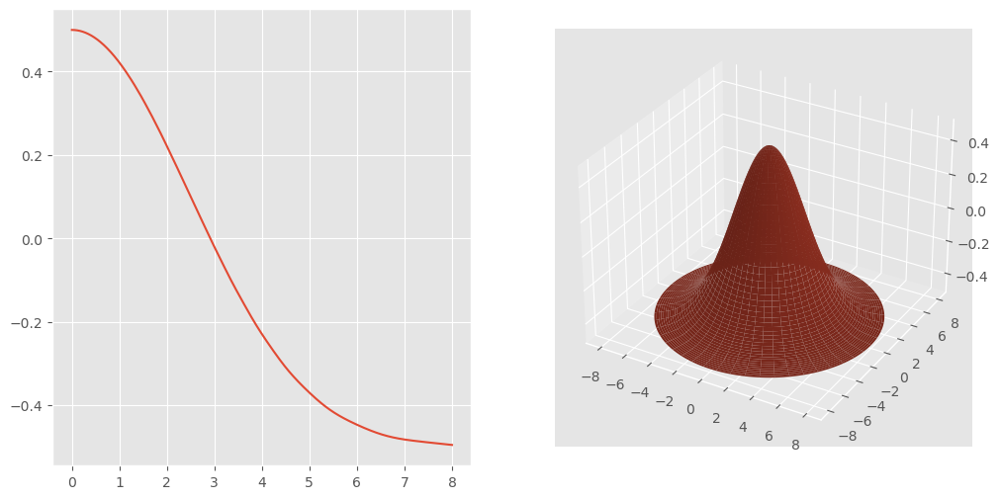

In [9]:

# Plot 3D from Phi initial:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,6))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122,projection='3d')

y = Phiplot
x = rplot
theta = np.linspace(0, 2*np.pi, M)    # Revolution of f(phi,r)

xn = np.outer(x, np.cos(theta))
yn = np.outer(x, np.sin(theta))
zn = np.zeros_like(xn)

for i in range(len(x)):
    zn[i,:] = np.full_like(zn[0], y[i])

ax1.plot(x, y)
ax2.plot_surface(xn, yn, zn)
plt.show()

In [10]:
Pi_0 = np.zeros(N+1)
b0 = np.dot(Pi_0, psi)
Pi = np.dot(b0, psi)

c0 = np.zeros([N+1])     # guess value
for i in range(N+1):
  c0[i] = 0.0001

def V(Phi):
  return 1/4*(Phi**2 - Phi_vac**2)**2

def dV(Phi):
  return Phi**3 - Phi_vac**2*Phi


coeforigin = 1/L0**2*(-(-1)**(np.arange(N+1))*(2*np.arange(1,N+2)-1)**2)    # 1/r * d\phi/dr

tol = 1e-18
#cnew = 0
#err = abs(c0 - cnew)

n = 0
nf = 500

# Newton Raphson loop
#while max(err) >= tol:
while n <= nf:
  Chi = np.dot(c0, psi)
  rChi = np.dot(c0 ,rpsi)
  rrChi = np.dot(c0, rrpsi)
  H0_0 = 4*rrChi[0] + 8*np.dot(coeforigin,c0) + 1/2*rPhi[0]**2 + np.exp(4*Chi[0])*V(Phi)[0]
  H0_int = 4*rChi[1:N+1]**2 + 4*rrChi[1:N+1] + 8/r[1:N+1]*rChi[1:N+1] + 1/2*rPhi[1:N+1]**2 + np.exp(4*Chi[1:N+1])*V(Phi)[1:N+1]
  H0 = np.hstack((H0_0, H0_int))
  J1 = rChi*rpsi
  JH_0 = 8*J1[:,0]+ 4*rrpsi[:,0] + 8*coeforigin + 4*np.exp(4*Chi[0])*rpsi[:,0]*V(Phi)[0]
  JH_int = 8*J1[:,1:N+1] + 4*rrpsi[:,1:N+1] + 8/r[1:N+1]*rpsi[:,1:N+1] + 4*np.exp(4*Chi[1:N+1])*rpsi[:,1:N+1]*V(Phi)[1:N+1]
  JH = np.column_stack((JH_0, JH_int))
  inv_JH = np.linalg.inv(JH)
  cnew = c0
  c0 = c0 - np.dot(H0, inv_JH)
  err = abs(c0 - cnew)
  if  max(err) <= tol:
    print('n=', n, 'Erro_max=', max(err), 'c0=', c0, sep = '\n')

    break
  else:
    n = n + 1


n=
23
Erro_max=
8.673617379884035e-19
c0=
[ 1.44902974e-01  2.82551868e-02  4.60180684e-03 -7.48243541e-04
 -7.69395493e-04  7.58524143e-05  5.70640684e-04  6.64992247e-04
  5.65107305e-04  4.29479670e-04  3.25618556e-04  2.63187190e-04
  2.29669576e-04  2.10501796e-04  1.96111963e-04  1.82179734e-04
  1.67706264e-04  1.53137352e-04  1.39199737e-04  1.26402917e-04
  1.14940812e-04  1.04772502e-04  9.57351909e-05  8.76361316e-05
  8.03014804e-05  7.35972417e-05  6.74269844e-05  6.17251065e-05
  5.64445378e-05  5.15501992e-05  4.70112353e-05  4.27997824e-05
  3.88876503e-05  3.52482615e-05  3.18554032e-05  2.86864704e-05
  2.57219965e-05  2.29491745e-05  2.03609427e-05  1.79579277e-05
  1.57443647e-05  1.37250831e-05  1.18951957e-05  1.02314924e-05
  8.68124206e-06  7.16402350e-06  5.59042600e-06  3.91806256e-06
  2.23693434e-06  8.45513936e-07  1.38941335e-07]


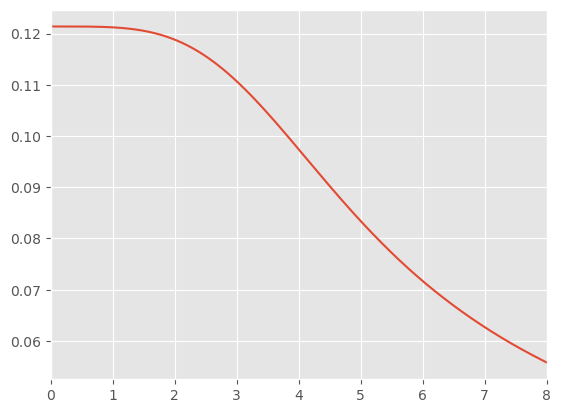

In [12]:

Chiplot = np.dot(c0, psiplot)


plt.plot(rplot,Chiplot)
plt.xlim(0,8)
plt.show()


In [13]:
# Equation for Krr: momentum constraint

# Initial values of Krr: Base functions of Krr

# In r = 0:

SB1 = 1/2*(SB[1:(N+1),:] + SB[0:(N),:])          # VERIFICADO
rSB1 = 1/2*(rSB[1:(N+1),:] + rSB[0:(N),:])
rrSB1 = 1/2*(rrSB[1:(N+1),:] + rrSB[0:(N),:])

# Base functions for Beta

SB2 = np.zeros([N,N+1])
rSB2 = np.zeros([N,N+1])
rrSB2 = np.zeros([N,N+1])



for i in range(N):                                                   # VERIFICADO
  SB2[i,] = np.sin((2*(i+1/2)+1)*np.arctan(L0/r))


for i in range(N):
  rSB2[i,] = -np.cos((2*i+2)*np.arctan(L0/r))*(2*i+2)*L0/(r**2*(1+L0**2/r**2))


for i in range(N):
  rrSB2[i,] = -np.sin((2*i+2)*np.arctan(L0/r))*(2*i+2)**2*L0**2/(r**4*(1+L0**2/r**2)**2)+2*np.cos((2*i+2)*np.arctan(L0/r))*(2*i+2)*L0/(r**3*(1+L0**2/r**2))-2*np.cos((2*i+2)*np.arctan(L0/r))*(2*i+2)*L0**3/(r**5*(1+L0**2/r**2)**2)






In [14]:
np.shape(SB2)

(50, 51)

In [15]:
np.shape(SB1)

(50, 51)

In [16]:
c0

array([ 1.44902974e-01,  2.82551868e-02,  4.60180684e-03, -7.48243541e-04,
       -7.69395493e-04,  7.58524143e-05,  5.70640684e-04,  6.64992247e-04,
        5.65107305e-04,  4.29479670e-04,  3.25618556e-04,  2.63187190e-04,
        2.29669576e-04,  2.10501796e-04,  1.96111963e-04,  1.82179734e-04,
        1.67706264e-04,  1.53137352e-04,  1.39199737e-04,  1.26402917e-04,
        1.14940812e-04,  1.04772502e-04,  9.57351909e-05,  8.76361316e-05,
        8.03014804e-05,  7.35972417e-05,  6.74269844e-05,  6.17251065e-05,
        5.64445378e-05,  5.15501992e-05,  4.70112353e-05,  4.27997824e-05,
        3.88876503e-05,  3.52482615e-05,  3.18554032e-05,  2.86864704e-05,
        2.57219965e-05,  2.29491745e-05,  2.03609427e-05,  1.79579277e-05,
        1.57443647e-05,  1.37250831e-05,  1.18951957e-05,  1.02314924e-05,
        8.68124206e-06,  7.16402350e-06,  5.59042600e-06,  3.91806256e-06,
        2.23693434e-06,  8.45513936e-07,  1.38941335e-07])

In [17]:
Nq = int(3/2*N)           # Quadrature truncation

gauss_quadrature = np.polynomial.legendre.leggauss(Nq + 1)

new_col = gauss_quadrature[0]            # Legendre quadrature points


# Legendre Polinomials

P = np.zeros([Nq+3,Nq+1])
colP = np.zeros([Nq+3,Nq+1])

P[0,] = 1
P[1,] = new_col

colP[0,] = 0
colP[1,] = 1

for i in range(2,Nq+3):
  P[i,] = ((2*i-1)*new_col*P[i-1,] - (i-1)*P[i-2,])/(i)

for i in range(2,Nq+3):
  colP[i,] = i*P[i-1] + new_col*colP[i-1]

P_max = P[Nq+1]

colP_max = colP[Nq+1]

wq_col = 2/((1-new_col**2)*colP_max**2)    # Legendre weight (Verificado)

rq = L0*(1+new_col)/(1-new_col)            # Physical quadrature domain

qSB = np.zeros([Nq+1,Nq+1])
qrSB = np.zeros([Nq+1,Nq+1])
qrrSB = np.zeros([Nq+1,Nq+1])


for i in range(Nq+1):
  qSB[i,] = np.sin((2*i+1)*np.arctan(L0/rq))

for i in range(Nq+1):
  qrSB[i,] = -np.cos((2*i+1)*np.arctan(L0/rq))*(2*i+1)*L0/(rq**2*+L0**2)

for i in range(Nq+1):
  qrrSB[i,] = -np.sin((2*i+1)*np.arctan(L0/rq))*(2*i+1)**2*L0**2/(rq**4*(1+L0**2/rq**2)**2)+2*np.cos((2*i+1)*np.arctan(L0/rq))*(2*i+1)*L0/(rq**3*(1+L0**2/rq**2))-2*np.cos((2*i+1)*np.arctan(L0/rq))*(2*i+1)*L0**3/(rq**5*(1+L0**2/rq**2)**2)

qpsi = qSB[0:N+1,:]
rqpsi = qrSB[0:N+1,:]
rrqpsi = qrrSB[0:N+1,:]


qSB1 = 1/2*(qSB[1:(N+1),:] + qSB[0:(N),:])          # VERIFICADO
rqSB1 = 1/2*(qrSB[1:(N+1),:] + qrSB[0:(N),:])
rrqSB1 = 1/2*(qSB[1:(N+1),:] + qrrSB[0:(N),:])



# Initial Phi in quadrature points

#qPhi = np.dot(a0, qpsi)
#rqPhi= np.dot(a0, rqpsi)

# Initial Pi for quadrature points

#qPi = np.dot(b0, qpsi)


# Initial Chi for quadrature points:

#qChi = np.dot(c0, qpsi)   # Verificado todos
#rqChi = np.dot(c0, rqpsi)
#rrqChi = np.dot(c0, rrqpsi)

# Initial values of Krr:

#qKrr = np.dot(ck0, qSB1)

# Alpha na origem

#Alphacenter = (-1)**(np.arange(N+1))


In [18]:
# Filtering

Nc = 0

Nf = N - Nc

coef_f = 36
s = 30

filter1 = np.ones(N+1)
#filter2 = np.ones(N)
#filter1 = np.hstack((np.ones(Nc),np.exp(- coef_f*((np.arange(N - Nc + 1))/(N-Nc))**s)))
#filter1 = np.exp(- coef_f*((np.arange(N - Nc + 1))/(N-Nc))**s)

In [19]:
# Runge Kutta 4th order

h = 0.0002   # step size
tf = 20

It = int(tf/h)

#t1 = np.linspace(0, tf, It)

t = 0

Madm = []
Alpha_origin = []
phi_origin = []
L2HC = []
phi_set = []

out_a = open('Alpha_origin.txt', 'a')
out_a.truncate(0)                        # arase the old datas and start the new ones

out_p = open('phi_origin.txt', 'a')
out_p.truncate(0)


M0 = 2*np.dot(np.arange(1, 2*N + 2, 2), c0) # Madm(t = 0)


#matriz = np.concatenate((array1, array2))

while t <= tf:

  # First step
  Phi = np.dot(a0, psi)
  rPhi = np.dot(a0, rpsi)
  rrPhi = np.dot(a0, rrpsi)
  Pi = np.dot(b0, psi)
  rPi= np.dot(b0, rpsi)
  Chi = np.dot(c0, psi)
  rChi = np.dot(c0, rpsi)
  rrChi = np.dot(c0, rrpsi)
  Matrix_Krr = 2*rChi[1:N+1]*SB1[:,1:N+1] + rSB1[:,1:N+1] + 3/r[1:N+1]*SB1[:,1:N+1]   # (p, p)
  inv_matrix_krr = np.linalg.inv(Matrix_Krr)
  rhsk = - Pi[1:N+1]*rPhi[1:N+1]*np.exp(4*Chi[1:N+1]) # (p,)
  ck0 = np.dot(rhsk, inv_matrix_krr)  # (p,)
  Krr = np.dot(ck0, SB1)              # (p+1,)
  rKrr = np.dot(ck0, rSB1)
  Matrix_Alpha_0 = rrpsi[:,0] + 2*coeforigin - np.exp(4*Chi[0])*(Pi[0]**2 - V(Phi)[0])*psi[:,0]
  Matrix_Alpha_int = rrpsi[:,1:N+1] + 2*(1/r[1:N+1] + rChi[1:N+1])*rpsi[:,1:N+1] - 3/2*np.exp(-4*Chi[1:N+1])*Krr[1:N+1]**2*psi[:,1:N+1]  - np.exp(4*Chi[1:N+1])*(Pi[1:N+1]**2 - V(Phi)[1:N+1])*psi[:,1:N+1]
  Matrix_Alpha = np.column_stack((Matrix_Alpha_0, Matrix_Alpha_int))
  inv_matrix_alpha = np.linalg.inv(Matrix_Alpha)
  rhsal = 3/2*np.exp(-4*Chi)*Krr**2 + np.exp(4*Chi)*(Pi**2-V(Phi))
  al0 = np.dot(rhsal, inv_matrix_alpha)
  Alpha = 1 + np.dot(al0, psi)
  rAlpha = np.dot(al0, rpsi)
  rrAlpha = np.dot(al0, rrpsi)
  Matrix_Beta = rSB2[:,1:N+1] - SB2[:,1:N+1]/r[1:N+1]
  inv_matrix_beta = np.linalg.inv(Matrix_Beta)
  rhsbe = 3/2*Alpha[1:N+1]*np.exp(-4*Chi[1:N+1])*Krr[1:N+1]
  be0 = np.dot(rhsbe , inv_matrix_beta)
  Beta = np.dot(be0, SB2)
  rBeta = np.dot(be0, rSB2)
  db_origin = 2*np.exp(-4*Chi[0])*Alpha[0]*np.dot(a0, coeforigin) + np.exp(-4*Chi[0])*Alpha[0]*rrPhi[0] - Alpha[0]*dV(Phi)[0]
  db_int = Beta[1:N+1]*rPi[1:N+1] + np.exp(-4*Chi[1:N+1])*(2*Alpha[1:N+1]/r[1:N+1] + rAlpha[1:N+1] + 2*rChi[1:N+1]*Alpha[1:N+1])*rPhi[1:N+1] + np.exp(-4*Chi[1:N+1])*Alpha[1:N+1]*rrPhi[1:N+1] - Alpha[1:N+1]*dV(Phi)[1:N+1]
  db = np.dot(np.hstack((db_origin, db_int)), inv_psi)
  dc = np.dot(Beta*rChi + rBeta/2 - Alpha/2*np.exp(-4*Chi)*Krr, inv_psi)
  da = np.dot(Alpha*Pi + Beta*rPhi, inv_psi)
  K1 = h*(dc)
  L1 = h*(da)
  N1 = h*(db)

  # L2-error associated to the Hamiltonian constraint
  qPhi = np.dot(a0, qpsi)
  rqPhi= np.dot(a0, rqpsi)
  qPi = np.dot(b0, qpsi)
  qChi = np.dot(c0, qpsi)
  rqChi = np.dot(c0, rqpsi)
  rrqChi = np.dot(c0, rrqpsi)
  qKrr = np.dot(ck0, qSB1)
  H = 4*rqChi**2 + 4*rrqChi + 8*rqChi/rq + 3/4*np.exp(-4*qChi)*qKrr**2 + np.exp(4*qChi)*(1/2*qPi**2 + np.exp(-4*qChi)/2*rqPhi**2)   # Hamiltonian constraint (HC)
  L2HC.append((1/2*np.dot(H**2,wq_col))**1/2)    # L2 error of HC

  # Alpha origin
  Alpha_0 = 1 + np.dot(al0, psi[:,0])
  Alpha_origin.append(Alpha_0)                   # = Alphacenter in matlab
  out_a.write(str(t) + " " + str(Alpha_0))
  out_a.write(',\n')

  # Phi origin:
  phi_0 = np.dot(a0, psi[:,0])
  phi_origin.append(phi_0)
  out_p.write(str(t) + " " + str(phi_0))
  out_p.write(',\n')

  # ADM mass:
  Madm.append(2*np.dot(np.arange(1, 2*N + 2, 2), c0))

  # Second step
  Phi = np.dot(a0 + L1/2, psi)
  rPhi= np.dot(a0 + L1/2 , rpsi)
  rrPhi = np.dot(a0 + L1/2, rrpsi)
  Pi = np.dot(b0 + N1/2, psi)
  rPi= np.dot(b0 + N1/2, rpsi)
  Chi = np.dot(c0 + K1/2, psi)
  rChi = np.dot(c0 + K1/2, rpsi)
  rrChi = np.dot(c0 + K1/2, rrpsi)
  Matrix_Krr = 2*rChi[1:N+1]*SB1[:,1:N+1] + rSB1[:,1:N+1] + 3/r[1:N+1]*SB1[:,1:N+1]   # (p, p)
  inv_matrix_krr = np.linalg.inv(Matrix_Krr)
  rhsk = - Pi[1:N+1]*rPhi[1:N+1]*np.exp(4*Chi[1:N+1]) # (p,)
  ck0 = np.dot(rhsk, inv_matrix_krr)  # (p,)
  Krr = np.dot(ck0, SB1)              # (p+1,)
  rKrr = np.dot(ck0, rSB1)
  Matrix_Alpha_0 = rrpsi[:,0] + 2*coeforigin - np.exp(4*Chi[0])*(Pi[0]**2 - V(Phi)[0])*psi[:,0]
  Matrix_Alpha_int = rrpsi[:,1:N+1] + 2*(1/r[1:N+1] + rChi[1:N+1])*rpsi[:,1:N+1] - 3/2*np.exp(-4*Chi[1:N+1])*Krr[1:N+1]**2*psi[:,1:N+1] - np.exp(4*Chi[1:N+1])*(Pi[1:N+1]**2 - V(Phi)[1:N+1])*psi[:,1:N+1]
  Matrix_Alpha = np.column_stack((Matrix_Alpha_0, Matrix_Alpha_int))
  inv_matrix_alpha = np.linalg.inv(Matrix_Alpha)
  rhsal = 3/2*np.exp(-4*Chi)*Krr**2 + np.exp(4*Chi)*(Pi**2-V(Phi))
  al0 = np.dot(rhsal, inv_matrix_alpha)
  Alpha = 1 + np.dot(al0, psi)
  rAlpha = np.dot(al0, rpsi)
  rrAlpha = np.dot(al0, rrpsi)
  Matrix_Beta = rSB2[:,1:N+1] - SB2[:,1:N+1]/r[1:N+1]
  inv_matrix_beta = np.linalg.inv(Matrix_Beta)
  rhsbe = 3/2*Alpha[1:N+1]*np.exp(-4*Chi[1:N+1])*Krr[1:N+1]
  be0 = np.dot(rhsbe , inv_matrix_beta)
  Beta = np.dot(be0, SB2)
  rBeta = np.dot(be0, rSB2)
  db_origin = 2*np.exp(-4*Chi[0])*Alpha[0]*np.dot(a0, coeforigin) + np.exp(-4*Chi[0])*Alpha[0]*rrPhi[0] - Alpha[0]*dV(Phi)[0]
  db_int = Beta[1:N+1]*rPi[1:N+1] + np.exp(-4*Chi[1:N+1])*(2*Alpha[1:N+1]/r[1:N+1] + rAlpha[1:N+1] + 2*rChi[1:N+1]*Alpha[1:N+1])*rPhi[1:N+1] + np.exp(-4*Chi[1:N+1])*Alpha[1:N+1]*rrPhi[1:N+1] - Alpha[1:N+1]*dV(Phi)[1:N+1]
  db = np.dot(np.hstack((db_origin, db_int)), inv_psi)
  dc = np.dot(Beta*rChi + rBeta/2 - Alpha/2*np.exp(-4*Chi)*Krr, inv_psi)
  da = np.dot(Alpha*Pi + Beta*rPhi, inv_psi)
  K2 = h*(dc)
  L2 = h*(da)
  N2 = h*(db)

  # Third step
  Phi = np.dot(a0 + L2/2, psi)
  rPhi = np.dot(a0 + L2/2 , rpsi)
  rrPhi = np.dot(a0 + L2/2, rrpsi)
  Pi = np.dot(b0 + N2/2, psi)
  rPi= np.dot(b0 + N2/2, rpsi)
  Chi = np.dot(c0 + K2/2, psi)
  rChi = np.dot(c0 + K2/2, rpsi)
  rrChi = np.dot(c0 + K2/2, rrpsi)
  Matrix_Krr = 2*rChi[1:N+1]*SB1[:,1:N+1] + rSB1[:,1:N+1] + 3/r[1:N+1]*SB1[:,1:N+1]   # (p, p)
  inv_matrix_krr = np.linalg.inv(Matrix_Krr)
  rhsk = - Pi[1:N+1]*rPhi[1:N+1]*np.exp(4*Chi[1:N+1]) # (p,)
  ck0 = np.dot(rhsk, inv_matrix_krr)  # (p,)
  Krr = np.dot(ck0, SB1)              # (p+1,)
  rKrr = np.dot(ck0, rSB1)
  Matrix_Alpha_0 = rrpsi[:,0] + 2*coeforigin - np.exp(4*Chi[0])*(Pi[0]**2 - V(Phi)[0])*psi[:,0]
  Matrix_Alpha_int = rrpsi[:,1:N+1] + 2*(1/r[1:N+1] + rChi[1:N+1])*rpsi[:,1:N+1] - 3/2*np.exp(-4*Chi[1:N+1])*Krr[1:N+1]**2*psi[:,1:N+1] - np.exp(4*Chi[1:N+1])*(Pi[1:N+1]**2 - V(Phi)[1:N+1])*psi[:,1:N+1]
  Matrix_Alpha = np.column_stack((Matrix_Alpha_0, Matrix_Alpha_int))
  inv_matrix_alpha = np.linalg.inv(Matrix_Alpha)
  rhsal = 3/2*np.exp(-4*Chi)*Krr**2 + np.exp(4*Chi)*(Pi**2-V(Phi))
  al0 = np.dot(rhsal, inv_matrix_alpha)
  Alpha = 1 + np.dot(al0, psi)
  rAlpha = np.dot(al0, rpsi)
  rrAlpha = np.dot(al0, rrpsi)
  Matrix_Beta = rSB2[:,1:N+1] - SB2[:,1:N+1]/r[1:N+1]
  inv_matrix_beta = np.linalg.inv(Matrix_Beta)
  rhsbe = 3/2*Alpha[1:N+1]*np.exp(-4*Chi[1:N+1])*Krr[1:N+1]
  be0 = np.dot(rhsbe , inv_matrix_beta)
  Beta = np.dot(be0, SB2)
  rBeta = np.dot(be0, rSB2)
  db_origin = 2*np.exp(-4*Chi[0])*Alpha[0]*np.dot(a0, coeforigin) + np.exp(-4*Chi[0])*Alpha[0]*rrPhi[0] - Alpha[0]*dV(Phi)[0]
  db_int = Beta[1:N+1]*rPi[1:N+1] + np.exp(-4*Chi[1:N+1])*(2*Alpha[1:N+1]/r[1:N+1] + rAlpha[1:N+1] + 2*rChi[1:N+1]*Alpha[1:N+1])*rPhi[1:N+1] + np.exp(-4*Chi[1:N+1])*Alpha[1:N+1]*rrPhi[1:N+1] - Alpha[1:N+1]*dV(Phi)[1:N+1]
  db = np.dot(np.hstack((db_origin, db_int)), inv_psi)
  dc = np.dot(Beta*rChi + rBeta/2 - Alpha/2*np.exp(-4*Chi)*Krr, inv_psi)
  da = np.dot(Alpha*Pi + Beta*rPhi, inv_psi)
  K3 = h*(dc)
  L3 = h*(da)
  N3 = h*(db)

  # Forth step
  Phi = np.dot(a0 + L3, psi)
  rPhi= np.dot(a0 + L3 , rpsi)
  rrPhi = np.dot(a0 + L3, rrpsi)
  Pi = np.dot(b0 + N3, psi)
  rPi= np.dot(b0 + N3, rpsi)
  Chi = np.dot(c0 + K3, psi)
  rChi = np.dot(c0 + K3, rpsi)
  rrChi = np.dot(c0 + K3, rrpsi)
  Matrix_Krr = 2*rChi[1:N+1]*SB1[:,1:N+1] + rSB1[:,1:N+1] + 3/r[1:N+1]*SB1[:,1:N+1]   # (p, p)
  inv_matrix_krr = np.linalg.inv(Matrix_Krr)
  rhsk = - Pi[1:N+1]*rPhi[1:N+1]*np.exp(4*Chi[1:N+1]) # (p,)
  ck0 = np.dot(rhsk, inv_matrix_krr)  # (p,)
  Krr = np.dot(ck0, SB1)              # (p+1,)
  rKrr = np.dot(ck0, rSB1)
  Matrix_Alpha_0 = rrpsi[:,0] + 2*coeforigin - np.exp(4*Chi[0])*(Pi[0]**2 - V(Phi)[0])*psi[:,0]
  Matrix_Alpha_int = rrpsi[:,1:N+1] + 2*(1/r[1:N+1] + rChi[1:N+1])*rpsi[:,1:N+1] - 3/2*np.exp(-4*Chi[1:N+1])*Krr[1:N+1]**2*psi[:,1:N+1] - np.exp(4*Chi[1:N+1])*(Pi[1:N+1]**2 - V(Phi)[1:N+1])*psi[:,1:N+1]
  Matrix_Alpha = np.column_stack((Matrix_Alpha_0, Matrix_Alpha_int))
  inv_matrix_alpha = np.linalg.inv(Matrix_Alpha)
  rhsal = 3/2*np.exp(-4*Chi)*Krr**2 + np.exp(4*Chi)*(Pi**2-V(Phi))
  al0 = np.dot(rhsal, inv_matrix_alpha)
  Alpha = 1 + np.dot(al0, psi)
  rAlpha = np.dot(al0, rpsi)
  rrAlpha = np.dot(al0, rrpsi)
  Matrix_Beta = rSB2[:,1:N+1] - SB2[:,1:N+1]/r[1:N+1]
  inv_matrix_beta = np.linalg.inv(Matrix_Beta)
  rhsbe = 3/2*Alpha[1:N+1]*np.exp(-4*Chi[1:N+1])*Krr[1:N+1]
  be0 = np.dot(rhsbe , inv_matrix_beta)
  Beta = np.dot(be0, SB2)
  rBeta = np.dot(be0, rSB2)
  db_origin = 2*np.exp(-4*Chi[0])*Alpha[0]*np.dot(a0, coeforigin) + np.exp(-4*Chi[0])*Alpha[0]*rrPhi[0] - Alpha[0]*dV(Phi)[0]
  db_int = Beta[1:N+1]*rPi[1:N+1] + np.exp(-4*Chi[1:N+1])*(2*Alpha[1:N+1]/r[1:N+1] + rAlpha[1:N+1] + 2*rChi[1:N+1]*Alpha[1:N+1])*rPhi[1:N+1] + np.exp(-4*Chi[1:N+1])*Alpha[1:N+1]*rrPhi[1:N+1] - Alpha[1:N+1]*dV(Phi)[1:N+1]
  db = np.dot(np.hstack((db_origin, db_int)), inv_psi)
  dc = np.dot(Beta*rChi + rBeta/2 - Alpha/2*np.exp(-4*Chi)*Krr, inv_psi)
  da = np.dot(Alpha*Pi + Beta*rPhi, inv_psi)
  K4 = h*(dc)
  L4 = h*(da)
  N4 = h*(db)

  t = t + h
#  print(t)
#  if t > 9:
#    h=0.0001


  # Evolution functions
  a0 = a0 + 1/6 * (L1 + 2*L2 + 2*L3 + L4)
  b0 = filter1*(b0 + 1/6 * (N1 + 2*N2 + 2*N3 + N4))
  c0 = c0 + 1/6 * (K1 + 2*K2 + 2*K3 + K4)
  phi_set.append(np.dot(a0, psiplot))

  print('t =',t,'rPi =', max(rPi), sep = '\n')


#  pi_set[i,:] = np.dot(b0, psiplot)
#  chi_set[i,:] = np.dot(c0, psiplot)

out_a.close()
out_p.close()

t1 = np.linspace(0, tf, len(Alpha_origin))

t =
0.0002
rPi =
5.319430764129948e-05
t =
0.0004
rPi =
0.00010638595242390448
t =
0.0006000000000000001
rPi =
0.0001595717115339063
t =
0.0008
rPi =
0.00021274859584800575
t =
0.001
rPi =
0.000265913617053394
t =
0.0012000000000000001
rPi =
0.0003190637879258805
t =
0.0014000000000000002
rPi =
0.0003721961226078959
t =
0.0016000000000000003
rPi =
0.0004253076368863714
t =
0.0018000000000000004
rPi =
0.000478395348470531
t =
0.0020000000000000005
rPi =
0.0005314562772694224
t =
0.0022000000000000006
rPi =
0.0005844874456693377
t =
0.0024000000000000007
rPi =
0.0006374858788109864
t =
0.0026000000000000007
rPi =
0.0006904486048663948
t =
0.002800000000000001
rPi =
0.0007433726553155767
t =
0.003000000000000001
rPi =
0.000796255065222903
t =
0.003200000000000001
rPi =
0.0008490928735131279
t =
0.003400000000000001
rPi =
0.0009018831232471094
t =
0.003600000000000001
rPi =
0.0009546228618971574
t =
0.0038000000000000013
rPi =
0.0010073091416219371
t =
0.004000000000000001
rPi =
0.00105993

t =
0.04319999999999985
rPi =
0.00755923771853674
t =
0.04339999999999985
rPi =
0.007566368015826046
t =
0.04359999999999985
rPi =
0.007573235065444604
t =
0.043799999999999846
rPi =
0.007579840132468891
t =
0.043999999999999845
rPi =
0.007586184505565109
t =
0.044199999999999844
rPi =
0.007592269496885817
t =
0.04439999999999984
rPi =
0.007598096441964477
t =
0.04459999999999984
rPi =
0.007603666699608127
t =
0.04479999999999984
rPi =
0.00760898165178803
t =
0.04499999999999984
rPi =
0.007614042703528449
t =
0.04519999999999984
rPi =
0.007618851282793461
t =
0.045399999999999836
rPi =
0.00762340884037183
t =
0.045599999999999835
rPi =
0.007627716849760025
t =
0.045799999999999834
rPi =
0.0076317768070432715
t =
0.04599999999999983
rPi =
0.007635590230774781
t =
0.04619999999999983
rPi =
0.007639158661853066
t =
0.04639999999999983
rPi =
0.007642483663397375
t =
0.04659999999999983
rPi =
0.007645566820621307
t =
0.04679999999999983
rPi =
0.0076484097407045724
t =
0.04699999999999983
rP

t =
0.08620000000000042
rPi =
0.019044897550221093
t =
0.08640000000000042
rPi =
0.019090771537267338
t =
0.08660000000000043
rPi =
0.01913628637721162
t =
0.08680000000000043
rPi =
0.019181440135905888
t =
0.08700000000000044
rPi =
0.01922623090594725
t =
0.08720000000000044
rPi =
0.019270656806850753
t =
0.08740000000000045
rPi =
0.019314715985219857
t =
0.08760000000000046
rPi =
0.019358406614914652
t =
0.08780000000000046
rPi =
0.019401726897217707
t =
0.08800000000000047
rPi =
0.01944467506099769
t =
0.08820000000000047
rPi =
0.019487249362870617
t =
0.08840000000000048
rPi =
0.0195294480873587
t =
0.08860000000000048
rPi =
0.01957126954704698
t =
0.08880000000000049
rPi =
0.019612712082737387
t =
0.0890000000000005
rPi =
0.019653774063600634
t =
0.0892000000000005
rPi =
0.019694453887325485
t =
0.0894000000000005
rPi =
0.019734749980265906
t =
0.08960000000000051
rPi =
0.019774660797585466
t =
0.08980000000000052
rPi =
0.01981418482339954
t =
0.09000000000000052
rPi =
0.019853320

t =
0.1278000000000016
rPi =
0.022419019267202085
t =
0.1280000000000016
rPi =
0.02241177158185068
t =
0.12820000000000162
rPi =
0.022404315541047576
t =
0.12840000000000162
rPi =
0.022396653183106838
t =
0.12860000000000163
rPi =
0.022388786557232684
t =
0.12880000000000164
rPi =
0.022380717723355606
t =
0.12900000000000164
rPi =
0.022372448751967863
t =
0.12920000000000165
rPi =
0.022363981723958388
t =
0.12940000000000165
rPi =
0.022355318730447254
t =
0.12960000000000166
rPi =
0.022346461872619412
t =
0.12980000000000166
rPi =
0.022337413261558133
t =
0.13000000000000167
rPi =
0.022328175018077805
t =
0.13020000000000168
rPi =
0.02231874927255627
t =
0.13040000000000168
rPi =
0.022309138164766738
t =
0.1306000000000017
rPi =
0.022299343843709175
t =
0.1308000000000017
rPi =
0.022289368467441364
t =
0.1310000000000017
rPi =
0.022279214202909275
t =
0.1312000000000017
rPi =
0.02226888322577748
t =
0.1314000000000017
rPi =
0.022258377720258637
t =
0.13160000000000172
rPi =
0.022247699

t =
0.17080000000000284
rPi =
0.03220995065745445
t =
0.17100000000000284
rPi =
0.03223356894284212
t =
0.17120000000000285
rPi =
0.03225669873223007
t =
0.17140000000000286
rPi =
0.03227934036780699
t =
0.17160000000000286
rPi =
0.03230149422594647
t =
0.17180000000000287
rPi =
0.03232316071716049
t =
0.17200000000000287
rPi =
0.032344340286050204
t =
0.17220000000000288
rPi =
0.03236503341125427
t =
0.17240000000000288
rPi =
0.0323852406053944
t =
0.1726000000000029
rPi =
0.032404962415018286
t =
0.1728000000000029
rPi =
0.03242419942053999
t =
0.1730000000000029
rPi =
0.03244295223617777
t =
0.1732000000000029
rPi =
0.03246122150988908
t =
0.1734000000000029
rPi =
0.03247900792330316
t =
0.17360000000000292
rPi =
0.032496312191651146
t =
0.17380000000000292
rPi =
0.032513135063693244
t =
0.17400000000000293
rPi =
0.03252947732164373
t =
0.17420000000000294
rPi =
0.03254533978109306
t =
0.17440000000000294
rPi =
0.03256072329092776
t =
0.17460000000000295
rPi =
0.03257562873324743
t 

t =
0.21380000000000407
rPi =
0.03404248940010073
t =
0.21400000000000408
rPi =
0.03404143154208882
t =
0.21420000000000408
rPi =
0.03404025537546745
t =
0.2144000000000041
rPi =
0.0340389625230859
t =
0.2146000000000041
rPi =
0.034037554606864515
t =
0.2148000000000041
rPi =
0.03403603324768016
t =
0.2150000000000041
rPi =
0.03403440006525219
t =
0.2152000000000041
rPi =
0.034079763290899415
t =
0.21540000000000412
rPi =
0.034149039665966295
t =
0.21560000000000412
rPi =
0.03421787698223966
t =
0.21580000000000413
rPi =
0.034286271828223726
t =
0.21600000000000413
rPi =
0.03435422082529184
t =
0.21620000000000414
rPi =
0.034421720627939884
t =
0.21640000000000414
rPi =
0.034488767924036594
t =
0.21660000000000415
rPi =
0.03455535943507142
t =
0.21680000000000416
rPi =
0.03462149191639914
t =
0.21700000000000416
rPi =
0.034687162157482236
t =
0.21720000000000417
rPi =
0.03475236698212993
t =
0.21740000000000417
rPi =
0.03481710324873468
t =
0.21760000000000418
rPi =
0.03488136785050572

t =
0.25700000000000434
rPi =
0.042755374294498695
t =
0.2572000000000043
rPi =
0.04277847325585937
t =
0.2574000000000043
rPi =
0.042801241657898635
t =
0.25760000000000427
rPi =
0.04282368028896328
t =
0.25780000000000425
rPi =
0.04284578995402897
t =
0.2580000000000042
rPi =
0.04286757147458709
t =
0.2582000000000042
rPi =
0.04288902568853139
t =
0.2584000000000042
rPi =
0.04291015345004281
t =
0.25860000000000416
rPi =
0.04293095562947447
t =
0.25880000000000414
rPi =
0.042951433113235245
t =
0.2590000000000041
rPi =
0.042971586803672544
t =
0.2592000000000041
rPi =
0.042991417618954454
t =
0.25940000000000407
rPi =
0.04301092649295111
t =
0.25960000000000405
rPi =
0.043030114375115294
t =
0.259800000000004
rPi =
0.04304898223036206
t =
0.260000000000004
rPi =
0.04306753103894798
t =
0.260200000000004
rPi =
0.043085761796349244
t =
0.26040000000000396
rPi =
0.04310367551313935
t =
0.26060000000000394
rPi =
0.04312127321486611
t =
0.2608000000000039
rPi =
0.04313855594192769
t =
0.2

t =
0.3001999999999996
rPi =
0.04592476360148341
t =
0.30039999999999956
rPi =
0.045983318376652836
t =
0.30059999999999953
rPi =
0.04604147458148046
t =
0.3007999999999995
rPi =
0.046099230527965954
t =
0.3009999999999995
rPi =
0.046156584556102574
t =
0.30119999999999947
rPi =
0.04621353503393375
t =
0.30139999999999945
rPi =
0.04627008035760741
t =
0.3015999999999994
rPi =
0.04632621895142821
t =
0.3017999999999994
rPi =
0.046381949267907466
t =
0.3019999999999994
rPi =
0.04643726978781083
t =
0.30219999999999936
rPi =
0.046492179020203916
t =
0.30239999999999934
rPi =
0.04654667550249587
t =
0.3025999999999993
rPi =
0.04660075780048042
t =
0.3027999999999993
rPi =
0.04665442450837486
t =
0.30299999999999927
rPi =
0.04670767424885717
t =
0.30319999999999925
rPi =
0.04676050567310046
t =
0.3033999999999992
rPi =
0.04681291746080561
t =
0.3035999999999992
rPi =
0.04686490832023172
t =
0.3037999999999992
rPi =
0.04691647698822397
t =
0.30399999999999916
rPi =
0.04696762223023995
t =
0.

t =
0.34319999999999484
rPi =
0.052617407399633366
t =
0.3433999999999948
rPi =
0.05263574594314436
t =
0.3435999999999948
rPi =
0.05265386140067838
t =
0.3437999999999948
rPi =
0.052671754434462786
t =
0.34399999999999475
rPi =
0.05268942571148513
t =
0.34419999999999473
rPi =
0.05270687590341815
t =
0.3443999999999947
rPi =
0.052724105686544676
t =
0.3445999999999947
rPi =
0.052741115741683185
t =
0.34479999999999467
rPi =
0.05275790675411345
t =
0.34499999999999464
rPi =
0.05277447941350256
t =
0.3451999999999946
rPi =
0.052790834413831464
t =
0.3453999999999946
rPi =
0.052806972453321374
t =
0.3455999999999946
rPi =
0.05282289423436096
t =
0.34579999999999456
rPi =
0.05283860046343364
t =
0.34599999999999453
rPi =
0.052854091851045434
t =
0.3461999999999945
rPi =
0.052869369111652825
t =
0.3463999999999945
rPi =
0.0528844329635913
t =
0.34659999999999447
rPi =
0.05289928412900412
t =
0.34679999999999445
rPi =
0.052913923333771484
t =
0.3469999999999944
rPi =
0.052928351307440065
t 

t =
0.3855999999999902
rPi =
0.05761277797360481
t =
0.38579999999999015
rPi =
0.05763158688302566
t =
0.38599999999999013
rPi =
0.057650198974913976
t =
0.3861999999999901
rPi =
0.057668613833388144
t =
0.3863999999999901
rPi =
0.05768683104813396
t =
0.38659999999999006
rPi =
0.057704850214468355
t =
0.38679999999999004
rPi =
0.057722670933402456
t =
0.38699999999999
rPi =
0.057740292811705146
t =
0.38719999999999
rPi =
0.057757715461965974
t =
0.38739999999999
rPi =
0.057774938502658024
t =
0.38759999999998995
rPi =
0.057791961558200926
t =
0.38779999999998993
rPi =
0.0578087842590231
t =
0.3879999999999899
rPi =
0.05782540624162446
t =
0.3881999999999899
rPi =
0.05784182714863848
t =
0.38839999999998986
rPi =
0.057858046628894294
t =
0.38859999999998984
rPi =
0.05787406433747842
t =
0.3887999999999898
rPi =
0.05788987993579646
t =
0.3889999999999898
rPi =
0.057905493091634494
t =
0.3891999999999898
rPi =
0.05792090347922019
t =
0.38939999999998975
rPi =
0.05793611077928393
t =
0.38

t =
0.4287999999999854
rPi =
0.06099505249386378
t =
0.4289999999999854
rPi =
0.06099886073349582
t =
0.42919999999998537
rPi =
0.061002437924905645
t =
0.42939999999998535
rPi =
0.061005784722062736
t =
0.4295999999999853
rPi =
0.06100890178979019
t =
0.4297999999999853
rPi =
0.06101178980372352
t =
0.4299999999999853
rPi =
0.06101444945026976
t =
0.43019999999998526
rPi =
0.061016881426565084
t =
0.43039999999998524
rPi =
0.061019086440432024
t =
0.4305999999999852
rPi =
0.06102106521033609
t =
0.4307999999999852
rPi =
0.06102281846534136
t =
0.4309999999999852
rPi =
0.06102434694506578
t =
0.43119999999998515
rPi =
0.061025651399635374
t =
0.43139999999998513
rPi =
0.06102673258963791
t =
0.4315999999999851
rPi =
0.06102759128607603
t =
0.4317999999999851
rPi =
0.0610282282703195
t =
0.43199999999998506
rPi =
0.06102864433405675
t =
0.43219999999998504
rPi =
0.06102884027924592
t =
0.432399999999985
rPi =
0.06102881691806503
t =
0.432599999999985
rPi =
0.0610285750728617
t =
0.43279

t =
0.4717999999999807
rPi =
0.0670834556533765
t =
0.47199999999998066
rPi =
0.06680965619691401
t =
0.47219999999998064
rPi =
0.06653065333210406
t =
0.4723999999999806
rPi =
0.06624646388840272
t =
0.4725999999999806
rPi =
0.06595710511946924
t =
0.47279999999998057
rPi =
0.06566259470207547
t =
0.47299999999998055
rPi =
0.06558095059408135
t =
0.4731999999999805
rPi =
0.06559155859899383
t =
0.4733999999999805
rPi =
0.06560186848220771
t =
0.4735999999999805
rPi =
0.06561188015215733
t =
0.47379999999998046
rPi =
0.06562159353130508
t =
0.47399999999998044
rPi =
0.06563100855616848
t =
0.4741999999999804
rPi =
0.06564012517734596
t =
0.4743999999999804
rPi =
0.06564894335954193
t =
0.47459999999998037
rPi =
0.06565746308159126
t =
0.47479999999998035
rPi =
0.0656656843364822
t =
0.4749999999999803
rPi =
0.06567360713137924
t =
0.4751999999999803
rPi =
0.06568123148764425
t =
0.4753999999999803
rPi =
0.0656885574408576
t =
0.47559999999998026
rPi =
0.06569558504083753
t =
0.47579999

t =
0.5149999999999759
rPi =
0.0683880436966588
t =
0.5151999999999759
rPi =
0.06838824608466296
t =
0.5153999999999759
rPi =
0.0683882495227705
t =
0.5155999999999759
rPi =
0.06838805497897445
t =
0.5157999999999758
rPi =
0.06838766342761417
t =
0.5159999999999758
rPi =
0.0683870758492992
t =
0.5161999999999758
rPi =
0.06838629323083356
t =
0.5163999999999758
rPi =
0.06838531656513863
t =
0.5165999999999757
rPi =
0.06838414685117697
t =
0.5167999999999757
rPi =
0.06838278509387517
t =
0.5169999999999757
rPi =
0.06838123230404648
t =
0.5171999999999757
rPi =
0.06837948949831406
t =
0.5173999999999757
rPi =
0.06837755769903282
t =
0.5175999999999756
rPi =
0.06837543793421205
t =
0.5177999999999756
rPi =
0.06837313123743728
t =
0.5179999999999756
rPi =
0.0683706386477922
t =
0.5181999999999756
rPi =
0.0683679612097803
t =
0.5183999999999755
rPi =
0.06836509997324644
t =
0.5185999999999755
rPi =
0.06836205599329821
t =
0.5187999999999755
rPi =
0.06835883033022697
t =
0.5189999999999755
rP

t =
0.5579999999999712
rPi =
0.07379354606124217
t =
0.5581999999999712
rPi =
0.07379320664623676
t =
0.5583999999999711
rPi =
0.07379253326086557
t =
0.5585999999999711
rPi =
0.07379152653880934
t =
0.5587999999999711
rPi =
0.07379018712958366
t =
0.5589999999999711
rPi =
0.07378851569849976
t =
0.559199999999971
rPi =
0.0737865129266243
t =
0.559399999999971
rPi =
0.07378417951073758
t =
0.559599999999971
rPi =
0.07378151616329195
t =
0.559799999999971
rPi =
0.07377852361236834
t =
0.559999999999971
rPi =
0.07377520260163213
t =
0.5601999999999709
rPi =
0.07377155389028854
t =
0.5603999999999709
rPi =
0.07376757825303618
t =
0.5605999999999709
rPi =
0.07376327648002039
t =
0.5607999999999709
rPi =
0.07375864937678535
t =
0.5609999999999709
rPi =
0.07375369776422554
t =
0.5611999999999708
rPi =
0.07374842247853582
t =
0.5613999999999708
rPi =
0.07374282437116092
t =
0.5615999999999708
rPi =
0.07373690430874423
t =
0.5617999999999708
rPi =
0.07373066317307493
t =
0.5619999999999707
rPi

t =
0.6007999999999665
rPi =
0.10578363145984224
t =
0.6009999999999664
rPi =
0.10602972533201216
t =
0.6011999999999664
rPi =
0.10626901462553452
t =
0.6013999999999664
rPi =
0.1065014778024857
t =
0.6015999999999664
rPi =
0.10672709379340552
t =
0.6017999999999664
rPi =
0.10694584199893632
t =
0.6019999999999663
rPi =
0.10715770229143005
t =
0.6021999999999663
rPi =
0.10736265501652067
t =
0.6023999999999663
rPi =
0.10756068099466433
t =
0.6025999999999663
rPi =
0.10775176152264515
t =
0.6027999999999663
rPi =
0.10793587837504795
t =
0.6029999999999662
rPi =
0.10811301380569711
t =
0.6031999999999662
rPi =
0.10828315054906137
t =
0.6033999999999662
rPi =
0.10844627182162499
t =
0.6035999999999662
rPi =
0.10860236132322498
t =
0.6037999999999661
rPi =
0.10875140323835357
t =
0.6039999999999661
rPi =
0.10889338223742732
t =
0.6041999999999661
rPi =
0.10902828347802146
t =
0.6043999999999661
rPi =
0.10915609260606982
t =
0.604599999999966
rPi =
0.1092767957570304
t =
0.604799999999966
r

t =
0.6435999999999618
rPi =
0.07639072443539321
t =
0.6437999999999617
rPi =
0.07642256910879615
t =
0.6439999999999617
rPi =
0.07645432825091134
t =
0.6441999999999617
rPi =
0.07648600103367365
t =
0.6443999999999617
rPi =
0.07651758662817848
t =
0.6445999999999616
rPi =
0.0765490842047309
t =
0.6447999999999616
rPi =
0.07658049293289561
t =
0.6449999999999616
rPi =
0.07661181198154624
t =
0.6451999999999616
rPi =
0.07664304051891542
t =
0.6453999999999616
rPi =
0.0766741777126449
t =
0.6455999999999615
rPi =
0.07670522272983614
t =
0.6457999999999615
rPi =
0.07673617473710041
t =
0.6459999999999615
rPi =
0.07676703290061
t =
0.6461999999999615
rPi =
0.07679779638614881
t =
0.6463999999999614
rPi =
0.07682846435916352
t =
0.6465999999999614
rPi =
0.0768590359848151
t =
0.6467999999999614
rPi =
0.07688951042802984
t =
0.6469999999999614
rPi =
0.07691988685355175
t =
0.6471999999999614
rPi =
0.07695016442599348
t =
0.6473999999999613
rPi =
0.07698034230988884
t =
0.6475999999999613
rPi

t =
0.6851999999999572
rPi =
0.08004822502335154
t =
0.6853999999999572
rPi =
0.08004719108250502
t =
0.6855999999999571
rPi =
0.08004595799360026
t =
0.6857999999999571
rPi =
0.08004452582699584
t =
0.6859999999999571
rPi =
0.08004289466116359
t =
0.6861999999999571
rPi =
0.08004106458269927
t =
0.686399999999957
rPi =
0.08003903568633201
t =
0.686599999999957
rPi =
0.08003680807493421
t =
0.686799999999957
rPi =
0.08003438185952999
t =
0.686999999999957
rPi =
0.08003175715930409
t =
0.687199999999957
rPi =
0.08002893410160945
t =
0.6873999999999569
rPi =
0.08002591282197478
t =
0.6875999999999569
rPi =
0.08002269346411162
t =
0.6877999999999569
rPi =
0.08001927617992029
t =
0.6879999999999569
rPi =
0.08001566112949639
t =
0.6881999999999568
rPi =
0.08001184848113585
t =
0.6883999999999568
rPi =
0.0800078384113401
t =
0.6885999999999568
rPi =
0.08000363110482017
t =
0.6887999999999568
rPi =
0.07999922675450095
t =
0.6889999999999568
rPi =
0.07999462556152409
t =
0.6891999999999567
rPi

t =
0.7267999999999526
rPi =
0.07804248880376755
t =
0.7269999999999526
rPi =
0.07808353832991512
t =
0.7271999999999526
rPi =
0.078124493507492
t =
0.7273999999999525
rPi =
0.078165353080016
t =
0.7275999999999525
rPi =
0.07820611579253516
t =
0.7277999999999525
rPi =
0.07824678039169486
t =
0.7279999999999525
rPi =
0.07828734562580428
t =
0.7281999999999524
rPi =
0.07832781024490362
t =
0.7283999999999524
rPi =
0.07836817300083034
t =
0.7285999999999524
rPi =
0.0784084326472863
t =
0.7287999999999524
rPi =
0.07844858793990406
t =
0.7289999999999524
rPi =
0.07848863763631395
t =
0.7291999999999523
rPi =
0.07852858049621031
t =
0.7293999999999523
rPi =
0.07856841528141839
t =
0.7295999999999523
rPi =
0.07860814075596051
t =
0.7297999999999523
rPi =
0.07864775568612312
t =
0.7299999999999522
rPi =
0.07868725884052256
t =
0.7301999999999522
rPi =
0.07872664899017208
t =
0.7303999999999522
rPi =
0.07876592490854749
t =
0.7305999999999522
rPi =
0.07880508537165402
t =
0.7307999999999522
rP

t =
0.768799999999948
rPi =
0.1500510594368094
t =
0.768999999999948
rPi =
0.14988622444782088
t =
0.7691999999999479
rPi =
0.1497128669327969
t =
0.7693999999999479
rPi =
0.14953099424786911
t =
0.7695999999999479
rPi =
0.14934061425352213
t =
0.7697999999999479
rPi =
0.14914173531407218
t =
0.7699999999999478
rPi =
0.14893436629711496
t =
0.7701999999999478
rPi =
0.14871851657294377
t =
0.7703999999999478
rPi =
0.14849419601393707
t =
0.7705999999999478
rPi =
0.148261414993917
t =
0.7707999999999477
rPi =
0.14802018438747738
t =
0.7709999999999477
rPi =
0.1477705155692815
t =
0.7711999999999477
rPi =
0.14751242041333093
t =
0.7713999999999477
rPi =
0.14724591129220355
t =
0.7715999999999477
rPi =
0.14697100107626326
t =
0.7717999999999476
rPi =
0.14668770313283838
t =
0.7719999999999476
rPi =
0.14639603132537224
t =
0.7721999999999476
rPi =
0.14609600001254272
t =
0.7723999999999476
rPi =
0.1457876240473534
t =
0.7725999999999476
rPi =
0.14547091877619484
t =
0.7727999999999475
rPi =

t =
0.8107999999999433
rPi =
0.0831235016613807
t =
0.8109999999999433
rPi =
0.08311875353706197
t =
0.8111999999999433
rPi =
0.08311380661830346
t =
0.8113999999999433
rPi =
0.08310866045334514
t =
0.8115999999999433
rPi =
0.08310331459633911
t =
0.8117999999999432
rPi =
0.08309776860740395
t =
0.8119999999999432
rPi =
0.083092022052679
t =
0.8121999999999432
rPi =
0.08308607450437787
t =
0.8123999999999432
rPi =
0.08307992554084198
t =
0.8125999999999431
rPi =
0.0830735747465942
t =
0.8127999999999431
rPi =
0.08306702171239166
t =
0.8129999999999431
rPi =
0.08306026603527801
t =
0.8131999999999431
rPi =
0.08305330731863678
t =
0.8133999999999431
rPi =
0.08304614517224287
t =
0.813599999999943
rPi =
0.08303877921231478
t =
0.813799999999943
rPi =
0.08303120906156587
t =
0.813999999999943
rPi =
0.08302343434925619
t =
0.814199999999943
rPi =
0.08301545471124291
t =
0.814399999999943
rPi =
0.0830072697900316
t =
0.8145999999999429
rPi =
0.082998879234826
t =
0.8147999999999429
rPi =
0.0

t =
0.8533999999999387
rPi =
0.08767797097335504
t =
0.8535999999999386
rPi =
0.08768118704935027
t =
0.8537999999999386
rPi =
0.08768415822104932
t =
0.8539999999999386
rPi =
0.08768688482717753
t =
0.8541999999999386
rPi =
0.08768936721607663
t =
0.8543999999999385
rPi =
0.08769160574567718
t =
0.8545999999999385
rPi =
0.08769360078346984
t =
0.8547999999999385
rPi =
0.08769535270647708
t =
0.8549999999999385
rPi =
0.08769686190122385
t =
0.8551999999999385
rPi =
0.08769812876370747
t =
0.8553999999999384
rPi =
0.08769915369936805
t =
0.8555999999999384
rPi =
0.08769993712305726
t =
0.8557999999999384
rPi =
0.08770047945900719
t =
0.8559999999999384
rPi =
0.0877007811407988
t =
0.8561999999999383
rPi =
0.08770084261132972
t =
0.8563999999999383
rPi =
0.0877006643227815
t =
0.8565999999999383
rPi =
0.08770024673658645
t =
0.8567999999999383
rPi =
0.08769959032339404
t =
0.8569999999999383
rPi =
0.08769869556303685
t =
0.8571999999999382
rPi =
0.08769756294449584
t =
0.8573999999999382

t =
0.8961999999999339
rPi =
0.08399536461369611
t =
0.8963999999999339
rPi =
0.08396556487939905
t =
0.8965999999999339
rPi =
0.08393573451708532
t =
0.8967999999999339
rPi =
0.08390587473037625
t =
0.8969999999999339
rPi =
0.08387598672009387
t =
0.8971999999999338
rPi =
0.08384607168420143
t =
0.8973999999999338
rPi =
0.08381613081774329
t =
0.8975999999999338
rPi =
0.08378616531278531
t =
0.8977999999999338
rPi =
0.0837561763583555
t =
0.8979999999999337
rPi =
0.08372616514038528
t =
0.8981999999999337
rPi =
0.08369613284165023
t =
0.8983999999999337
rPi =
0.08366608064171191
t =
0.8985999999999337
rPi =
0.08363600971685946
t =
0.8987999999999337
rPi =
0.08360592124005159
t =
0.8989999999999336
rPi =
0.08357581638085908
t =
0.8991999999999336
rPi =
0.08354569630540729
t =
0.8993999999999336
rPi =
0.08351556217631868
t =
0.8995999999999336
rPi =
0.0834854151526567
t =
0.8997999999999335
rPi =
0.08345525638986853
t =
0.8999999999999335
rPi =
0.08342508703972948
t =
0.9001999999999335

t =
0.9389999999999292
rPi =
0.1857164532681565
t =
0.9391999999999292
rPi =
0.18563948576305533
t =
0.9393999999999292
rPi =
0.18555394904831185
t =
0.9395999999999292
rPi =
0.18545984811725472
t =
0.9397999999999291
rPi =
0.18535718837719625
t =
0.9399999999999291
rPi =
0.18524597564891263
t =
0.9401999999999291
rPi =
0.1851262161661026
t =
0.9403999999999291
rPi =
0.18499791657482756
t =
0.940599999999929
rPi =
0.18486108393293088
t =
0.940799999999929
rPi =
0.18471572570943642
t =
0.940999999999929
rPi =
0.18456184978392792
t =
0.941199999999929
rPi =
0.18439946444590818
t =
0.941399999999929
rPi =
0.1842285783941379
t =
0.9415999999999289
rPi =
0.18404920073595518
t =
0.9417999999999289
rPi =
0.18386134098657478
t =
0.9419999999999289
rPi =
0.1836650090683679
t =
0.9421999999999289
rPi =
0.18346021531012183
t =
0.9423999999999289
rPi =
0.18324697044628038
t =
0.9425999999999288
rPi =
0.18302528561616457
t =
0.9427999999999288
rPi =
0.1827951723631739
t =
0.9429999999999288
rPi =
0

t =
0.9815999999999245
rPi =
0.0884672984537498
t =
0.9817999999999245
rPi =
0.08847448438201691
t =
0.9819999999999245
rPi =
0.0884815005335629
t =
0.9821999999999245
rPi =
0.08848834632211967
t =
0.9823999999999244
rPi =
0.08849502116677067
t =
0.9825999999999244
rPi =
0.0885015244919877
t =
0.9827999999999244
rPi =
0.08850785572766703
t =
0.9829999999999244
rPi =
0.0885140143091658
t =
0.9831999999999244
rPi =
0.08851999967733733
t =
0.9833999999999243
rPi =
0.08852581127856726
t =
0.9835999999999243
rPi =
0.0885314485648082
t =
0.9837999999999243
rPi =
0.08853691099361541
t =
0.9839999999999243
rPi =
0.08854219802818067
t =
0.9841999999999242
rPi =
0.0885473091373676
t =
0.9843999999999242
rPi =
0.0885522437957453
t =
0.9845999999999242
rPi =
0.08855700148362239
t =
0.9847999999999242
rPi =
0.08856158168708082
t =
0.9849999999999242
rPi =
0.08856598389800889
t =
0.9851999999999241
rPi =
0.08857020761413449
t =
0.9853999999999241
rPi =
0.08857425233905807
t =
0.9855999999999241
rPi 

t =
1.0243999999999198
rPi =
0.08573851693108502
t =
1.0245999999999198
rPi =
0.08570661981222509
t =
1.0247999999999198
rPi =
0.08567458116584814
t =
1.0249999999999198
rPi =
0.08564240185602383
t =
1.0251999999999197
rPi =
0.08561008275232115
t =
1.0253999999999197
rPi =
0.08557762472977247
t =
1.0255999999999197
rPi =
0.08554502866883722
t =
1.0257999999999197
rPi =
0.0855122954553653
t =
1.0259999999999196
rPi =
0.08547942598056044
t =
1.0261999999999196
rPi =
0.0854464211409427
t =
1.0263999999999196
rPi =
0.08541328183831172
t =
1.0265999999999196
rPi =
0.08538000897970868
t =
1.0267999999999196
rPi =
0.08534660347737869
t =
1.0269999999999195
rPi =
0.08531306624873215
t =
1.0271999999999195
rPi =
0.08527939821630728
t =
1.0273999999999195
rPi =
0.08524560030773064
t =
1.0275999999999195
rPi =
0.0852116734556788
t =
1.0277999999999194
rPi =
0.08517761859783878
t =
1.0279999999999194
rPi =
0.08514343667686894
t =
1.0281999999999194
rPi =
0.08510912864035941
t =
1.0283999999999194


t =
1.067199999999915
rPi =
0.08566194783513695
t =
1.067399999999915
rPi =
0.08568037694127482
t =
1.067599999999915
rPi =
0.08569861872667629
t =
1.067799999999915
rPi =
0.0857166723767413
t =
1.067999999999915
rPi =
0.08573453708280182
t =
1.068199999999915
rPi =
0.08575221204216155
t =
1.068399999999915
rPi =
0.08576969645813423
t =
1.068599999999915
rPi =
0.08578698954008293
t =
1.068799999999915
rPi =
0.08580409050345798
t =
1.068999999999915
rPi =
0.08582099856983512
t =
1.0691999999999149
rPi =
0.08583771296695328
t =
1.0693999999999149
rPi =
0.08585423292875215
t =
1.0695999999999148
rPi =
0.08587055769540992
t =
1.0697999999999148
rPi =
0.08588668651337894
t =
1.0699999999999148
rPi =
0.08590261863542381
t =
1.0701999999999148
rPi =
0.08591835332065693
t =
1.0703999999999148
rPi =
0.08593388983457495
t =
1.0705999999999147
rPi =
0.08594922744909429
t =
1.0707999999999147
rPi =
0.08596436544258688
t =
1.0709999999999147
rPi =
0.08597930309991535
t =
1.0711999999999147
rPi =
0.

t =
1.1099999999999104
rPi =
0.15324476369939308
t =
1.1101999999999104
rPi =
0.15394266220238123
t =
1.1103999999999103
rPi =
0.15463492509640256
t =
1.1105999999999103
rPi =
0.15532152996361281
t =
1.1107999999999103
rPi =
0.15600245462203477
t =
1.1109999999999103
rPi =
0.15667767712611455
t =
1.1111999999999103
rPi =
0.15734717576726895
t =
1.1113999999999102
rPi =
0.15801092907442077
t =
1.1115999999999102
rPi =
0.1586689158145251
t =
1.1117999999999102
rPi =
0.15932111499308435
t =
1.1119999999999102
rPi =
0.1599675058546531
t =
1.1121999999999101
rPi =
0.1606080678833325
t =
1.1123999999999101
rPi =
0.1612427808032538
t =
1.11259999999991
rPi =
0.1618716245790524
t =
1.11279999999991
rPi =
0.1624945794163303
t =
1.11299999999991
rPi =
0.163111625762109
t =
1.11319999999991
rPi =
0.16372274430527137
t =
1.11339999999991
rPi =
0.1643279159769934
t =
1.11359999999991
rPi =
0.16492712195116543
t =
1.11379999999991
rPi =
0.16552034364480284
t =
1.11399999999991
rPi =
0.16610756271844

t =
1.1527999999999057
rPi =
0.15880824553316483
t =
1.1529999999999057
rPi =
0.15818038680037963
t =
1.1531999999999056
rPi =
0.15754752341151504
t =
1.1533999999999056
rPi =
0.15690968054226892
t =
1.1535999999999056
rPi =
0.15626688351490775
t =
1.1537999999999056
rPi =
0.1556191577971333
t =
1.1539999999999055
rPi =
0.15496652900094743
t =
1.1541999999999055
rPi =
0.1543090228815126
t =
1.1543999999999055
rPi =
0.15364666533600954
t =
1.1545999999999055
rPi =
0.15297948240249207
t =
1.1547999999999055
rPi =
0.15230750025873865
t =
1.1549999999999054
rPi =
0.1516307452211002
t =
1.1551999999999054
rPi =
0.15094924374334615
t =
1.1553999999999054
rPi =
0.15026302241550685
t =
1.1555999999999054
rPi =
0.1495721079627128
t =
1.1557999999999053
rPi =
0.14887652724403203
t =
1.1559999999999053
rPi =
0.1481763072513036
t =
1.1561999999999053
rPi =
0.1474714751079689
t =
1.1563999999999053
rPi =
0.14676205806790069
t =
1.1565999999999053
rPi =
0.1460480835142287
t =
1.1567999999999052
rPi 

t =
1.195199999999901
rPi =
0.08799292941496109
t =
1.195399999999901
rPi =
0.08797551218508515
t =
1.195599999999901
rPi =
0.08795785545240258
t =
1.195799999999901
rPi =
0.08793995979058013
t =
1.195999999999901
rPi =
0.08792182578110487
t =
1.196199999999901
rPi =
0.08790345401325704
t =
1.1963999999999009
rPi =
0.08788484508408367
t =
1.1965999999999009
rPi =
0.08786599959837112
t =
1.1967999999999008
rPi =
0.08784691816861766
t =
1.1969999999999008
rPi =
0.08782760141500584
t =
1.1971999999999008
rPi =
0.08780804996537421
t =
1.1973999999999008
rPi =
0.08778826445518897
t =
1.1975999999999007
rPi =
0.08776824552751533
t =
1.1977999999999007
rPi =
0.08774799383298833
t =
1.1979999999999007
rPi =
0.08772751002978349
t =
1.1981999999999007
rPi =
0.08770679478358752
t =
1.1983999999999007
rPi =
0.08768584876756799
t =
1.1985999999999006
rPi =
0.08766467266234323
t =
1.1987999999999006
rPi =
0.08764326715595187
t =
1.1989999999999006
rPi =
0.08762163294382204
t =
1.1991999999999006
rPi

t =
1.2373999999998964
rPi =
0.08294245751408871
t =
1.2375999999998963
rPi =
0.08295710529896488
t =
1.2377999999998963
rPi =
0.0829716580990447
t =
1.2379999999998963
rPi =
0.08298611511295546
t =
1.2381999999998963
rPi =
0.08300047554136607
t =
1.2383999999998963
rPi =
0.08301473858702306
t =
1.2385999999998962
rPi =
0.08302890345478606
t =
1.2387999999998962
rPi =
0.0830429693516631
t =
1.2389999999998962
rPi =
0.08305693548684573
t =
1.2391999999998962
rPi =
0.0830708010717446
t =
1.2393999999998961
rPi =
0.08308456532002428
t =
1.2395999999998961
rPi =
0.08309822744763863
t =
1.239799999999896
rPi =
0.0831117866728651
t =
1.239999999999896
rPi =
0.08312524221634048
t =
1.240199999999896
rPi =
0.08313859330109469
t =
1.240399999999896
rPi =
0.08315183915258612
t =
1.240599999999896
rPi =
0.08316497899873605
t =
1.240799999999896
rPi =
0.08317801206996259
t =
1.240999999999896
rPi =
0.08319093759921581
t =
1.241199999999896
rPi =
0.08320375482201116
t =
1.241399999999896
rPi =
0.08

t =
1.2797999999998917
rPi =
0.08294192047127967
t =
1.2799999999998917
rPi =
0.08292416273760167
t =
1.2801999999998916
rPi =
0.0829062299641587
t =
1.2803999999998916
rPi =
0.08288812233999196
t =
1.2805999999998916
rPi =
0.08286984005995847
t =
1.2807999999998916
rPi =
0.08285138332472639
t =
1.2809999999998916
rPi =
0.08283275234076808
t =
1.2811999999998915
rPi =
0.08281394732035513
t =
1.2813999999998915
rPi =
0.08279496848155131
t =
1.2815999999998915
rPi =
0.08277581604820633
t =
1.2817999999998915
rPi =
0.0827564902499493
t =
1.2819999999998914
rPi =
0.08273699132218154
t =
1.2821999999998914
rPi =
0.08271731950606918
t =
1.2823999999998914
rPi =
0.0826974750485363
t =
1.2825999999998914
rPi =
0.08267745820225668
t =
1.2827999999998914
rPi =
0.08265726922564619
t =
1.2829999999998913
rPi =
0.08263690838285472
t =
1.2831999999998913
rPi =
0.08261637594375747
t =
1.2833999999998913
rPi =
0.08259567218394688
t =
1.2835999999998913
rPi =
0.08257479738472324
t =
1.2837999999998913


t =
1.321999999999887
rPi =
0.08217142501237246
t =
1.322199999999887
rPi =
0.08220099914213987
t =
1.322399999999887
rPi =
0.0828769448299985
t =
1.322599999999887
rPi =
0.0836958787925425
t =
1.322799999999887
rPi =
0.0845129124403513
t =
1.322999999999887
rPi =
0.08532802750248437
t =
1.323199999999887
rPi =
0.086141205762872
t =
1.323399999999887
rPi =
0.08695242906060809
t =
1.3235999999998869
rPi =
0.08776167929024035
t =
1.3237999999998868
rPi =
0.08856893840205966
t =
1.3239999999998868
rPi =
0.08937418840238731
t =
1.3241999999998868
rPi =
0.09017741135386124
t =
1.3243999999998868
rPi =
0.09097858937571966
t =
1.3245999999998868
rPi =
0.09177770464408448
t =
1.3247999999998867
rPi =
0.09257473939224145
t =
1.3249999999998867
rPi =
0.09336967591092052
t =
1.3251999999998867
rPi =
0.094162496548573
t =
1.3253999999998867
rPi =
0.09495318371164836
t =
1.3255999999998866
rPi =
0.09574171986486851
t =
1.3257999999998866
rPi =
0.09652808753150093
t =
1.3259999999998866
rPi =
0.0973

t =
1.3643999999998824
rPi =
0.19044846480888988
t =
1.3645999999998824
rPi =
0.19056890784508226
t =
1.3647999999998823
rPi =
0.1906851433347145
t =
1.3649999999998823
rPi =
0.19079716868310792
t =
1.3651999999998823
rPi =
0.19090498138024548
t =
1.3653999999998823
rPi =
0.19100857900078086
t =
1.3655999999998822
rPi =
0.1911079592040456
t =
1.3657999999998822
rPi =
0.1912031197340564
t =
1.3659999999998822
rPi =
0.19129405841952
t =
1.3661999999998822
rPi =
0.19138077317383795
t =
1.3663999999998822
rPi =
0.19146326199510935
t =
1.3665999999998821
rPi =
0.19154152296613366
t =
1.366799999999882
rPi =
0.191615554254411
t =
1.366999999999882
rPi =
0.1916853541121427
t =
1.367199999999882
rPi =
0.19175092087622947
t =
1.367399999999882
rPi =
0.19181225296827004
t =
1.367599999999882
rPi =
0.19186934889455634
t =
1.367799999999882
rPi =
0.1919222072460704
t =
1.367999999999882
rPi =
0.1919708266984781
t =
1.368199999999882
rPi =
0.1920152060121222
t =
1.368399999999882
rPi =
0.1920553440

t =
1.4063999999998777
rPi =
0.12603220995669415
t =
1.4065999999998777
rPi =
0.12533808235593882
t =
1.4067999999998777
rPi =
0.12464098745503607
t =
1.4069999999998777
rPi =
0.12394093896686224
t =
1.4071999999998777
rPi =
0.12323795066675852
t =
1.4073999999998776
rPi =
0.12253203639230781
t =
1.4075999999998776
rPi =
0.12182321004311035
t =
1.4077999999998776
rPi =
0.12111148558055947
t =
1.4079999999998776
rPi =
0.12039687702761445
t =
1.4081999999998775
rPi =
0.11967939846857349
t =
1.4083999999998775
rPi =
0.11895906404884507
t =
1.4085999999998775
rPi =
0.11823588797471843
t =
1.4087999999998775
rPi =
0.11750988451313263
t =
1.4089999999998775
rPi =
0.11678106799144461
t =
1.4091999999998774
rPi =
0.11604945279719628
t =
1.4093999999998774
rPi =
0.11531505337788014
t =
1.4095999999998774
rPi =
0.1145778842407042
t =
1.4097999999998774
rPi =
0.11383795995235545
t =
1.4099999999998774
rPi =
0.11309529513876213
t =
1.4101999999998773
rPi =
0.11234990448485557
t =
1.410399999999877

t =
1.448799999999873
rPi =
0.08060582537851899
t =
1.448999999999873
rPi =
0.08061681491788165
t =
1.449199999999873
rPi =
0.08062770564425067
t =
1.449399999999873
rPi =
0.08063849703379576
t =
1.449599999999873
rPi =
0.08064918856527438
t =
1.449799999999873
rPi =
0.0806597797200497
t =
1.449999999999873
rPi =
0.0806702699821097
t =
1.450199999999873
rPi =
0.08068065883808467
t =
1.450399999999873
rPi =
0.0806909457772661
t =
1.4505999999998729
rPi =
0.0807011302916243
t =
1.4507999999998729
rPi =
0.08071121187582694
t =
1.4509999999998728
rPi =
0.08072119002725646
t =
1.4511999999998728
rPi =
0.08073106424602815
t =
1.4513999999998728
rPi =
0.08074083403500806
t =
1.4515999999998728
rPi =
0.08075049889982971
t =
1.4517999999998727
rPi =
0.08076005834891314
t =
1.4519999999998727
rPi =
0.08076951189348074
t =
1.4521999999998727
rPi =
0.08077885904757555
t =
1.4523999999998727
rPi =
0.08078809932807815
t =
1.4525999999998727
rPi =
0.08079723225472363
t =
1.4527999999998726
rPi =
0.08

t =
1.4929999999998682
rPi =
0.08001365487029408
t =
1.4931999999998682
rPi =
0.07999597239316221
t =
1.4933999999998682
rPi =
0.07997815974266244
t =
1.4935999999998681
rPi =
0.07996021720317009
t =
1.4937999999998681
rPi =
0.07994214506272083
t =
1.493999999999868
rPi =
0.07992394361300098
t =
1.494199999999868
rPi =
0.07990561314933768
t =
1.494399999999868
rPi =
0.07988715397068863
t =
1.494599999999868
rPi =
0.0798685663796326
t =
1.494799999999868
rPi =
0.07984985068235864
t =
1.494999999999868
rPi =
0.07983100718865634
t =
1.495199999999868
rPi =
0.0798120362119049
t =
1.495399999999868
rPi =
0.07979293806906311
t =
1.495599999999868
rPi =
0.07977371308065814
t =
1.495799999999868
rPi =
0.07975436157077563
t =
1.4959999999998679
rPi =
0.0797348838670476
t =
1.4961999999998679
rPi =
0.07971528030064273
t =
1.4963999999998678
rPi =
0.07969555120625428
t =
1.4965999999998678
rPi =
0.07967569692208958
t =
1.4967999999998678
rPi =
0.07965571778985805
t =
1.4969999999998678
rPi =
0.07

t =
1.5481999999998621
rPi =
0.08020421899011129
t =
1.548399999999862
rPi =
0.08022675719464531
t =
1.548599999999862
rPi =
0.08024921755541273
t =
1.548799999999862
rPi =
0.08027159940543575
t =
1.548999999999862
rPi =
0.08029390207956696
t =
1.549199999999862
rPi =
0.08031612491450936
t =
1.549399999999862
rPi =
0.08033826724883676
t =
1.549599999999862
rPi =
0.08036032842301437
t =
1.549799999999862
rPi =
0.08038230777941864
t =
1.549999999999862
rPi =
0.0804042046623578
t =
1.550199999999862
rPi =
0.08042601841809179
t =
1.5503999999998619
rPi =
0.08044774839485211
t =
1.5505999999998619
rPi =
0.08046939394286216
t =
1.5507999999998618
rPi =
0.08049095441435666
t =
1.5509999999998618
rPi =
0.08051242916360206
t =
1.5511999999998618
rPi =
0.08053381754691544
t =
1.5513999999998618
rPi =
0.08055511892268512
t =
1.5515999999998618
rPi =
0.08057633265138957
t =
1.5517999999998617
rPi =
0.08059745809561703
t =
1.5519999999998617
rPi =
0.08061849462008529
t =
1.5521999999998617
rPi =
0.

t =
1.5987999999998566
rPi =
0.15774954268680008
t =
1.5989999999998565
rPi =
0.15875686285788393
t =
1.5991999999998565
rPi =
0.15976145970259836
t =
1.5993999999998565
rPi =
0.1607633109182174
t =
1.5995999999998565
rPi =
0.16176239425516709
t =
1.5997999999998564
rPi =
0.162758687517546
t =
1.5999999999998564
rPi =
0.1637521685636439
t =
1.6001999999998564
rPi =
0.16474281530645923
t =
1.6003999999998564
rPi =
0.16573060571421594
t =
1.6005999999998564
rPi =
0.16671551781087823
t =
1.6007999999998563
rPi =
0.1676975296766652
t =
1.6009999999998563
rPi =
0.1686766194485634
t =
1.6011999999998563
rPi =
0.1696527653208385
t =
1.6013999999998563
rPi =
0.1706259455455457
t =
1.6015999999998562
rPi =
0.17159613843303884
t =
1.6017999999998562
rPi =
0.17256332235247876
t =
1.6019999999998562
rPi =
0.1735274757323392
t =
1.6021999999998562
rPi =
0.17448857706091275
t =
1.6023999999998562
rPi =
0.17544660488681416
t =
1.6025999999998561
rPi =
0.17640153781948392
t =
1.6027999999998561
rPi =


t =
1.6543999999998504
rPi =
0.2728305707729527
t =
1.6545999999998504
rPi =
0.2725145634782511
t =
1.6547999999998504
rPi =
0.2721930896492879
t =
1.6549999999998504
rPi =
0.2718661550601183
t =
1.6551999999998503
rPi =
0.27153376560244313
t =
1.6553999999998503
rPi =
0.2711959272854726
t =
1.6555999999998503
rPi =
0.27085264623578886
t =
1.6557999999998503
rPi =
0.2705039286972037
t =
1.6559999999998503
rPi =
0.2701497810306148
t =
1.6561999999998502
rPi =
0.26979020971385953
t =
1.6563999999998502
rPi =
0.2694252213415649
t =
1.6565999999998502
rPi =
0.2690548226249951
t =
1.6567999999998502
rPi =
0.2686790203918974
t =
1.6569999999998501
rPi =
0.26829782158634385
t =
1.6571999999998501
rPi =
0.2679112332685711
t =
1.65739999999985
rPi =
0.2675192626148172
t =
1.65759999999985
rPi =
0.2671219169171559
t =
1.65779999999985
rPi =
0.266719203583328
t =
1.65799999999985
rPi =
0.2663111301365705
t =
1.65819999999985
rPi =
0.26589770421544223
t =
1.65839999999985
rPi =
0.2654789335736475


t =
1.7067999999998447
rPi =
0.08138708172175299
t =
1.7069999999998446
rPi =
0.08139232927341138
t =
1.7071999999998446
rPi =
0.08139751049333768
t =
1.7073999999998446
rPi =
0.08140262539809726
t =
1.7075999999998446
rPi =
0.08140767400587387
t =
1.7077999999998446
rPi =
0.08141265633646871
t =
1.7079999999998445
rPi =
0.08141757241129884
t =
1.7081999999998445
rPi =
0.08142242225339606
t =
1.7083999999998445
rPi =
0.08142720588740551
t =
1.7085999999998445
rPi =
0.08143192333958411
t =
1.7087999999998444
rPi =
0.0814365746377997
t =
1.7089999999998444
rPi =
0.08144115981152883
t =
1.7091999999998444
rPi =
0.0814456788918555
t =
1.7093999999998444
rPi =
0.08145013191146988
t =
1.7095999999998444
rPi =
0.0814545189046663
t =
1.7097999999998443
rPi =
0.08145883990734186
t =
1.7099999999998443
rPi =
0.08146309495699443
t =
1.7101999999998443
rPi =
0.08146728409272125
t =
1.7103999999998443
rPi =
0.08147140735521691
t =
1.7105999999998442
rPi =
0.0814754647867716
t =
1.7107999999998442
r

t =
1.758599999999839
rPi =
0.08084625463170488
t =
1.758799999999839
rPi =
0.08083890924578047
t =
1.758999999999839
rPi =
0.08083154526948252
t =
1.759199999999839
rPi =
0.08082416299212265
t =
1.7593999999998389
rPi =
0.08081676270320272
t =
1.7595999999998388
rPi =
0.08080934469240679
t =
1.7597999999998388
rPi =
0.08080190924959343
t =
1.7599999999998388
rPi =
0.08079445666478816
t =
1.7601999999998388
rPi =
0.0807869872281754
t =
1.7603999999998388
rPi =
0.08077950123009082
t =
1.7605999999998387
rPi =
0.08077199896101334
t =
1.7607999999998387
rPi =
0.08076448071155777
t =
1.7609999999998387
rPi =
0.0807569467724665
t =
1.7611999999998387
rPi =
0.08074939743460222
t =
1.7613999999998387
rPi =
0.0807418329889397
t =
1.7615999999998386
rPi =
0.08073425372655857
t =
1.7617999999998386
rPi =
0.08072665993863476
t =
1.7619999999998386
rPi =
0.08071905191643342
t =
1.7621999999998386
rPi =
0.08071142995130093
t =
1.7623999999998385
rPi =
0.0807037943346572
t =
1.7625999999998385
rPi =

t =
1.812599999999833
rPi =
0.08167350143439275
t =
1.812799999999833
rPi =
0.08168699331626182
t =
1.812999999999833
rPi =
0.08170042307919799
t =
1.813199999999833
rPi =
0.08171379061366991
t =
1.813399999999833
rPi =
0.08172709581161933
t =
1.813599999999833
rPi =
0.0817403385664624
t =
1.8137999999998329
rPi =
0.08175351877309182
t =
1.8139999999998329
rPi =
0.0817666363278784
t =
1.8141999999998328
rPi =
0.0817796911286724
t =
1.8143999999998328
rPi =
0.08179268307480603
t =
1.8145999999998328
rPi =
0.08180561206709405
t =
1.8147999999998328
rPi =
0.081818478007836
t =
1.8149999999998327
rPi =
0.08183128080081759
t =
1.8151999999998327
rPi =
0.08184402035131186
t =
1.8153999999998327
rPi =
0.08185669656608116
t =
1.8155999999998327
rPi =
0.08186930935337801
t =
1.8157999999998327
rPi =
0.08188185862294677
t =
1.8159999999998326
rPi =
0.08189434428602502
t =
1.8161999999998326
rPi =
0.08190676625534453
t =
1.8163999999998326
rPi =
0.0819191244451329
t =
1.8165999999998326
rPi =
0.0

t =
1.8607999999998277
rPi =
0.08307985896798999
t =
1.8609999999998277
rPi =
0.0830786015332666
t =
1.8611999999998277
rPi =
0.0830772970895271
t =
1.8613999999998276
rPi =
0.08307594584812479
t =
1.8615999999998276
rPi =
0.08307454802128433
t =
1.8617999999998276
rPi =
0.08307310382209622
t =
1.8619999999998276
rPi =
0.08307161346451118
t =
1.8621999999998275
rPi =
0.08307007716333345
t =
1.8623999999998275
rPi =
0.08306849513421569
t =
1.8625999999998275
rPi =
0.08306686759365224
t =
1.8627999999998275
rPi =
0.08306519475897406
t =
1.8629999999998275
rPi =
0.08306347684834177
t =
1.8631999999998274
rPi =
0.08306171408074045
t =
1.8633999999998274
rPi =
0.08305990667597317
t =
1.8635999999998274
rPi =
0.08305805485465514
t =
1.8637999999998274
rPi =
0.0830561588382077
t =
1.8639999999998274
rPi =
0.08305421884885206
t =
1.8641999999998273
rPi =
0.08305223510960334
t =
1.8643999999998273
rPi =
0.08305020784426469
t =
1.8645999999998273
rPi =
0.08304813727742079
t =
1.8647999999998273


t =
1.9135999999998219
rPi =
0.20623772866302953
t =
1.9137999999998219
rPi =
0.2066786124646042
t =
1.9139999999998218
rPi =
0.20711587637047738
t =
1.9141999999998218
rPi =
0.20754951791248585
t =
1.9143999999998218
rPi =
0.2079795346969313
t =
1.9145999999998218
rPi =
0.2084059244045191
t =
1.9147999999998218
rPi =
0.2088286847902978
t =
1.9149999999998217
rPi =
0.20924781368359618
t =
1.9151999999998217
rPi =
0.20966330898795785
t =
1.9153999999998217
rPi =
0.21007516868107595
t =
1.9155999999998217
rPi =
0.21048339081472478
t =
1.9157999999998216
rPi =
0.21088797351469046
t =
1.9159999999998216
rPi =
0.21128891498070054
t =
1.9161999999998216
rPi =
0.21168621348635064
t =
1.9163999999998216
rPi =
0.21207986737903128
t =
1.9165999999998216
rPi =
0.21246987507985196
t =
1.9167999999998215
rPi =
0.21285623508356352
t =
1.9169999999998215
rPi =
0.21323894595848047
t =
1.9171999999998215
rPi =
0.21361800634639969
t =
1.9173999999998215
rPi =
0.21399341496251925
t =
1.9175999999998214
r

t =
1.9697999999998157
rPi =
0.19586481909207115
t =
1.9699999999998157
rPi =
0.1954292304970659
t =
1.9701999999998157
rPi =
0.19499170189854995
t =
1.9703999999998156
rPi =
0.19455224484618186
t =
1.9705999999998156
rPi =
0.19411087090389126
t =
1.9707999999998156
rPi =
0.19366759164959305
t =
1.9709999999998156
rPi =
0.1932224186749017
t =
1.9711999999998155
rPi =
0.19277536358484526
t =
1.9713999999998155
rPi =
0.19232643799757998
t =
1.9715999999998155
rPi =
0.19187565354410488
t =
1.9717999999998155
rPi =
0.19142302186797663
t =
1.9719999999998155
rPi =
0.19096855462502452
t =
1.9721999999998154
rPi =
0.19051226348306471
t =
1.9723999999998154
rPi =
0.19005416012161724
t =
1.9725999999998154
rPi =
0.18959425623162
t =
1.9727999999998154
rPi =
0.18913256351514462
t =
1.9729999999998153
rPi =
0.18866909368511295
t =
1.9731999999998153
rPi =
0.18820385846501234
t =
1.9733999999998153
rPi =
0.18773686958861277
t =
1.9735999999998153
rPi =
0.1872681387996822
t =
1.9737999999998153
rPi

t =
2.02159999999981
rPi =
0.09006295514746475
t =
2.02179999999981
rPi =
0.09004599657835799
t =
2.02199999999981
rPi =
0.09002790459266716
t =
2.02219999999981
rPi =
0.09000867923484286
t =
2.02239999999981
rPi =
0.08998832056812249
t =
2.02259999999981
rPi =
0.08996682867452983
t =
2.02279999999981
rPi =
0.08994420365487402
t =
2.02299999999981
rPi =
0.0899204456287487
t =
2.02319999999981
rPi =
0.08989555473453043
t =
2.02339999999981
rPi =
0.0898695311293767
t =
2.02359999999981
rPi =
0.08984237498922412
t =
2.02379999999981
rPi =
0.08981408650878539
t =
2.02399999999981
rPi =
0.08978466590154675
t =
2.02419999999981
rPi =
0.08975411339976472
t =
2.02439999999981
rPi =
0.08972242925446228
t =
2.02459999999981
rPi =
0.08968961373542511
t =
2.02479999999981
rPi =
0.08965566713119714
t =
2.02499999999981
rPi =
0.08962058974907608
t =
2.02519999999981
rPi =
0.08958438191510834
t =
2.02539999999981
rPi =
0.08954704397408353
t =
2.0255999999998098
rPi =
0.089508576289529
t =
2.025799999

t =
2.077799999999804
rPi =
0.08909048109882846
t =
2.077999999999804
rPi =
0.08909847133954843
t =
2.078199999999804
rPi =
0.08910648900248166
t =
2.078399999999804
rPi =
0.08911453411805488
t =
2.078599999999804
rPi =
0.08912260671602032
t =
2.078799999999804
rPi =
0.0891307068254554
t =
2.078999999999804
rPi =
0.08913883447476248
t =
2.079199999999804
rPi =
0.08914698969166913
t =
2.079399999999804
rPi =
0.08915517250322738
t =
2.079599999999804
rPi =
0.08916338293581381
t =
2.079799999999804
rPi =
0.08917162101512961
t =
2.079999999999804
rPi =
0.08917988676620003
t =
2.0801999999998038
rPi =
0.08918818021337474
t =
2.0803999999998037
rPi =
0.08919650138032736
t =
2.0805999999998037
rPi =
0.0892048502900555
t =
2.0807999999998037
rPi =
0.0892132269648808
t =
2.0809999999998037
rPi =
0.08922163142644869
t =
2.0811999999998037
rPi =
0.08923006369572868
t =
2.0813999999998036
rPi =
0.08923852379301385
t =
2.0815999999998036
rPi =
0.08924701173792121
t =
2.0817999999998036
rPi =
0.0892

t =
2.133399999999798
rPi =
0.09835417883008041
t =
2.133599999999798
rPi =
0.09866632705082978
t =
2.133799999999798
rPi =
0.09897731123831298
t =
2.133999999999798
rPi =
0.09928712710305579
t =
2.134199999999798
rPi =
0.09959577037398254
t =
2.134399999999798
rPi =
0.09990323679847778
t =
2.1345999999997978
rPi =
0.10020952214244869
t =
2.1347999999997977
rPi =
0.10051462219038652
t =
2.1349999999997977
rPi =
0.10081853274542797
t =
2.1351999999997977
rPi =
0.10112124962941606
t =
2.1353999999997977
rPi =
0.1014227686829608
t =
2.1355999999997977
rPi =
0.1017230857654993
t =
2.1357999999997976
rPi =
0.10202219675535587
t =
2.1359999999997976
rPi =
0.1023200975498015
t =
2.1361999999997976
rPi =
0.10261678406511292
t =
2.1363999999997976
rPi =
0.10291225223663175
t =
2.1365999999997976
rPi =
0.10320649801882266
t =
2.1367999999997975
rPi =
0.10349951738533186
t =
2.1369999999997975
rPi =
0.10379130632904462
t =
2.1371999999997975
rPi =
0.10408186086214291
t =
2.1373999999997975
rPi =


t =
2.185399999999792
rPi =
0.1317670114474617
t =
2.185599999999792
rPi =
0.1316934325831732
t =
2.185799999999792
rPi =
0.13161830499079868
t =
2.185999999999792
rPi =
0.13154163017271642
t =
2.186199999999792
rPi =
0.13146340965311917
t =
2.186399999999792
rPi =
0.13138364497797805
t =
2.186599999999792
rPi =
0.1313023377150061
t =
2.186799999999792
rPi =
0.13121948945362166
t =
2.186999999999792
rPi =
0.1311351018049111
t =
2.187199999999792
rPi =
0.13104917640159167
t =
2.187399999999792
rPi =
0.13096171489797334
t =
2.187599999999792
rPi =
0.1308727189699213
t =
2.187799999999792
rPi =
0.13078219031481716
t =
2.187999999999792
rPi =
0.1306901306515202
t =
2.188199999999792
rPi =
0.1305965417203285
t =
2.188399999999792
rPi =
0.13050142528293956
t =
2.188599999999792
rPi =
0.13040478312241038
t =
2.188799999999792
rPi =
0.13030661704311758
t =
2.188999999999792
rPi =
0.13020692887071714
t =
2.1891999999997918
rPi =
0.13010572045210334
t =
2.1893999999997917
rPi =
0.130002993655368

t =
2.240599999999786
rPi =
0.09886280595600852
t =
2.240799999999786
rPi =
0.09886853533626158
t =
2.240999999999786
rPi =
0.09887423475234072
t =
2.241199999999786
rPi =
0.09887990423739487
t =
2.241399999999786
rPi =
0.09888554382504895
t =
2.241599999999786
rPi =
0.09889115354940284
t =
2.241799999999786
rPi =
0.09889673344503076
t =
2.241999999999786
rPi =
0.0989022835469802
t =
2.242199999999786
rPi =
0.09890780389077063
t =
2.242399999999786
rPi =
0.09891329451239299
t =
2.242599999999786
rPi =
0.0989187554483083
t =
2.242799999999786
rPi =
0.0989241867354471
t =
2.242999999999786
rPi =
0.09892958841120784
t =
2.243199999999786
rPi =
0.09893496051345643
t =
2.243399999999786
rPi =
0.09894030308052484
t =
2.2435999999997858
rPi =
0.09894561615121043
t =
2.2437999999997857
rPi =
0.09895089976477452
t =
2.2439999999997857
rPi =
0.09895615396094161
t =
2.2441999999997857
rPi =
0.09896137877989818
t =
2.2443999999997857
rPi =
0.09896657426229169
t =
2.2445999999997857
rPi =
0.0989717

t =
2.2835999999997814
rPi =
0.09949623988445412
t =
2.2837999999997813
rPi =
0.09949695855715358
t =
2.2839999999997813
rPi =
0.09949766318839291
t =
2.2841999999997813
rPi =
0.09949835388099211
t =
2.2843999999997813
rPi =
0.09949903073790471
t =
2.2845999999997813
rPi =
0.09949969386221522
t =
2.2847999999997812
rPi =
0.09950034335713781
t =
2.284999999999781
rPi =
0.09950097932601389
t =
2.285199999999781
rPi =
0.09950160187231033
t =
2.285399999999781
rPi =
0.09950221109961746
t =
2.285599999999781
rPi =
0.0995028071116471
t =
2.285799999999781
rPi =
0.09950339001223049
t =
2.285999999999781
rPi =
0.0995039599053166
t =
2.286199999999781
rPi =
0.0995045168949695
t =
2.286399999999781
rPi =
0.09950506108536733
t =
2.286599999999781
rPi =
0.09950559258079947
t =
2.286799999999781
rPi =
0.09950611148566492
t =
2.286999999999781
rPi =
0.09950661790447045
t =
2.287199999999781
rPi =
0.0995071119418285
t =
2.287399999999781
rPi =
0.09950759370245484
t =
2.287599999999781
rPi =
0.0995080

t =
2.3381999999997753
rPi =
0.10783530885007997
t =
2.3383999999997753
rPi =
0.10776355685237103
t =
2.3385999999997753
rPi =
0.1076904635736739
t =
2.3387999999997753
rPi =
0.10761603094308297
t =
2.3389999999997753
rPi =
0.10754026090959935
t =
2.3391999999997752
rPi =
0.10746315544208665
t =
2.339399999999775
rPi =
0.10738471652922606
t =
2.339599999999775
rPi =
0.10730494617947163
t =
2.339799999999775
rPi =
0.10722384642100502
t =
2.339999999999775
rPi =
0.10714141930168969
t =
2.340199999999775
rPi =
0.10705766688902547
t =
2.340399999999775
rPi =
0.1069725912701021
t =
2.340599999999775
rPi =
0.10688619455155297
t =
2.340799999999775
rPi =
0.1067984788595083
t =
2.340999999999775
rPi =
0.10670944633954821
t =
2.341199999999775
rPi =
0.1066190991566553
t =
2.341399999999775
rPi =
0.10652743949516733
t =
2.341599999999775
rPi =
0.10643446955872894
t =
2.341799999999775
rPi =
0.1063401915702439
t =
2.341999999999775
rPi =
0.10624460777182619
t =
2.342199999999775
rPi =
0.106147720

t =
2.3937999999997692
rPi =
0.27447747883087087
t =
2.393999999999769
rPi =
0.27515644079308016
t =
2.394199999999769
rPi =
0.275833417763997
t =
2.394399999999769
rPi =
0.27650839984126857
t =
2.394599999999769
rPi =
0.27718137714007024
t =
2.394799999999769
rPi =
0.27785233979325635
t =
2.394999999999769
rPi =
0.27852127795150816
t =
2.395199999999769
rPi =
0.27918818178348337
t =
2.395399999999769
rPi =
0.2798530414759649
t =
2.395599999999769
rPi =
0.28051584723400785
t =
2.395799999999769
rPi =
0.28117658928109046
t =
2.395999999999769
rPi =
0.28183525785925856
t =
2.396199999999769
rPi =
0.28249184322927623
t =
2.396399999999769
rPi =
0.283146335670771
t =
2.396599999999769
rPi =
0.28379872548238255
t =
2.396799999999769
rPi =
0.2844490029819079
t =
2.396999999999769
rPi =
0.28509715850644995
t =
2.397199999999769
rPi =
0.2857431824125623
t =
2.397399999999769
rPi =
0.28638706507639555
t =
2.397599999999769
rPi =
0.28702879689384375
t =
2.397799999999769
rPi =
0.2876683682806892

t =
2.4467999999997634
rPi =
0.3595430016627267
t =
2.4469999999997634
rPi =
0.3594298401962217
t =
2.4471999999997633
rPi =
0.3593130710605273
t =
2.4473999999997633
rPi =
0.3591926930878763
t =
2.4475999999997633
rPi =
0.3590687051534305
t =
2.4477999999997633
rPi =
0.35894110617530667
t =
2.4479999999997633
rPi =
0.3588098951146021
t =
2.4481999999997632
rPi =
0.35867507097541923
t =
2.448399999999763
rPi =
0.3585366328048892
t =
2.448599999999763
rPi =
0.3583945796931961
t =
2.448799999999763
rPi =
0.35824891077359927
t =
2.448999999999763
rPi =
0.3580996252224551
t =
2.449199999999763
rPi =
0.3579467222592402
t =
2.449399999999763
rPi =
0.3577902011465705
t =
2.449599999999763
rPi =
0.357630061190223
t =
2.449799999999763
rPi =
0.3574663017391558
t =
2.449999999999763
rPi =
0.3572989221855261
t =
2.450199999999763
rPi =
0.35712792196470977
t =
2.450399999999763
rPi =
0.35695330055531926
t =
2.450599999999763
rPi =
0.35677505747922117
t =
2.450799999999763
rPi =
0.3565931923015525


t =
2.5011999999997574
rPi =
0.20149396427066607
t =
2.5013999999997574
rPi =
0.20049755517238912
t =
2.5015999999997574
rPi =
0.19949875743194562
t =
2.5017999999997573
rPi =
0.19849758058422073
t =
2.5019999999997573
rPi =
0.19749403419323786
t =
2.5021999999997573
rPi =
0.19648812785204145
t =
2.5023999999997573
rPi =
0.19547987118258034
t =
2.5025999999997572
rPi =
0.19446927383559018
t =
2.502799999999757
rPi =
0.1934563454904756
t =
2.502999999999757
rPi =
0.19244109585519234
t =
2.503199999999757
rPi =
0.19142353466612858
t =
2.503399999999757
rPi =
0.1904036716879863
t =
2.503599999999757
rPi =
0.18938151671366174
t =
2.503799999999757
rPi =
0.18835707956412626
t =
2.503999999999757
rPi =
0.1873303700883064
t =
2.504199999999757
rPi =
0.18630139816296346
t =
2.504399999999757
rPi =
0.18527017369257318
t =
2.504599999999757
rPi =
0.18423670660920485
t =
2.504799999999757
rPi =
0.18320100687239999
t =
2.504999999999757
rPi =
0.1821630844690508
t =
2.505199999999757
rPi =
0.181122

t =
2.5551999999997514
rPi =
0.10536072455654708
t =
2.5553999999997514
rPi =
0.10536175560919255
t =
2.5555999999997514
rPi =
0.10536277074819723
t =
2.5557999999997514
rPi =
0.10536377001695105
t =
2.5559999999997514
rPi =
0.10536475345909031
t =
2.5561999999997513
rPi =
0.10536572111849678
t =
2.5563999999997513
rPi =
0.10536667303929728
t =
2.5565999999997513
rPi =
0.10536760926586261
t =
2.5567999999997513
rPi =
0.10536852984280701
t =
2.5569999999997512
rPi =
0.10536943481498709
t =
2.5571999999997512
rPi =
0.10537032422750142
t =
2.557399999999751
rPi =
0.10537119812568968
t =
2.557599999999751
rPi =
0.10537205655513164
t =
2.557799999999751
rPi =
0.10537289956164665
t =
2.557999999999751
rPi =
0.10537372719129287
t =
2.558199999999751
rPi =
0.10537453949036626
t =
2.558399999999751
rPi =
0.10537533650540001
t =
2.558599999999751
rPi =
0.1053761182831638
t =
2.558799999999751
rPi =
0.10537688487066264
t =
2.558999999999751
rPi =
0.10537763631513648
t =
2.559199999999751
rPi =
0.

t =
2.6069999999997457
rPi =
0.10586832151458689
t =
2.6071999999997457
rPi =
0.10587824338341155
t =
2.6073999999997457
rPi =
0.10588816212242161
t =
2.6075999999997457
rPi =
0.10589807765274918
t =
2.6077999999997457
rPi =
0.10590798989554356
t =
2.6079999999997456
rPi =
0.1059178987719725
t =
2.6081999999997456
rPi =
0.10592780420322359
t =
2.6083999999997456
rPi =
0.10593770611050528
t =
2.6085999999997456
rPi =
0.10594760441504791
t =
2.6087999999997455
rPi =
0.10595749903810547
t =
2.6089999999997455
rPi =
0.10596738990095624
t =
2.6091999999997455
rPi =
0.10597727692490427
t =
2.6093999999997455
rPi =
0.10598716003128092
t =
2.6095999999997455
rPi =
0.10599703914144518
t =
2.6097999999997454
rPi =
0.10600691417678591
t =
2.6099999999997454
rPi =
0.10601678505872217
t =
2.6101999999997454
rPi =
0.10602665170870511
t =
2.6103999999997454
rPi =
0.1060365140482188
t =
2.6105999999997453
rPi =
0.10604637199878139
t =
2.6107999999997453
rPi =
0.10605622548194656
t =
2.6109999999997453

t =
2.66039999999974
rPi =
0.10817505543079466
t =
2.66059999999974
rPi =
0.10818163009912585
t =
2.66079999999974
rPi =
0.10818818466093713
t =
2.66099999999974
rPi =
0.10819471907930134
t =
2.6611999999997398
rPi =
0.1082012333175564
t =
2.6613999999997398
rPi =
0.10820772733930585
t =
2.6615999999997397
rPi =
0.10821420110841924
t =
2.6617999999997397
rPi =
0.10822065458903281
t =
2.6619999999997397
rPi =
0.10822708774554976
t =
2.6621999999997397
rPi =
0.10823350054264083
t =
2.6623999999997396
rPi =
0.10823989294524479
t =
2.6625999999997396
rPi =
0.10824626491856887
t =
2.6627999999997396
rPi =
0.10825261642808923
t =
2.6629999999997396
rPi =
0.10825894743955133
t =
2.6631999999997396
rPi =
0.1082652579189708
t =
2.6633999999997395
rPi =
0.10827154783263325
t =
2.6635999999997395
rPi =
0.10827781714709532
t =
2.6637999999997395
rPi =
0.10828406582918475
t =
2.6639999999997395
rPi =
0.10829029384600085
t =
2.6641999999997394
rPi =
0.10829650116491525
t =
2.6643999999997394
rPi =
0

t =
2.7107999999997343
rPi =
0.1091448173688732
t =
2.7109999999997343
rPi =
0.10914590402693063
t =
2.7111999999997343
rPi =
0.10914697029168295
t =
2.7113999999997342
rPi =
0.10914801619791091
t =
2.7115999999997342
rPi =
0.10914904178065717
t =
2.711799999999734
rPi =
0.10915004707522521
t =
2.711999999999734
rPi =
0.10915103211717915
t =
2.712199999999734
rPi =
0.10915199694234332
t =
2.712399999999734
rPi =
0.10915294158680144
t =
2.712599999999734
rPi =
0.10915386608689646
t =
2.712799999999734
rPi =
0.10915477047922967
t =
2.712999999999734
rPi =
0.1091556548006605
t =
2.713199999999734
rPi =
0.10915651908830588
t =
2.713399999999734
rPi =
0.1091573633795396
t =
2.713599999999734
rPi =
0.1091581877119919
t =
2.713799999999734
rPi =
0.10915899212354918
t =
2.713999999999734
rPi =
0.10915977665235277
t =
2.714199999999734
rPi =
0.10916054133679913
t =
2.714399999999734
rPi =
0.10916128621553896
t =
2.714599999999734
rPi =
0.10916201132747663
t =
2.714799999999734
rPi =
0.109162716

t =
2.7655999999997283
rPi =
0.11038688296782144
t =
2.7657999999997283
rPi =
0.11039918550860107
t =
2.7659999999997282
rPi =
0.1104114879385451
t =
2.766199999999728
rPi =
0.11042379020157285
t =
2.766399999999728
rPi =
0.11043609224157948
t =
2.766599999999728
rPi =
0.11044839400243656
t =
2.766799999999728
rPi =
0.11046069542799307
t =
2.766999999999728
rPi =
0.11047299646207596
t =
2.767199999999728
rPi =
0.1104852970484907
t =
2.767399999999728
rPi =
0.11049759713102252
t =
2.767599999999728
rPi =
0.11050989665343645
t =
2.767799999999728
rPi =
0.11052219555947872
t =
2.767999999999728
rPi =
0.11053449379287691
t =
2.768199999999728
rPi =
0.11054679129734105
t =
2.768399999999728
rPi =
0.11055908801656411
t =
2.768599999999728
rPi =
0.1105713838942229
t =
2.768799999999728
rPi =
0.1105836788739788
t =
2.768999999999728
rPi =
0.11059597289947808
t =
2.769199999999728
rPi =
0.11060826591435319
t =
2.769399999999728
rPi =
0.11062055786222326
t =
2.769599999999728
rPi =
0.11063284868

t =
2.8199999999997223
rPi =
0.26684124497467643
t =
2.8201999999997223
rPi =
0.26729311827708696
t =
2.8203999999997222
rPi =
0.2677422342759661
t =
2.820599999999722
rPi =
0.26818859133090966
t =
2.820799999999722
rPi =
0.2686321878316169
t =
2.820999999999722
rPi =
0.2690730221978844
t =
2.821199999999722
rPi =
0.26951109287960123
t =
2.821399999999722
rPi =
0.2699463983567429
t =
2.821599999999722
rPi =
0.2703789371393648
t =
2.821799999999722
rPi =
0.27080870776759625
t =
2.821999999999722
rPi =
0.2712357088116331
t =
2.822199999999722
rPi =
0.2716599388717311
t =
2.822399999999722
rPi =
0.2720813965781978
t =
2.822599999999722
rPi =
0.27250008059138464
t =
2.822799999999722
rPi =
0.27291598960168
t =
2.822999999999722
rPi =
0.2733291223294994
t =
2.823199999999722
rPi =
0.273739477525277
t =
2.823399999999722
rPi =
0.27414705396945727
t =
2.823599999999722
rPi =
0.2745518504724846
t =
2.823799999999722
rPi =
0.27495386587479403
t =
2.823999999999722
rPi =
0.2753530990468011
t =
2

t =
2.8719999999997166
rPi =
0.29216525284508843
t =
2.8721999999997165
rPi =
0.2919282705769563
t =
2.8723999999997165
rPi =
0.2916890467966986
t =
2.8725999999997165
rPi =
0.2914475866624068
t =
2.8727999999997165
rPi =
0.2912038953514508
t =
2.8729999999997164
rPi =
0.29095797806040846
t =
2.8731999999997164
rPi =
0.29070984000499467
t =
2.8733999999997164
rPi =
0.29045948641999003
t =
2.8735999999997164
rPi =
0.2902069225591699
t =
2.8737999999997164
rPi =
0.28995215369523286
t =
2.8739999999997163
rPi =
0.2896951851197288
t =
2.8741999999997163
rPi =
0.2894360221429875
t =
2.8743999999997163
rPi =
0.28917467009404735
t =
2.8745999999997163
rPi =
0.28891113432058213
t =
2.8747999999997162
rPi =
0.2886454201888298
t =
2.8749999999997162
rPi =
0.2883775330835201
t =
2.875199999999716
rPi =
0.28810747840780154
t =
2.875399999999716
rPi =
0.28783526158316936
t =
2.875599999999716
rPi =
0.28756088804939284
t =
2.875799999999716
rPi =
0.28728436326444196
t =
2.875999999999716
rPi =
0.287

t =
2.921399999999711
rPi =
0.18068960657503555
t =
2.921599999999711
rPi =
0.18009193103049492
t =
2.921799999999711
rPi =
0.1794936814110415
t =
2.921999999999711
rPi =
0.17889486524072917
t =
2.922199999999711
rPi =
0.17829549004297607
t =
2.922399999999711
rPi =
0.1776955633404842
t =
2.922599999999711
rPi =
0.17709509265515783
t =
2.922799999999711
rPi =
0.17649408550802223
t =
2.922999999999711
rPi =
0.175892549419143
t =
2.923199999999711
rPi =
0.1752904919075447
t =
2.923399999999711
rPi =
0.17468792049112986
t =
2.923599999999711
rPi =
0.17408484268659816
t =
2.923799999999711
rPi =
0.173481266009366
t =
2.923999999999711
rPi =
0.17287719797348478
t =
2.924199999999711
rPi =
0.17227264609156168
t =
2.924399999999711
rPi =
0.1716676178746776
t =
2.9245999999997108
rPi =
0.17106212083230785
t =
2.9247999999997107
rPi =
0.17045616247224055
t =
2.9249999999997107
rPi =
0.16984975030049723
t =
2.9251999999997107
rPi =
0.1692428918212523
t =
2.9253999999997107
rPi =
0.16863559453675

t =
2.976599999999705
rPi =
0.2036945420460135
t =
2.976799999999705
rPi =
0.2039162371971692
t =
2.976999999999705
rPi =
0.20413659159104974
t =
2.977199999999705
rPi =
0.20435560305356518
t =
2.977399999999705
rPi =
0.20457326942200546
t =
2.977599999999705
rPi =
0.20478958854505744
t =
2.977799999999705
rPi =
0.20500455828282307
t =
2.977999999999705
rPi =
0.20521817650683674
t =
2.978199999999705
rPi =
0.20543044110008324
t =
2.978399999999705
rPi =
0.20564134995701502
t =
2.978599999999705
rPi =
0.20585090098356942
t =
2.978799999999705
rPi =
0.206059092097186
t =
2.9789999999997048
rPi =
0.2062659212268236
t =
2.9791999999997048
rPi =
0.20647138631297746
t =
2.9793999999997047
rPi =
0.2066754853076959
t =
2.9795999999997047
rPi =
0.20687821617459728
t =
2.9797999999997047
rPi =
0.2070795768888864
t =
2.9799999999997047
rPi =
0.2072795654373712
t =
2.9801999999997046
rPi =
0.2074781798184792
t =
2.9803999999997046
rPi =
0.20767541804227377
t =
2.9805999999997046
rPi =
0.2078712781

t =
3.0285999999996993
rPi =
0.21213709049875812
t =
3.0287999999996993
rPi =
0.21197215683169185
t =
3.0289999999996993
rPi =
0.21180573038126457
t =
3.0291999999996992
rPi =
0.211637812195943
t =
3.0293999999996992
rPi =
0.21146840333629371
t =
3.029599999999699
rPi =
0.21129750487497131
t =
3.029799999999699
rPi =
0.21112511789670624
t =
3.029999999999699
rPi =
0.2109512434982924
t =
3.030199999999699
rPi =
0.21077588278857487
t =
3.030399999999699
rPi =
0.2105990368884374
t =
3.030599999999699
rPi =
0.21042070693078965
t =
3.030799999999699
rPi =
0.2102408940605552
t =
3.030999999999699
rPi =
0.210059599434658
t =
3.031199999999699
rPi =
0.20987682422200954
t =
3.031399999999699
rPi =
0.2096925696034964
t =
3.031599999999699
rPi =
0.20950683677196683
t =
3.031799999999699
rPi =
0.20931962693221745
t =
3.031999999999699
rPi =
0.20913094130098023
t =
3.032199999999699
rPi =
0.20894078110690872
t =
3.032399999999699
rPi =
0.20874914759056515
t =
3.032599999999699
rPi =
0.2085560420044

t =
3.084599999999693
rPi =
0.1209275326437766
t =
3.084799999999693
rPi =
0.12093231070647925
t =
3.084999999999693
rPi =
0.12093706989008322
t =
3.085199999999693
rPi =
0.1209418102236518
t =
3.085399999999693
rPi =
0.12094653173642327
t =
3.085599999999693
rPi =
0.1209512344578102
t =
3.085799999999693
rPi =
0.12095591841739955
t =
3.085999999999693
rPi =
0.12096058364495217
t =
3.086199999999693
rPi =
0.1209652301704024
t =
3.086399999999693
rPi =
0.12096985802385792
t =
3.086599999999693
rPi =
0.12097446723559951
t =
3.086799999999693
rPi =
0.12097905783608041
t =
3.086999999999693
rPi =
0.12098362985592649
t =
3.087199999999693
rPi =
0.12098818332593547
t =
3.087399999999693
rPi =
0.12099271827707694
t =
3.087599999999693
rPi =
0.12099723474049182
t =
3.087799999999693
rPi =
0.1210017327474921
t =
3.0879999999996928
rPi =
0.12100621232956067
t =
3.0881999999996927
rPi =
0.12101067351835089
t =
3.0883999999996927
rPi =
0.12101511634568615
t =
3.0885999999996927
rPi =
0.12101954084

t =
3.1347999999996876
rPi =
0.12163552643311328
t =
3.1349999999996876
rPi =
0.12163687289882323
t =
3.1351999999996876
rPi =
0.12163821225510608
t =
3.1353999999996875
rPi =
0.12163954456195199
t =
3.1355999999996875
rPi =
0.12164086987941049
t =
3.1357999999996875
rPi =
0.12164218826759125
t =
3.1359999999996875
rPi =
0.12164349978666214
t =
3.1361999999996875
rPi =
0.1216448044968496
t =
3.1363999999996874
rPi =
0.12164610245843772
t =
3.1365999999996874
rPi =
0.1216473937317678
t =
3.1367999999996874
rPi =
0.12165741990699655
t =
3.1369999999996874
rPi =
0.12166765014523985
t =
3.1371999999996873
rPi =
0.12167788280486012
t =
3.1373999999996873
rPi =
0.12168811783164336
t =
3.1375999999996873
rPi =
0.12169835517132827
t =
3.1377999999996873
rPi =
0.12170859476960691
t =
3.1379999999996873
rPi =
0.12171883657212523
t =
3.1381999999996872
rPi =
0.1217290805244837
t =
3.138399999999687
rPi =
0.12173932657223754
t =
3.138599999999687
rPi =
0.12174957466089721
t =
3.138799999999687
rPi

t =
3.1905999999996815
rPi =
0.13915382602088347
t =
3.1907999999996814
rPi =
0.1391830495504437
t =
3.1909999999996814
rPi =
0.13921057246154778
t =
3.1911999999996814
rPi =
0.13923639255477957
t =
3.1913999999996814
rPi =
0.1392605076472303
t =
3.1915999999996814
rPi =
0.1392829155725182
t =
3.1917999999996813
rPi =
0.13930361418080728
t =
3.1919999999996813
rPi =
0.13932260133882585
t =
3.1921999999996813
rPi =
0.1393398749298857
t =
3.1923999999996813
rPi =
0.13935543285390004
t =
3.1925999999996812
rPi =
0.13936927302740235
t =
3.1927999999996812
rPi =
0.13938139338356398
t =
3.192999999999681
rPi =
0.1393917918722126
t =
3.193199999999681
rPi =
0.1394004664598501
t =
3.193399999999681
rPi =
0.1394074151296697
t =
3.193599999999681
rPi =
0.1394126358815742
t =
3.193799999999681
rPi =
0.13941612673219284
t =
3.193999999999681
rPi =
0.13941788571489877
t =
3.194199999999681
rPi =
0.1394179108798261
t =
3.194399999999681
rPi =
0.1394162002938867
t =
3.194599999999681
rPi =
0.13941275

t =
3.2463999999996753
rPi =
0.130728512709575
t =
3.2465999999996753
rPi =
0.130774494604282
t =
3.2467999999996753
rPi =
0.13081960799171596
t =
3.2469999999996753
rPi =
0.13086385314108753
t =
3.2471999999996752
rPi =
0.13090723032797524
t =
3.247399999999675
rPi =
0.13094973983432004
t =
3.247599999999675
rPi =
0.13099138194841986
t =
3.247799999999675
rPi =
0.13103215696492299
t =
3.247999999999675
rPi =
0.13107206518482306
t =
3.248199999999675
rPi =
0.1311111069154524
t =
3.248399999999675
rPi =
0.13114928247047672
t =
3.248599999999675
rPi =
0.1311865921698885
t =
3.248799999999675
rPi =
0.13122303634000135
t =
3.248999999999675
rPi =
0.13125861531344377
t =
3.249199999999675
rPi =
0.13129332942915298
t =
3.249399999999675
rPi =
0.13132717903236862
t =
3.249599999999675
rPi =
0.13136016447462676
t =
3.249799999999675
rPi =
0.1313922861137534
t =
3.249999999999675
rPi =
0.13142354431385825
t =
3.250199999999675
rPi =
0.13145393944532813
t =
3.250399999999675
rPi =
0.131483471884

t =
3.2993999999996695
rPi =
0.13067738265103307
t =
3.2995999999996695
rPi =
0.13068129252194813
t =
3.2997999999996694
rPi =
0.1306851810627866
t =
3.2999999999996694
rPi =
0.13068904830928763
t =
3.3001999999996694
rPi =
0.13069289429736697
t =
3.3003999999996694
rPi =
0.13069671906311564
t =
3.3005999999996694
rPi =
0.13070052264280088
t =
3.3007999999996693
rPi =
0.13070430507286515
t =
3.3009999999996693
rPi =
0.13070806638992538
t =
3.3011999999996693
rPi =
0.13071180663077375
t =
3.3013999999996693
rPi =
0.13071552583237656
t =
3.3015999999996692
rPi =
0.13071922403187378
t =
3.301799999999669
rPi =
0.13072290126657968
t =
3.301999999999669
rPi =
0.13072655757398163
t =
3.302199999999669
rPi =
0.1307301929917398
t =
3.302399999999669
rPi =
0.13073380755768763
t =
3.302599999999669
rPi =
0.1307374013098302
t =
3.302799999999669
rPi =
0.13074097428634526
t =
3.302999999999669
rPi =
0.13074452652558205
t =
3.303199999999669
rPi =
0.13074805806606107
t =
3.303399999999669
rPi =
0.1

t =
3.3549999999996634
rPi =
0.13110764007883818
t =
3.3551999999996633
rPi =
0.13110752806343853
t =
3.3553999999996633
rPi =
0.13110741004273588
t =
3.3555999999996633
rPi =
0.1311072860854207
t =
3.3557999999996633
rPi =
0.13110715626023348
t =
3.3559999999996633
rPi =
0.13110702063596305
t =
3.3561999999996632
rPi =
0.13110687928144654
t =
3.356399999999663
rPi =
0.1311067322655693
t =
3.356599999999663
rPi =
0.1311065796572631
t =
3.356799999999663
rPi =
0.1311064215255071
t =
3.356999999999663
rPi =
0.1311062579393259
t =
3.357199999999663
rPi =
0.1311060889677902
t =
3.357399999999663
rPi =
0.1311059146800152
t =
3.357599999999663
rPi =
0.13110573514516113
t =
3.357799999999663
rPi =
0.1311055504324314
t =
3.357999999999663
rPi =
0.13110536061107325
t =
3.358199999999663
rPi =
0.13110516575037673
t =
3.358399999999663
rPi =
0.13110496591967388
t =
3.358599999999663
rPi =
0.13110476118833836
t =
3.358799999999663
rPi =
0.13110455162578524
t =
3.358999999999663
rPi =
0.13110433730

t =
3.4103999999996573
rPi =
0.1329328896319108
t =
3.4105999999996572
rPi =
0.13294580012282597
t =
3.410799999999657
rPi =
0.13295869653722883
t =
3.410999999999657
rPi =
0.1329715788191621
t =
3.411199999999657
rPi =
0.13298444691275682
t =
3.411399999999657
rPi =
0.13299730076223187
t =
3.411599999999657
rPi =
0.1330101403118949
t =
3.411799999999657
rPi =
0.13302296550614273
t =
3.411999999999657
rPi =
0.13303577628946142
t =
3.412199999999657
rPi =
0.13304857260642702
t =
3.412399999999657
rPi =
0.13306135440170566
t =
3.412599999999657
rPi =
0.13307412162005464
t =
3.412799999999657
rPi =
0.13308687420632176
t =
3.412999999999657
rPi =
0.13309961210544663
t =
3.413199999999657
rPi =
0.1331123352624605
t =
3.413399999999657
rPi =
0.13312504362248748
t =
3.413599999999657
rPi =
0.1331377371307435
t =
3.413799999999657
rPi =
0.13315041573253844
t =
3.413999999999657
rPi =
0.13316307937327534
t =
3.414199999999657
rPi =
0.13317572799845076
t =
3.414399999999657
rPi =
0.1331883615536

t =
3.4629999999996515
rPi =
0.13569653022951905
t =
3.4631999999996514
rPi =
0.1357041452331697
t =
3.4633999999996514
rPi =
0.1357117355281078
t =
3.4635999999996514
rPi =
0.1357193010928906
t =
3.4637999999996514
rPi =
0.13572684190623815
t =
3.4639999999996514
rPi =
0.13573435794703376
t =
3.4641999999996513
rPi =
0.13574184919432364
t =
3.4643999999996513
rPi =
0.1357493156273175
t =
3.4645999999996513
rPi =
0.1357567572253887
t =
3.4647999999996513
rPi =
0.13576417396807403
t =
3.4649999999996512
rPi =
0.13577156583507385
t =
3.4651999999996512
rPi =
0.13577893280625275
t =
3.465399999999651
rPi =
0.1357862748616392
t =
3.465599999999651
rPi =
0.13579359198142585
t =
3.465799999999651
rPi =
0.13580088414596955
t =
3.465999999999651
rPi =
0.13580815133579152
t =
3.466199999999651
rPi =
0.1358153935315776
t =
3.466399999999651
rPi =
0.13582261071417803
t =
3.466599999999651
rPi =
0.1358298028646084
t =
3.466799999999651
rPi =
0.13583696996404832
t =
3.466999999999651
rPi =
0.135844

t =
3.5189999999996453
rPi =
0.13682798438495963
t =
3.5191999999996453
rPi =
0.13682845108423689
t =
3.5193999999996453
rPi =
0.13682889363214615
t =
3.5195999999996452
rPi =
0.13682931205388674
t =
3.519799999999645
rPi =
0.13682970637481284
t =
3.519999999999645
rPi =
0.13683007662043312
t =
3.520199999999645
rPi =
0.1368304228164099
t =
3.520399999999645
rPi =
0.1368307449885602
t =
3.520599999999645
rPi =
0.13683104316285455
t =
3.520799999999645
rPi =
0.13683131736541754
t =
3.520999999999645
rPi =
0.13683156762252632
t =
3.521199999999645
rPi =
0.13683179396061224
t =
3.521399999999645
rPi =
0.13683199640625923
t =
3.521599999999645
rPi =
0.1368321749862043
t =
3.521799999999645
rPi =
0.13683232972733697
t =
3.521999999999645
rPi =
0.136832460656699
t =
3.522199999999645
rPi =
0.13683256780148498
t =
3.522399999999645
rPi =
0.1368326511890411
t =
3.522599999999645
rPi =
0.13683271084686557
t =
3.522799999999645
rPi =
0.13683274680260804
t =
3.522999999999645
rPi =
0.136832759084

t =
3.5723999999996394
rPi =
0.13886436962832097
t =
3.5725999999996394
rPi =
0.1388823670175418
t =
3.5727999999996394
rPi =
0.1389003751806607
t =
3.5729999999996394
rPi =
0.13891839405338668
t =
3.5731999999996393
rPi =
0.1389364235713473
t =
3.5733999999996393
rPi =
0.13895446367008976
t =
3.5735999999996393
rPi =
0.13897251428508006
t =
3.5737999999996393
rPi =
0.1389905753517047
t =
3.5739999999996392
rPi =
0.1390086468052702
t =
3.574199999999639
rPi =
0.13902672858100415
t =
3.574399999999639
rPi =
0.1390448206140554
t =
3.574599999999639
rPi =
0.1390629228394945
t =
3.574799999999639
rPi =
0.1390810351923141
t =
3.574999999999639
rPi =
0.13909915760742936
t =
3.575199999999639
rPi =
0.1391172900196789
t =
3.575399999999639
rPi =
0.13913543236382425
t =
3.575599999999639
rPi =
0.13915358457455138
t =
3.575799999999639
rPi =
0.13917174658647044
t =
3.575999999999639
rPi =
0.13918991833411623
t =
3.576199999999639
rPi =
0.13920809975194895
t =
3.576399999999639
rPi =
0.1392262907

t =
3.6275999999996333
rPi =
0.3630531461118038
t =
3.6277999999996333
rPi =
0.36388437860258066
t =
3.6279999999996333
rPi =
0.36471389940377547
t =
3.6281999999996333
rPi =
0.3655417043534433
t =
3.6283999999996333
rPi =
0.36636778930024066
t =
3.6285999999996332
rPi =
0.3671921501034455
t =
3.628799999999633
rPi =
0.36801478263297893
t =
3.628999999999633
rPi =
0.36883568276942946
t =
3.629199999999633
rPi =
0.3696548464040735
t =
3.629399999999633
rPi =
0.3704722694388973
t =
3.629599999999633
rPi =
0.3712879477866194
t =
3.629799999999633
rPi =
0.3721018773707119
t =
3.629999999999633
rPi =
0.3729140541254229
t =
3.630199999999633
rPi =
0.37372447399579783
t =
3.630399999999633
rPi =
0.3745331329377001
t =
3.630599999999633
rPi =
0.375340026917834
t =
3.630799999999633
rPi =
0.37614515191376546
t =
3.630999999999633
rPi =
0.37694850391394347
t =
3.631199999999633
rPi =
0.3777500789177213
t =
3.631399999999633
rPi =
0.3785498729353771
t =
3.631599999999633
rPi =
0.37934788198813674

t =
3.6819999999996273
rPi =
0.5148459136606615
t =
3.6821999999996273
rPi =
0.515097356299171
t =
3.6823999999996273
rPi =
0.5153464019890402
t =
3.6825999999996273
rPi =
0.5155930500060937
t =
3.6827999999996273
rPi =
0.5158372996398207
t =
3.6829999999996272
rPi =
0.5160791501933742
t =
3.683199999999627
rPi =
0.5163186009835715
t =
3.683399999999627
rPi =
0.5165556513408918
t =
3.683599999999627
rPi =
0.5167903006094783
t =
3.683799999999627
rPi =
0.5170225481471354
t =
3.683999999999627
rPi =
0.5172523933253302
t =
3.684199999999627
rPi =
0.5174798355291905
t =
3.684399999999627
rPi =
0.5177048741575039
t =
3.684599999999627
rPi =
0.5179275086227171
t =
3.684799999999627
rPi =
0.5181477383509364
t =
3.684999999999627
rPi =
0.5183655627819248
t =
3.685199999999627
rPi =
0.5185809813691012
t =
3.685399999999627
rPi =
0.5187939935795405
t =
3.685599999999627
rPi =
0.5190045988939703
t =
3.685799999999627
rPi =
0.519212796806772
t =
3.685999999999627
rPi =
0.5194185868259769
t =
3.686

t =
3.7249999999996226
rPi =
0.5137531647170531
t =
3.7251999999996226
rPi =
0.5134946081666223
t =
3.7253999999996226
rPi =
0.5132338059968302
t =
3.7255999999996225
rPi =
0.5129707602860453
t =
3.7257999999996225
rPi =
0.5127054731244489
t =
3.7259999999996225
rPi =
0.5124379466140201
t =
3.7261999999996225
rPi =
0.5121681828685175
t =
3.7263999999996225
rPi =
0.5118961840134644
t =
3.7265999999996224
rPi =
0.5116219521861306
t =
3.7267999999996224
rPi =
0.5113454895355183
t =
3.7269999999996224
rPi =
0.5110667982223414
t =
3.7271999999996224
rPi =
0.5107858804190132
t =
3.7273999999996223
rPi =
0.510502738309625
t =
3.7275999999996223
rPi =
0.5102173740899335
t =
3.7277999999996223
rPi =
0.5099297899673406
t =
3.7279999999996223
rPi =
0.5096399881608782
t =
3.7281999999996223
rPi =
0.50934797090119
t =
3.7283999999996222
rPi =
0.5090537404305148
t =
3.728599999999622
rPi =
0.5087572990026697
t =
3.728799999999622
rPi =
0.508458648883032
t =
3.728999999999622
rPi =
0.508157792348522


t =
3.767399999999618
rPi =
0.41287106367460896
t =
3.767599999999618
rPi =
0.41219987140456255
t =
3.767799999999618
rPi =
0.4115271078841025
t =
3.767999999999618
rPi =
0.41085277724019514
t =
3.768199999999618
rPi =
0.4101768836069347
t =
3.768399999999618
rPi =
0.4094994311255146
t =
3.768599999999618
rPi =
0.40882042394420137
t =
3.768799999999618
rPi =
0.40813986621830867
t =
3.7689999999996178
rPi =
0.40745776211016893
t =
3.7691999999996177
rPi =
0.40677411578910844
t =
3.7693999999996177
rPi =
0.40608893143141916
t =
3.7695999999996177
rPi =
0.4054022132203325
t =
3.7697999999996177
rPi =
0.4047139653459918
t =
3.7699999999996177
rPi =
0.40402419200542655
t =
3.7701999999996176
rPi =
0.4033328974025241
t =
3.7703999999996176
rPi =
0.40264008574800386
t =
3.7705999999996176
rPi =
0.40194576125938936
t =
3.7707999999996176
rPi =
0.40124992816098204
t =
3.7709999999996175
rPi =
0.40055259068383336
t =
3.7711999999996175
rPi =
0.39985375306571835
t =
3.7713999999996175
rPi =
0.399

t =
3.802999999999614
rPi =
0.27271051549773356
t =
3.803199999999614
rPi =
0.27183012422087965
t =
3.803399999999614
rPi =
0.2709489829074452
t =
3.803599999999614
rPi =
0.27006709651133143
t =
3.803799999999614
rPi =
0.26918446998849505
t =
3.803999999999614
rPi =
0.2683011082969183
t =
3.804199999999614
rPi =
0.26741701639658066
t =
3.804399999999614
rPi =
0.26653219924942817
t =
3.804599999999614
rPi =
0.2656466618193446
t =
3.804799999999614
rPi =
0.2647604090721223
t =
3.804999999999614
rPi =
0.2638734459754327
t =
3.805199999999614
rPi =
0.2629857774987965
t =
3.8053999999996138
rPi =
0.2620974086135544
t =
3.8055999999996137
rPi =
0.2612083442928388
t =
3.8057999999996137
rPi =
0.26031858951154274
t =
3.8059999999996137
rPi =
0.25942814924629143
t =
3.8061999999996137
rPi =
0.2585370284754131
t =
3.8063999999996136
rPi =
0.2576452321789093
t =
3.8065999999996136
rPi =
0.256752765338425
t =
3.8067999999996136
rPi =
0.2558596329372207
t =
3.8069999999996136
rPi =
0.25496583996014

t =
3.83879999999961
rPi =
0.1553010386590959
t =
3.83899999999961
rPi =
0.15557658946450428
t =
3.83919999999961
rPi =
0.1558517178692494
t =
3.83939999999961
rPi =
0.15612642186043682
t =
3.83959999999961
rPi =
0.15640069942710716
t =
3.83979999999961
rPi =
0.15667454856024876
t =
3.83999999999961
rPi =
0.1569479672528096
t =
3.84019999999961
rPi =
0.15722095349970971
t =
3.84039999999961
rPi =
0.15749350529785353
t =
3.84059999999961
rPi =
0.15776562064614175
t =
3.84079999999961
rPi =
0.15803729754548398
t =
3.84099999999961
rPi =
0.1583085339988107
t =
3.84119999999961
rPi =
0.15857932801108546
t =
3.84139999999961
rPi =
0.15884967758931703
t =
3.8415999999996098
rPi =
0.15911958074257168
t =
3.8417999999996097
rPi =
0.15938903548198502
t =
3.8419999999996097
rPi =
0.15965803982077453
t =
3.8421999999996097
rPi =
0.15992659177425161
t =
3.8423999999996097
rPi =
0.16019468935983303
t =
3.8425999999996097
rPi =
0.16046233059705403
t =
3.8427999999996096
rPi =
0.16072951350757936
t =

t =
3.8813999999996054
rPi =
0.2014621349165463
t =
3.8815999999996054
rPi =
0.20160630682245456
t =
3.8817999999996053
rPi =
0.20174968936668702
t =
3.8819999999996053
rPi =
0.20189228119794986
t =
3.8821999999996053
rPi =
0.20203408096908115
t =
3.8823999999996053
rPi =
0.202175087337058
t =
3.8825999999996053
rPi =
0.20231529896300454
t =
3.8827999999996052
rPi =
0.20245471451219993
t =
3.882999999999605
rPi =
0.2025933326540863
t =
3.883199999999605
rPi =
0.2027311520622763
t =
3.883399999999605
rPi =
0.20286817141456095
t =
3.883599999999605
rPi =
0.20300438939291743
t =
3.883799999999605
rPi =
0.20313980468351694
t =
3.883999999999605
rPi =
0.20327441597673213
t =
3.884199999999605
rPi =
0.20340822196714486
t =
3.884399999999605
rPi =
0.2035412213535541
t =
3.884599999999605
rPi =
0.20367341283898305
t =
3.884799999999605
rPi =
0.20380479513068733
t =
3.884999999999605
rPi =
0.20393536694016207
t =
3.885199999999605
rPi =
0.2040651269831496
t =
3.885399999999605
rPi =
0.204194073

t =
3.9241999999996007
rPi =
0.2125241159092361
t =
3.9243999999996007
rPi =
0.2124757967472972
t =
3.9245999999996006
rPi =
0.2124265036391819
t =
3.9247999999996006
rPi =
0.21237623625386873
t =
3.9249999999996006
rPi =
0.21232499426552706
t =
3.9251999999996006
rPi =
0.21227277735351882
t =
3.9253999999996005
rPi =
0.21221958520240028
t =
3.9255999999996005
rPi =
0.21216541750192403
t =
3.9257999999996005
rPi =
0.21211027394704013
t =
3.9259999999996005
rPi =
0.2120541542378986
t =
3.9261999999996005
rPi =
0.21199705807985048
t =
3.9263999999996004
rPi =
0.21193898518344972
t =
3.9265999999996004
rPi =
0.21187993526445464
t =
3.9267999999996004
rPi =
0.21181990804382986
t =
3.9269999999996004
rPi =
0.2117589032477473
t =
3.9271999999996003
rPi =
0.2116969206075884
t =
3.9273999999996003
rPi =
0.21163395985994482
t =
3.9275999999996003
rPi =
0.21157002074662054
t =
3.9277999999996003
rPi =
0.2115051030146329
t =
3.9279999999996003
rPi =
0.21143920641621436
t =
3.9281999999996002
rPi 

t =
3.966999999999596
rPi =
0.1798972652004542
t =
3.967199999999596
rPi =
0.17964138591469395
t =
3.967399999999596
rPi =
0.17938458056023485
t =
3.967599999999596
rPi =
0.17912684991082764
t =
3.967799999999596
rPi =
0.17886819474513613
t =
3.967999999999596
rPi =
0.17860861584673313
t =
3.968199999999596
rPi =
0.17834811400409598
t =
3.968399999999596
rPi =
0.17808669001060223
t =
3.968599999999596
rPi =
0.17782434466452512
t =
3.9687999999995958
rPi =
0.1775610787690296
t =
3.9689999999995957
rPi =
0.17729689313216715
t =
3.9691999999995957
rPi =
0.1770317885668718
t =
3.9693999999995957
rPi =
0.17676576589095583
t =
3.9695999999995957
rPi =
0.17649882592710475
t =
3.9697999999995957
rPi =
0.1762309695028729
t =
3.9699999999995956
rPi =
0.175962197450679
t =
3.9701999999995956
rPi =
0.17569251060780167
t =
3.9703999999995956
rPi =
0.17542190981637437
t =
3.9705999999995956
rPi =
0.1751503959233811
t =
3.9707999999995955
rPi =
0.1748779697806517
t =
3.9709999999995955
rPi =
0.174604

t =
4.009599999999613
rPi =
0.1579021996765053
t =
4.009799999999613
rPi =
0.15790848413856776
t =
4.009999999999613
rPi =
0.15791473623160004
t =
4.010199999999614
rPi =
0.15792095596951547
t =
4.010399999999614
rPi =
0.15792714336639815
t =
4.010599999999615
rPi =
0.15793329843650414
t =
4.010799999999615
rPi =
0.15793942119426044
t =
4.0109999999996155
rPi =
0.1579455116542653
t =
4.011199999999616
rPi =
0.1579515698312879
t =
4.011399999999616
rPi =
0.15795759574026844
t =
4.011599999999617
rPi =
0.15796358939631805
t =
4.011799999999617
rPi =
0.15796955081471847
t =
4.011999999999618
rPi =
0.15797548001092201
t =
4.012199999999618
rPi =
0.15798137700055168
t =
4.0123999999996185
rPi =
0.1579872417994009
t =
4.012599999999619
rPi =
0.15799307442343327
t =
4.012799999999619
rPi =
0.15799887488878267
t =
4.01299999999962
rPi =
0.15800464321175284
t =
4.01319999999962
rPi =
0.15801037940881796
t =
4.013399999999621
rPi =
0.15801608349662163
t =
4.013599999999621
rPi =
0.15802175549197

t =
4.052399999999703
rPi =
0.15854585875717395
t =
4.052599999999703
rPi =
0.15854579782228034
t =
4.052799999999704
rPi =
0.15854571116761734
t =
4.052999999999704
rPi =
0.15854559884011069
t =
4.053199999999705
rPi =
0.15854546088681687
t =
4.053399999999705
rPi =
0.15854529735492273
t =
4.053599999999705
rPi =
0.1585451082917454
t =
4.053799999999706
rPi =
0.15854489374473177
t =
4.053999999999706
rPi =
0.15854465376145832
t =
4.054199999999707
rPi =
0.15854438838963086
t =
4.054399999999707
rPi =
0.15854409767708433
t =
4.0545999999997075
rPi =
0.15854378167178218
t =
4.054799999999708
rPi =
0.15854344042181653
t =
4.054999999999708
rPi =
0.1585430739754077
t =
4.055199999999709
rPi =
0.1585426823809041
t =
4.055399999999709
rPi =
0.1585422656867814
t =
4.05559999999971
rPi =
0.158541823941643
t =
4.05579999999971
rPi =
0.15854135719421908
t =
4.0559999999997105
rPi =
0.15854086549336707
t =
4.056199999999711
rPi =
0.15854034888807036
t =
4.056399999999711
rPi =
0.158539807427439


t =
4.095199999999793
rPi =
0.1580322701524993
t =
4.095399999999794
rPi =
0.15802795983562792
t =
4.095599999999794
rPi =
0.15802363633034044
t =
4.0957999999997945
rPi =
0.15801929970439718
t =
4.095999999999795
rPi =
0.15801495002561894
t =
4.096199999999795
rPi =
0.1580105873618861
t =
4.096399999999796
rPi =
0.15800621178113855
t =
4.096599999999796
rPi =
0.15800182335137505
t =
4.096799999999797
rPi =
0.15799742214065277
t =
4.096999999999797
rPi =
0.1579930082170877
t =
4.0971999999997974
rPi =
0.15798858164885318
t =
4.097399999999798
rPi =
0.15798414250418033
t =
4.097599999999798
rPi =
0.1579796908513569
t =
4.097799999999799
rPi =
0.15797522675872802
t =
4.097999999999799
rPi =
0.15797075029469507
t =
4.0981999999998
rPi =
0.15796626152771512
t =
4.0983999999998
rPi =
0.1579617605263008
t =
4.0985999999998
rPi =
0.15795724735902048
t =
4.098799999999801
rPi =
0.15795272209449698
t =
4.098999999999801
rPi =
0.15794818480140743
t =
4.099199999999802
rPi =
0.15794363554848384
t

t =
4.1379999999998835
rPi =
0.15741599467156953
t =
4.138199999999884
rPi =
0.15743119386061957
t =
4.138399999999884
rPi =
0.157446387794833
t =
4.138599999999885
rPi =
0.1574615764100656
t =
4.138799999999885
rPi =
0.1574767596421945
t =
4.138999999999886
rPi =
0.15749193742711828
t =
4.139199999999886
rPi =
0.157507109700758
t =
4.1393999999998865
rPi =
0.1575222763990565
t =
4.139599999999887
rPi =
0.1575374374579796
t =
4.139799999999887
rPi =
0.1575525928135163
t =
4.139999999999888
rPi =
0.15756774240167873
t =
4.140199999999888
rPi =
0.15758288615850294
t =
4.140399999999889
rPi =
0.1575980240200488
t =
4.140599999999889
rPi =
0.15761315592240085
t =
4.1407999999998895
rPi =
0.15762828180166807
t =
4.14099999999989
rPi =
0.1576434015939849
t =
4.14119999999989
rPi =
0.15765851523551064
t =
4.141399999999891
rPi =
0.1576736226624307
t =
4.141599999999891
rPi =
0.15768872381095705
t =
4.141799999999892
rPi =
0.15770381861732685
t =
4.141999999999892
rPi =
0.15771890701780533
t =

t =
4.180799999999974
rPi =
0.161368981795401
t =
4.180999999999974
rPi =
0.1613931543362743
t =
4.181199999999975
rPi =
0.16141730681227973
t =
4.181399999999975
rPi =
0.16144143915567036
t =
4.181599999999976
rPi =
0.16146555129880746
t =
4.181799999999976
rPi =
0.16148964317416106
t =
4.181999999999976
rPi =
0.16151371471431
t =
4.182199999999977
rPi =
0.1615377658519422
t =
4.182399999999977
rPi =
0.16156179651985542
t =
4.182599999999978
rPi =
0.16158580665095731
t =
4.182799999999978
rPi =
0.16160979617826537
t =
4.1829999999999785
rPi =
0.1616337650349081
t =
4.183199999999979
rPi =
0.16165771315412497
t =
4.183399999999979
rPi =
0.16168164046926636
t =
4.18359999999998
rPi =
0.1617055469137945
t =
4.18379999999998
rPi =
0.16172943242128324
t =
4.183999999999981
rPi =
0.16175329692541895
t =
4.184199999999981
rPi =
0.16177714036000057
t =
4.1843999999999815
rPi =
0.16180096265893978
t =
4.184599999999982
rPi =
0.16182476375626137
t =
4.184799999999982
rPi =
0.16184854358610445
t

t =
4.223600000000064
rPi =
0.1659858169638677
t =
4.223800000000065
rPi =
0.1660043522919072
t =
4.224000000000065
rPi =
0.16602285601166578
t =
4.2242000000000655
rPi =
0.16604132808516261
t =
4.224400000000066
rPi =
0.16605976847458084
t =
4.224600000000066
rPi =
0.16607817714226866
t =
4.224800000000067
rPi =
0.16609655405073867
t =
4.225000000000067
rPi =
0.1661148991626686
t =
4.225200000000068
rPi =
0.16613321244090173
t =
4.225400000000068
rPi =
0.16615149384844605
t =
4.225600000000068
rPi =
0.16616974334847545
t =
4.225800000000069
rPi =
0.1661879609043294
t =
4.226000000000069
rPi =
0.16620614647951315
t =
4.22620000000007
rPi =
0.16622430003769798
t =
4.22640000000007
rPi =
0.16624242154272134
t =
4.2266000000000705
rPi =
0.16626051095858715
t =
4.226800000000071
rPi =
0.1662785682494658
t =
4.227000000000071
rPi =
0.1662965933796942
t =
4.227200000000072
rPi =
0.16631458631377638
t =
4.227400000000072
rPi =
0.16633254701638314
t =
4.227600000000073
rPi =
0.1663504754523527

t =
4.266200000000154
rPi =
0.1691740971318656
t =
4.2664000000001545
rPi =
0.169185315178004
t =
4.266600000000155
rPi =
0.1691964974458324
t =
4.266800000000155
rPi =
0.16920764393497403
t =
4.267000000000156
rPi =
0.16921875464523461
t =
4.267200000000156
rPi =
0.1692298295766009
t =
4.267400000000157
rPi =
0.1692408687292417
t =
4.267600000000157
rPi =
0.16925187210350778
t =
4.2678000000001575
rPi =
0.16926283969993153
t =
4.268000000000158
rPi =
0.1692737715192267
t =
4.268200000000158
rPi =
0.16928466756228924
t =
4.268400000000159
rPi =
0.16929552783019663
t =
4.268600000000159
rPi =
0.1693063523242078
t =
4.26880000000016
rPi =
0.16931714104576348
t =
4.26900000000016
rPi =
0.16932789399648573
t =
4.26920000000016
rPi =
0.16933861117817872
t =
4.269400000000161
rPi =
0.16934929259282755
t =
4.269600000000161
rPi =
0.1693599382425994
t =
4.269800000000162
rPi =
0.1693705481298425
t =
4.270000000000162
rPi =
0.16938112225708657
t =
4.2702000000001625
rPi =
0.169391660627043
t =


t =
4.309000000000244
rPi =
0.17077400118375086
t =
4.309200000000245
rPi =
0.17077784221876685
t =
4.309400000000245
rPi =
0.17078165143425886
t =
4.309600000000246
rPi =
0.1707854288669223
t =
4.309800000000246
rPi =
0.17078917455361087
t =
4.3100000000002465
rPi =
0.17079288853133587
t =
4.310200000000247
rPi =
0.1707965708372666
t =
4.310400000000247
rPi =
0.17080022150872864
t =
4.310600000000248
rPi =
0.17080384058320586
t =
4.310800000000248
rPi =
0.17080742809833843
t =
4.311000000000249
rPi =
0.17081098409192313
t =
4.311200000000249
rPi =
0.17081450860191388
t =
4.3114000000002495
rPi =
0.1708180016664202
t =
4.31160000000025
rPi =
0.17082146332370787
t =
4.31180000000025
rPi =
0.1708248936121993
t =
4.312000000000251
rPi =
0.17082829257047114
t =
4.312200000000251
rPi =
0.17083166023725702
t =
4.312400000000252
rPi =
0.1708349966514447
t =
4.312600000000252
rPi =
0.17083830185207768
t =
4.312800000000252
rPi =
0.17084157587835405
t =
4.313000000000253
rPi =
0.170844818769626

t =
4.351600000000334
rPi =
0.17094436819281011
t =
4.351800000000335
rPi =
0.17094249163340566
t =
4.352000000000335
rPi =
0.17094059425630026
t =
4.352200000000336
rPi =
0.17093867612615574
t =
4.352400000000336
rPi =
0.17093673730773434
t =
4.352600000000336
rPi =
0.17093477786589692
t =
4.352800000000337
rPi =
0.17093279786560353
t =
4.353000000000337
rPi =
0.1709307973719128
t =
4.353200000000338
rPi =
0.17092877644998153
t =
4.353400000000338
rPi =
0.17092673516506446
t =
4.3536000000003385
rPi =
0.17092467358251417
t =
4.353800000000339
rPi =
0.17092259176777988
t =
4.354000000000339
rPi =
0.17092048978640834
t =
4.35420000000034
rPi =
0.1709183677040426
t =
4.35440000000034
rPi =
0.1709162255864218
t =
4.354600000000341
rPi =
0.1709140634993811
t =
4.354800000000341
rPi =
0.17091188150885125
t =
4.3550000000003415
rPi =
0.1709096796808581
t =
4.355200000000342
rPi =
0.17090745808152244
t =
4.355400000000342
rPi =
0.17090521677705942
t =
4.355600000000343
rPi =
0.170902955833778

t =
4.39700000000043
rPi =
0.17011783704641978
t =
4.3972000000004305
rPi =
0.17011304703251456
t =
4.397400000000431
rPi =
0.1701082527464512
t =
4.397600000000431
rPi =
0.17010345426618514
t =
4.397800000000432
rPi =
0.17009865166968682
t =
4.398000000000432
rPi =
0.17009384503494124
t =
4.398200000000433
rPi =
0.17008903443994722
t =
4.398400000000433
rPi =
0.17008421996271764
t =
4.3986000000004335
rPi =
0.17007940168127839
t =
4.398800000000434
rPi =
0.17007457967366876
t =
4.399000000000434
rPi =
0.17006975401794014
t =
4.399200000000435
rPi =
0.17006492479215626
t =
4.399400000000435
rPi =
0.17006009207439232
t =
4.399600000000436
rPi =
0.17005525594273566
t =
4.399800000000436
rPi =
0.1700504164752838
t =
4.4000000000004365
rPi =
0.17004557375014498
t =
4.400200000000437
rPi =
0.1700407278454379
t =
4.400400000000437
rPi =
0.17003587883929086
t =
4.400600000000438
rPi =
0.17003102680984145
t =
4.400800000000438
rPi =
0.17002617183523655
t =
4.401000000000439
rPi =
0.17002131399

t =
4.432600000000505
rPi =
0.16980340074020533
t =
4.432800000000506
rPi =
0.16982206757893345
t =
4.433000000000506
rPi =
0.16984072249198418
t =
4.4332000000005065
rPi =
0.1698593654120545
t =
4.433400000000507
rPi =
0.16987799627189157
t =
4.433600000000507
rPi =
0.1698966150042934
t =
4.433800000000508
rPi =
0.16991522154210864
t =
4.434000000000508
rPi =
0.16993381581823735
t =
4.434200000000509
rPi =
0.16995239776563134
t =
4.434400000000509
rPi =
0.1699709673172942
t =
4.4346000000005095
rPi =
0.1699895244062817
t =
4.43480000000051
rPi =
0.17000806896570272
t =
4.43500000000051
rPi =
0.17002660092871846
t =
4.435200000000511
rPi =
0.17004512022854368
t =
4.435400000000511
rPi =
0.17006362679844672
t =
4.435600000000512
rPi =
0.17008212057174998
t =
4.435800000000512
rPi =
0.17010060148182995
t =
4.436000000000512
rPi =
0.1701190694621175
t =
4.436200000000513
rPi =
0.17013752444609911
t =
4.436400000000513
rPi =
0.17015596636731586
t =
4.436600000000514
rPi =
0.170174395159364

t =
4.475000000000595
rPi =
0.17339388048063084
t =
4.475200000000595
rPi =
0.17340861867057203
t =
4.475400000000596
rPi =
0.1734233322859135
t =
4.475600000000596
rPi =
0.17343802127692387
t =
4.475800000000596
rPi =
0.1734526855939844
t =
4.476000000000597
rPi =
0.1734673251875894
t =
4.476200000000597
rPi =
0.17348194000834619
t =
4.476400000000598
rPi =
0.17349653000697518
t =
4.476600000000598
rPi =
0.1735110951343111
t =
4.4768000000005985
rPi =
0.1735256353413015
t =
4.477000000000599
rPi =
0.17354015057900904
t =
4.477200000000599
rPi =
0.1735546407986098
t =
4.4774000000006
rPi =
0.17356910595139521
t =
4.4776000000006
rPi =
0.17358354598877085
t =
4.477800000000601
rPi =
0.17359796086225798
t =
4.478000000000601
rPi =
0.17361235052349253
t =
4.4782000000006015
rPi =
0.17362671492422613
t =
4.478400000000602
rPi =
0.17364105401632662
t =
4.478600000000602
rPi =
0.17365536775177715
t =
4.478800000000603
rPi =
0.17366965608267768
t =
4.479000000000603
rPi =
0.17368391896124397


t =
4.517600000000685
rPi =
0.1759094657845872
t =
4.517800000000685
rPi =
0.17591804387230905
t =
4.5180000000006855
rPi =
0.17592658967286948
t =
4.518200000000686
rPi =
0.17593510316506353
t =
4.518400000000686
rPi =
0.1759435843278379
t =
4.518600000000687
rPi =
0.17595203314028848
t =
4.518800000000687
rPi =
0.17596044958166257
t =
4.519000000000688
rPi =
0.17596883363135798
t =
4.519200000000688
rPi =
0.17597718526892359
t =
4.519400000000688
rPi =
0.17598550447405872
t =
4.519600000000689
rPi =
0.17599379122661415
t =
4.519800000000689
rPi =
0.17600204550659157
t =
4.52000000000069
rPi =
0.1760102672941439
t =
4.52020000000069
rPi =
0.1760184565695756
t =
4.5204000000006905
rPi =
0.17602661331334238
t =
4.520600000000691
rPi =
0.17603473750605161
t =
4.520800000000691
rPi =
0.1760428291284618
t =
4.521000000000692
rPi =
0.17605088816148384
t =
4.521200000000692
rPi =
0.17605891458618023
t =
4.521400000000693
rPi =
0.17606690838376501
t =
4.521600000000693
rPi =
0.176074869535604

t =
4.560400000000775
rPi =
0.17698822630079802
t =
4.560600000000775
rPi =
0.17698966009556388
t =
4.560800000000776
rPi =
0.17699106059755546
t =
4.561000000000776
rPi =
0.17699242781892044
t =
4.561200000000777
rPi =
0.17699376177196194
t =
4.561400000000777
rPi =
0.17699506246913815
t =
4.5616000000007775
rPi =
0.17699632992306338
t =
4.561800000000778
rPi =
0.17699756414650675
t =
4.562000000000778
rPi =
0.176998765152393
t =
4.562200000000779
rPi =
0.17699993295380206
t =
4.562400000000779
rPi =
0.17700106756396847
t =
4.56260000000078
rPi =
0.1770021689962828
t =
4.56280000000078
rPi =
0.17700323726428993
t =
4.56300000000078
rPi =
0.17700427238168992
t =
4.563200000000781
rPi =
0.17700527436233812
t =
4.563400000000781
rPi =
0.17700624322024394
t =
4.563600000000782
rPi =
0.17700717896957247
t =
4.563800000000782
rPi =
0.17700808162464274
t =
4.5640000000007825
rPi =
0.17700895119992915
t =
4.564200000000783
rPi =
0.17700978771006
t =
4.564400000000783
rPi =
0.1770105911698185


t =
4.603200000000865
rPi =
0.17788532509775756
t =
4.603400000000866
rPi =
0.1778886068910226
t =
4.603600000000866
rPi =
0.17789185685788197
t =
4.6038000000008665
rPi =
0.17789507504860416
t =
4.604000000000867
rPi =
0.1778982615136158
t =
4.604200000000867
rPi =
0.1779014163035023
t =
4.604400000000868
rPi =
0.17790453946900692
t =
4.604600000000868
rPi =
0.17790763106103147
t =
4.604800000000869
rPi =
0.17791069113063424
t =
4.605000000000869
rPi =
0.1779137197290317
t =
4.6052000000008695
rPi =
0.17791671690759742
t =
4.60540000000087
rPi =
0.17791968271786127
t =
4.60560000000087
rPi =
0.17792261721151056
t =
4.605800000000871
rPi =
0.1779255204403882
t =
4.606000000000871
rPi =
0.1779283924564935
t =
4.606200000000872
rPi =
0.1779312333119817
t =
4.606400000000872
rPi =
0.1779340430591636
t =
4.606600000000872
rPi =
0.17793682175050507
t =
4.606800000000873
rPi =
0.17793956943862724
t =
4.607000000000873
rPi =
0.17794228617630614
t =
4.607200000000874
rPi =
0.17794497201647197


t =
4.646000000000956
rPi =
0.17894585090524656
t =
4.646200000000956
rPi =
0.17896918613813062
t =
4.646400000000956
rPi =
0.17899253498639925
t =
4.646600000000957
rPi =
0.179015897378332
t =
4.646800000000957
rPi =
0.179039273242129
t =
4.647000000000958
rPi =
0.17906266250591182
t =
4.647200000000958
rPi =
0.1790860650977227
t =
4.6474000000009585
rPi =
0.1791094809455258
t =
4.647600000000959
rPi =
0.17913290997720716
t =
4.647800000000959
rPi =
0.17915635212057515
t =
4.64800000000096
rPi =
0.17917980730336103
t =
4.64820000000096
rPi =
0.17920327545321868
t =
4.648400000000961
rPi =
0.17922675649772551
t =
4.648600000000961
rPi =
0.17925025036438252
t =
4.6488000000009615
rPi =
0.17927375698061515
t =
4.649000000000962
rPi =
0.17929727627377268
t =
4.649200000000962
rPi =
0.17932080817112944
t =
4.649400000000963
rPi =
0.17934435259988493
t =
4.649600000000963
rPi =
0.17936790948716372
t =
4.649800000000964
rPi =
0.17939147876001665
t =
4.650000000000964
rPi =
0.1794150603454203

t =
4.6886000000010455
rPi =
0.3214529526421363
t =
4.688800000001046
rPi =
0.3221968163561087
t =
4.689000000001046
rPi =
0.32293967401520757
t =
4.689200000001047
rPi =
0.3236815225557887
t =
4.689400000001047
rPi =
0.3244223589185618
t =
4.689600000001048
rPi =
0.32516218004860364
t =
4.689800000001048
rPi =
0.3259009828953733
t =
4.690000000001048
rPi =
0.32663876441272405
t =
4.690200000001049
rPi =
0.3273755215589201
t =
4.690400000001049
rPi =
0.32811125129664853
t =
4.69060000000105
rPi =
0.32884595059303406
t =
4.69080000000105
rPi =
0.32957961641965233
t =
4.6910000000010506
rPi =
0.33031224575254514
t =
4.691200000001051
rPi =
0.3310438355722331
t =
4.691400000001051
rPi =
0.33177438286373
t =
4.691600000001052
rPi =
0.33250388461655667
t =
4.691800000001052
rPi =
0.3332323378247549
t =
4.692000000001053
rPi =
0.33395973948690094
t =
4.692200000001053
rPi =
0.3346860866061196
t =
4.6924000000010535
rPi =
0.33541137619009787
t =
4.692600000001054
rPi =
0.33613560525109865
t =

t =
4.731400000001136
rPi =
0.4531938473674877
t =
4.731600000001136
rPi =
0.4536607170031681
t =
4.731800000001137
rPi =
0.45412604486578145
t =
4.732000000001137
rPi =
0.45458982910553003
t =
4.7322000000011375
rPi =
0.4550520678794149
t =
4.732400000001138
rPi =
0.4555127593512427
t =
4.732600000001138
rPi =
0.4559719016916356
t =
4.732800000001139
rPi =
0.4564294930780382
t =
4.733000000001139
rPi =
0.45688553169472684
t =
4.73320000000114
rPi =
0.4573400157328172
t =
4.73340000000114
rPi =
0.4577929433902727
t =
4.7336000000011405
rPi =
0.45824431287191253
t =
4.733800000001141
rPi =
0.4586941223894205
t =
4.734000000001141
rPi =
0.45914237016135145
t =
4.734200000001142
rPi =
0.4595890544131414
t =
4.734400000001142
rPi =
0.46003417337711444
t =
4.734600000001143
rPi =
0.46047772529249015
t =
4.734800000001143
rPi =
0.46091970840539326
t =
4.735000000001143
rPi =
0.46136012096886003
t =
4.735200000001144
rPi =
0.46179896124284686
t =
4.735400000001144
rPi =
0.4622362274942382
t =

t =
4.774200000001226
rPi =
0.5155894588538433
t =
4.7744000000012266
rPi =
0.5156957711566432
t =
4.774600000001227
rPi =
0.5158003114007383
t =
4.774800000001227
rPi =
0.515903079327605
t =
4.775000000001228
rPi =
0.5160040746865343
t =
4.775200000001228
rPi =
0.5161032972346291
t =
4.775400000001229
rPi =
0.5162007467368077
t =
4.775600000001229
rPi =
0.516296422965803
t =
4.7758000000012295
rPi =
0.5163903257021654
t =
4.77600000000123
rPi =
0.5164824547342606
t =
4.77620000000123
rPi =
0.5165728098582728
t =
4.776400000001231
rPi =
0.5166613908782052
t =
4.776600000001231
rPi =
0.516748197605879
t =
4.776800000001232
rPi =
0.5168332298609357
t =
4.777000000001232
rPi =
0.5169164874708372
t =
4.7772000000012325
rPi =
0.5169979702708656
t =
4.777400000001233
rPi =
0.5170776781041255
t =
4.777600000001233
rPi =
0.5171556108215428
t =
4.777800000001234
rPi =
0.5172317682818648
t =
4.778000000001234
rPi =
0.5173061503516637
t =
4.778200000001235
rPi =
0.5173787569053329
t =
4.778400000

t =
4.8170000000013165
rPi =
0.4981994620870451
t =
4.817200000001317
rPi =
0.4979331936095493
t =
4.817400000001317
rPi =
0.49766527421379997
t =
4.817600000001318
rPi =
0.49739570527590354
t =
4.817800000001318
rPi =
0.497124488179155
t =
4.818000000001319
rPi =
0.4968516243140303
t =
4.818200000001319
rPi =
0.4965771150781808
t =
4.818400000001319
rPi =
0.49630096187642614
t =
4.81860000000132
rPi =
0.4960231661207467
t =
4.81880000000132
rPi =
0.49574372923027743
t =
4.819000000001321
rPi =
0.4954626526313011
t =
4.819200000001321
rPi =
0.49517993775724073
t =
4.8194000000013215
rPi =
0.4948955860486538
t =
4.819600000001322
rPi =
0.49460959895322365
t =
4.819800000001322
rPi =
0.49432197792575433
t =
4.820000000001323
rPi =
0.4940327244281616
t =
4.820200000001323
rPi =
0.4937418399294681
t =
4.820400000001324
rPi =
0.49344932590579405
t =
4.820600000001324
rPi =
0.4931551838403517
t =
4.8208000000013245
rPi =
0.492859415223437
t =
4.821000000001325
rPi =
0.4925620215524238
t =
4.

t =
4.859600000001406
rPi =
0.4069670765015618
t =
4.859800000001407
rPi =
0.40639097553086884
t =
4.860000000001407
rPi =
0.40581366573084193
t =
4.860200000001408
rPi =
0.4052351498070684
t =
4.860400000001408
rPi =
0.40465543047019675
t =
4.8606000000014085
rPi =
0.4040745104359257
t =
4.860800000001409
rPi =
0.40349239242498997
t =
4.861000000001409
rPi =
0.40290907916314805
t =
4.86120000000141
rPi =
0.40232457338116806
t =
4.86140000000141
rPi =
0.4017388778148161
t =
4.861600000001411
rPi =
0.40115199520484274
t =
4.861800000001411
rPi =
0.40056392829696896
t =
4.862000000001411
rPi =
0.3999746798418739
t =
4.862200000001412
rPi =
0.39938425259518207
t =
4.862400000001412
rPi =
0.3987926493174496
t =
4.862600000001413
rPi =
0.3981998727741507
t =
4.862800000001413
rPi =
0.39760592573566567
t =
4.8630000000014135
rPi =
0.39701081097726626
t =
4.863200000001414
rPi =
0.3964145312791032
t =
4.863400000001414
rPi =
0.39581708942619315
t =
4.863600000001415
rPi =
0.395218488208405
t 

t =
4.902400000001497
rPi =
0.2608696805260151
t =
4.902600000001497
rPi =
0.26010352826999544
t =
4.9028000000014975
rPi =
0.2593368388852964
t =
4.903000000001498
rPi =
0.2585696158324631
t =
4.903200000001498
rPi =
0.2578018625738888
t =
4.903400000001499
rPi =
0.25703358257379866
t =
4.903600000001499
rPi =
0.25626477929823266
t =
4.9038000000015
rPi =
0.2554954562150291
t =
4.9040000000015
rPi =
0.25472561679380845
t =
4.9042000000015005
rPi =
0.25395526450595607
t =
4.904400000001501
rPi =
0.25318440282460636
t =
4.904600000001501
rPi =
0.25241303522462527
t =
4.904800000001502
rPi =
0.25164116518259455
t =
4.905000000001502
rPi =
0.2508687961767941
t =
4.905200000001503
rPi =
0.2500959316871863
t =
4.905400000001503
rPi =
0.24932257519539872
t =
4.905600000001503
rPi =
0.24854873018470788
t =
4.905800000001504
rPi =
0.2477744001400217
t =
4.906000000001504
rPi =
0.24699958854786408
t =
4.906200000001505
rPi =
0.24622429889635736
t =
4.906400000001505
rPi =
0.24544853467520555
t 

t =
4.945200000001587
rPi =
0.1943921086487393
t =
4.945400000001587
rPi =
0.1943810958926903
t =
4.945600000001588
rPi =
0.19437007084618674
t =
4.945800000001588
rPi =
0.19435903359079265
t =
4.946000000001589
rPi =
0.19434798420813115
t =
4.946200000001589
rPi =
0.194336922779885
t =
4.9464000000015895
rPi =
0.19432584938779499
t =
4.94660000000159
rPi =
0.19431476411366028
t =
4.94680000000159
rPi =
0.19430366703933746
t =
4.947000000001591
rPi =
0.19429255824674124
t =
4.947200000001591
rPi =
0.19428143781784243
t =
4.947400000001592
rPi =
0.19427030583466917
t =
4.947600000001592
rPi =
0.19425916237930552
t =
4.9478000000015925
rPi =
0.19424800753389118
t =
4.948000000001593
rPi =
0.19423684138062133
t =
4.948200000001593
rPi =
0.19422566400174626
t =
4.948400000001594
rPi =
0.1942144754795707
t =
4.948600000001594
rPi =
0.1942032758964537
t =
4.948800000001595
rPi =
0.19419206533480804
t =
4.949000000001595
rPi =
0.19418084387709988
t =
4.949200000001595
rPi =
0.1941696116058481

t =
4.988000000001677
rPi =
0.20841048121355996
t =
4.988200000001678
rPi =
0.20849367309966124
t =
4.988400000001678
rPi =
0.2085762001716076
t =
4.988600000001679
rPi =
0.20865806138415044
t =
4.988800000001679
rPi =
0.20873925569486992
t =
4.989000000001679
rPi =
0.208819782064182
t =
4.98920000000168
rPi =
0.20889963945534387
t =
4.98940000000168
rPi =
0.2089788268344608
t =
4.989600000001681
rPi =
0.209057343170492
t =
4.989800000001681
rPi =
0.20913518743525683
t =
4.9900000000016815
rPi =
0.20921235860344112
t =
4.990200000001682
rPi =
0.20928885565260338
t =
4.990400000001682
rPi =
0.20936467756318075
t =
4.990600000001683
rPi =
0.20943982331849514
t =
4.990800000001683
rPi =
0.2095142919047597
t =
4.991000000001684
rPi =
0.20958808231108442
t =
4.991200000001684
rPi =
0.20966119352948287
t =
4.9914000000016845
rPi =
0.20973362455487768
t =
4.991600000001685
rPi =
0.20980537438510694
t =
4.991800000001685
rPi =
0.2098764420209302
t =
4.992000000001686
rPi =
0.2099468264660346
t

t =
5.030800000001768
rPi =
0.2096392901293677
t =
5.031000000001768
rPi =
0.20956142797640306
t =
5.0312000000017685
rPi =
0.20948275068761865
t =
5.031400000001769
rPi =
0.20940325794274967
t =
5.031600000001769
rPi =
0.20932294942536325
t =
5.03180000000177
rPi =
0.20924182482286102
t =
5.03200000000177
rPi =
0.2091598838264819
t =
5.032200000001771
rPi =
0.20907712613130566
t =
5.032400000001771
rPi =
0.2089935514362547
t =
5.032600000001771
rPi =
0.20890915944409785
t =
5.032800000001772
rPi =
0.2088239498614527
t =
5.033000000001772
rPi =
0.20873792239878836
t =
5.033200000001773
rPi =
0.20865107677042852
t =
5.033400000001773
rPi =
0.20856341269455392
t =
5.0336000000017735
rPi =
0.20847492989320535
t =
5.033800000001774
rPi =
0.2083856280922861
t =
5.034000000001774
rPi =
0.20829550702156488
t =
5.034200000001775
rPi =
0.20820456641467844
t =
5.034400000001775
rPi =
0.20811280600913415
t =
5.034600000001776
rPi =
0.20802022554631283
t =
5.034800000001776
rPi =
0.207926824771471

t =
5.066400000001843
rPi =
0.20900917444994957
t =
5.066600000001843
rPi =
0.20902842402851834
t =
5.066800000001844
rPi =
0.2090476320953459
t =
5.067000000001844
rPi =
0.2090667986014293
t =
5.0672000000018445
rPi =
0.2090859234979585
t =
5.067400000001845
rPi =
0.20910500673631605
t =
5.067600000001845
rPi =
0.20912404826807743
t =
5.067800000001846
rPi =
0.20914304804501146
t =
5.068000000001846
rPi =
0.20916200601908017
t =
5.068200000001847
rPi =
0.20918092214243975
t =
5.068400000001847
rPi =
0.2091997963674404
t =
5.068600000001847
rPi =
0.20921862864662652
t =
5.068800000001848
rPi =
0.20923741893273745
t =
5.069000000001848
rPi =
0.20925616717870718
t =
5.069200000001849
rPi =
0.20927487333766515
t =
5.069400000001849
rPi =
0.20929353736293588
t =
5.0696000000018495
rPi =
0.2093121592080402
t =
5.06980000000185
rPi =
0.20933073882669453
t =
5.07000000000185
rPi =
0.20934927617281193
t =
5.070200000001851
rPi =
0.2093677712005017
t =
5.070400000001851
rPi =
0.2093862238640704

t =
5.102000000001918
rPi =
0.21174452167904254
t =
5.102200000001918
rPi =
0.21175579828589083
t =
5.102400000001919
rPi =
0.21176702791561117
t =
5.102600000001919
rPi =
0.21177821055707288
t =
5.10280000000192
rPi =
0.21178934619937365
t =
5.10300000000192
rPi =
0.211800434831839
t =
5.10320000000192
rPi =
0.21181147644402318
t =
5.103400000001921
rPi =
0.2118224710257081
t =
5.103600000001921
rPi =
0.2118334185669048
t =
5.103800000001922
rPi =
0.21184431905785217
t =
5.104000000001922
rPi =
0.2118551724890182
t =
5.1042000000019225
rPi =
0.21186597885109937
t =
5.104400000001923
rPi =
0.21187673813502098
t =
5.104600000001923
rPi =
0.2118874503319376
t =
5.104800000001924
rPi =
0.21189811543323253
t =
5.105000000001924
rPi =
0.21190873343051825
t =
5.105200000001925
rPi =
0.21191930431563635
t =
5.105400000001925
rPi =
0.21192982808065802
t =
5.1056000000019255
rPi =
0.21194030471788344
t =
5.105800000001926
rPi =
0.2119507342198427
t =
5.106000000001926
rPi =
0.211961116579295
t 

t =
5.137800000001993
rPi =
0.21301371621458878
t =
5.138000000001994
rPi =
0.21301662366893762
t =
5.138200000001994
rPi =
0.21301948583916352
t =
5.138400000001995
rPi =
0.21302230275556971
t =
5.138600000001995
rPi =
0.21302507444868723
t =
5.1388000000019955
rPi =
0.213027800949276
t =
5.139000000001996
rPi =
0.21303048228832427
t =
5.139200000001996
rPi =
0.2130331184970492
t =
5.139400000001997
rPi =
0.21303570960689522
t =
5.139600000001997
rPi =
0.2130382556495359
t =
5.139800000001998
rPi =
0.2130407566568723
t =
5.140000000001998
rPi =
0.21304321266103368
t =
5.1402000000019985
rPi =
0.2130456236943769
t =
5.140400000001999
rPi =
0.21304798978948677
t =
5.140600000001999
rPi =
0.21305031097917546
t =
5.140800000002
rPi =
0.21305258729648283
t =
5.141000000002
rPi =
0.21305481877467594
t =
5.141200000002001
rPi =
0.2130570054472494
t =
5.141400000002001
rPi =
0.21305914734792483
t =
5.1416000000020015
rPi =
0.2130612445106506
t =
5.141800000002002
rPi =
0.2130632969696021
t =


t =
5.173600000002069
rPi =
0.21285047080595348
t =
5.173800000002069
rPi =
0.21284596414009366
t =
5.17400000000207
rPi =
0.2128414211120323
t =
5.17420000000207
rPi =
0.21283684179026183
t =
5.174400000002071
rPi =
0.2128322262434666
t =
5.174600000002071
rPi =
0.21282757454052179
t =
5.1748000000020715
rPi =
0.21282288675049377
t =
5.175000000002072
rPi =
0.2128181629426399
t =
5.175200000002072
rPi =
0.21281340318640732
t =
5.175400000002073
rPi =
0.21280860755143363
t =
5.175600000002073
rPi =
0.2128037761075462
t =
5.175800000002074
rPi =
0.21279890892476155
t =
5.176000000002074
rPi =
0.21279400607328539
t =
5.1762000000020745
rPi =
0.21278906762351235
t =
5.176400000002075
rPi =
0.2127840936460254
t =
5.176600000002075
rPi =
0.2127790842115957
t =
5.176800000002076
rPi =
0.21277403939118206
t =
5.177000000002076
rPi =
0.21276895925593123
t =
5.177200000002077
rPi =
0.21276384387717634
t =
5.177400000002077
rPi =
0.21275869332643843
t =
5.177600000002077
rPi =
0.2127535076754242

t =
5.210600000002147
rPi =
0.2114774304767818
t =
5.2108000000021475
rPi =
0.21146754504024542
t =
5.211000000002148
rPi =
0.21145763880275287
t =
5.211200000002148
rPi =
0.21144771186189937
t =
5.211400000002149
rPi =
0.2114377643153973
t =
5.211600000002149
rPi =
0.2114277962610758
t =
5.21180000000215
rPi =
0.21141780779688027
t =
5.21200000000215
rPi =
0.21140779902087148
t =
5.2122000000021504
rPi =
0.21139777003122553
t =
5.212400000002151
rPi =
0.21138772092623304
t =
5.212600000002151
rPi =
0.2113776518042989
t =
5.212800000002152
rPi =
0.2113675627639419
t =
5.213000000002152
rPi =
0.21135745390379376
t =
5.213200000002153
rPi =
0.21134732532259912
t =
5.213400000002153
rPi =
0.21133717711921446
t =
5.213600000002153
rPi =
0.21132700939260862
t =
5.213800000002154
rPi =
0.211316822241861
t =
5.214000000002154
rPi =
0.21130661576616178
t =
5.214200000002155
rPi =
0.21129639006481232
t =
5.214400000002155
rPi =
0.21128614523722228
t =
5.2146000000021555
rPi =
0.2112758813829116

t =
5.266200000002264
rPi =
0.21970891320422858
t =
5.266400000002265
rPi =
0.21974646593863936
t =
5.266600000002265
rPi =
0.21978400319347732
t =
5.266800000002266
rPi =
0.2198215248449064
t =
5.267000000002266
rPi =
0.21985903076913207
t =
5.2672000000022665
rPi =
0.21989652084240113
t =
5.267400000002267
rPi =
0.2199339949410028
t =
5.267600000002267
rPi =
0.2199714529412701
t =
5.267800000002268
rPi =
0.22000889471957924
t =
5.268000000002268
rPi =
0.22004632015235148
t =
5.268200000002269
rPi =
0.2200837291160527
t =
5.268400000002269
rPi =
0.2201211214871951
t =
5.2686000000022695
rPi =
0.22015849714233732
t =
5.26880000000227
rPi =
0.22019585595808489
t =
5.26900000000227
rPi =
0.22023319781109174
t =
5.269200000002271
rPi =
0.2202705225780602
t =
5.269400000002271
rPi =
0.22030783013574154
t =
5.269600000002272
rPi =
0.22034512036093715
t =
5.269800000002272
rPi =
0.22038239313049926
t =
5.270000000002272
rPi =
0.22041964832133093
t =
5.270200000002273
rPi =
0.2204568858103875

t =
5.314400000002366
rPi =
0.2280361481097433
t =
5.3146000000023665
rPi =
0.2280665756879216
t =
5.314800000002367
rPi =
0.228096960671595
t =
5.315000000002367
rPi =
0.22812730296601047
t =
5.315200000002368
rPi =
0.22815760247661335
t =
5.315400000002368
rPi =
0.22818785910904615
t =
5.315600000002369
rPi =
0.22821807276915035
t =
5.315800000002369
rPi =
0.22824824336296654
t =
5.3160000000023695
rPi =
0.2282783707967347
t =
5.31620000000237
rPi =
0.2283084549768956
t =
5.31640000000237
rPi =
0.22833849581009052
t =
5.316600000002371
rPi =
0.22836849320316252
t =
5.316800000002371
rPi =
0.22839844706315654
t =
5.317000000002372
rPi =
0.22842835729731992
t =
5.317200000002372
rPi =
0.22845822381310385
t =
5.3174000000023725
rPi =
0.22848804651816265
t =
5.317600000002373
rPi =
0.22851782532035544
t =
5.317800000002373
rPi =
0.22854756012774607
t =
5.318000000002374
rPi =
0.2285772508486039
t =
5.318200000002374
rPi =
0.2286068973914049
t =
5.318400000002375
rPi =
0.22863649966483088

t =
5.36820000000248
rPi =
0.23443011504214248
t =
5.36840000000248
rPi =
0.2344464169656851
t =
5.3686000000024805
rPi =
0.23446265959529772
t =
5.368800000002481
rPi =
0.23447884290719614
t =
5.369000000002481
rPi =
0.23449496687791205
t =
5.369200000002482
rPi =
0.23451103148429295
t =
5.369400000002482
rPi =
0.2345270367035024
t =
5.369600000002483
rPi =
0.23454298251302094
t =
5.369800000002483
rPi =
0.23455886889064562
t =
5.3700000000024835
rPi =
0.23457469581449006
t =
5.370200000002484
rPi =
0.23459046326298574
t =
5.370400000002484
rPi =
0.23460617121488125
t =
5.370600000002485
rPi =
0.23462181964924297
t =
5.370800000002485
rPi =
0.23463740854545528
t =
5.371000000002486
rPi =
0.23465293788322056
t =
5.371200000002486
rPi =
0.23466840764256017
t =
5.371400000002486
rPi =
0.23468381780381323
t =
5.371600000002487
rPi =
0.23469916834763851
t =
5.371800000002487
rPi =
0.23471445925501364
t =
5.372000000002488
rPi =
0.23472969050723563
t =
5.372200000002488
rPi =
0.234744862085

t =
5.417200000002583
rPi =
0.23664176451903027
t =
5.4174000000025835
rPi =
0.23664361799415373
t =
5.417600000002584
rPi =
0.23664541614629575
t =
5.417800000002584
rPi =
0.2366471590323672
t =
5.418000000002585
rPi =
0.23664884670960365
t =
5.418200000002585
rPi =
0.2366504792355648
t =
5.418400000002586
rPi =
0.2366520566681345
t =
5.418600000002586
rPi =
0.23665357906552062
t =
5.418800000002586
rPi =
0.23665504648625446
t =
5.419000000002587
rPi =
0.2366564589891908
t =
5.419200000002587
rPi =
0.23665781663350813
t =
5.419400000002588
rPi =
0.2366591194787072
t =
5.419600000002588
rPi =
0.23666036758461254
t =
5.4198000000025885
rPi =
0.23666156101137067
t =
5.420000000002589
rPi =
0.2366626998194505
t =
5.420200000002589
rPi =
0.23666378406964356
t =
5.42040000000259
rPi =
0.2366648138230631
t =
5.42060000000259
rPi =
0.23666578914114417
t =
5.420800000002591
rPi =
0.2366667100856434
t =
5.421000000002591
rPi =
0.23666757671863844
t =
5.4212000000025915
rPi =
0.2366683891025286


t =
5.459800000002673
rPi =
0.23590396828230442
t =
5.460000000002673
rPi =
0.23589581475445584
t =
5.460200000002674
rPi =
0.23588762487242496
t =
5.460400000002674
rPi =
0.23587939875463557
t =
5.460600000002675
rPi =
0.23587113651974978
t =
5.460800000002675
rPi =
0.23586283828666693
t =
5.4610000000026755
rPi =
0.23585450417452333
t =
5.461200000002676
rPi =
0.23584613430269197
t =
5.461400000002676
rPi =
0.23583772879078121
t =
5.461600000002677
rPi =
0.23582928775863382
t =
5.461800000002677
rPi =
0.23582081132632837
t =
5.462000000002678
rPi =
0.23581229961417596
t =
5.462200000002678
rPi =
0.2358037527427214
t =
5.4624000000026784
rPi =
0.23579517083274237
t =
5.462600000002679
rPi =
0.23578655400524778
t =
5.462800000002679
rPi =
0.2357779023814786
t =
5.46300000000268
rPi =
0.23576921608290602
t =
5.46320000000268
rPi =
0.23576049523123133
t =
5.463400000002681
rPi =
0.23575173994838547
t =
5.463600000002681
rPi =
0.235742950356528
t =
5.463800000002681
rPi =
0.23573412657804

t =
5.502600000002763
rPi =
0.23353914276755997
t =
5.502800000002764
rPi =
0.23352623426573954
t =
5.503000000002764
rPi =
0.23351331905851486
t =
5.5032000000027645
rPi =
0.23350039729877733
t =
5.503400000002765
rPi =
0.23348746913949053
t =
5.503600000002765
rPi =
0.233474534733689
t =
5.503800000002766
rPi =
0.23346159423447785
t =
5.504000000002766
rPi =
0.23344864779503102
t =
5.504200000002767
rPi =
0.23343569556859084
t =
5.504400000002767
rPi =
0.23342273770846758
t =
5.5046000000027675
rPi =
0.23340977436803736
t =
5.504800000002768
rPi =
0.23339680570074237
t =
5.505000000002768
rPi =
0.23338383186008899
t =
5.505200000002769
rPi =
0.23337085299964772
t =
5.505400000002769
rPi =
0.23335786927305163
t =
5.50560000000277
rPi =
0.23334488083399582
t =
5.50580000000277
rPi =
0.2333318878362361
t =
5.5060000000027705
rPi =
0.23331889043358858
t =
5.506200000002771
rPi =
0.23330588877992792
t =
5.506400000002771
rPi =
0.23329288302918763
t =
5.506600000002772
rPi =
0.233279873335

t =
5.545400000002854
rPi =
0.24188987756966215
t =
5.545600000002854
rPi =
0.24193496078114202
t =
5.5458000000028544
rPi =
0.2419800075988536
t =
5.546000000002855
rPi =
0.24202501785468777
t =
5.546200000002855
rPi =
0.24206999138068305
t =
5.546400000002856
rPi =
0.24211492800902665
t =
5.546600000002856
rPi =
0.24215982757205537
t =
5.546800000002857
rPi =
0.24220468990225694
t =
5.547000000002857
rPi =
0.24224951483227145
t =
5.547200000002857
rPi =
0.24229430219489148
t =
5.547400000002858
rPi =
0.24233905182306428
t =
5.547600000002858
rPi =
0.24238376354989255
t =
5.547800000002859
rPi =
0.2424284372086355
t =
5.548000000002859
rPi =
0.24247307263270948
t =
5.5482000000028595
rPi =
0.24251766965569058
t =
5.54840000000286
rPi =
0.24256222811131387
t =
5.54860000000286
rPi =
0.24260674783347577
t =
5.548800000002861
rPi =
0.242651228656235
t =
5.549000000002861
rPi =
0.2426956704138135
t =
5.549200000002862
rPi =
0.24274007294059755
t =
5.549400000002862
rPi =
0.242784436071138

t =
5.588200000002944
rPi =
0.2504539982239897
t =
5.588400000002944
rPi =
0.2504877938462992
t =
5.588600000002945
rPi =
0.25052152224153584
t =
5.588800000002945
rPi =
0.25055518329804694
t =
5.589000000002946
rPi =
0.25058877690455494
t =
5.589200000002946
rPi =
0.250622302950157
t =
5.5894000000029465
rPi =
0.2506557613243266
t =
5.589600000002947
rPi =
0.25068915191691443
t =
5.589800000002947
rPi =
0.2507224746181489
t =
5.590000000002948
rPi =
0.250755729318638
t =
5.590200000002948
rPi =
0.2507889159093691
t =
5.590400000002949
rPi =
0.2508220342817107
t =
5.590600000002949
rPi =
0.2508550843274126
t =
5.590800000002949
rPi =
0.2508880659386078
t =
5.59100000000295
rPi =
0.2509209790078127
t =
5.59120000000295
rPi =
0.2509538234279281
t =
5.591400000002951
rPi =
0.25098659909224036
t =
5.591600000002951
rPi =
0.2510193058944219
t =
5.5918000000029515
rPi =
0.2510519437285329
t =
5.592000000002952
rPi =
0.25108451248902114
t =
5.592200000002952
rPi =
0.25111701207072373
t =
5.59

t =
5.631000000003034
rPi =
0.2560091605277155
t =
5.631200000003035
rPi =
0.2560267000944323
t =
5.631400000003035
rPi =
0.25604415840442357
t =
5.6316000000030355
rPi =
0.25606153544405164
t =
5.631800000003036
rPi =
0.2560788312002023
t =
5.632000000003036
rPi =
0.2560960456602854
t =
5.632200000003037
rPi =
0.2561131788122342
t =
5.632400000003037
rPi =
0.256130230644508
t =
5.632600000003038
rPi =
0.2561472011460903
t =
5.632800000003038
rPi =
0.2561640903064904
t =
5.6330000000030385
rPi =
0.2561808981157432
t =
5.633200000003039
rPi =
0.2561976245644104
t =
5.633400000003039
rPi =
0.2562142696435795
t =
5.63360000000304
rPi =
0.2562308333448657
t =
5.63380000000304
rPi =
0.2562473156604114
t =
5.634000000003041
rPi =
0.256263716582887
t =
5.634200000003041
rPi =
0.25628003610549044
t =
5.634400000003041
rPi =
0.2562962742219486
t =
5.634600000003042
rPi =
0.2563124309265171
t =
5.634800000003042
rPi =
0.256328506213981
t =
5.635000000003043
rPi =
0.25634450007965454
t =
5.635200

t =
5.673600000003124
rPi =
0.2579334657854668
t =
5.673800000003125
rPi =
0.2579342430238525
t =
5.674000000003125
rPi =
0.25793494827827723
t =
5.674200000003125
rPi =
0.2579355816502466
t =
5.674400000003126
rPi =
0.25793614324179637
t =
5.674600000003126
rPi =
0.25793663315549065
t =
5.674800000003127
rPi =
0.25793705149442364
t =
5.675000000003127
rPi =
0.2579373983622173
t =
5.6752000000031275
rPi =
0.25793767386302224
t =
5.675400000003128
rPi =
0.2579378781015169
t =
5.675600000003128
rPi =
0.25793801118290655
t =
5.675800000003129
rPi =
0.257938073212924
t =
5.676000000003129
rPi =
0.2579380642978286
t =
5.67620000000313
rPi =
0.2579379845444055
t =
5.67640000000313
rPi =
0.2579378340599659
t =
5.6766000000031305
rPi =
0.25793761295234635
t =
5.676800000003131
rPi =
0.2579373213299084
t =
5.677000000003131
rPi =
0.25793695930153754
t =
5.677200000003132
rPi =
0.2579365269766438
t =
5.677400000003132
rPi =
0.25793602446516073
t =
5.677600000003133
rPi =
0.25793545187754485
t =


t =
5.7164000000032145
rPi =
0.256665830722098
t =
5.716600000003215
rPi =
0.25665432311549313
t =
5.716800000003215
rPi =
0.25664277636119365
t =
5.717000000003216
rPi =
0.2566311906588327
t =
5.717200000003216
rPi =
0.25661956620839876
t =
5.717400000003217
rPi =
0.2566079032102343
t =
5.717600000003217
rPi =
0.25659620186503584
t =
5.717800000003217
rPi =
0.2565844623738511
t =
5.718000000003218
rPi =
0.2565726849380783
t =
5.718200000003218
rPi =
0.25656086975946596
t =
5.718400000003219
rPi =
0.2565490170401093
t =
5.718600000003219
rPi =
0.25653712698245185
t =
5.7188000000032195
rPi =
0.2565251997892821
t =
5.71900000000322
rPi =
0.2565132356637325
t =
5.71920000000322
rPi =
0.2565012348092791
t =
5.719400000003221
rPi =
0.2564891974297394
t =
5.719600000003221
rPi =
0.2564771237292712
t =
5.719800000003222
rPi =
0.2564650139123721
t =
5.720000000003222
rPi =
0.25645286818387664
t =
5.7202000000032225
rPi =
0.2564406867489576
t =
5.720400000003223
rPi =
0.2564284698131211
t =
5.

t =
5.759000000003304
rPi =
0.3202955812728361
t =
5.759200000003305
rPi =
0.32087070522869116
t =
5.759400000003305
rPi =
0.3214438046311088
t =
5.759600000003306
rPi =
0.3220148751162117
t =
5.759800000003306
rPi =
0.3225839123334697
t =
5.7600000000033065
rPi =
0.3231509119457461
t =
5.760200000003307
rPi =
0.32371586962934196
t =
5.760400000003307
rPi =
0.32427878107404395
t =
5.760600000003308
rPi =
0.3248396419831679
t =
5.760800000003308
rPi =
0.325398448073605
t =
5.761000000003309
rPi =
0.3259551950758676
t =
5.761200000003309
rPi =
0.3265098787341339
t =
5.761400000003309
rPi =
0.3270624948062933
t =
5.76160000000331
rPi =
0.3276130390639925
t =
5.76180000000331
rPi =
0.32816150729267934
t =
5.762000000003311
rPi =
0.32870789529164923
t =
5.762200000003311
rPi =
0.3292521988740893
t =
5.7624000000033115
rPi =
0.3297944138671235
t =
5.762600000003312
rPi =
0.33033453611185815
t =
5.762800000003312
rPi =
0.3308725614634261
t =
5.763000000003313
rPi =
0.33140848579103216
t =
5.7

t =
5.801800000003395
rPi =
0.3914906056290682
t =
5.802000000003395
rPi =
0.3915581416472606
t =
5.8022000000033955
rPi =
0.39162309068605244
t =
5.802400000003396
rPi =
0.3916854521512326
t =
5.802600000003396
rPi =
0.39174522546972446
t =
5.802800000003397
rPi =
0.3918024100896055
t =
5.803000000003397
rPi =
0.39185700548013364
t =
5.803200000003398
rPi =
0.3919090111317694
t =
5.803400000003398
rPi =
0.391958426556199
t =
5.8036000000033985
rPi =
0.3920052512863579
t =
5.803800000003399
rPi =
0.39204948487645314
t =
5.804000000003399
rPi =
0.3920911269019865
t =
5.8042000000034
rPi =
0.39213017695977614
t =
5.8044000000034
rPi =
0.3921666346679803
t =
5.804600000003401
rPi =
0.39220049966611875
t =
5.804800000003401
rPi =
0.3922317716150946
t =
5.805000000003401
rPi =
0.39226045019721706
t =
5.805200000003402
rPi =
0.3922865351162228
t =
5.805400000003402
rPi =
0.3923100260972971
t =
5.805600000003403
rPi =
0.39233092288709603
t =
5.805800000003403
rPi =
0.39234922525376786
t =
5.8

t =
5.844600000003485
rPi =
0.34788594754152913
t =
5.844800000003485
rPi =
0.3474217844202958
t =
5.845000000003486
rPi =
0.34695541268912267
t =
5.845200000003486
rPi =
0.34648683654027523
t =
5.845400000003487
rPi =
0.34601606018818454
t =
5.845600000003487
rPi =
0.3455430878694325
t =
5.8458000000034875
rPi =
0.345067923842734
t =
5.846000000003488
rPi =
0.3445905723889199
t =
5.846200000003488
rPi =
0.34411103781092006
t =
5.846400000003489
rPi =
0.34362932443374566
t =
5.846600000003489
rPi =
0.34314543660447167
t =
5.84680000000349
rPi =
0.34265937869221874
t =
5.84700000000349
rPi =
0.34217115508813506
t =
5.8472000000034905
rPi =
0.34168077020537807
t =
5.847400000003491
rPi =
0.34118822847909563
t =
5.847600000003491
rPi =
0.3406935343664074
t =
5.847800000003492
rPi =
0.34019669234638605
t =
5.848000000003492
rPi =
0.33969770692003726
t =
5.848200000003493
rPi =
0.3391965826102809
t =
5.848400000003493
rPi =
0.3386933239619317
t =
5.8486000000034934
rPi =
0.3381879355416776


t =
5.887200000003575
rPi =
0.28623027237477056
t =
5.887400000003575
rPi =
0.28623606208794383
t =
5.887600000003576
rPi =
0.2862417399344703
t =
5.887800000003576
rPi =
0.286247306026919
t =
5.888000000003577
rPi =
0.28625276047888487
t =
5.888200000003577
rPi =
0.2862581034049913
t =
5.888400000003577
rPi =
0.28626333492088907
t =
5.888600000003578
rPi =
0.2862684551432558
t =
5.888800000003578
rPi =
0.2862734641897959
t =
5.889000000003579
rPi =
0.2862783621792414
t =
5.889200000003579
rPi =
0.28628314923135056
t =
5.8894000000035795
rPi =
0.2862878254669089
t =
5.88960000000358
rPi =
0.2862923910077277
t =
5.88980000000358
rPi =
0.286296845976645
t =
5.890000000003581
rPi =
0.2863011904975253
t =
5.890200000003581
rPi =
0.2863054246952592
t =
5.890400000003582
rPi =
0.28630954869576214
t =
5.890600000003582
rPi =
0.28631356262597624
t =
5.8908000000035825
rPi =
0.28631746661386903
t =
5.891000000003583
rPi =
0.28632126078843284
t =
5.891200000003583
rPi =
0.286324945279685
t =
5.8

t =
5.930000000003665
rPi =
0.30400506851789955
t =
5.930200000003666
rPi =
0.30446116479810437
t =
5.930400000003666
rPi =
0.30491614456223165
t =
5.9306000000036665
rPi =
0.3053700025445549
t =
5.930800000003667
rPi =
0.3058227334824305
t =
5.931000000003667
rPi =
0.30627433211635335
t =
5.931200000003668
rPi =
0.30672479319001167
t =
5.931400000003668
rPi =
0.3071741114503433
t =
5.931600000003669
rPi =
0.3076222816475899
t =
5.931800000003669
rPi =
0.30806929853535386
t =
5.9320000000036694
rPi =
0.30851515687065234
t =
5.93220000000367
rPi =
0.3089598514139743
t =
5.93240000000367
rPi =
0.30940337692933517
t =
5.932600000003671
rPi =
0.3098457281843329
t =
5.932800000003671
rPi =
0.3102868999502043
t =
5.933000000003672
rPi =
0.3107268870018797
t =
5.933200000003672
rPi =
0.3111656841180398
t =
5.933400000003672
rPi =
0.3116032860811712
t =
5.933600000003673
rPi =
0.3120396876776227
t =
5.933800000003673
rPi =
0.3124748836976613
t =
5.934000000003674
rPi =
0.31290886893552766
t =


t =
5.9728000000037555
rPi =
0.36814717901292865
t =
5.973000000003756
rPi =
0.3682541444741611
t =
5.973200000003756
rPi =
0.3683590291862228
t =
5.973400000003757
rPi =
0.36846182985723974
t =
5.973600000003757
rPi =
0.3685625432107948
t =
5.973800000003758
rPi =
0.36866116598598514
t =
5.974000000003758
rPi =
0.36875769493747745
t =
5.9742000000037585
rPi =
0.368852126835563
t =
5.974400000003759
rPi =
0.3689444584662151
t =
5.974600000003759
rPi =
0.3690346866311432
t =
5.97480000000376
rPi =
0.3691228081478496
t =
5.97500000000376
rPi =
0.3692088198496847
t =
5.975200000003761
rPi =
0.36929271858590196
t =
5.975400000003761
rPi =
0.36937450122171483
t =
5.9756000000037615
rPi =
0.36945416463835024
t =
5.975800000003762
rPi =
0.3695317057331053
t =
5.976000000003762
rPi =
0.3696071214194022
t =
5.976200000003763
rPi =
0.3696804086268429
t =
5.976400000003763
rPi =
0.36975156430126466
t =
5.976600000003764
rPi =
0.36982058540479495
t =
5.976800000003764
rPi =
0.3698874689159067
t =


t =
6.0154000000038454
rPi =
0.34019764042129025
t =
6.015600000003846
rPi =
0.33981598405402597
t =
6.015800000003846
rPi =
0.33943197575730094
t =
6.016000000003847
rPi =
0.33904561663205307
t =
6.016200000003847
rPi =
0.3386569078039664
t =
6.016400000003848
rPi =
0.3382658504234964
t =
6.016600000003848
rPi =
0.33787244566589525
t =
6.016800000003848
rPi =
0.33747669473123615
t =
6.017000000003849
rPi =
0.33707859884443825
t =
6.017200000003849
rPi =
0.33667815925529065
t =
6.01740000000385
rPi =
0.33627537723847706
t =
6.01760000000385
rPi =
0.33587025409359844
t =
6.0178000000038505
rPi =
0.33546279114519806
t =
6.018000000003851
rPi =
0.3350529897427842
t =
6.018200000003851
rPi =
0.3346408512608528
t =
6.018400000003852
rPi =
0.3342263770989117
t =
6.018600000003852
rPi =
0.3338095686815019
t =
6.018800000003853
rPi =
0.33339042745822073
t =
6.019000000003853
rPi =
0.33296895490374406
t =
6.0192000000038535
rPi =
0.332545152517848
t =
6.019400000003854
rPi =
0.33211902182543124

t =
6.058200000003936
rPi =
0.3103120683011254
t =
6.058400000003936
rPi =
0.310340044575256
t =
6.058600000003937
rPi =
0.3103678404596569
t =
6.058800000003937
rPi =
0.3103954558885304
t =
6.0590000000039375
rPi =
0.31042289079803403
t =
6.059200000003938
rPi =
0.3104501451262832
t =
6.059400000003938
rPi =
0.31047721881335677
t =
6.059600000003939
rPi =
0.3105041118012955
t =
6.059800000003939
rPi =
0.31053082403411
t =
6.06000000000394
rPi =
0.31055735545778046
t =
6.06020000000394
rPi =
0.31058370602026203
t =
6.06040000000394
rPi =
0.3106098756714856
t =
6.060600000003941
rPi =
0.3106358643633628
t =
6.060800000003941
rPi =
0.31066167204978773
t =
6.061000000003942
rPi =
0.3106872986866405
t =
6.061200000003942
rPi =
0.3107127442317898
t =
6.0614000000039425
rPi =
0.3107380086450961
t =
6.061600000003943
rPi =
0.31076309188841533
t =
6.061800000003943
rPi =
0.3107879939255997
t =
6.062000000003944
rPi =
0.3108127147225027
t =
6.062200000003944
rPi =
0.3108372542469816
t =
6.06240

t =
6.100400000004025
rPi =
0.3122820296452238
t =
6.100600000004025
rPi =
0.3122736874796217
t =
6.100800000004026
rPi =
0.3122651975145894
t =
6.101000000004026
rPi =
0.3122565601327785
t =
6.1012000000040265
rPi =
0.31224777571894824
t =
6.101400000004027
rPi =
0.31223884465996454
t =
6.101600000004027
rPi =
0.31222976734479535
t =
6.101800000004028
rPi =
0.3122205441645107
t =
6.102000000004028
rPi =
0.31221117551228006
t =
6.102200000004029
rPi =
0.31220166178336767
t =
6.102400000004029
rPi =
0.312192003375134
t =
6.1026000000040295
rPi =
0.31218220068702973
t =
6.10280000000403
rPi =
0.3121722541205964
t =
6.10300000000403
rPi =
0.31216216407946157
t =
6.103200000004031
rPi =
0.31215193096933735
t =
6.103400000004031
rPi =
0.3121415551980183
t =
6.103600000004032
rPi =
0.3121310371753781
t =
6.103800000004032
rPi =
0.3121203773133671
t =
6.104000000004032
rPi =
0.3121095760260108
t =
6.104200000004033
rPi =
0.3120986337294051
t =
6.104400000004033
rPi =
0.31208755084171547
t =
6

t =
6.143200000004115
rPi =
0.3764377020165139
t =
6.143400000004116
rPi =
0.37671418832538756
t =
6.143600000004116
rPi =
0.3769858082958766
t =
6.143800000004116
rPi =
0.37725254864572
t =
6.144000000004117
rPi =
0.37751439614213356
t =
6.144200000004117
rPi =
0.37777133760210646
t =
6.144400000004118
rPi =
0.3780233598926982
t =
6.144600000004118
rPi =
0.3782704499313368
t =
6.1448000000041185
rPi =
0.3785125946861146
t =
6.145000000004119
rPi =
0.3787497811760866
t =
6.145200000004119
rPi =
0.37898199647156616
t =
6.14540000000412
rPi =
0.37920922769442394
t =
6.14560000000412
rPi =
0.37943146201838285
t =
6.145800000004121
rPi =
0.37964868666931645
t =
6.146000000004121
rPi =
0.37986088892554465
t =
6.1462000000041215
rPi =
0.38006805611813177
t =
6.146400000004122
rPi =
0.3802701756311816
t =
6.146600000004122
rPi =
0.38046723490213524
t =
6.146800000004123
rPi =
0.3806592214220678
t =
6.147000000004123
rPi =
0.3808461227359837
t =
6.147200000004124
rPi =
0.381027926443114
t =
6.

t =
6.1860000000042055
rPi =
0.3290794223497294
t =
6.186200000004206
rPi =
0.3291634740463636
t =
6.186400000004206
rPi =
0.3292473423141149
t =
6.186600000004207
rPi =
0.32933102634865374
t =
6.186800000004207
rPi =
0.32941452534734383
t =
6.187000000004208
rPi =
0.32949783850926084
t =
6.187200000004208
rPi =
0.3295809650352033
t =
6.187400000004208
rPi =
0.3296639041277103
t =
6.187600000004209
rPi =
0.3297466549910741
t =
6.187800000004209
rPi =
0.32982921683135596
t =
6.18800000000421
rPi =
0.3299115888564013
t =
6.18820000000421
rPi =
0.3299937702758534
t =
6.1884000000042105
rPi =
0.33007576030116886
t =
6.188600000004211
rPi =
0.3301575581456317
t =
6.188800000004211
rPi =
0.3302391630243694
t =
6.189000000004212
rPi =
0.3303205741543669
t =
6.189200000004212
rPi =
0.3304017907544803
t =
6.189400000004213
rPi =
0.33048281204545427
t =
6.189600000004213
rPi =
0.330563637249934
t =
6.1898000000042135
rPi =
0.3306442655924821
t =
6.190000000004214
rPi =
0.3307246962995923
t =
6.1

t =
6.228600000004295
rPi =
0.3417560641539725
t =
6.228800000004296
rPi =
0.34178679165551534
t =
6.229000000004296
rPi =
0.3418172255812344
t =
6.229200000004297
rPi =
0.34184736580639186
t =
6.229400000004297
rPi =
0.34187721221076944
t =
6.2296000000042975
rPi =
0.3419067646786752
t =
6.229800000004298
rPi =
0.34193602309895565
t =
6.230000000004298
rPi =
0.3419649873650036
t =
6.230200000004299
rPi =
0.3419936573747684
t =
6.230400000004299
rPi =
0.34202203303076373
t =
6.2306000000043
rPi =
0.34205011424007853
t =
6.2308000000043
rPi =
0.3420779009143863
t =
6.2310000000043
rPi =
0.3421053929699518
t =
6.231200000004301
rPi =
0.3421325903276432
t =
6.231400000004301
rPi =
0.34215949291293885
t =
6.231600000004302
rPi =
0.342186100655938
t =
6.231800000004302
rPi =
0.342212413491367
t =
6.2320000000043025
rPi =
0.3422384313585919
t =
6.232200000004303
rPi =
0.342264154201624
t =
6.232400000004303
rPi =
0.3422895819691289
t =
6.232600000004304
rPi =
0.34231471461443763
t =
6.232800

t =
6.271400000004386
rPi =
0.34184948418854766
t =
6.271600000004386
rPi =
0.34182238464897796
t =
6.2718000000043865
rPi =
0.34179507712329976
t =
6.272000000004387
rPi =
0.34176756255091945
t =
6.272200000004387
rPi =
0.3417398418759782
t =
6.272400000004388
rPi =
0.34171191604734347
t =
6.272600000004388
rPi =
0.3416837860185989
t =
6.272800000004389
rPi =
0.341655452748033
t =
6.273000000004389
rPi =
0.34162691719863064
t =
6.2732000000043895
rPi =
0.3415981803380616
t =
6.27340000000439
rPi =
0.34156924313867154
t =
6.27360000000439
rPi =
0.34154010657746986
t =
6.273800000004391
rPi =
0.3415107716361202
t =
6.274000000004391
rPi =
0.34148123930092944
t =
6.274200000004392
rPi =
0.3414515105628363
t =
6.274400000004392
rPi =
0.341421586417402
t =
6.274600000004392
rPi =
0.3413914678647969
t =
6.274800000004393
rPi =
0.34136115590979055
t =
6.275000000004393
rPi =
0.3413306515617408
t =
6.275200000004394
rPi =
0.3412999558345814
t =
6.275400000004394
rPi =
0.3412690697468106
t =
6

t =
6.314000000004476
rPi =
0.3447319581935426
t =
6.314200000004476
rPi =
0.3448605879346504
t =
6.314400000004476
rPi =
0.34498908699160014
t =
6.314600000004477
rPi =
0.34511745355169987
t =
6.314800000004477
rPi =
0.3452456858020365
t =
6.315000000004478
rPi =
0.3453737819295134
t =
6.315200000004478
rPi =
0.3455017401208865
t =
6.3154000000044785
rPi =
0.3456295585628049
t =
6.315600000004479
rPi =
0.3457572354418469
t =
6.315800000004479
rPi =
0.3458847689445578
t =
6.31600000000448
rPi =
0.34601215725748924
t =
6.31620000000448
rPi =
0.34613939856723563
t =
6.316400000004481
rPi =
0.34626649106047475
t =
6.316600000004481
rPi =
0.3463934329240045
t =
6.3168000000044815
rPi =
0.3465202223447818
t =
6.317000000004482
rPi =
0.34664685750996144
t =
6.317200000004482
rPi =
0.3467733366069337
t =
6.317400000004483
rPi =
0.34689965782336557
t =
6.317600000004483
rPi =
0.3470258193472373
t =
6.317800000004484
rPi =
0.34715181936688183
t =
6.318000000004484
rPi =
0.3472776560710249
t =
6

t =
6.34940000000455
rPi =
0.36386301138945776
t =
6.349600000004551
rPi =
0.3639416774508458
t =
6.349800000004551
rPi =
0.3640199259052815
t =
6.350000000004552
rPi =
0.3640977555540337
t =
6.350200000004552
rPi =
0.36417516520577037
t =
6.350400000004552
rPi =
0.3642521536766
t =
6.350600000004553
rPi =
0.36432871979011644
t =
6.350800000004553
rPi =
0.364404862377443
t =
6.351000000004554
rPi =
0.36448058027727487
t =
6.351200000004554
rPi =
0.3645558723359227
t =
6.3514000000045545
rPi =
0.3646307374073568
t =
6.351600000004555
rPi =
0.3647051743532497
t =
6.351800000004555
rPi =
0.3647791820430198
t =
6.352000000004556
rPi =
0.36485275935387473
t =
6.352200000004556
rPi =
0.36492590517085394
t =
6.352400000004557
rPi =
0.364998618386872
t =
6.352600000004557
rPi =
0.365070897902762
t =
6.3528000000045575
rPi =
0.36514274262731744
t =
6.353000000004558
rPi =
0.3652141514773366
t =
6.353200000004558
rPi =
0.3652851233776638
t =
6.353400000004559
rPi =
0.3653556572612325
t =
6.35360

t =
6.384600000004625
rPi =
0.37054670423748126
t =
6.384800000004625
rPi =
0.37054157441921837
t =
6.385000000004625
rPi =
0.37053596478226486
t =
6.385200000004626
rPi =
0.37052987599391607
t =
6.385400000004626
rPi =
0.37052330873432904
t =
6.385600000004627
rPi =
0.3705162636965316
t =
6.385800000004627
rPi =
0.37050874158643365
t =
6.3860000000046275
rPi =
0.37050074312283565
t =
6.386200000004628
rPi =
0.37049226903743765
t =
6.386400000004628
rPi =
0.370483320074849
t =
6.386600000004629
rPi =
0.3704738969925953
t =
6.386800000004629
rPi =
0.37046400056112927
t =
6.38700000000463
rPi =
0.3704536315638347
t =
6.38720000000463
rPi =
0.3704427907970379
t =
6.3874000000046305
rPi =
0.3704314790700115
t =
6.387600000004631
rPi =
0.3704196972049834
t =
6.387800000004631
rPi =
0.37040744603714226
t =
6.388000000004632
rPi =
0.370394726414644
t =
6.388200000004632
rPi =
0.3703815391986167
t =
6.388400000004633
rPi =
0.37036788526316744
t =
6.388600000004633
rPi =
0.3703537654953856
t =


t =
6.420000000004699
rPi =
0.4752770376638503
t =
6.4202000000047
rPi =
0.4773764884901825
t =
6.4204000000047
rPi =
0.4794619160467537
t =
6.4206000000047005
rPi =
0.4815332403187457
t =
6.420800000004701
rPi =
0.4835903815257974
t =
6.421000000004701
rPi =
0.48563326012520536
t =
6.421200000004702
rPi =
0.4876617968151299
t =
6.421400000004702
rPi =
0.48967591253780424
t =
6.421600000004703
rPi =
0.4916755284827517
t =
6.421800000004703
rPi =
0.49366056609000314
t =
6.4220000000047035
rPi =
0.4956309470533251
t =
6.422200000004704
rPi =
0.4975865933234463
t =
6.422400000004704
rPi =
0.4995274271112929
t =
6.422600000004705
rPi =
0.5014533708912267
t =
6.422800000004705
rPi =
0.5033643474042886
t =
6.423000000004706
rPi =
0.5052602796614436
t =
6.423200000004706
rPi =
0.5071410909468345
t =
6.4234000000047065
rPi =
0.509006704821035
t =
6.423600000004707
rPi =
0.5108570451243108
t =
6.423800000004707
rPi =
0.5126920359798813
t =
6.424000000004708
rPi =
0.5145116017971876
t =
6.424200

t =
6.455200000004774
rPi =
0.5707655852570217
t =
6.455400000004774
rPi =
0.5695007458221402
t =
6.455600000004774
rPi =
0.5682143305481231
t =
6.455800000004775
rPi =
0.5669063504375155
t =
6.456000000004775
rPi =
0.5655768172700129
t =
6.456200000004776
rPi =
0.5642257436047223
t =
6.456400000004776
rPi =
0.562853142782399
t =
6.4566000000047765
rPi =
0.5614590289276633
t =
6.456800000004777
rPi =
0.5600434169512016
t =
6.457000000004777
rPi =
0.5586063225519471
t =
6.457200000004778
rPi =
0.5571477622192379
t =
6.457400000004778
rPi =
0.5556677532349604
t =
6.457600000004779
rPi =
0.554166313675668
t =
6.457800000004779
rPi =
0.552643462414682
t =
6.4580000000047795
rPi =
0.5510992191241724
t =
6.45820000000478
rPi =
0.5495336042772163
t =
6.45840000000478
rPi =
0.5479466391498387
t =
6.458600000004781
rPi =
0.546338345823028
t =
6.458800000004781
rPi =
0.5447087471847353
t =
6.459000000004782
rPi =
0.5430578669318484
t =
6.459200000004782
rPi =
0.5413857295721465
t =
6.45940000000

t =
6.490200000004847
rPi =
0.3975234121264663
t =
6.490400000004848
rPi =
0.3975259072171324
t =
6.490600000004848
rPi =
0.3975275675662784
t =
6.490800000004849
rPi =
0.3975283935909601
t =
6.491000000004849
rPi =
0.39752838573970495
t =
6.4912000000048495
rPi =
0.3975275444925808
t =
6.49140000000485
rPi =
0.3975258703612586
t =
6.49160000000485
rPi =
0.39752336388907944
t =
6.491800000004851
rPi =
0.39752002565111627
t =
6.492000000004851
rPi =
0.3975158562542381
t =
6.492200000004852
rPi =
0.39751085633716865
t =
6.492400000004852
rPi =
0.3975050265705489
t =
6.4926000000048525
rPi =
0.39749836765699426
t =
6.492800000004853
rPi =
0.3974908803311537
t =
6.493000000004853
rPi =
0.39748256535976517
t =
6.493200000004854
rPi =
0.3974734235417113
t =
6.493400000004854
rPi =
0.3974634557080733
t =
6.493600000004855
rPi =
0.39745266272218566
t =
6.493800000004855
rPi =
0.3974410454796855
t =
6.494000000004855
rPi =
0.39742860490856513
t =
6.494200000004856
rPi =
0.3974153419692197
t =
6

t =
6.525400000004922
rPi =
0.48348291489467526
t =
6.525600000004922
rPi =
0.4856644591998146
t =
6.5258000000049226
rPi =
0.4878328315949176
t =
6.526000000004923
rPi =
0.48998792852608314
t =
6.526200000004923
rPi =
0.4921296467132196
t =
6.526400000004924
rPi =
0.4942578831558098
t =
6.526600000004924
rPi =
0.49637253513869156
t =
6.526800000004925
rPi =
0.4984735002378484
t =
6.527000000004925
rPi =
0.5005606763262185
t =
6.5272000000049255
rPi =
0.5026339615795123
t =
6.527400000004926
rPi =
0.5046932544820463
t =
6.527600000004926
rPi =
0.5067384538325873
t =
6.527800000004927
rPi =
0.5087694587502121
t =
6.528000000004927
rPi =
0.5107861686801756
t =
6.528200000004928
rPi =
0.512788483399795
t =
6.528400000004928
rPi =
0.5147763030243429
t =
6.5286000000049285
rPi =
0.5167495280129536
t =
6.528800000004929
rPi =
0.5187080591745405
t =
6.529000000004929
rPi =
0.5206517976737239
t =
6.52920000000493
rPi =
0.52258064503677
t =
6.52940000000493
rPi =
0.5244945031575414
t =
6.529600

t =
6.560400000004996
rPi =
0.5918476694815665
t =
6.560600000004996
rPi =
0.590613535894146
t =
6.560800000004996
rPi =
0.5893574992613281
t =
6.561000000004997
rPi =
0.5880795927833125
t =
6.561200000004997
rPi =
0.5867798508790145
t =
6.561400000004998
rPi =
0.5854583091890286
t =
6.561600000004998
rPi =
0.5841150045785349
t =
6.5618000000049985
rPi =
0.5827499751401501
t =
6.562000000004999
rPi =
0.581363260196722
t =
6.562200000004999
rPi =
0.5799549003040648
t =
6.562400000005
rPi =
0.5785249372536404
t =
6.562600000005
rPi =
0.5770734140751775
t =
6.562800000005001
rPi =
0.5756003750392349
t =
6.563000000005001
rPi =
0.5741058656597027
t =
6.5632000000050015
rPi =
0.5725899326962457
t =
6.563400000005002
rPi =
0.5710526241566868
t =
6.563600000005002
rPi =
0.5694939892993264
t =
6.563800000005003
rPi =
0.567914078635205
t =
6.564000000005003
rPi =
0.5663129439302994
t =
6.564200000005004
rPi =
0.5646906382076595
t =
6.564400000005004
rPi =
0.5630472157494808
t =
6.56460000000500

t =
6.59560000000507
rPi =
0.5997868933110535
t =
6.59580000000507
rPi =
0.6068012439465688
t =
6.596000000005071
rPi =
0.6137997541684038
t =
6.596200000005071
rPi =
0.6207819575984849
t =
6.5964000000050715
rPi =
0.6277473871804969
t =
6.596600000005072
rPi =
0.634695575207564
t =
6.596800000005072
rPi =
0.6416260533501265
t =
6.597000000005073
rPi =
0.6485383526840202
t =
6.597200000005073
rPi =
0.6554320037187493
t =
6.597400000005074
rPi =
0.6623065364259606
t =
6.597600000005074
rPi =
0.6691614802681115
t =
6.5978000000050745
rPi =
0.6759963642273324
t =
6.598000000005075
rPi =
0.6828107168344885
t =
6.598200000005075
rPi =
0.6896040661984294
t =
6.598400000005076
rPi =
0.6963759400354375
t =
6.598600000005076
rPi =
0.7031258656988622
t =
6.598800000005077
rPi =
0.7098533702089512
t =
6.599000000005077
rPi =
0.7165579802828677
t =
6.5992000000050774
rPi =
0.7232392223648996
t =
6.599400000005078
rPi =
0.729896622656853
t =
6.599600000005078
rPi =
0.736529707148639
t =
6.599800000

t =
6.630800000005144
rPi =
1.1908106930698579
t =
6.631000000005145
rPi =
1.188534103321619
t =
6.631200000005145
rPi =
1.1861797040713988
t =
6.631400000005145
rPi =
1.1837474539129593
t =
6.631600000005146
rPi =
1.1812373171164223
t =
6.631800000005146
rPi =
1.1786492636579449
t =
6.632000000005147
rPi =
1.1759832692490884
t =
6.632200000005147
rPi =
1.1732393153658713
t =
6.6324000000051475
rPi =
1.1704173892775163
t =
6.632600000005148
rPi =
1.1675174840748725
t =
6.632800000005148
rPi =
1.1645395986985134
t =
6.633000000005149
rPi =
1.1614837379665055
t =
6.633200000005149
rPi =
1.1583499126018435
t =
6.63340000000515
rPi =
1.155138139259545
t =
6.63360000000515
rPi =
1.1518484405534033
t =
6.6338000000051505
rPi =
1.1484808450823916
t =
6.634000000005151
rPi =
1.14503538745671
t =
6.634200000005151
rPi =
1.1415121083234814
t =
6.634400000005152
rPi =
1.1379110543920743
t =
6.634600000005152
rPi =
1.1342322784590693
t =
6.634800000005153
rPi =
1.1304758394328427
t =
6.63500000000

t =
6.665800000005218
rPi =
0.46728418328337473
t =
6.666000000005218
rPi =
0.467099558730423
t =
6.666200000005219
rPi =
0.46691256279761734
t =
6.666400000005219
rPi =
0.46672321544041967
t =
6.66660000000522
rPi =
0.4665315368706614
t =
6.66680000000522
rPi =
0.4663375475553616
t =
6.6670000000052205
rPi =
0.466141268215522
t =
6.667200000005221
rPi =
0.46594271982487695
t =
6.667400000005221
rPi =
0.46574192360861777
t =
6.667600000005222
rPi =
0.46553890104207735
t =
6.667800000005222
rPi =
0.4653336738493862
t =
6.668000000005223
rPi =
0.46512626400208795
t =
6.668200000005223
rPi =
0.46491669371772804
t =
6.6684000000052235
rPi =
0.4647049854584019
t =
6.668600000005224
rPi =
0.464491161929272
t =
6.668800000005224
rPi =
0.4642752460770506
t =
6.669000000005225
rPi =
0.4640572610884485
t =
6.669200000005225
rPi =
0.4638372303885865
t =
6.669400000005226
rPi =
0.463615177639377
t =
6.669600000005226
rPi =
0.4633911267378688
t =
6.669800000005226
rPi =
0.4631651018145566
t =
6.670

t =
6.702200000005295
rPi =
0.5479389977702338
t =
6.702400000005295
rPi =
0.5449668104863945
t =
6.702600000005296
rPi =
0.5419343032103461
t =
6.702800000005296
rPi =
0.538841589298105
t =
6.7030000000052965
rPi =
0.5356887893414416
t =
6.703200000005297
rPi =
0.5324760311872466
t =
6.703400000005297
rPi =
0.5292034499560931
t =
6.703600000005298
rPi =
0.5258711880599908
t =
6.703800000005298
rPi =
0.5224793952193201
t =
6.704000000005299
rPi =
0.5190282284789404
t =
6.704200000005299
rPi =
0.5155178522234648
t =
6.7044000000052995
rPi =
0.5119484381916963
t =
6.7046000000053
rPi =
0.5083201654902098
t =
6.7048000000053
rPi =
0.5046332206060841
t =
6.705000000005301
rPi =
0.5008877974187663
t =
6.705200000005301
rPi =
0.49708409721106805
t =
6.705400000005302
rPi =
0.49322232867928156
t =
6.705600000005302
rPi =
0.4893027079424132
t =
6.705800000005302
rPi =
0.48532545855052245
t =
6.706000000005303
rPi =
0.48129081149216385
t =
6.706200000005303
rPi =
0.4794168649178422
t =
6.706400

t =
6.737400000005369
rPi =
0.8401154816368767
t =
6.7376000000053695
rPi =
0.8505874899903468
t =
6.73780000000537
rPi =
0.8609538639574495
t =
6.73800000000537
rPi =
0.8712129959178814
t =
6.738200000005371
rPi =
0.8813632879749008
t =
6.738400000005371
rPi =
0.891403152218348
t =
6.738600000005372
rPi =
0.9013310109874324
t =
6.738800000005372
rPi =
0.9111452971332553
t =
6.7390000000053725
rPi =
0.9208444542810142
t =
6.739200000005373
rPi =
0.9304269370918489
t =
6.739400000005373
rPi =
0.9398912115242876
t =
6.739600000005374
rPi =
0.9492357550952464
t =
6.739800000005374
rPi =
0.9584590571405388
t =
6.740000000005375
rPi =
0.9675596190748506
t =
6.740200000005375
rPi =
0.9765359546511321
t =
6.740400000005375
rPi =
0.9853865902193744
t =
6.740600000005376
rPi =
0.9941100649847054
t =
6.740800000005376
rPi =
1.0027049312647807
t =
6.741000000005377
rPi =
1.0111697547464076
t =
6.741200000005377
rPi =
1.019503114741369
t =
6.7414000000053775
rPi =
1.0277036044413903
t =
6.74160000

t =
6.772800000005444
rPi =
0.49559351044386174
t =
6.773000000005444
rPi =
0.4952060727485921
t =
6.773200000005445
rPi =
0.4948138887679781
t =
6.773400000005445
rPi =
0.4944170096942652
t =
6.7736000000054455
rPi =
0.49401548749912566
t =
6.773800000005446
rPi =
0.49360937492610635
t =
6.774000000005446
rPi =
0.49319872548290855
t =
6.774200000005447
rPi =
0.4927835934335001
t =
6.774400000005447
rPi =
0.49236403379006105
t =
6.774600000005448
rPi =
0.4919401023047682
t =
6.774800000005448
rPi =
0.4915118554614131
t =
6.775000000005448
rPi =
0.49107935046685774
t =
6.775200000005449
rPi =
0.490642645242331
t =
6.775400000005449
rPi =
0.4902017984145624
t =
6.77560000000545
rPi =
0.48975686930676093
t =
6.77580000000545
rPi =
0.48930791792943124
t =
6.7760000000054506
rPi =
0.48885500497103884
t =
6.776200000005451
rPi =
0.48839819178851607
t =
6.776400000005451
rPi =
0.4879375403976192
t =
6.776600000005452
rPi =
0.4874731134631296
t =
6.776800000005452
rPi =
0.4870049742889077
t =


t =
6.808000000005518
rPi =
0.6461355286257515
t =
6.8082000000055185
rPi =
0.6451514677603261
t =
6.808400000005519
rPi =
0.6440647433922346
t =
6.808600000005519
rPi =
0.6428755979336059
t =
6.80880000000552
rPi =
0.6415842910885796
t =
6.80900000000552
rPi =
0.6401910998202317
t =
6.809200000005521
rPi =
0.6386963183142953
t =
6.809400000005521
rPi =
0.6371002579396813
t =
6.8096000000055215
rPi =
0.635403247205804
t =
6.809800000005522
rPi =
0.633605631716717
t =
6.810000000005522
rPi =
0.6317077741220645
t =
6.810200000005523
rPi =
0.6297100540648533
t =
6.810400000005523
rPi =
0.6276128681260557
t =
6.810600000005524
rPi =
0.62541662976605
t =
6.810800000005524
rPi =
0.623121769262903
t =
6.811000000005524
rPi =
0.6207287336475135
t =
6.811200000005525
rPi =
0.6182379866356142
t =
6.811400000005525
rPi =
0.6156500085566552
t =
6.811600000005526
rPi =
0.6129652962795676
t =
6.811800000005526
rPi =
0.6101843631354341
t =
6.8120000000055265
rPi =
0.6073077388370638
t =
6.81220000000

t =
6.843400000005593
rPi =
1.3307615178907688
t =
6.843600000005593
rPi =
1.3435410206450393
t =
6.843800000005594
rPi =
1.3561344627364058
t =
6.844000000005594
rPi =
1.3685400815616617
t =
6.8442000000055945
rPi =
1.3807561451948838
t =
6.844400000005595
rPi =
1.3927809526399515
t =
6.844600000005595
rPi =
1.4046128340772286
t =
6.844800000005596
rPi =
1.4162501511043635
t =
6.845000000005596
rPi =
1.427691296971165
t =
6.845200000005597
rPi =
1.4389346968085448
t =
6.845400000005597
rPi =
1.4499788078514646
t =
6.845600000005597
rPi =
1.460822119655885
t =
6.845800000005598
rPi =
1.4714631543096612
t =
6.846000000005598
rPi =
1.4819004666373747
t =
6.846200000005599
rPi =
1.4921326443990757
t =
6.846400000005599
rPi =
1.502158308482887
t =
6.8466000000055995
rPi =
1.5119761130914766
t =
6.8468000000056
rPi =
1.5215847459223544
t =
6.8470000000056
rPi =
1.5309829283419791
t =
6.847200000005601
rPi =
1.5401694155536547
t =
6.847400000005601
rPi =
1.5491429967591939
t =
6.847600000005

t =
6.8788000000056675
rPi =
0.4279812934125128
t =
6.879000000005668
rPi =
0.4284061584837686
t =
6.879200000005668
rPi =
0.4288297860133573
t =
6.879400000005669
rPi =
0.42925208282635974
t =
6.879600000005669
rPi =
0.4296729559877986
t =
6.87980000000567
rPi =
0.430092312818576
t =
6.88000000000567
rPi =
0.4305100609113208
t =
6.8802000000056704
rPi =
0.43092610814614213
t =
6.880400000005671
rPi =
0.4313403627062857
t =
6.880600000005671
rPi =
0.4317527330936896
t =
6.880800000005672
rPi =
0.4321631281444416
t =
6.881000000005672
rPi =
0.4325714570441269
t =
6.881200000005673
rPi =
0.4329776293430738
t =
6.881400000005673
rPi =
0.43338155497148684
t =
6.881600000005673
rPi =
0.43378314425446746
t =
6.881800000005674
rPi =
0.43418230792692136
t =
6.882000000005674
rPi =
0.4345789571483503
t =
6.882200000005675
rPi =
0.4349730035175202
t =
6.882400000005675
rPi =
0.4353643590870134
t =
6.8826000000056755
rPi =
0.43575293637765034
t =
6.882800000005676
rPi =
0.43613864839279176
t =
6.

t =
6.914000000005742
rPi =
1.0354597563669299
t =
6.914200000005742
rPi =
1.0332779367355247
t =
6.914400000005743
rPi =
1.03101481494952
t =
6.914600000005743
rPi =
1.028670785755094
t =
6.9148000000057435
rPi =
1.0262462522369233
t =
6.915000000005744
rPi =
1.0237416257342924
t =
6.915200000005744
rPi =
1.0211573257564983
t =
6.915400000005745
rPi =
1.0184937798975704
t =
6.915600000005745
rPi =
1.0157514237503102
t =
6.915800000005746
rPi =
1.0129307008196822
t =
6.916000000005746
rPi =
1.0100320624355605
t =
6.916200000005746
rPi =
1.007055967664861
t =
6.916400000005747
rPi =
1.0040028832230605
t =
6.916600000005747
rPi =
1.00087328338513
t =
6.916800000005748
rPi =
0.9976676498958995
t =
6.917000000005748
rPi =
0.9943864718798607
t =
6.9172000000057485
rPi =
0.9910302457504387
t =
6.917400000005749
rPi =
0.9875994751187352
t =
6.917600000005749
rPi =
0.9840946707017705
t =
6.91780000000575
rPi =
0.9805163502302341
t =
6.91800000000575
rPi =
0.9768650383557641
t =
6.9182000000057

t =
6.949200000005816
rPi =
0.8579565226459622
t =
6.9494000000058165
rPi =
0.8707825620265094
t =
6.949600000005817
rPi =
0.8835309373649656
t =
6.949800000005817
rPi =
0.8962005826149554
t =
6.950000000005818
rPi =
0.9087904429222317
t =
6.950200000005818
rPi =
0.9212994746833187
t =
6.950400000005819
rPi =
0.9337266456025664
t =
6.950600000005819
rPi =
0.9460709347476216
t =
6.950800000005819
rPi =
0.9583313326033218
t =
6.95100000000582
rPi =
0.9705068411240091
t =
6.95120000000582
rPi =
0.9825964737842784
t =
6.951400000005821
rPi =
0.9945992556281622
t =
6.951600000005821
rPi =
1.0065142233167468
t =
6.9518000000058215
rPi =
1.0183404251742452
t =
6.952000000005822
rPi =
1.0300769212325094
t =
6.952200000005822
rPi =
1.0417227832740052
t =
6.952400000005823
rPi =
1.0532770948732477
t =
6.952600000005823
rPi =
1.0647389514367018
t =
6.952800000005824
rPi =
1.0761074602411582
t =
6.953000000005824
rPi =
1.0873817404705888
t =
6.9532000000058245
rPi =
1.0985609232514855
t =
6.953400

t =
6.98420000000589
rPi =
1.4304385495635366
t =
6.98440000000589
rPi =
1.4236987683643958
t =
6.984600000005891
rPi =
1.4168665371713876
t =
6.984800000005891
rPi =
1.4099425506357264
t =
6.985000000005892
rPi =
1.40292750818091
t =
6.985200000005892
rPi =
1.3958221139217821
t =
6.9854000000058925
rPi =
1.3886270765836621
t =
6.985600000005893
rPi =
1.3813431094215445
t =
6.985800000005893
rPi =
1.373970930139373
t =
6.986000000005894
rPi =
1.3665112608094054
t =
6.986200000005894
rPi =
1.3589648277916608
t =
6.986400000005895
rPi =
1.3513323616534745
t =
6.986600000005895
rPi =
1.3436145970891549
t =
6.986800000005895
rPi =
1.3358122728397537
t =
6.987000000005896
rPi =
1.3279261316129531
t =
6.987200000005896
rPi =
1.3199569200030923
t =
6.987400000005897
rPi =
1.311905388411305
t =
6.987600000005897
rPi =
1.3037722909658243
t =
6.9878000000058975
rPi =
1.295558385442406
t =
6.988000000005898
rPi =
1.2872644331849337
t =
6.988200000005898
rPi =
1.2788911990261598
t =
6.988400000005

t =
7.019400000005964
rPi =
0.38896195134969896
t =
7.019600000005965
rPi =
0.38901220511652673
t =
7.019800000005965
rPi =
0.3890564837960928
t =
7.0200000000059655
rPi =
0.38909477318419394
t =
7.020200000005966
rPi =
0.38912705950469273
t =
7.020400000005966
rPi =
0.38915332940907565
t =
7.020600000005967
rPi =
0.38917356997597813
t =
7.020800000005967
rPi =
0.38918776871068483
t =
7.021000000005968
rPi =
0.3891959135445956
t =
7.021200000005968
rPi =
0.38919799283466416
t =
7.021400000005968
rPi =
0.38919399536280785
t =
7.021600000005969
rPi =
0.38918391033528893
t =
7.021800000005969
rPi =
0.3891677273820654
t =
7.02200000000597
rPi =
0.38914543655611533
t =
7.02220000000597
rPi =
0.3891170283327323
t =
7.0224000000059705
rPi =
0.3890824936087921
t =
7.022600000005971
rPi =
0.38904182370199286
t =
7.022800000005971
rPi =
0.3889950103500683
t =
7.023000000005972
rPi =
0.3889420457099707
t =
7.023200000005972
rPi =
0.3888829223570302
t =
7.023400000005973
rPi =
0.38881763328408603


t =
7.054400000006038
rPi =
0.5381421703856141
t =
7.0546000000060385
rPi =
0.5370774788024192
t =
7.054800000006039
rPi =
0.5359843249684487
t =
7.055000000006039
rPi =
0.5348628089681566
t =
7.05520000000604
rPi =
0.5337130320920684
t =
7.05540000000604
rPi =
0.5325350968256446
t =
7.055600000006041
rPi =
0.5313291068381363
t =
7.055800000006041
rPi =
0.530095166971432
t =
7.056000000006041
rPi =
0.5288333832288993
t =
7.056200000006042
rPi =
0.5275438627642174
t =
7.056400000006042
rPi =
0.5262267138702081
t =
7.056600000006043
rPi =
0.5248820459676582
t =
7.056800000006043
rPi =
0.523509969594142
t =
7.0570000000060435
rPi =
0.522110596392837
t =
7.057200000006044
rPi =
0.5206840391013406
t =
7.057400000006044
rPi =
0.5192304115404821
t =
7.057600000006045
rPi =
0.517749828603136
t =
7.057800000006045
rPi =
0.5162424062430341
t =
7.058000000006046
rPi =
0.5147082614635786
t =
7.058200000006046
rPi =
0.5131475123066566
t =
7.0584000000060465
rPi =
0.5115602778414549
t =
7.0586000000

t =
7.089600000006112
rPi =
0.29991089866986836
t =
7.089800000006113
rPi =
0.30056567769162224
t =
7.090000000006113
rPi =
0.3012174281757687
t =
7.090200000006114
rPi =
0.30186612154542664
t =
7.090400000006114
rPi =
0.30251172941560406
t =
7.0906000000061145
rPi =
0.30315422359385436
t =
7.090800000006115
rPi =
0.3037935760809196
t =
7.091000000006115
rPi =
0.30442975907136227
t =
7.091200000006116
rPi =
0.3050627449541831
t =
7.091400000006116
rPi =
0.30569250631342926
t =
7.091600000006117
rPi =
0.30631901592878824
t =
7.091800000006117
rPi =
0.3069422467761717
t =
7.092000000006117
rPi =
0.307562172028286
t =
7.092200000006118
rPi =
0.3081787650551904
t =
7.092400000006118
rPi =
0.30879199942484525
t =
7.092600000006119
rPi =
0.3094018489036471
t =
7.092800000006119
rPi =
0.310008287456951
t =
7.0930000000061195
rPi =
0.3106112892495834
t =
7.09320000000612
rPi =
0.3112108286463409
t =
7.09340000000612
rPi =
0.31180688021247904
t =
7.093600000006121
rPi =
0.31239941871418875
t =


t =
7.124600000006186
rPi =
0.6195448051138326
t =
7.124800000006187
rPi =
0.6248284934135199
t =
7.125000000006187
rPi =
0.6300816335816964
t =
7.1252000000061875
rPi =
0.6353041142429946
t =
7.125400000006188
rPi =
0.6404958254904919
t =
7.125600000006188
rPi =
0.6456566588837099
t =
7.125800000006189
rPi =
0.6507865074465661
t =
7.126000000006189
rPi =
0.6558852656652775
t =
7.12620000000619
rPi =
0.660952829486215
t =
7.12640000000619
rPi =
0.6659890963137085
t =
7.12660000000619
rPi =
0.6709939650078073
t =
7.126800000006191
rPi =
0.6759673358819885
t =
7.127000000006191
rPi =
0.6809091107008246
t =
7.127200000006192
rPi =
0.6858191926775986
t =
7.127400000006192
rPi =
0.6906974864718762
t =
7.1276000000061925
rPi =
0.695543898187032
t =
7.127800000006193
rPi =
0.7003583353677306
t =
7.128000000006193
rPi =
0.7051407069973585
t =
7.128200000006194
rPi =
0.7098909234954199
t =
7.128400000006194
rPi =
0.7146088967148793
t =
7.128600000006195
rPi =
0.7192945399394657
t =
7.1288000000

t =
7.16900000000628
rPi =
0.9729634246711665
t =
7.16920000000628
rPi =
0.9710235244204366
t =
7.169400000006281
rPi =
0.9690574782557521
t =
7.169600000006281
rPi =
0.9670653979560082
t =
7.169800000006282
rPi =
0.9650473957289013
t =
7.170000000006282
rPi =
0.9630035842057856
t =
7.170200000006282
rPi =
0.9609340764365414
t =
7.170400000006283
rPi =
0.9588389858844564
t =
7.170600000006283
rPi =
0.9567184264211126
t =
7.170800000006284
rPi =
0.9545725123212891
t =
7.171000000006284
rPi =
0.9524013582578752
t =
7.1712000000062845
rPi =
0.9502050792967912
t =
7.171400000006285
rPi =
0.9479837908919249
t =
7.171600000006285
rPi =
0.9457376088800766
t =
7.171800000006286
rPi =
0.9434666494759175
t =
7.172000000006286
rPi =
0.9411710292669588
t =
7.172200000006287
rPi =
0.9388508652085323
t =
7.172400000006287
rPi =
0.9365062746187833
t =
7.1726000000062875
rPi =
0.934137375173677
t =
7.172800000006288
rPi =
0.9317442849020133
t =
7.173000000006288
rPi =
0.9293271221804582
t =
7.17320000

t =
7.212200000006371
rPi =
0.31495298845676406
t =
7.2124000000063715
rPi =
0.3154220074497908
t =
7.212600000006372
rPi =
0.3158880997565968
t =
7.212800000006372
rPi =
0.3163512542689243
t =
7.213000000006373
rPi =
0.31681145996605
t =
7.213200000006373
rPi =
0.31726870591482303
t =
7.213400000006374
rPi =
0.3177229812697019
t =
7.213600000006374
rPi =
0.3181742752727874
t =
7.2138000000063744
rPi =
0.31862257725385484
t =
7.214000000006375
rPi =
0.31906787663038266
t =
7.214200000006375
rPi =
0.31951016290757883
t =
7.214400000006376
rPi =
0.31994942567840545
t =
7.214600000006376
rPi =
0.3203856546236002
t =
7.214800000006377
rPi =
0.320818839511696
t =
7.215000000006377
rPi =
0.3212489701990382
t =
7.215200000006377
rPi =
0.3216760366297985
t =
7.215400000006378
rPi =
0.32210002883598904
t =
7.215600000006378
rPi =
0.32252093693747064
t =
7.215800000006379
rPi =
0.32293875114196174
t =
7.216000000006379
rPi =
0.3233534617450434
t =
7.2162000000063795
rPi =
0.3237650591301623
t =


t =
7.254800000006461
rPi =
0.3383101017484536
t =
7.255000000006461
rPi =
0.3380399061799732
t =
7.255200000006462
rPi =
0.3377662881765558
t =
7.255400000006462
rPi =
0.3374892531320606
t =
7.255600000006463
rPi =
0.33720880649729595
t =
7.255800000006463
rPi =
0.33692495377976717
t =
7.2560000000064635
rPi =
0.33663770054342146
t =
7.256200000006464
rPi =
0.3363470524083946
t =
7.256400000006464
rPi =
0.33605301505075635
t =
7.256600000006465
rPi =
0.3357555942022564
t =
7.256800000006465
rPi =
0.3354547956500682
t =
7.257000000006466
rPi =
0.33515062523653427
t =
7.257200000006466
rPi =
0.3348430888589098
t =
7.2574000000064665
rPi =
0.33453219246910687
t =
7.257600000006467
rPi =
0.3342179420734383
t =
7.257800000006467
rPi =
0.3339003437323597
t =
7.258000000006468
rPi =
0.3335794035602141
t =
7.258200000006468
rPi =
0.3332551277249724
t =
7.258400000006469
rPi =
0.3329275224479776
t =
7.258600000006469
rPi =
0.3325965940036855
t =
7.258800000006469
rPi =
0.33226234871940674
t =


t =
7.2972000000065504
rPi =
0.37099770988640285
t =
7.297400000006551
rPi =
0.3707721956959427
t =
7.297600000006551
rPi =
0.3705403700243779
t =
7.297800000006552
rPi =
0.3703022514969907
t =
7.298000000006552
rPi =
0.37005785880831993
t =
7.298200000006553
rPi =
0.3698072107215918
t =
7.298400000006553
rPi =
0.36955032606815447
t =
7.298600000006553
rPi =
0.3692872237469135
t =
7.298800000006554
rPi =
0.3690179227237656
t =
7.299000000006554
rPi =
0.3687424420310356
t =
7.299200000006555
rPi =
0.3684608007669129
t =
7.299400000006555
rPi =
0.36817301809488917
t =
7.2996000000065555
rPi =
0.3678791132431968
t =
7.299800000006556
rPi =
0.3675791055042478
t =
7.300000000006556
rPi =
0.3672730142340746
t =
7.300200000006557
rPi =
0.36696085885177004
t =
7.300400000006557
rPi =
0.36664265883892955
t =
7.300600000006558
rPi =
0.3663184337390938
t =
7.300800000006558
rPi =
0.3659882031571913
t =
7.3010000000065585
rPi =
0.36565198675898425
t =
7.301200000006559
rPi =
0.36530980427051185
t 

t =
7.340000000006641
rPi =
0.212870073824861
t =
7.340200000006641
rPi =
0.21178529809195926
t =
7.340400000006642
rPi =
0.2106989493488397
t =
7.340600000006642
rPi =
0.20961104986004284
t =
7.3408000000066425
rPi =
0.20852162186435638
t =
7.341000000006643
rPi =
0.20743068757452005
t =
7.341200000006643
rPi =
0.206338269176932
t =
7.341400000006644
rPi =
0.2052443888313563
t =
7.341600000006644
rPi =
0.20414906867063234
t =
7.341800000006645
rPi =
0.2030523308003855
t =
7.342000000006645
rPi =
0.20195419729873934
t =
7.342200000006645
rPi =
0.2008546902160287
t =
7.342400000006646
rPi =
0.19975383157451526
t =
7.342600000006646
rPi =
0.19865164336810387
t =
7.342800000006647
rPi =
0.19754814756206046
t =
7.343000000006647
rPi =
0.19644336609273158
t =
7.3432000000066475
rPi =
0.19533732086726488
t =
7.343400000006648
rPi =
0.1942300337633318
t =
7.343600000006648
rPi =
0.19312152662885132
t =
7.343800000006649
rPi =
0.19201182128171493
t =
7.344000000006649
rPi =
0.19090093950951345

t =
7.38240000000673
rPi =
0.19255064841443817
t =
7.382600000006731
rPi =
0.19284141567749674
t =
7.382800000006731
rPi =
0.1931300919608039
t =
7.3830000000067315
rPi =
0.19341667412457605
t =
7.383200000006732
rPi =
0.19370115906141114
t =
7.383400000006732
rPi =
0.19398354369626114
t =
7.383600000006733
rPi =
0.1942638249864045
t =
7.383800000006733
rPi =
0.19454199992141832
t =
7.384000000006734
rPi =
0.19481806552314984
t =
7.384200000006734
rPi =
0.19509201884568741
t =
7.3844000000067345
rPi =
0.19536385697533198
t =
7.384600000006735
rPi =
0.19563357703056689
t =
7.384800000006735
rPi =
0.19590117616202857
t =
7.385000000006736
rPi =
0.19616665155247587
t =
7.385200000006736
rPi =
0.19643000041675981
t =
7.385400000006737
rPi =
0.19669122000179246
t =
7.385600000006737
rPi =
0.1969503075865155
t =
7.385800000006737
rPi =
0.19720726048186865
t =
7.386000000006738
rPi =
0.19746207603075783
t =
7.386200000006738
rPi =
0.1977147516080223
t =
7.386400000006739
rPi =
0.1979652846204

t =
7.425200000006821
rPi =
0.5125905611585646
t =
7.425400000006821
rPi =
0.5140342019541079
t =
7.425600000006821
rPi =
0.5154709582388805
t =
7.425800000006822
rPi =
0.5169008253221354
t =
7.426000000006822
rPi =
0.5183237986082643
t =
7.426200000006823
rPi =
0.5197398735966127
t =
7.426400000006823
rPi =
0.5211490458812972
t =
7.4266000000068235
rPi =
0.5225513111510189
t =
7.426800000006824
rPi =
0.5239466651888803
t =
7.427000000006824
rPi =
0.5253351038721968
t =
7.427200000006825
rPi =
0.526716623172311
t =
7.427400000006825
rPi =
0.5280912191544047
t =
7.427600000006826
rPi =
0.5294588879773112
t =
7.427800000006826
rPi =
0.5308196258933257
t =
7.4280000000068265
rPi =
0.5321734292480153
t =
7.428200000006827
rPi =
0.5335202944800305
t =
7.428400000006827
rPi =
0.5348602181209122
t =
7.428600000006828
rPi =
0.5361931967949022
t =
7.428800000006828
rPi =
0.5375192272187485
t =
7.429000000006829
rPi =
0.5388383062015147
t =
7.429200000006829
rPi =
0.5401504306443847
t =
7.429400

t =
7.468000000006911
rPi =
0.6644279711199156
t =
7.468200000006911
rPi =
0.6644271276971067
t =
7.468400000006912
rPi =
0.6644202254368762
t =
7.468600000006912
rPi =
0.664407275079433
t =
7.468800000006913
rPi =
0.6643882874119644
t =
7.469000000006913
rPi =
0.6643632732683995
t =
7.469200000006913
rPi =
0.6643322435291701
t =
7.469400000006914
rPi =
0.6642952091209745
t =
7.469600000006914
rPi =
0.6642521810165403
t =
7.469800000006915
rPi =
0.6642031702343869
t =
7.470000000006915
rPi =
0.6641481878385896
t =
7.4702000000069155
rPi =
0.6640872449385415
t =
7.470400000006916
rPi =
0.6640203526887173
t =
7.470600000006916
rPi =
0.663947522288438
t =
7.470800000006917
rPi =
0.6638687649816328
t =
7.471000000006917
rPi =
0.6637840920566037
t =
7.471200000006918
rPi =
0.6636935148457893
t =
7.471400000006918
rPi =
0.6635970447255289
t =
7.4716000000069185
rPi =
0.6634946931158274
t =
7.471800000006919
rPi =
0.6633864714801174
t =
7.472000000006919
rPi =
0.6632723913250268
t =
7.4722000

t =
7.510600000007001
rPi =
0.5476181448485941
t =
7.510800000007001
rPi =
0.5466247337217878
t =
7.511000000007002
rPi =
0.5456282521569691
t =
7.511200000007002
rPi =
0.5446287158970446
t =
7.5114000000070025
rPi =
0.5436261406870841
t =
7.511600000007003
rPi =
0.5426205422741529
t =
7.511800000007003
rPi =
0.5416119364071363
t =
7.512000000007004
rPi =
0.5406003388365722
t =
7.512200000007004
rPi =
0.5395857653144778
t =
7.512400000007005
rPi =
0.5385682315941814
t =
7.512600000007005
rPi =
0.537547753430152
t =
7.512800000007005
rPi =
0.53652434657783
t =
7.513000000007006
rPi =
0.5354980267934585
t =
7.513200000007006
rPi =
0.5344688098339158
t =
7.513400000007007
rPi =
0.5334367114565455
t =
7.513600000007007
rPi =
0.5324017474189916
t =
7.5138000000070075
rPi =
0.5313639334790293
t =
7.514000000007008
rPi =
0.5303232853944002
t =
7.514200000007008
rPi =
0.5292798189226445
t =
7.514400000007009
rPi =
0.5282335498209362
t =
7.514600000007009
rPi =
0.5271844938459174
t =
7.51480000

t =
7.553400000007091
rPi =
0.29003082728879864
t =
7.5536000000070915
rPi =
0.2887296176058861
t =
7.553800000007092
rPi =
0.2874285170276438
t =
7.554000000007092
rPi =
0.28612753856592843
t =
7.554200000007093
rPi =
0.28482669520822673
t =
7.554400000007093
rPi =
0.2835259999175807
t =
7.554600000007094
rPi =
0.28222546563251116
t =
7.554800000007094
rPi =
0.2809251052669431
t =
7.5550000000070945
rPi =
0.2796249317101303
t =
7.555200000007095
rPi =
0.2783249578265816
t =
7.555400000007095
rPi =
0.2770251964559869
t =
7.555600000007096
rPi =
0.27572566041314295
t =
7.555800000007096
rPi =
0.27442636248788105
t =
7.556000000007097
rPi =
0.27312731544499425
t =
7.556200000007097
rPi =
0.2718285320241649
t =
7.556400000007097
rPi =
0.2705300249398928
t =
7.556600000007098
rPi =
0.269231806881424
t =
7.556800000007098
rPi =
0.26793389051268024
t =
7.557000000007099
rPi =
0.26663628847218745
t =
7.557200000007099
rPi =
0.26533901337300636
t =
7.5574000000070995
rPi =
0.2640420778026622
t

t =
7.596000000007181
rPi =
0.3232804100490494
t =
7.596200000007181
rPi =
0.32386793668346175
t =
7.596400000007182
rPi =
0.32445377183609325
t =
7.596600000007182
rPi =
0.3250379124674059
t =
7.596800000007183
rPi =
0.3256203555556948
t =
7.597000000007183
rPi =
0.32620109809708164
t =
7.5972000000071835
rPi =
0.32678013710550985
t =
7.597400000007184
rPi =
0.32735746961273965
t =
7.597600000007184
rPi =
0.3279330926683419
t =
7.597800000007185
rPi =
0.32850700333969257
t =
7.598000000007185
rPi =
0.32907919871196645
t =
7.598200000007186
rPi =
0.3296496758881324
t =
7.598400000007186
rPi =
0.3302184319889454
t =
7.5986000000071865
rPi =
0.3307854641529419
t =
7.598800000007187
rPi =
0.33135076953643255
t =
7.599000000007187
rPi =
0.33191434531349573
t =
7.599200000007188
rPi =
0.3324761886759707
t =
7.599400000007188
rPi =
0.3330362968334513
t =
7.599600000007189
rPi =
0.3335946670132783
t =
7.599800000007189
rPi =
0.33415129646053326
t =
7.6000000000071894
rPi =
0.3347061824380298


t =
7.638800000007271
rPi =
0.40704552047571946
t =
7.639000000007272
rPi =
0.40722961914989275
t =
7.639200000007272
rPi =
0.407411763320778
t =
7.639400000007273
rPi =
0.4075919534522214
t =
7.639600000007273
rPi =
0.40777019002220133
t =
7.639800000007273
rPi =
0.40794647352280244
t =
7.640000000007274
rPi =
0.40812080446018845
t =
7.640200000007274
rPi =
0.40829318335457615
t =
7.640400000007275
rPi =
0.40846361074020837
t =
7.640600000007275
rPi =
0.4086320871653279
t =
7.6408000000072755
rPi =
0.40879861319214944
t =
7.641000000007276
rPi =
0.40896318939683435
t =
7.641200000007276
rPi =
0.40912581636946277
t =
7.641400000007277
rPi =
0.40928649471400663
t =
7.641600000007277
rPi =
0.4094452250483039
t =
7.641800000007278
rPi =
0.4096020080040296
t =
7.642000000007278
rPi =
0.40975684422667064
t =
7.6422000000072785
rPi =
0.40990973437549727
t =
7.642400000007279
rPi =
0.41006067912353666
t =
7.642600000007279
rPi =
0.41020967915754536
t =
7.64280000000728
rPi =
0.410356735177982

t =
7.681600000007362
rPi =
0.40374485333446425
t =
7.681800000007362
rPi =
0.4035416071602786
t =
7.6820000000073625
rPi =
0.40333678147192337
t =
7.682200000007363
rPi =
0.4031303790889359
t =
7.682400000007363
rPi =
0.40292240283852127
t =
7.682600000007364
rPi =
0.40271285555551944
t =
7.682800000007364
rPi =
0.4025017400823739
t =
7.683000000007365
rPi =
0.40228905926910086
t =
7.683200000007365
rPi =
0.4020748159732556
t =
7.6834000000073654
rPi =
0.4018590130599026
t =
7.683600000007366
rPi =
0.4016416534015825
t =
7.683800000007366
rPi =
0.40142273987828114
t =
7.684000000007367
rPi =
0.40120227537739783
t =
7.684200000007367
rPi =
0.4009802627937127
t =
7.684400000007368
rPi =
0.4007567050293564
t =
7.684600000007368
rPi =
0.4005316049937772
t =
7.684800000007368
rPi =
0.40030496560370993
t =
7.685000000007369
rPi =
0.40007678978314426
t =
7.685200000007369
rPi =
0.3998470804632923
t =
7.68540000000737
rPi =
0.39961584058255856
t =
7.68560000000737
rPi =
0.39938307308650617
t 

t =
7.724400000007452
rPi =
0.3293318577655939
t =
7.724600000007452
rPi =
0.3288645463860039
t =
7.724800000007453
rPi =
0.3283963835409172
t =
7.725000000007453
rPi =
0.32792737299029956
t =
7.725200000007454
rPi =
0.3274575184953891
t =
7.725400000007454
rPi =
0.3269868238186699
t =
7.7256000000074545
rPi =
0.32651529272384455
t =
7.725800000007455
rPi =
0.32604292897580855
t =
7.726000000007455
rPi =
0.3255697363406226
t =
7.726200000007456
rPi =
0.3250957185854863
t =
7.726400000007456
rPi =
0.324620879478712
t =
7.726600000007457
rPi =
0.324145222789698
t =
7.726800000007457
rPi =
0.32366875228890163
t =
7.7270000000074575
rPi =
0.3231914717478133
t =
7.727200000007458
rPi =
0.32271338493893
t =
7.727400000007458
rPi =
0.32223449563572865
t =
7.727600000007459
rPi =
0.32175480761263986
t =
7.727800000007459
rPi =
0.32127432464502187
t =
7.72800000000746
rPi =
0.3207930505091339
t =
7.72820000000746
rPi =
0.3203109889821105
t =
7.72840000000746
rPi =
0.3198281438419343
t =
7.72860

t =
7.767200000007542
rPi =
0.2159947622975911
t =
7.767400000007543
rPi =
0.21543085184800612
t =
7.767600000007543
rPi =
0.21486688397374956
t =
7.767800000007544
rPi =
0.214302862164912
t =
7.768000000007544
rPi =
0.21373878990811404
t =
7.768200000007544
rPi =
0.21317467068648832
t =
7.768400000007545
rPi =
0.21261050797966302
t =
7.768600000007545
rPi =
0.2120463052637449
t =
7.768800000007546
rPi =
0.21148206601130212
t =
7.769000000007546
rPi =
0.21091779369134722
t =
7.7692000000075465
rPi =
0.21035349176932006
t =
7.769400000007547
rPi =
0.2097891637070718
t =
7.769600000007547
rPi =
0.20922481296284737
t =
7.769800000007548
rPi =
0.20866044299126882
t =
7.770000000007548
rPi =
0.20809605724331903
t =
7.770200000007549
rPi =
0.20753165916632463
t =
7.770400000007549
rPi =
0.2069672522039399
t =
7.7706000000075495
rPi =
0.2064028397961294
t =
7.77080000000755
rPi =
0.20583842537915265
t =
7.77100000000755
rPi =
0.20527401238554674
t =
7.771200000007551
rPi =
0.2047096042441102


t =
7.810000000007633
rPi =
0.22302339132412832
t =
7.810200000007633
rPi =
0.2236368089625409
t =
7.8104000000076335
rPi =
0.2242491383667893
t =
7.810600000007634
rPi =
0.22486037530323
t =
7.810800000007634
rPi =
0.22547051554854325
t =
7.811000000007635
rPi =
0.22607955488974618
t =
7.811200000007635
rPi =
0.22668748912420822
t =
7.811400000007636
rPi =
0.22729431405966422
t =
7.811600000007636
rPi =
0.22790002551422872
t =
7.811800000007636
rPi =
0.22850461931641
t =
7.812000000007637
rPi =
0.22910809130512394
t =
7.812200000007637
rPi =
0.2297104373297071
t =
7.812400000007638
rPi =
0.23031165324993133
t =
7.812600000007638
rPi =
0.2309117349360166
t =
7.8128000000076385
rPi =
0.23151067826864477
t =
7.813000000007639
rPi =
0.23210847913897284
t =
7.813200000007639
rPi =
0.2327051334486468
t =
7.81340000000764
rPi =
0.23330063710981386
t =
7.81360000000764
rPi =
0.23389498604513673
t =
7.813800000007641
rPi =
0.23448817618780599
t =
7.814000000007641
rPi =
0.23508020348155306
t =

t =
7.8526000000077225
rPi =
0.3232887522153372
t =
7.852800000007723
rPi =
0.3235920897581673
t =
7.853000000007723
rPi =
0.32389368636534344
t =
7.853200000007724
rPi =
0.3241935401989807
t =
7.853400000007724
rPi =
0.32449164943281716
t =
7.853600000007725
rPi =
0.3247880122522137
t =
7.853800000007725
rPi =
0.32508262685415085
t =
7.8540000000077255
rPi =
0.32537549144722905
t =
7.854200000007726
rPi =
0.3256666042516662
t =
7.854400000007726
rPi =
0.32595596349929584
t =
7.854600000007727
rPi =
0.3262435674335665
t =
7.854800000007727
rPi =
0.32652941430953875
t =
7.855000000007728
rPi =
0.326813502393884
t =
7.855200000007728
rPi =
0.3270958299648831
t =
7.855400000007728
rPi =
0.32737639531242363
t =
7.855600000007729
rPi =
0.3276551967379979
t =
7.855800000007729
rPi =
0.327932232554702
t =
7.85600000000773
rPi =
0.3282075010872321
t =
7.85620000000773
rPi =
0.32848100067188407
t =
7.8564000000077305
rPi =
0.3287527296565497
t =
7.856600000007731
rPi =
0.3290226864007154
t =
7.

t =
7.895400000007813
rPi =
0.34654064237637844
t =
7.895600000007813
rPi =
0.34644793005505853
t =
7.895800000007814
rPi =
0.346353341350004
t =
7.896000000007814
rPi =
0.3462568767896674
t =
7.8962000000078145
rPi =
0.34615853691260623
t =
7.896400000007815
rPi =
0.34605832226747274
t =
7.896600000007815
rPi =
0.3459562334130016
t =
7.896800000007816
rPi =
0.34585227091799725
t =
7.897000000007816
rPi =
0.3457464353613226
t =
7.897200000007817
rPi =
0.3456387273318864
t =
7.897400000007817
rPi =
0.34552914742863133
t =
7.8976000000078175
rPi =
0.3454176962605218
t =
7.897800000007818
rPi =
0.3453043744465319
t =
7.898000000007818
rPi =
0.3451891826156324
t =
7.898200000007819
rPi =
0.34507212140677995
t =
7.898400000007819
rPi =
0.3449531914689032
t =
7.89860000000782
rPi =
0.3448323934608909
t =
7.89880000000782
rPi =
0.34470972805158034
t =
7.89900000000782
rPi =
0.34458519591974385
t =
7.899200000007821
rPi =
0.34445879775407684
t =
7.899400000007821
rPi =
0.3443305342531858
t =
7

t =
7.937800000007902
rPi =
0.2865279130758325
t =
7.938000000007903
rPi =
0.28606395986854594
t =
7.938200000007903
rPi =
0.2855984470180286
t =
7.938400000007904
rPi =
0.28513137687984486
t =
7.938600000007904
rPi =
0.2846627518164895
t =
7.938800000007904
rPi =
0.2841925741973713
t =
7.939000000007905
rPi =
0.2837208463987956
t =
7.939200000007905
rPi =
0.28324757080394675
t =
7.939400000007906
rPi =
0.2827727498028717
t =
7.939600000007906
rPi =
0.28229638579246125
t =
7.9398000000079065
rPi =
0.2818184811764347
t =
7.940000000007907
rPi =
0.28133903836532137
t =
7.940200000007907
rPi =
0.28085805977644324
t =
7.940400000007908
rPi =
0.2803755478338984
t =
7.940600000007908
rPi =
0.279891504968543
t =
7.940800000007909
rPi =
0.2794059336179745
t =
7.941000000007909
rPi =
0.278918836226514
t =
7.9412000000079095
rPi =
0.2784302152451892
t =
7.94140000000791
rPi =
0.2779400731317165
t =
7.94160000000791
rPi =
0.27744841235048406
t =
7.941800000007911
rPi =
0.27695523537253447
t =
7.9

t =
7.980600000007993
rPi =
0.15601607593360123
t =
7.980800000007993
rPi =
0.1552817113563765
t =
7.9810000000079935
rPi =
0.1545464207119888
t =
7.981200000007994
rPi =
0.1538102074340259
t =
7.981400000007994
rPi =
0.1530730749591744
t =
7.981600000007995
rPi =
0.15233502672720195
t =
7.981800000007995
rPi =
0.15192100346391674
t =
7.982000000007996
rPi =
0.15152206459021783
t =
7.982200000007996
rPi =
0.1511226368586461
t =
7.982400000007996
rPi =
0.15072272179531973
t =
7.982600000007997
rPi =
0.1503223209274959
t =
7.982800000007997
rPi =
0.14992143578356318
t =
7.983000000007998
rPi =
0.14952006789303424
t =
7.983200000007998
rPi =
0.1491182187865386
t =
7.9834000000079985
rPi =
0.14871588999581475
t =
7.983600000007999
rPi =
0.14831308305370314
t =
7.983800000007999
rPi =
0.14790979949413874
t =
7.984000000008
rPi =
0.14750604085214328
t =
7.984200000008
rPi =
0.14710180866381845
t =
7.984400000008001
rPi =
0.14669710446633794
t =
7.984600000008001
rPi =
0.14629192979794034
t =

t =
8.023400000007978
rPi =
0.06073736132547583
t =
8.023600000007978
rPi =
0.06027072894366946
t =
8.023800000007977
rPi =
0.05980393902270825
t =
8.024000000007977
rPi =
0.05933699317278655
t =
8.024200000007976
rPi =
0.05960306413328084
t =
8.024400000007976
rPi =
0.05992018176472904
t =
8.024600000007975
rPi =
0.06023740319391278
t =
8.024800000007975
rPi =
0.06055472641672431
t =
8.025000000007974
rPi =
0.06087214942937966
t =
8.025200000007974
rPi =
0.06118967022842726
t =
8.025400000007973
rPi =
0.06150728681075622
t =
8.025600000007973
rPi =
0.061824997173604505
t =
8.025800000007973
rPi =
0.06214279931456749
t =
8.026000000007972
rPi =
0.06246069123160607
t =
8.026200000007972
rPi =
0.06277867092305515
t =
8.026400000007971
rPi =
0.06309673638763157
t =
8.02660000000797
rPi =
0.06341488562444288
t =
8.02680000000797
rPi =
0.06373311663299511
t =
8.02700000000797
rPi =
0.06405142741320138
t =
8.02720000000797
rPi =
0.06436981596539013
t =
8.027400000007969
rPi =
0.0646882802903

t =
8.066000000007879
rPi =
0.1251814061406626
t =
8.066200000007878
rPi =
0.1254777537012653
t =
8.066400000007878
rPi =
0.12577380494618254
t =
8.066600000007877
rPi =
0.12606955810438347
t =
8.066800000007877
rPi =
0.1263650114066678
t =
8.067000000007877
rPi =
0.1266601630856712
t =
8.067200000007876
rPi =
0.12695501137587198
t =
8.067400000007876
rPi =
0.12724955451359596
t =
8.067600000007875
rPi =
0.12754379073702352
t =
8.067800000007875
rPi =
0.12783771828619475
t =
8.068000000007874
rPi =
0.12813133540301563
t =
8.068200000007874
rPi =
0.12842464033126394
t =
8.068400000007873
rPi =
0.1287176313165951
t =
8.068600000007873
rPi =
0.1290103066065478
t =
8.068800000007872
rPi =
0.1293026644505503
t =
8.069000000007872
rPi =
0.1295947030999258
t =
8.069200000007871
rPi =
0.1298864208078985
t =
8.069400000007871
rPi =
0.13017781582959947
t =
8.06960000000787
rPi =
0.13046888642207236
t =
8.06980000000787
rPi =
0.1307596308442789
t =
8.07000000000787
rPi =
0.13105004735710546
t =
8

t =
8.10880000000778
rPi =
0.1791692676179683
t =
8.109000000007779
rPi =
0.17936524848249932
t =
8.109200000007778
rPi =
0.17956060425307765
t =
8.109400000007778
rPi =
0.1797553336654554
t =
8.109600000007777
rPi =
0.179949435458196
t =
8.109800000007777
rPi =
0.1801429083726774
t =
8.110000000007776
rPi =
0.18033575115309505
t =
8.110200000007776
rPi =
0.18052796254646528
t =
8.110400000007775
rPi =
0.1807195413026283
t =
8.110600000007775
rPi =
0.18091048617425154
t =
8.110800000007774
rPi =
0.18110079591683237
t =
8.111000000007774
rPi =
0.18129046928870157
t =
8.111200000007774
rPi =
0.18147950505102645
t =
8.111400000007773
rPi =
0.18166790196781346
t =
8.111600000007773
rPi =
0.18185565880591195
t =
8.111800000007772
rPi =
0.18204277433501662
t =
8.112000000007772
rPi =
0.18222924732767073
t =
8.112200000007771
rPi =
0.18241507655926942
t =
8.11240000000777
rPi =
0.18260026080806224
t =
8.11260000000777
rPi =
0.18278479885515672
t =
8.11280000000777
rPi =
0.18296868948452072
t 

t =
8.151800000007679
rPi =
0.20511325410472436
t =
8.152000000007678
rPi =
0.2051505762979059
t =
8.152200000007678
rPi =
0.2051870703503793
t =
8.152400000007678
rPi =
0.20522273565478294
t =
8.152600000007677
rPi =
0.20525757160696073
t =
8.152800000007677
rPi =
0.20529157760596306
t =
8.153000000007676
rPi =
0.20532475305404696
t =
8.153200000007676
rPi =
0.20535709735667707
t =
8.153400000007675
rPi =
0.20538860992252553
t =
8.153600000007675
rPi =
0.2054192901634731
t =
8.153800000007674
rPi =
0.2054491374946091
t =
8.154000000007674
rPi =
0.20547815133423245
t =
8.154200000007673
rPi =
0.20550633110385128
t =
8.154400000007673
rPi =
0.20553367622818425
t =
8.154600000007672
rPi =
0.20556018613516025
t =
8.154800000007672
rPi =
0.20558586025591966
t =
8.155000000007671
rPi =
0.20561069802481374
t =
8.155200000007671
rPi =
0.20563469887940558
t =
8.15540000000767
rPi =
0.20565786226047075
t =
8.15560000000767
rPi =
0.20568018761199697
t =
8.15580000000767
rPi =
0.20570167438118508

t =
8.187200000007596
rPi =
0.1983953034235266
t =
8.187400000007596
rPi =
0.1982795028631617
t =
8.187600000007595
rPi =
0.19816281663448065
t =
8.187800000007595
rPi =
0.1980452446957976
t =
8.188000000007595
rPi =
0.1979267870085578
t =
8.188200000007594
rPi =
0.19780744353733598
t =
8.188400000007594
rPi =
0.19768721424983524
t =
8.188600000007593
rPi =
0.19756609911688547
t =
8.188800000007593
rPi =
0.19744409811244218
t =
8.189000000007592
rPi =
0.19732121121358528
t =
8.189200000007592
rPi =
0.19719743840051726
t =
8.189400000007591
rPi =
0.19707277965656209
t =
8.18960000000759
rPi =
0.1969472349681641
t =
8.18980000000759
rPi =
0.19682080432488608
t =
8.19000000000759
rPi =
0.19669348771940803
t =
8.19020000000759
rPi =
0.19656528514752614
t =
8.190400000007589
rPi =
0.19643619660815068
t =
8.190600000007588
rPi =
0.19630622210330514
t =
8.190800000007588
rPi =
0.19617536163812443
t =
8.191000000007588
rPi =
0.19604361522085367
t =
8.191200000007587
rPi =
0.1959109828628467
t 

t =
8.222400000007514
rPi =
0.164456730837933
t =
8.222600000007514
rPi =
0.1641871442541932
t =
8.222800000007513
rPi =
0.16391671135792305
t =
8.223000000007513
rPi =
0.1636454326303044
t =
8.223200000007513
rPi =
0.16337330855528612
t =
8.223400000007512
rPi =
0.1631003396195813
t =
8.223600000007512
rPi =
0.16282652631266395
t =
8.223800000007511
rPi =
0.16255186912676647
t =
8.22400000000751
rPi =
0.16227636855687735
t =
8.22420000000751
rPi =
0.16200002510073766
t =
8.22440000000751
rPi =
0.16172283925883874
t =
8.22460000000751
rPi =
0.16144481153441928
t =
8.224800000007509
rPi =
0.1611659424334627
t =
8.225000000007508
rPi =
0.16088623246469363
t =
8.225200000007508
rPi =
0.1606056821395763
t =
8.225400000007507
rPi =
0.1603242919723106
t =
8.225600000007507
rPi =
0.16004206247982988
t =
8.225800000007506
rPi =
0.15975899418179784
t =
8.226000000007506
rPi =
0.15947508760060594
t =
8.226200000007506
rPi =
0.15919034326137044
t =
8.226400000007505
rPi =
0.15890476169192924
t =


t =
8.257800000007432
rPi =
0.10410028165695687
t =
8.258000000007431
rPi =
0.10369078903863553
t =
8.258200000007431
rPi =
0.10328057562294497
t =
8.25840000000743
rPi =
0.10286964233231678
t =
8.25860000000743
rPi =
0.10245799009136931
t =
8.25880000000743
rPi =
0.10204561982690458
t =
8.259000000007429
rPi =
0.10163253246790367
t =
8.259200000007429
rPi =
0.10121872894552349
t =
8.259400000007428
rPi =
0.10080421019309303
t =
8.259600000007428
rPi =
0.10038897714610942
t =
8.259800000007427
rPi =
0.09997303074223453
t =
8.260000000007427
rPi =
0.09955637192129076
t =
8.260200000007426
rPi =
0.09913900162525731
t =
8.260400000007426
rPi =
0.09872092079826719
t =
8.260600000007425
rPi =
0.09830213038660215
t =
8.260800000007425
rPi =
0.0978826313386902
t =
8.261000000007424
rPi =
0.09746242460510093
t =
8.261200000007424
rPi =
0.09704151113854229
t =
8.261400000007423
rPi =
0.09661989189385642
t =
8.261600000007423
rPi =
0.09619756782801599
t =
8.261800000007423
rPi =
0.09577453990012

t =
8.29300000000735
rPi =
0.021832598109153042
t =
8.29320000000735
rPi =
0.021312254842539805
t =
8.293400000007349
rPi =
0.02079138333038993
t =
8.293600000007348
rPi =
0.020269984819388878
t =
8.293800000007348
rPi =
0.019748060557700543
t =
8.294000000007347
rPi =
0.019225611794962776
t =
8.294200000007347
rPi =
0.01870263978228333
t =
8.294400000007347
rPi =
0.01817914577223556
t =
8.294600000007346
rPi =
0.0176551310188541
t =
8.294800000007346
rPi =
0.01713059677763048
t =
8.295000000007345
rPi =
0.016605544305509472
t =
8.295200000007345
rPi =
0.016079974860883927
t =
8.295400000007344
rPi =
0.015553889703591076
t =
8.295600000007344
rPi =
0.015027290094908432
t =
8.295800000007343
rPi =
0.014500177297548796
t =
8.296000000007343
rPi =
0.013972552575656862
t =
8.296200000007342
rPi =
0.013444417194804057
t =
8.296400000007342
rPi =
0.012915772421985152
t =
8.296600000007341
rPi =
0.012386619525613386
t =
8.296800000007341
rPi =
0.011856959775516264
t =
8.29700000000734
rPi =
0

t =
8.328400000007267
rPi =
0.003653247386099922
t =
8.328600000007267
rPi =
0.003651703152939703
t =
8.328800000007266
rPi =
0.0036501490970691068
t =
8.329000000007266
rPi =
0.0036485852217398133
t =
8.329200000007265
rPi =
0.003647011530231515
t =
8.329400000007265
rPi =
0.0036454280258519114
t =
8.329600000007265
rPi =
0.003643834711936692
t =
8.329800000007264
rPi =
0.0036422315918495304
t =
8.330000000007264
rPi =
0.0036406186689820637
t =
8.330200000007263
rPi =
0.0036389959467538853
t =
8.330400000007263
rPi =
0.0036373634286125315
t =
8.330600000007262
rPi =
0.003635721118033468
t =
8.330800000007262
rPi =
0.003634069018520077
t =
8.331000000007261
rPi =
0.003632407133603647
t =
8.33120000000726
rPi =
0.003630735466843357
t =
8.33140000000726
rPi =
0.0036290540218262626
t =
8.33160000000726
rPi =
0.0036273628021672864
t =
8.33180000000726
rPi =
0.0036256618115092054
t =
8.332000000007259
rPi =
0.003623951053522635
t =
8.332200000007258
rPi =
0.003622230531906012
t =
8.33240000

t =
8.363800000007185
rPi =
0.05011259419039349
t =
8.364000000007184
rPi =
0.05105187848372079
t =
8.364200000007184
rPi =
0.051991184146905324
t =
8.364400000007183
rPi =
0.05293050830740802
t =
8.364600000007183
rPi =
0.053869848092806455
t =
8.364800000007182
rPi =
0.0548092006308022
t =
8.365000000007182
rPi =
0.05574856304922913
t =
8.365200000007182
rPi =
0.05668793247606108
t =
8.365400000007181
rPi =
0.0576273060394201
t =
8.36560000000718
rPi =
0.058566680867584126
t =
8.36580000000718
rPi =
0.05950605408899508
t =
8.36600000000718
rPi =
0.060445422832266824
t =
8.36620000000718
rPi =
0.06138478422619233
t =
8.366400000007179
rPi =
0.062324135399753164
t =
8.366600000007178
rPi =
0.0632634734821258
t =
8.366800000007178
rPi =
0.06420279560269034
t =
8.367000000007177
rPi =
0.06514209889103856
t =
8.367200000007177
rPi =
0.06608138047698107
t =
8.367400000007176
rPi =
0.06702063749055591
t =
8.367600000007176
rPi =
0.0679598670620362
t =
8.367800000007175
rPi =
0.0688990663219

t =
8.399000000007103
rPi =
0.2132048615170596
t =
8.399200000007102
rPi =
0.21410407477944485
t =
8.399400000007102
rPi =
0.21500281255892412
t =
8.399600000007101
rPi =
0.21590107212163664
t =
8.399800000007101
rPi =
0.216798850735161
t =
8.4000000000071
rPi =
0.2176961456685219
t =
8.4002000000071
rPi =
0.2185929541921979
t =
8.4004000000071
rPi =
0.21948927357812786
t =
8.400600000007099
rPi =
0.22038510109971773
t =
8.400800000007099
rPi =
0.22128043403184844
t =
8.401000000007098
rPi =
0.22217526965088172
t =
8.401200000007098
rPi =
0.22306960523466804
t =
8.401400000007097
rPi =
0.22396343806255303
t =
8.401600000007097
rPi =
0.22485676541538435
t =
8.401800000007096
rPi =
0.22574958457551889
t =
8.402000000007096
rPi =
0.2266418928268302
t =
8.402200000007095
rPi =
0.2275336874547141
t =
8.402400000007095
rPi =
0.228424965746097
t =
8.402600000007094
rPi =
0.22931572498944158
t =
8.402800000007094
rPi =
0.23020596247475505
t =
8.403000000007093
rPi =
0.2310956754935946
t =
8.40

t =
8.433800000007022
rPi =
0.36021400142991733
t =
8.434000000007021
rPi =
0.36099082503025537
t =
8.43420000000702
rPi =
0.36176672490339973
t =
8.43440000000702
rPi =
0.3625416986651651
t =
8.43460000000702
rPi =
0.36331574393391375
t =
8.43480000000702
rPi =
0.36408885833056087
t =
8.435000000007019
rPi =
0.3648610394785803
t =
8.435200000007018
rPi =
0.3656322850040104
t =
8.435400000007018
rPi =
0.3664025925354591
t =
8.435600000007017
rPi =
0.367171959704111
t =
8.435800000007017
rPi =
0.36794038414373065
t =
8.436000000007017
rPi =
0.36870786349067036
t =
8.436200000007016
rPi =
0.3694743953838749
t =
8.436400000007016
rPi =
0.37023997746488674
t =
8.436600000007015
rPi =
0.37100460737785257
t =
8.436800000007015
rPi =
0.3717682827695277
t =
8.437000000007014
rPi =
0.3725310012892828
t =
8.437200000007014
rPi =
0.3732927605891085
t =
8.437400000007013
rPi =
0.3740535583236218
t =
8.437600000007013
rPi =
0.3748133921500711
t =
8.437800000007012
rPi =
0.37557225972834174
t =
8.43

t =
8.46900000000694
rPi =
0.480685609031617
t =
8.46920000000694
rPi =
0.4812656227478576
t =
8.469400000006939
rPi =
0.4818443370699659
t =
8.469600000006938
rPi =
0.4824217501414008
t =
8.469800000006938
rPi =
0.4829978601090278
t =
8.470000000006937
rPi =
0.4835726651231212
t =
8.470200000006937
rPi =
0.48414616333736954
t =
8.470400000006936
rPi =
0.48471835290887944
t =
8.470600000006936
rPi =
0.485289231998179
t =
8.470800000006935
rPi =
0.48585879876922194
t =
8.471000000006935
rPi =
0.48642705138939224
t =
8.471200000006935
rPi =
0.4869939880295077
t =
8.471400000006934
rPi =
0.4875596068638236
t =
8.471600000006934
rPi =
0.48812390607003736
t =
8.471800000006933
rPi =
0.4886868838292916
t =
8.472000000006933
rPi =
0.489248538326179
t =
8.472200000006932
rPi =
0.4898088677487458
t =
8.472400000006932
rPi =
0.4903678702884955
t =
8.472600000006931
rPi =
0.49092554414039324
t =
8.47280000000693
rPi =
0.4914818875028696
t =
8.47300000000693
rPi =
0.492036898577824
t =
8.473200000

t =
8.515600000006831
rPi =
0.5772726779945138
t =
8.51580000000683
rPi =
0.5775072716346863
t =
8.51600000000683
rPi =
0.5777402325824749
t =
8.51620000000683
rPi =
0.5779715598634219
t =
8.51640000000683
rPi =
0.5782012525071488
t =
8.516600000006829
rPi =
0.5784293095473546
t =
8.516800000006828
rPi =
0.5786557300218206
t =
8.517000000006828
rPi =
0.5788805129724092
t =
8.517200000006827
rPi =
0.5791036574450684
t =
8.517400000006827
rPi =
0.5793251624898313
t =
8.517600000006826
rPi =
0.5795450271608188
t =
8.517800000006826
rPi =
0.5797632505162408
t =
8.518000000006825
rPi =
0.5799798316183976
t =
8.518200000006825
rPi =
0.5801947695336831
t =
8.518400000006825
rPi =
0.580408063332584
t =
8.518600000006824
rPi =
0.5806197120896835
t =
8.518800000006824
rPi =
0.5808297148836612
t =
8.519000000006823
rPi =
0.5810380707972961
t =
8.519200000006823
rPi =
0.5812447789174672
t =
8.519400000006822
rPi =
0.5814498383351554
t =
8.519600000006822
rPi =
0.5816532481454453
t =
8.519800000006

t =
8.550800000006749
rPi =
0.5927067020500747
t =
8.551000000006749
rPi =
0.592642629388698
t =
8.551200000006748
rPi =
0.592576816450954
t =
8.551400000006748
rPi =
0.5925092629971804
t =
8.551600000006747
rPi =
0.5924399687919395
t =
8.551800000006747
rPi =
0.5923689336040125
t =
8.552000000006746
rPi =
0.5922961572064047
t =
8.552200000006746
rPi =
0.5922216393763421
t =
8.552400000006745
rPi =
0.5921453798952717
t =
8.552600000006745
rPi =
0.5920673785488634
t =
8.552800000006744
rPi =
0.5919876351270071
t =
8.553000000006744
rPi =
0.5919061494238145
t =
8.553200000006743
rPi =
0.591822921237619
t =
8.553400000006743
rPi =
0.5917379503709738
t =
8.553600000006742
rPi =
0.5916512366306539
t =
8.553800000006742
rPi =
0.591562779827655
t =
8.554000000006742
rPi =
0.5914725797771931
t =
8.554200000006741
rPi =
0.5913806362987042
t =
8.55440000000674
rPi =
0.5912869492158453
t =
8.55460000000674
rPi =
0.5911915183564932
t =
8.55480000000674
rPi =
0.5910943435527438
t =
8.55500000000674

t =
8.586000000006667
rPi =
0.5545782539857474
t =
8.586200000006666
rPi =
0.5542079581544723
t =
8.586400000006666
rPi =
0.5538359444690757
t =
8.586600000006666
rPi =
0.5534622134236974
t =
8.586800000006665
rPi =
0.5530867655165467
t =
8.587000000006665
rPi =
0.5527096012498992
t =
8.587200000006664
rPi =
0.5523307211300965
t =
8.587400000006664
rPi =
0.5519501256675425
t =
8.587600000006663
rPi =
0.5515678153767047
t =
8.587800000006663
rPi =
0.5511837907761091
t =
8.588000000006662
rPi =
0.5507980523883409
t =
8.588200000006662
rPi =
0.5504106007400421
t =
8.588400000006661
rPi =
0.5500214363619097
t =
8.588600000006661
rPi =
0.5496305597886935
t =
8.58880000000666
rPi =
0.5492379715591951
t =
8.58900000000666
rPi =
0.5488436722162664
t =
8.58920000000666
rPi =
0.5484476623068062
t =
8.589400000006659
rPi =
0.5480499423817603
t =
8.589600000006659
rPi =
0.547650512996119
t =
8.589800000006658
rPi =
0.5472493747089154
t =
8.590000000006658
rPi =
0.5468465280832224
t =
8.59020000000

t =
8.621200000006585
rPi =
0.4635472401438991
t =
8.621400000006584
rPi =
0.4628857702962218
t =
8.621600000006584
rPi =
0.4622227304090642
t =
8.621800000006584
rPi =
0.46155812165959925
t =
8.622000000006583
rPi =
0.4608919452286501
t =
8.622200000006583
rPi =
0.46022420230068684
t =
8.622400000006582
rPi =
0.45955489406382355
t =
8.622600000006582
rPi =
0.45888402170981507
t =
8.622800000006581
rPi =
0.45821158643405385
t =
8.62300000000658
rPi =
0.4575375894355673
t =
8.62320000000658
rPi =
0.4568620319170139
t =
8.62340000000658
rPi =
0.4561849150846814
t =
8.62360000000658
rPi =
0.4555062401484825
t =
8.623800000006579
rPi =
0.4548260083219518
t =
8.624000000006578
rPi =
0.45414422082224365
t =
8.624200000006578
rPi =
0.45346087887012837
t =
8.624400000006577
rPi =
0.45277598368998856
t =
8.624600000006577
rPi =
0.4520895365098171
t =
8.624800000006577
rPi =
0.45140153856121357
t =
8.625000000006576
rPi =
0.45071199107938076
t =
8.625200000006576
rPi =
0.45002089530312156
t =
8.

t =
8.656600000006502
rPi =
0.32322153772193674
t =
8.656800000006502
rPi =
0.322303692837454
t =
8.657000000006501
rPi =
0.32138454008179207
t =
8.657200000006501
rPi =
0.3204640812245024
t =
8.6574000000065
rPi =
0.3195423180381439
t =
8.6576000000065
rPi =
0.3186192522982785
t =
8.6578000000065
rPi =
0.3176948857834663
t =
8.6580000000065
rPi =
0.3167692202752629
t =
8.658200000006499
rPi =
0.31584225755821355
t =
8.658400000006498
rPi =
0.3149139994198501
t =
8.658600000006498
rPi =
0.31398444765068634
t =
8.658800000006497
rPi =
0.31305360404421406
t =
8.659000000006497
rPi =
0.31212147039689814
t =
8.659200000006496
rPi =
0.31118804850817366
t =
8.659400000006496
rPi =
0.3102533401804404
t =
8.659600000006495
rPi =
0.30931734721905935
t =
8.659800000006495
rPi =
0.3083800714323481
t =
8.660000000006495
rPi =
0.30744151463157693
t =
8.660200000006494
rPi =
0.30650167863096445
t =
8.660400000006494
rPi =
0.3055605652476734
t =
8.660600000006493
rPi =
0.30461817630180604
t =
8.66080

t =
8.69200000000642
rPi =
0.14211236291131837
t =
8.69220000000642
rPi =
0.14099314805740143
t =
8.692400000006419
rPi =
0.13987298139895535
t =
8.692600000006419
rPi =
0.13875186516843907
t =
8.692800000006418
rPi =
0.13762980160050742
t =
8.693000000006418
rPi =
0.13650679293200513
t =
8.693200000006417
rPi =
0.13538284140196316
t =
8.693400000006417
rPi =
0.13425794925159287
t =
8.693600000006416
rPi =
0.13313211872428174
t =
8.693800000006416
rPi =
0.13200535206558728
t =
8.694000000006415
rPi =
0.13087765152323377
t =
8.694200000006415
rPi =
0.1297490193471056
t =
8.694400000006414
rPi =
0.128619457789243
t =
8.694600000006414
rPi =
0.12748896910383742
t =
8.694800000006413
rPi =
0.126357555547226
t =
8.695000000006413
rPi =
0.12522521937788655
t =
8.695200000006412
rPi =
0.12409196285643334
t =
8.695400000006412
rPi =
0.1229577882456105
t =
8.695600000006412
rPi =
0.1218226978102894
t =
8.695800000006411
rPi =
0.12068669381746101
t =
8.69600000000641
rPi =
0.11954977853623336
t 

t =
8.727200000006338
rPi =
0.005916269916626213
t =
8.727400000006337
rPi =
0.005912260261930365
t =
8.727600000006337
rPi =
0.005908235660275706
t =
8.727800000006336
rPi =
0.0059041961184535235
t =
8.728000000006336
rPi =
0.005900141643292575
t =
8.728200000006336
rPi =
0.005896072241659083
t =
8.728400000006335
rPi =
0.00589198792045673
t =
8.728600000006335
rPi =
0.005887888686626624
t =
8.728800000006334
rPi =
0.0058837745471472915
t =
8.729000000006334
rPi =
0.0058796455090346575
t =
8.729200000006333
rPi =
0.005875501579342048
t =
8.729400000006333
rPi =
0.005871342765160135
t =
8.729600000006332
rPi =
0.005867169073616967
t =
8.729800000006332
rPi =
0.005862980511877911
t =
8.730000000006331
rPi =
0.005858777087145669
t =
8.730200000006331
rPi =
0.005854558806660238
t =
8.73040000000633
rPi =
0.00585032567769891
t =
8.73060000000633
rPi =
0.0058460777075762405
t =
8.73080000000633
rPi =
0.0058418149036440535
t =
8.731000000006329
rPi =
0.0058375372732913915
t =
8.7312000000063

t =
8.762400000006256
rPi =
0.004987877374162879
t =
8.762600000006255
rPi =
0.004981374399572037
t =
8.762800000006255
rPi =
0.004974858233186671
t =
8.763000000006254
rPi =
0.004968328888076669
t =
8.763200000006254
rPi =
0.004961786377345326
t =
8.763400000006254
rPi =
0.0049552307141293005
t =
8.763600000006253
rPi =
0.0049486619115986005
t =
8.763800000006253
rPi =
0.004942079982956541
t =
8.764000000006252
rPi =
0.004935484941439713
t =
8.764200000006252
rPi =
0.004928876800317959
t =
8.764400000006251
rPi =
0.00492225557289434
t =
8.76460000000625
rPi =
0.004915621272505099
t =
8.76480000000625
rPi =
0.004908973912519633
t =
8.76500000000625
rPi =
0.004902313506340466
t =
8.76520000000625
rPi =
0.00489564006740322
t =
8.765400000006249
rPi =
0.004888953609176566
t =
8.765600000006248
rPi =
0.0048822541451622094
t =
8.765800000006248
rPi =
0.004875541688894862
t =
8.766000000006247
rPi =
0.004868816253942187
t =
8.766200000006247
rPi =
0.0048620778539047935
t =
8.766400000006247


t =
8.797400000006174
rPi =
0.003661705419736142
t =
8.797600000006174
rPi =
0.0036531209398495833
t =
8.797800000006173
rPi =
0.0036445260341373014
t =
8.798000000006173
rPi =
0.003635920720980878
t =
8.798200000006172
rPi =
0.0036273050187887895
t =
8.798400000006172
rPi =
0.0036186789459963548
t =
8.798600000006171
rPi =
0.003610042521065701
t =
8.798800000006171
rPi =
0.003601395762485704
t =
8.79900000000617
rPi =
0.003592738688771972
t =
8.79920000000617
rPi =
0.0035840713184667715
t =
8.79940000000617
rPi =
0.003575393670139002
t =
8.79960000000617
rPi =
0.003566705762384153
t =
8.799800000006169
rPi =
0.003558007613824245
t =
8.800000000006168
rPi =
0.0035492992431078074
t =
8.800200000006168
rPi =
0.003540580668909809
t =
8.800400000006167
rPi =
0.0035318519099316347
t =
8.800600000006167
rPi =
0.0035231129849010367
t =
8.800800000006166
rPi =
0.0035143639125720812
t =
8.801000000006166
rPi =
0.003505604711725116
t =
8.801200000006165
rPi =
0.003496835401166712
t =
8.801400000

t =
8.832600000006092
rPi =
0.0020076763273337065
t =
8.832800000006092
rPi =
0.001997562234788767
t =
8.833000000006091
rPi =
0.0019874413244735088
t =
8.83320000000609
rPi =
0.001977313618778384
t =
8.83340000000609
rPi =
0.001967179140112175
t =
8.83360000000609
rPi =
0.0019570379109019333
t =
8.83380000000609
rPi =
0.001946889953592927
t =
8.834000000006089
rPi =
0.0019367352906486015
t =
8.834200000006089
rPi =
0.0019265739445504977
t =
8.834400000006088
rPi =
0.001916405937798224
t =
8.834600000006088
rPi =
0.0019062312929093944
t =
8.834800000006087
rPi =
0.001896050032419576
t =
8.835000000006087
rPi =
0.0018858621788822299
t =
8.835200000006086
rPi =
0.0018756677548686593
t =
8.835400000006086
rPi =
0.0018654667829679592
t =
8.835600000006085
rPi =
0.0018552592857869672
t =
8.835800000006085
rPi =
0.0018450452859501971
t =
8.836000000006084
rPi =
0.0018348248060997931
t =
8.836200000006084
rPi =
0.0018245978688954708
t =
8.836400000006083
rPi =
0.001814364497014478
t =
8.83660

t =
8.86780000000601
rPi =
0.0020247597777572806
t =
8.86800000000601
rPi =
0.002463343702506683
t =
8.86820000000601
rPi =
0.002901374238566236
t =
8.868400000006009
rPi =
0.0033388503453544386
t =
8.868600000006008
rPi =
0.0037757709834344982
t =
8.868800000006008
rPi =
0.004212135114515989
t =
8.869000000006007
rPi =
0.004647941701456618
t =
8.869200000006007
rPi =
0.005083189708265151
t =
8.869400000006006
rPi =
0.005517878100101407
t =
8.869600000006006
rPi =
0.005952005843281228
t =
8.869800000006006
rPi =
0.006385571905275504
t =
8.870000000006005
rPi =
0.00681857525471467
t =
8.870200000006005
rPi =
0.007251014861388938
t =
8.870400000006004
rPi =
0.0076828896962504315
t =
8.870600000006004
rPi =
0.008114198731416255
t =
8.870800000006003
rPi =
0.008544940940170038
t =
8.871000000006003
rPi =
0.008975115296963244
t =
8.871200000006002
rPi =
0.009404720777417715
t =
8.871400000006002
rPi =
0.009833756358327308
t =
8.871600000006001
rPi =
0.010262221017660467
t =
8.871800000006
r

t =
8.902800000005929
rPi =
0.06948370114122897
t =
8.903000000005928
rPi =
0.06981067639495522
t =
8.903200000005928
rPi =
0.07013693524632095
t =
8.903400000005927
rPi =
0.07046247688328867
t =
8.903600000005927
rPi =
0.0707873004952759
t =
8.903800000005926
rPi =
0.07111140527315787
t =
8.904000000005926
rPi =
0.07143479040926844
t =
8.904200000005925
rPi =
0.07175745509740072
t =
8.904400000005925
rPi =
0.07207939853281047
t =
8.904600000005924
rPi =
0.0724006199122159
t =
8.904800000005924
rPi =
0.07272111843380048
t =
8.905000000005924
rPi =
0.07304089329721322
t =
8.905200000005923
rPi =
0.073359943703572
t =
8.905400000005923
rPi =
0.07367826885546283
t =
8.905600000005922
rPi =
0.07399586795694268
t =
8.905800000005922
rPi =
0.07431274021354112
t =
8.906000000005921
rPi =
0.07462888483226093
t =
8.90620000000592
rPi =
0.07494430102158088
t =
8.90640000000592
rPi =
0.07525898799145574
t =
8.90660000000592
rPi =
0.07557294495331908
t =
8.90680000000592
rPi =
0.07588617112008374


t =
8.938000000005847
rPi =
0.1153315916465259
t =
8.938200000005846
rPi =
0.1155213300777249
t =
8.938400000005846
rPi =
0.1157102328575522
t =
8.938600000005845
rPi =
0.11589829945107724
t =
8.938800000005845
rPi =
0.11608552932504881
t =
8.939000000005844
rPi =
0.11627192194789569
t =
8.939200000005844
rPi =
0.11645747678972626
t =
8.939400000005843
rPi =
0.11664219332233261
t =
8.939600000005843
rPi =
0.11682607101918688
t =
8.939800000005842
rPi =
0.11700910935544767
t =
8.940000000005842
rPi =
0.1171913078079567
t =
8.940200000005841
rPi =
0.11737266585524042
t =
8.940400000005841
rPi =
0.11755318297751446
t =
8.94060000000584
rPi =
0.11773285865667969
t =
8.94080000000584
rPi =
0.11791169237632701
t =
8.94100000000584
rPi =
0.11808968362173555
t =
8.94120000000584
rPi =
0.11826683187987604
t =
8.941400000005839
rPi =
0.11844313663941022
t =
8.941600000005838
rPi =
0.11861859739069094
t =
8.941800000005838
rPi =
0.11879321362576697
t =
8.942000000005837
rPi =
0.11896698483837893


t =
8.973000000005765
rPi =
0.13540790935503969
t =
8.973200000005765
rPi =
0.13544477163542268
t =
8.973400000005764
rPi =
0.13548073095858573
t =
8.973600000005764
rPi =
0.1355157870956173
t =
8.973800000005763
rPi =
0.13554993981941002
t =
8.974000000005763
rPi =
0.1355831889046582
t =
8.974200000005762
rPi =
0.13561553412786065
t =
8.974400000005762
rPi =
0.13564697526731873
t =
8.974600000005761
rPi =
0.13567751210313891
t =
8.97480000000576
rPi =
0.13570714441723197
t =
8.97500000000576
rPi =
0.13573587199331372
t =
8.97520000000576
rPi =
0.13576369461690505
t =
8.97540000000576
rPi =
0.13579061207533297
t =
8.975600000005759
rPi =
0.13581662415773113
t =
8.975800000005759
rPi =
0.13584173065503813
t =
8.976000000005758
rPi =
0.13586593136000202
t =
8.976200000005758
rPi =
0.13588922606717568
t =
8.976400000005757
rPi =
0.13591161457292117
t =
8.976600000005757
rPi =
0.1359330966754081
t =
8.976800000005756
rPi =
0.13595367217461504
t =
8.977000000005756
rPi =
0.13597334087232893

t =
9.008200000005683
rPi =
0.12785572883161128
t =
9.008400000005683
rPi =
0.12773176714750897
t =
9.008600000005682
rPi =
0.12760689022135788
t =
9.008800000005682
rPi =
0.12748109814495387
t =
9.009000000005681
rPi =
0.12735439101191764
t =
9.00920000000568
rPi =
0.12722676891769677
t =
9.00940000000568
rPi =
0.12709823195956044
t =
9.00960000000568
rPi =
0.12696878023660385
t =
9.00980000000568
rPi =
0.12683841384974653
t =
9.010000000005679
rPi =
0.12670713290173177
t =
9.010200000005678
rPi =
0.12657493749712698
t =
9.010400000005678
rPi =
0.12644182774232268
t =
9.010600000005677
rPi =
0.126307803745533
t =
9.010800000005677
rPi =
0.12617286561679636
t =
9.011000000005676
rPi =
0.12603701346797344
t =
9.011200000005676
rPi =
0.12590024741274766
t =
9.011400000005676
rPi =
0.1257625675666259
t =
9.011600000005675
rPi =
0.12562397404693698
t =
9.011800000005675
rPi =
0.1254844669728323
t =
9.012000000005674
rPi =
0.12534404646528546
t =
9.012200000005674
rPi =
0.12520271264709182


t =
9.043400000005601
rPi =
0.09209589479019145
t =
9.0436000000056
rPi =
0.091813883547342
t =
9.0438000000056
rPi =
0.09153100105105613
t =
9.0440000000056
rPi =
0.09124724770891378
t =
9.044200000005599
rPi =
0.09096262393024222
t =
9.044400000005599
rPi =
0.09067713012611484
t =
9.044600000005598
rPi =
0.09039076670935026
t =
9.044800000005598
rPi =
0.09010353409451118
t =
9.045000000005597
rPi =
0.08981543269790507
t =
9.045200000005597
rPi =
0.0895264629375814
t =
9.045400000005596
rPi =
0.08923662523333312
t =
9.045600000005596
rPi =
0.08894592000669418
t =
9.045800000005595
rPi =
0.08865434768093917
t =
9.046000000005595
rPi =
0.08836190868108322
t =
9.046200000005594
rPi =
0.08806860343388084
t =
9.046400000005594
rPi =
0.08777443236782526
t =
9.046600000005594
rPi =
0.08747939591314749
t =
9.046800000005593
rPi =
0.08718349450181556
t =
9.047000000005593
rPi =
0.08688672856753343
t =
9.047200000005592
rPi =
0.08658909854574205
t =
9.047400000005592
rPi =
0.08629060487361609
t

t =
9.088400000005496
rPi =
0.007629034509589425
t =
9.088600000005496
rPi =
0.0071644455455592325
t =
9.088800000005495
rPi =
0.006699119391065305
t =
9.089000000005495
rPi =
0.006303855003244712
t =
9.089200000005494
rPi =
0.006303666552063807
t =
9.089400000005494
rPi =
0.006303454848215469
t =
9.089600000005493
rPi =
0.00630321988992506
t =
9.089800000005493
rPi =
0.00630296167547361
t =
9.090000000005492
rPi =
0.006302680203197841
t =
9.090200000005492
rPi =
0.006302375471490173
t =
9.090400000005491
rPi =
0.006302047478798718
t =
9.090600000005491
rPi =
0.00630169622362732
t =
9.09080000000549
rPi =
0.006301321704535521
t =
9.09100000000549
rPi =
0.0063009239201386085
t =
9.09120000000549
rPi =
0.006300502869107608
t =
9.091400000005489
rPi =
0.006300058550169292
t =
9.091600000005489
rPi =
0.0062995909621061585
t =
9.091800000005488
rPi =
0.006299100103756515
t =
9.092000000005488
rPi =
0.006298585974014388
t =
9.092200000005487
rPi =
0.00629804857182961
t =
9.092400000005487
rP

t =
9.131600000005395
rPi =
0.0057405549637106834
t =
9.131800000005395
rPi =
0.005735462324267767
t =
9.132000000005394
rPi =
0.0057303473143828845
t =
9.132200000005394
rPi =
0.005725209944132052
t =
9.132400000005394
rPi =
0.0057200502236458665
t =
9.132600000005393
rPi =
0.0057148681631094995
t =
9.132800000005393
rPi =
0.005709663772762673
t =
9.133000000005392
rPi =
0.005704437062899636
t =
9.133200000005392
rPi =
0.005699188043869158
t =
9.133400000005391
rPi =
0.0056939167260745
t =
9.13360000000539
rPi =
0.005688623119973389
t =
9.13380000000539
rPi =
0.005683307236078016
t =
9.13400000000539
rPi =
0.005677969084954995
t =
9.13420000000539
rPi =
0.005672608677225353
t =
9.134400000005389
rPi =
0.005667226023564513
t =
9.134600000005388
rPi =
0.0056618211347022685
t =
9.134800000005388
rPi =
0.005656394021422765
t =
9.135000000005387
rPi =
0.00565094469456446
t =
9.135200000005387
rPi =
0.005645473165020156
t =
9.135400000005387
rPi =
0.0056399794437369056
t =
9.135600000005386

t =
9.174800000005295
rPi =
0.004142518390634132
t =
9.175000000005294
rPi =
0.004132915935064551
t =
9.175200000005294
rPi =
0.004123294509673716
t =
9.175400000005293
rPi =
0.004113654135667113
t =
9.175600000005293
rPi =
0.004103994834297665
t =
9.175800000005292
rPi =
0.004094316626865691
t =
9.176000000005292
rPi =
0.004084619534718853
t =
9.176200000005291
rPi =
0.00407490357925212
t =
9.176400000005291
rPi =
0.004065168781907704
t =
9.17660000000529
rPi =
0.004055415164175036
t =
9.17680000000529
rPi =
0.004045642747590684
t =
9.17700000000529
rPi =
0.004035851553738352
t =
9.17720000000529
rPi =
0.004026041604248788
t =
9.177400000005289
rPi =
0.004016212920799753
t =
9.177600000005288
rPi =
0.004006365525116
t =
9.177800000005288
rPi =
0.003996499438969182
t =
9.178000000005287
rPi =
0.003986614684177823
t =
9.178200000005287
rPi =
0.003976711282607278
t =
9.178400000005286
rPi =
0.0039667892561696845
t =
9.178600000005286
rPi =
0.003956848626823888
t =
9.178800000005285
rPi =

t =
9.217800000005195
rPi =
0.0027185486110944245
t =
9.218000000005194
rPi =
0.00271184283368212
t =
9.218200000005194
rPi =
0.0027051302705482535
t =
9.218400000005193
rPi =
0.002698410936873862
t =
9.218600000005193
rPi =
0.0026916848478574862
t =
9.218800000005192
rPi =
0.002684952018715137
t =
9.219000000005192
rPi =
0.002678212464680274
t =
9.219200000005191
rPi =
0.002671466201003751
t =
9.21940000000519
rPi =
0.0026647132429537946
t =
9.21960000000519
rPi =
0.0026579536058159658
t =
9.21980000000519
rPi =
0.0026511873048931213
t =
9.22000000000519
rPi =
0.002644414355505379
t =
9.220200000005189
rPi =
0.0026376347729900854
t =
9.220400000005188
rPi =
0.0026308485727017787
t =
9.220600000005188
rPi =
0.0026240557700121536
t =
9.220800000005188
rPi =
0.0026172563803100236
t =
9.221000000005187
rPi =
0.0026104504190012923
t =
9.221200000005187
rPi =
0.0026036379015089055
t =
9.221400000005186
rPi =
0.002596818843272828
t =
9.221600000005186
rPi =
0.0025899932597500007
t =
9.221800

t =
9.261000000005094
rPi =
0.26503107151303307
t =
9.261200000005093
rPi =
0.26654213735205895
t =
9.261400000005093
rPi =
0.2680526201150198
t =
9.261600000005092
rPi =
0.26956251695145
t =
9.261800000005092
rPi =
0.2710718250115992
t =
9.262000000005091
rPi =
0.2725805414464375
t =
9.262200000005091
rPi =
0.27408866340766025
t =
9.26240000000509
rPi =
0.27559618804769365
t =
9.26260000000509
rPi =
0.27710311251970027
t =
9.26280000000509
rPi =
0.27860943397758364
t =
9.26300000000509
rPi =
0.2801151495759939
t =
9.263200000005089
rPi =
0.2816202564703331
t =
9.263400000005088
rPi =
0.28312475181676017
t =
9.263600000005088
rPi =
0.284628632772196
t =
9.263800000005087
rPi =
0.28613189649432924
t =
9.264000000005087
rPi =
0.28763454014162126
t =
9.264200000005086
rPi =
0.2891365608733111
t =
9.264400000005086
rPi =
0.2906379558494209
t =
9.264600000005085
rPi =
0.29213872223076187
t =
9.264800000005085
rPi =
0.2936388571789375
t =
9.265000000005085
rPi =
0.29513835785635134
t =
9.265

t =
9.304200000004993
rPi =
0.5732434071798299
t =
9.304400000004993
rPi =
0.5745639835416332
t =
9.304600000004992
rPi =
0.5758833863142185
t =
9.304800000004992
rPi =
0.5772016129212898
t =
9.305000000004991
rPi =
0.5785186607883666
t =
9.30520000000499
rPi =
0.5798345273427884
t =
9.30540000000499
rPi =
0.5811492100137208
t =
9.30560000000499
rPi =
0.5824627062321599
t =
9.30580000000499
rPi =
0.5837750134309355
t =
9.306000000004989
rPi =
0.58508612904472
t =
9.306200000004988
rPi =
0.5863960505100287
t =
9.306400000004988
rPi =
0.5877047752652272
t =
9.306600000004988
rPi =
0.5890123007505366
t =
9.306800000004987
rPi =
0.5903186244080366
t =
9.307000000004987
rPi =
0.5916237436816714
t =
9.307200000004986
rPi =
0.5929276560172553
t =
9.307400000004986
rPi =
0.5942303588624751
t =
9.307600000004985
rPi =
0.5955318496668985
t =
9.307800000004985
rPi =
0.5968321258819754
t =
9.308000000004984
rPi =
0.5981311849610452
t =
9.308200000004984
rPi =
0.5994290243593402
t =
9.3084000000049

t =
9.346800000004894
rPi =
0.8241057822263391
t =
9.347000000004893
rPi =
0.8251214963664916
t =
9.347200000004893
rPi =
0.8261355366601887
t =
9.347400000004892
rPi =
0.8271479010231451
t =
9.347600000004892
rPi =
0.8281585873738567
t =
9.347800000004892
rPi =
0.8291675936336057
t =
9.348000000004891
rPi =
0.8301749177264648
t =
9.34820000000489
rPi =
0.8311805575793004
t =
9.34840000000489
rPi =
0.8321845111217773
t =
9.34860000000489
rPi =
0.8331867762863628
t =
9.34880000000489
rPi =
0.8341873510083311
t =
9.349000000004889
rPi =
0.8351862332257675
t =
9.349200000004888
rPi =
0.8361834208795705
t =
9.349400000004888
rPi =
0.837178911913459
t =
9.349600000004887
rPi =
0.8381727042739747
t =
9.349800000004887
rPi =
0.8391647959104848
t =
9.350000000004886
rPi =
0.84015518477519
t =
9.350200000004886
rPi =
0.8411438688231246
t =
9.350400000004885
rPi =
0.8421308460121625
t =
9.350600000004885
rPi =
0.8431161143030206
t =
9.350800000004885
rPi =
0.8440996716592638
t =
9.35100000000488

t =
9.390000000004793
rPi =
1.001441186537196
t =
9.390200000004793
rPi =
1.0020519071385476
t =
9.390400000004792
rPi =
1.0026605747041604
t =
9.390600000004792
rPi =
1.0032671878385535
t =
9.390800000004791
rPi =
1.0038717451498076
t =
9.39100000000479
rPi =
1.004474245249565
t =
9.39120000000479
rPi =
1.0050746867530336
t =
9.39140000000479
rPi =
1.0056730682789907
t =
9.39160000000479
rPi =
1.0062693884497844
t =
9.391800000004789
rPi =
1.006863645891338
t =
9.392000000004789
rPi =
1.007455839233153
t =
9.392200000004788
rPi =
1.0080459671083102
t =
9.392400000004788
rPi =
1.0086340281534742
t =
9.392600000004787
rPi =
1.0092200210088975
t =
9.392800000004787
rPi =
1.009803944318421
t =
9.393000000004786
rPi =
1.0103857967294785
t =
9.393200000004786
rPi =
1.0109655768930994
t =
9.393400000004785
rPi =
1.0115432834639104
t =
9.393600000004785
rPi =
1.0121189151001426
t =
9.393800000004784
rPi =
1.0126924704636266
t =
9.394000000004784
rPi =
1.013263948219805
t =
9.394200000004783
r

t =
9.432600000004694
rPi =
1.0832617942104399
t =
9.432800000004693
rPi =
1.08340959449259
t =
9.433000000004693
rPi =
1.0835551291624754
t =
9.433200000004692
rPi =
1.083698397641324
t =
9.433400000004692
rPi =
1.0838393993544255
t =
9.433600000004692
rPi =
1.083978133731136
t =
9.433800000004691
rPi =
1.0841146002048792
t =
9.43400000000469
rPi =
1.0842487982131432
t =
9.43420000000469
rPi =
1.084380727197491
t =
9.43440000000469
rPi =
1.084510386603555
t =
9.43460000000469
rPi =
1.084637775881042
t =
9.434800000004689
rPi =
1.0847628944837324
t =
9.435000000004688
rPi =
1.0848857418694842
t =
9.435200000004688
rPi =
1.0850063175002336
t =
9.435400000004687
rPi =
1.0851246208419976
t =
9.435600000004687
rPi =
1.085240651364873
t =
9.435800000004686
rPi =
1.0853544085430415
t =
9.436000000004686
rPi =
1.0854658918547666
t =
9.436200000004686
rPi =
1.0855751007824022
t =
9.436400000004685
rPi =
1.0856820348123861
t =
9.436600000004685
rPi =
1.085786693435248
t =
9.436800000004684
rPi 

t =
9.475800000004593
rPi =
1.0619842318192665
t =
9.476000000004593
rPi =
1.0616360729666474
t =
9.476200000004592
rPi =
1.0612856199991487
t =
9.476400000004592
rPi =
1.0609328732430066
t =
9.476600000004591
rPi =
1.0605778330287208
t =
9.47680000000459
rPi =
1.0602204996910511
t =
9.47700000000459
rPi =
1.0598608735690223
t =
9.47720000000459
rPi =
1.0594989550059184
t =
9.47740000000459
rPi =
1.059134744349288
t =
9.477600000004589
rPi =
1.0587682419509412
t =
9.477800000004589
rPi =
1.0583994481669516
t =
9.478000000004588
rPi =
1.0580283633576544
t =
9.478200000004588
rPi =
1.0576549878876482
t =
9.478400000004587
rPi =
1.0572793221257952
t =
9.478600000004587
rPi =
1.0569013664452196
t =
9.478800000004586
rPi =
1.0565211212233083
t =
9.479000000004586
rPi =
1.0561385868417132
t =
9.479200000004585
rPi =
1.0557537636863465
t =
9.479400000004585
rPi =
1.0553666521473863
t =
9.479600000004584
rPi =
1.054977252619273
t =
9.479800000004584
rPi =
1.054585565500709
t =
9.48000000000458

t =
9.519000000004493
rPi =
0.9344283899189856
t =
9.519200000004492
rPi =
0.9335993212924284
t =
9.519400000004492
rPi =
0.9327681275560581
t =
9.519600000004491
rPi =
0.9319348099476152
t =
9.51980000000449
rPi =
0.9310993697089612
t =
9.52000000000449
rPi =
0.930261808086075
t =
9.52020000000449
rPi =
0.9294221263290522
t =
9.52040000000449
rPi =
0.9285803256921018
t =
9.520600000004489
rPi =
0.9277364074335477
t =
9.520800000004488
rPi =
0.9268903728158262
t =
9.521000000004488
rPi =
0.9260422231054815
t =
9.521200000004487
rPi =
0.9251919595731678
t =
9.521400000004487
rPi =
0.924339583493647
t =
9.521600000004486
rPi =
0.9234850961457862
t =
9.521800000004486
rPi =
0.9226284988125578
t =
9.522000000004486
rPi =
0.9217697927810349
t =
9.522200000004485
rPi =
0.9209089793423932
t =
9.522400000004485
rPi =
0.9200460597919079
t =
9.522600000004484
rPi =
0.9191810354289516
t =
9.522800000004484
rPi =
0.9183139075569929
t =
9.523000000004483
rPi =
0.9174446774835964
t =
9.5232000000044

t =
9.561600000004393
rPi =
0.7121589494883165
t =
9.561800000004393
rPi =
0.710911570858085
t =
9.562000000004392
rPi =
0.7096624208038022
t =
9.562200000004392
rPi =
0.7084115013955797
t =
9.562400000004391
rPi =
0.707158814707168
t =
9.562600000004391
rPi =
0.7059043628159539
t =
9.56280000000439
rPi =
0.7046481478029554
t =
9.56300000000439
rPi =
0.703390171752821
t =
9.56320000000439
rPi =
0.7021304367538247
t =
9.563400000004389
rPi =
0.7008689448978641
t =
9.563600000004389
rPi =
0.6996056982804577
t =
9.563800000004388
rPi =
0.6983406990007403
t =
9.564000000004388
rPi =
0.6970739491614607
t =
9.564200000004387
rPi =
0.6958054508689794
t =
9.564400000004387
rPi =
0.6945352062332638
t =
9.564600000004386
rPi =
0.6932632173678872
t =
9.564800000004386
rPi =
0.6919894863900233
t =
9.565000000004385
rPi =
0.6907140154204455
t =
9.565200000004385
rPi =
0.6894368065835217
t =
9.565400000004384
rPi =
0.6881578620072119
t =
9.565600000004384
rPi =
0.6868771838230666
t =
9.5658000000043

t =
9.604800000004293
rPi =
0.40533019621710764
t =
9.605000000004292
rPi =
0.4037539907733169
t =
9.605200000004292
rPi =
0.40217653989316304
t =
9.605400000004291
rPi =
0.4005978463507189
t =
9.60560000000429
rPi =
0.39901791292288047
t =
9.60580000000429
rPi =
0.39743674238936366
t =
9.60600000000429
rPi =
0.3958543375326989
t =
9.60620000000429
rPi =
0.394270701138227
t =
9.606400000004289
rPi =
0.39268583599409473
t =
9.606600000004288
rPi =
0.3910997448912503
t =
9.606800000004288
rPi =
0.38951243062343865
t =
9.607000000004287
rPi =
0.38792389598719734
t =
9.607200000004287
rPi =
0.3863341437818514
t =
9.607400000004287
rPi =
0.3847431768095093
t =
9.607600000004286
rPi =
0.3831509978750586
t =
9.607800000004286
rPi =
0.3815576097861601
t =
9.608000000004285
rPi =
0.37996301535324584
t =
9.608200000004285
rPi =
0.37836721738951173
t =
9.608400000004284
rPi =
0.3767702187109146
t =
9.608600000004284
rPi =
0.3751720221361676
t =
9.608800000004283
rPi =
0.3735726304867351
t =
9.609

t =
9.647400000004193
rPi =
0.04610326160143712
t =
9.647600000004193
rPi =
0.044328501549706856
t =
9.647800000004192
rPi =
0.04255314309723493
t =
9.648000000004192
rPi =
0.040777189509308184
t =
9.648200000004191
rPi =
0.039000644052955946
t =
9.648400000004191
rPi =
0.03722350999694496
t =
9.64860000000419
rPi =
0.03544579061177321
t =
9.64880000000419
rPi =
0.033667489169665055
t =
9.64900000000419
rPi =
0.03188860894456486
t =
9.649200000004189
rPi =
0.03010915321213175
t =
9.649400000004189
rPi =
0.02832912524973389
t =
9.649600000004188
rPi =
0.02654852833644258
t =
9.649800000004188
rPi =
0.02476736575302714
t =
9.650000000004187
rPi =
0.02298564078194894
t =
9.650200000004187
rPi =
0.021203356707355736
t =
9.650400000004186
rPi =
0.019420516815075714
t =
9.650600000004186
rPi =
0.017637124392612547
t =
9.650800000004185
rPi =
0.015853182729139218
t =
9.651000000004185
rPi =
0.014068695115492252
t =
9.651200000004184
rPi =
0.012283664844166174
t =
9.651400000004184
rPi =
0.010

t =
9.690400000004093
rPi =
0.0007241752868280449
t =
9.690600000004093
rPi =
0.0007192019908231061
t =
9.690800000004092
rPi =
0.0007142284887560797
t =
9.691000000004092
rPi =
0.0007092547935817399
t =
9.691200000004091
rPi =
0.0007042809182556014
t =
9.69140000000409
rPi =
0.0006993068757338792
t =
9.69160000000409
rPi =
0.0006943326789734635
t =
9.69180000000409
rPi =
0.0006893583409318738
t =
9.69200000000409
rPi =
0.0006843838745672364
t =
9.692200000004089
rPi =
0.0006794092928382398
t =
9.692400000004088
rPi =
0.0006744346087041056
t =
9.692600000004088
rPi =
0.0006694598351245511
t =
9.692800000004087
rPi =
0.0006644849850597572
t =
9.693000000004087
rPi =
0.0006595100714703282
t =
9.693200000004087
rPi =
0.000654535107317266
t =
9.693400000004086
rPi =
0.0006495601055619252
t =
9.693600000004086
rPi =
0.0006445850791659888
t =
9.693800000004085
rPi =
0.0006396100410914243
t =
9.694000000004085
rPi =
0.0006346350043004543
t =
9.694200000004084
rPi =
0.0006296599817555191
t =
9

t =
9.733200000003993
rPi =
0.06530891193606662
t =
9.733400000003993
rPi =
0.06623745589793718
t =
9.733600000003992
rPi =
0.06716562350455632
t =
9.733800000003992
rPi =
0.06809341308957868
t =
9.734000000003991
rPi =
0.06902082298702483
t =
9.734200000003991
rPi =
0.06994785153128377
t =
9.73440000000399
rPi =
0.07087449705711595
t =
9.73460000000399
rPi =
0.07180075789965697
t =
9.73480000000399
rPi =
0.0727266323944197
t =
9.73500000000399
rPi =
0.07365211887729858
t =
9.735200000003989
rPi =
0.07457721568457179
t =
9.735400000003988
rPi =
0.07550192115290427
t =
9.735600000003988
rPi =
0.07642623361935175
t =
9.735800000003987
rPi =
0.07735015142136238
t =
9.736000000003987
rPi =
0.07827367289678179
t =
9.736200000003986
rPi =
0.07919679638385399
t =
9.736400000003986
rPi =
0.08011952022122623
t =
9.736600000003985
rPi =
0.08104184274795083
t =
9.736800000003985
rPi =
0.08196376230348923
t =
9.737000000003984
rPi =
0.08288527722771416
t =
9.737200000003984
rPi =
0.083806385860913

t =
9.775600000003895
rPi =
0.2511741936168412
t =
9.775800000003894
rPi =
0.2519865050002922
t =
9.776000000003894
rPi =
0.2527980997561735
t =
9.776200000003893
rPi =
0.2536089763643208
t =
9.776400000003893
rPi =
0.2544191333055824
t =
9.776600000003892
rPi =
0.2552285690618242
t =
9.776800000003892
rPi =
0.25603728211592996
t =
9.777000000003891
rPi =
0.25684527095180676
t =
9.77720000000389
rPi =
0.25765253405438626
t =
9.77740000000389
rPi =
0.25845906990962825
t =
9.77760000000389
rPi =
0.2592648770045237
t =
9.77780000000389
rPi =
0.26006995382709824
t =
9.778000000003889
rPi =
0.260874298866414
t =
9.778200000003888
rPi =
0.26167791061257356
t =
9.778400000003888
rPi =
0.26248078755672205
t =
9.778600000003888
rPi =
0.2632829281910514
t =
9.778800000003887
rPi =
0.26408433100880235
t =
9.779000000003887
rPi =
0.2648849945042672
t =
9.779200000003886
rPi =
0.2656849171727935
t =
9.779400000003886
rPi =
0.26648409751078683
t =
9.779600000003885
rPi =
0.2672825340157136
t =
9.779

t =
9.818800000003794
rPi =
0.40757581088734496
t =
9.819000000003793
rPi =
0.4081999698821506
t =
9.819200000003793
rPi =
0.40882311226235646
t =
9.819400000003792
rPi =
0.4094452367939191
t =
9.819600000003792
rPi =
0.4100663422444214
t =
9.819800000003791
rPi =
0.4106864273830769
t =
9.820000000003791
rPi =
0.4113054909807306
t =
9.82020000000379
rPi =
0.41192353180986196
t =
9.82040000000379
rPi =
0.4125405486445885
t =
9.82060000000379
rPi =
0.4131565402606673
t =
9.82080000000379
rPi =
0.41377150543549857
t =
9.821000000003789
rPi =
0.4143854429481279
t =
9.821200000003788
rPi =
0.4149983515792487
t =
9.821400000003788
rPi =
0.4156102301112051
t =
9.821600000003787
rPi =
0.4162210773279942
t =
9.821800000003787
rPi =
0.41683089201526957
t =
9.822000000003786
rPi =
0.41743967296034296
t =
9.822200000003786
rPi =
0.4180474189521872
t =
9.822400000003785
rPi =
0.4186541287814395
t =
9.822600000003785
rPi =
0.41925980124040246
t =
9.822800000003785
rPi =
0.4198644351230488
t =
9.8230

t =
9.861600000003694
rPi =
0.516136068023707
t =
9.861800000003694
rPi =
0.5165173838943724
t =
9.862000000003693
rPi =
0.5168974602208888
t =
9.862200000003693
rPi =
0.5172762961740506
t =
9.862400000003692
rPi =
0.5176538909267917
t =
9.862600000003692
rPi =
0.5180302436541877
t =
9.862800000003691
rPi =
0.5184053535334563
t =
9.86300000000369
rPi =
0.5187792197439619
t =
9.86320000000369
rPi =
0.5191518414672167
t =
9.86340000000369
rPi =
0.5195232178868815
t =
9.86360000000369
rPi =
0.5198933481887692
t =
9.863800000003689
rPi =
0.5202622315608476
t =
9.864000000003688
rPi =
0.5206298671932388
t =
9.864200000003688
rPi =
0.5209962542782244
t =
9.864400000003688
rPi =
0.5213613920102447
t =
9.864600000003687
rPi =
0.521725279585903
t =
9.864800000003687
rPi =
0.5220879162039667
t =
9.865000000003686
rPi =
0.5224493010653691
t =
9.865200000003686
rPi =
0.5228094333732126
t =
9.865400000003685
rPi =
0.5231683123327688
t =
9.865600000003685
rPi =
0.5235259371514824
t =
9.8658000000036

t =
9.904800000003593
rPi =
0.568540713706751
t =
9.905000000003593
rPi =
0.5686387498906268
t =
9.905200000003592
rPi =
0.5687354202755517
t =
9.905400000003592
rPi =
0.5688307245375099
t =
9.905600000003592
rPi =
0.5689246623549976
t =
9.905800000003591
rPi =
0.5690172334090249
t =
9.90600000000359
rPi =
0.5691084373831157
t =
9.90620000000359
rPi =
0.5691982739633106
t =
9.90640000000359
rPi =
0.5692867428381677
t =
9.90660000000359
rPi =
0.5693738436987639
t =
9.906800000003589
rPi =
0.569459576238696
t =
9.907000000003588
rPi =
0.5695439401540812
t =
9.907200000003588
rPi =
0.5696269351435609
t =
9.907400000003587
rPi =
0.5697085609082987
t =
9.907600000003587
rPi =
0.569788817151985
t =
9.907800000003586
rPi =
0.5698677035808352
t =
9.908000000003586
rPi =
0.5699452199035926
t =
9.908200000003585
rPi =
0.5700213658315307
t =
9.908400000003585
rPi =
0.5700961410784522
t =
9.908600000003585
rPi =
0.570169545360691
t =
9.908800000003584
rPi =
0.5702415783971143
t =
9.909000000003584

t =
9.948000000003493
rPi =
0.5576919409225387
t =
9.948200000003492
rPi =
0.5574917023442135
t =
9.948400000003492
rPi =
0.5572900881192316
t =
9.948600000003491
rPi =
0.5570870984896845
t =
9.94880000000349
rPi =
0.5568827337003581
t =
9.94900000000349
rPi =
0.5566769939987346
t =
9.94920000000349
rPi =
0.5564698796349926
t =
9.94940000000349
rPi =
0.5562613908620065
t =
9.949600000003489
rPi =
0.5560515279353477
t =
9.949800000003489
rPi =
0.5558402911132843
t =
9.950000000003488
rPi =
0.5556276806567821
t =
9.950200000003488
rPi =
0.555413696829505
t =
9.950400000003487
rPi =
0.5551983398978146
t =
9.950600000003487
rPi =
0.5549816101307697
t =
9.950800000003486
rPi =
0.5547635078001302
t =
9.951000000003486
rPi =
0.5545440331803525
t =
9.951200000003485
rPi =
0.5543231865485936
t =
9.951400000003485
rPi =
0.5541009681847092
t =
9.951600000003484
rPi =
0.5538773783712553
t =
9.951800000003484
rPi =
0.5536524173934877
t =
9.952000000003483
rPi =
0.5534260855393629
t =
9.952200000003

t =
9.990800000003393
rPi =
0.4841080309220639
t =
9.991000000003393
rPi =
0.48362327406463945
t =
9.991200000003392
rPi =
0.4831372549289319
t =
9.991400000003392
rPi =
0.48264997433360074
t =
9.991600000003391
rPi =
0.4821614330999591
t =
9.99180000000339
rPi =
0.4816716320519723
t =
9.99200000000339
rPi =
0.48118057201625797
t =
9.99220000000339
rPi =
0.4806882538220856
t =
9.99240000000339
rPi =
0.48019467830137397
t =
9.992600000003389
rPi =
0.479699846288692
t =
9.992800000003388
rPi =
0.4792037586212578
t =
9.993000000003388
rPi =
0.4787064161389374
t =
9.993200000003387
rPi =
0.4782078196842435
t =
9.993400000003387
rPi =
0.4777079701023364
t =
9.993600000003386
rPi =
0.4772068682410209
t =
9.993800000003386
rPi =
0.4767045149507476
t =
9.994000000003386
rPi =
0.4762009110846108
t =
9.994200000003385
rPi =
0.47569605749834754
t =
9.994400000003385
rPi =
0.4751899550503383
t =
9.994600000003384
rPi =
0.4746826046016045
t =
9.994800000003384
rPi =
0.474174007015808
t =
9.99500000

t =
10.034000000003292
rPi =
0.35167694068401983
t =
10.034200000003292
rPi =
0.3509428491147493
t =
10.034400000003291
rPi =
0.3502077319805467
t =
10.03460000000329
rPi =
0.349471590646688
t =
10.03480000000329
rPi =
0.3487344264808134
t =
10.03500000000329
rPi =
0.34799624085292546
t =
10.03520000000329
rPi =
0.34725703513538775
t =
10.035400000003289
rPi =
0.3465168107029225
t =
10.035600000003289
rPi =
0.3457755689326083
t =
10.035800000003288
rPi =
0.34503331120387865
t =
10.036000000003288
rPi =
0.34429003889852006
t =
10.036200000003287
rPi =
0.3435457534006698
t =
10.036400000003287
rPi =
0.342800456096814
t =
10.036600000003286
rPi =
0.34205414837578557
t =
10.036800000003286
rPi =
0.3413068316287628
t =
10.037000000003285
rPi =
0.34055850724926684
t =
10.037200000003285
rPi =
0.3398091766331594
t =
10.037400000003284
rPi =
0.33905884117864205
t =
10.037600000003284
rPi =
0.3383075022862525
t =
10.037800000003283
rPi =
0.3375551613588644
t =
10.038000000003283
rPi =
0.3368018

t =
10.076800000003193
rPi =
0.1735999180486607
t =
10.077000000003192
rPi =
0.17268109751520444
t =
10.077200000003192
rPi =
0.17176159393069623
t =
10.077400000003191
rPi =
0.170841409114156
t =
10.07760000000319
rPi =
0.169920544886439
t =
10.07780000000319
rPi =
0.1689990030702318
t =
10.07800000000319
rPi =
0.16807678549004948
t =
10.07820000000319
rPi =
0.16715389397223326
t =
10.078400000003189
rPi =
0.16623033034494686
t =
10.078600000003188
rPi =
0.16530609643817343
t =
10.078800000003188
rPi =
0.16438119408371285
t =
10.079000000003187
rPi =
0.16345562511517836
t =
10.079200000003187
rPi =
0.16252939136799394
t =
10.079400000003186
rPi =
0.16160249467939117
t =
10.079600000003186
rPi =
0.1606749368884053
t =
10.079800000003186
rPi =
0.15974671983587377
t =
10.080000000003185
rPi =
0.1588178453644316
t =
10.080200000003185
rPi =
0.15788831531850944
t =
10.080400000003184
rPi =
0.15695813154432978
t =
10.080600000003184
rPi =
0.15602729588990435
t =
10.080800000003183
rPi =
0.1

t =
10.120000000003092
rPi =
0.0012006113823279237
t =
10.120200000003091
rPi =
0.001204661143771328
t =
10.120400000003091
rPi =
0.001208707803402423
t =
10.12060000000309
rPi =
0.0012127513498284767
t =
10.12080000000309
rPi =
0.0012167917716681025
t =
10.12100000000309
rPi =
0.0012208290575513089
t =
10.121200000003089
rPi =
0.0012248631961195228
t =
10.121400000003089
rPi =
0.0012288941760256406
t =
10.121600000003088
rPi =
0.001232921985934052
t =
10.121800000003088
rPi =
0.001236946614520684
t =
10.122000000003087
rPi =
0.0012409680504730373
t =
10.122200000003087
rPi =
0.001244986282490219
t =
10.122400000003086
rPi =
0.0012490012992829869
t =
10.122600000003086
rPi =
0.0012530130895737754
t =
10.122800000003085
rPi =
0.0012570216420967407
t =
10.123000000003085
rPi =
0.0012610269455977945
t =
10.123200000003084
rPi =
0.0012650289888346414
t =
10.123400000003084
rPi =
0.001269027760576815
t =
10.123600000003083
rPi =
0.0032672192251779943
t =
10.123800000003083
rPi =
0.005567724

t =
10.16340000000299
rPi =
0.4602469927559911
t =
10.16360000000299
rPi =
0.4625082418787092
t =
10.16380000000299
rPi =
0.46476882476001835
t =
10.16400000000299
rPi =
0.46702873668615
t =
10.164200000002989
rPi =
0.4692879729434579
t =
10.164400000002988
rPi =
0.4715465288184278
t =
10.164600000002988
rPi =
0.47380439959768816
t =
10.164800000002987
rPi =
0.476061580568019
t =
10.165000000002987
rPi =
0.4783180670163612
t =
10.165200000002987
rPi =
0.4805738542298278
t =
10.165400000002986
rPi =
0.48282893749571165
t =
10.165600000002986
rPi =
0.48508331210149713
t =
10.165800000002985
rPi =
0.4873369733348682
t =
10.166000000002985
rPi =
0.4895899164837191
t =
10.166200000002984
rPi =
0.4918421368361637
t =
10.166400000002984
rPi =
0.49409362968054565
t =
10.166600000002983
rPi =
0.49634439030544714
t =
10.166800000002983
rPi =
0.4985944139997
t =
10.167000000002982
rPi =
0.500843696052394
t =
10.167200000002982
rPi =
0.5030922317528881
t =
10.167400000002981
rPi =
0.50534001639081

t =
10.206200000002891
rPi =
0.9214235404091404
t =
10.20640000000289
rPi =
0.9234358135181093
t =
10.20660000000289
rPi =
0.9254464302765262
t =
10.20680000000289
rPi =
0.9274553862218589
t =
10.207000000002889
rPi =
0.9294626768938224
t =
10.207200000002889
rPi =
0.9314682978343894
t =
10.207400000002888
rPi =
0.9334722445878006
t =
10.207600000002888
rPi =
0.9354745127005724
t =
10.207800000002887
rPi =
0.9374750977215103
t =
10.208000000002887
rPi =
0.9394739952017159
t =
10.208200000002886
rPi =
0.9414712006946001
t =
10.208400000002886
rPi =
0.9434667097558898
t =
10.208600000002885
rPi =
0.9454605179436394
t =
10.208800000002885
rPi =
0.9474526208182418
t =
10.209000000002884
rPi =
0.9494430139424367
t =
10.209200000002884
rPi =
0.9514316928813217
t =
10.209400000002884
rPi =
0.9534186532023621
t =
10.209600000002883
rPi =
0.9554038904754004
t =
10.209800000002883
rPi =
0.9573874002726669
t =
10.210000000002882
rPi =
0.9593691781687902
t =
10.210200000002882
rPi =
0.961349219740

t =
10.24940000000279
rPi =
1.3104580736026281
t =
10.24960000000279
rPi =
1.3120135570127966
t =
10.24980000000279
rPi =
1.3135664888316658
t =
10.250000000002789
rPi =
1.3151168653122376
t =
10.250200000002788
rPi =
1.3166646827118789
t =
10.250400000002788
rPi =
1.318209937292333
t =
10.250600000002787
rPi =
1.319752625319727
t =
10.250800000002787
rPi =
1.321292743064583
t =
10.251000000002787
rPi =
1.3228302868018293
t =
10.251200000002786
rPi =
1.3243652528108047
t =
10.251400000002786
rPi =
1.3258976373752713
t =
10.251600000002785
rPi =
1.327427436783425
t =
10.251800000002785
rPi =
1.328954647327902
t =
10.252000000002784
rPi =
1.3304792653057886
t =
10.252200000002784
rPi =
1.3320012870186333
t =
10.252400000002783
rPi =
1.333520708772452
t =
10.252600000002783
rPi =
1.3350375268777432
t =
10.252800000002782
rPi =
1.3365517376494904
t =
10.253000000002782
rPi =
1.3380633374071749
t =
10.253200000002781
rPi =
1.3395723224747877
t =
10.253400000002781
rPi =
1.3410786891808344
t

t =
10.29240000000269
rPi =
1.5804791276468115
t =
10.29260000000269
rPi =
1.5814077448870576
t =
10.29280000000269
rPi =
1.5823331202383282
t =
10.293000000002689
rPi =
1.5832552510987243
t =
10.293200000002688
rPi =
1.5841741348725853
t =
10.293400000002688
rPi =
1.585089768970492
t =
10.293600000002687
rPi =
1.5860021508092776
t =
10.293800000002687
rPi =
1.5869112778120331
t =
10.294000000002686
rPi =
1.5878171474081184
t =
10.294200000002686
rPi =
1.5887197570331644
t =
10.294400000002685
rPi =
1.5896191041290875
t =
10.294600000002685
rPi =
1.5905151861440925
t =
10.294800000002684
rPi =
1.5914080005326798
t =
10.295000000002684
rPi =
1.5922975447556598
t =
10.295200000002684
rPi =
1.5931838162801517
t =
10.295400000002683
rPi =
1.5940668125795971
t =
10.295600000002683
rPi =
1.5949465311337658
t =
10.295800000002682
rPi =
1.595822969428763
t =
10.296000000002682
rPi =
1.5966961249570377
t =
10.296200000002681
rPi =
1.5975659952173917
t =
10.29640000000268
rPi =
1.598432577714982

t =
10.33540000000259
rPi =
1.701869191395158
t =
10.33560000000259
rPi =
1.7020517641971835
t =
10.335800000002589
rPi =
1.7022306908955327
t =
10.336000000002588
rPi =
1.7024059703893573
t =
10.336200000002588
rPi =
1.702577601585452
t =
10.336400000002588
rPi =
1.7027455833982506
t =
10.336600000002587
rPi =
1.7029099147498346
t =
10.336800000002587
rPi =
1.7030705945699396
t =
10.337000000002586
rPi =
1.7032276217959574
t =
10.337200000002586
rPi =
1.7033809953729455
t =
10.337400000002585
rPi =
1.7035307142536258
t =
10.337600000002585
rPi =
1.7036767773983954
t =
10.337800000002584
rPi =
1.703819183775329
t =
10.338000000002584
rPi =
1.7039579323601823
t =
10.338200000002583
rPi =
1.7040930221364017
t =
10.338400000002583
rPi =
1.704224452095124
t =
10.338600000002582
rPi =
1.7043522212351843
t =
10.338800000002582
rPi =
1.7044763285631204
t =
10.339000000002581
rPi =
1.7045967730931775
t =
10.339200000002581
rPi =
1.7047135538473126
t =
10.33940000000258
rPi =
1.704826669855201


t =
10.37860000000249
rPi =
1.655509632377048
t =
10.378800000002489
rPi =
1.654892126461154
t =
10.379000000002488
rPi =
1.6542709210528006
t =
10.379200000002488
rPi =
1.6536460167928424
t =
10.379400000002487
rPi =
1.6530174143304974
t =
10.379600000002487
rPi =
1.6523851143233506
t =
10.379800000002486
rPi =
1.6517491174373509
t =
10.380000000002486
rPi =
1.651109424346816
t =
10.380200000002485
rPi =
1.6504660357344334
t =
10.380400000002485
rPi =
1.6498189522912599
t =
10.380600000002485
rPi =
1.649168174716725
t =
10.380800000002484
rPi =
1.648513703718633
t =
10.381000000002484
rPi =
1.64785554001316
t =
10.381200000002483
rPi =
1.6471936843248602
t =
10.381400000002483
rPi =
1.6465281373866665
t =
10.381600000002482
rPi =
1.6458588999398884
t =
10.381800000002482
rPi =
1.6451859727342153
t =
10.382000000002481
rPi =
1.6445093565277205
t =
10.38220000000248
rPi =
1.6438290520868573
t =
10.38240000000248
rPi =
1.6431450601864646
t =
10.38260000000248
rPi =
1.6424573816097656
t =

t =
10.421600000002389
rPi =
1.4394128807666149
t =
10.421800000002388
rPi =
1.4380284490036694
t =
10.422000000002388
rPi =
1.4366406487650807
t =
10.422200000002388
rPi =
1.4352494824937145
t =
10.422400000002387
rPi =
1.4338549526406907
t =
10.422600000002387
rPi =
1.4324570616653751
t =
10.422800000002386
rPi =
1.4310558120353813
t =
10.423000000002386
rPi =
1.4296512062265676
t =
10.423200000002385
rPi =
1.428243246723031
t =
10.423400000002385
rPi =
1.4268319360171096
t =
10.423600000002384
rPi =
1.4254172766093751
t =
10.423800000002384
rPi =
1.4239992710086338
t =
10.424000000002383
rPi =
1.4225779217319208
t =
10.424200000002383
rPi =
1.4211532313044997
t =
10.424400000002382
rPi =
1.4197252022598579
t =
10.424600000002382
rPi =
1.418293837139704
t =
10.424800000002381
rPi =
1.4168591384939693
t =
10.425000000002381
rPi =
1.4154211088807973
t =
10.42520000000238
rPi =
1.4139797508665457
t =
10.42540000000238
rPi =
1.4125350670257828
t =
10.42560000000238
rPi =
1.41108705994128

t =
10.464800000002288
rPi =
1.0669213274090632
t =
10.465000000002288
rPi =
1.0648793918570287
t =
10.465200000002287
rPi =
1.062834801025641
t =
10.465400000002287
rPi =
1.0607875590467921
t =
10.465600000002286
rPi =
1.0587376700596043
t =
10.465800000002286
rPi =
1.0566851382104219
t =
10.466000000002285
rPi =
1.0546299676528044
t =
10.466200000002285
rPi =
1.052572162547522
t =
10.466400000002285
rPi =
1.0505117270625446
t =
10.466600000002284
rPi =
1.048448665373039
t =
10.466800000002284
rPi =
1.0463829816613588
t =
10.467000000002283
rPi =
1.044314680117039
t =
10.467200000002283
rPi =
1.0422437649367897
t =
10.467400000002282
rPi =
1.0401702403244861
t =
10.467600000002282
rPi =
1.0380941104911663
t =
10.467800000002281
rPi =
1.036015379655018
t =
10.46800000000228
rPi =
1.0339340520413776
t =
10.46820000000228
rPi =
1.0318501318827196
t =
10.46840000000228
rPi =
1.0297636234186485
t =
10.46860000000228
rPi =
1.0276745308958957
t =
10.468800000002279
rPi =
1.0255828585683089
t

t =
10.508000000002188
rPi =
0.5716610487932593
t =
10.508200000002187
rPi =
0.569152813808917
t =
10.508400000002187
rPi =
0.566642970865543
t =
10.508600000002186
rPi =
0.5641315254660164
t =
10.508800000002186
rPi =
0.5616184831185288
t =
10.509000000002185
rPi =
0.5591038493365736
t =
10.509200000002185
rPi =
0.5565876296389373
t =
10.509400000002184
rPi =
0.5540698295496846
t =
10.509600000002184
rPi =
0.5515504545981516
t =
10.509800000002183
rPi =
0.5490295103189313
t =
10.510000000002183
rPi =
0.5465070022518663
t =
10.510200000002182
rPi =
0.5439829359420347
t =
10.510400000002182
rPi =
0.5414573169397408
t =
10.510600000002182
rPi =
0.5389301508005041
t =
10.510800000002181
rPi =
0.5364014430850474
t =
10.51100000000218
rPi =
0.5338711993592875
t =
10.51120000000218
rPi =
0.5313394251943225
t =
10.51140000000218
rPi =
0.528806126166421
t =
10.51160000000218
rPi =
0.5262713078570124
t =
10.511800000002179
rPi =
0.5237349758526743
t =
10.512000000002178
rPi =
0.5211971357451218

t =
10.551000000002087
rPi =
0.010203815770655164
t =
10.551200000002087
rPi =
0.011568288472764735
t =
10.551400000002086
rPi =
0.012932977178111637
t =
10.551600000002086
rPi =
0.014297878742221756
t =
10.551800000002086
rPi =
0.015662990019003
t =
10.552000000002085
rPi =
0.017028307860752216
t =
10.552200000002085
rPi =
0.018393829118161384
t =
10.552400000002084
rPi =
0.019759550640325186
t =
10.552600000002084
rPi =
0.021125469274747274
t =
10.552800000002083
rPi =
0.022491581867347572
t =
10.553000000002083
rPi =
0.02385788526246889
t =
10.553200000002082
rPi =
0.025224376302883777
t =
10.553400000002082
rPi =
0.026591051829801468
t =
10.553600000002081
rPi =
0.027957908682875104
t =
10.55380000000208
rPi =
0.029324943700207808
t =
10.55400000000208
rPi =
0.030692153718360357
t =
10.55420000000208
rPi =
0.032059535572357856
t =
10.55440000000208
rPi =
0.03342708609569644
t =
10.554600000002079
rPi =
0.03479480212035043
t =
10.554800000002079
rPi =
0.036162680476779084
t =
10.555

t =
10.594200000001987
rPi =
0.304620869356546
t =
10.594400000001986
rPi =
0.30595693208640745
t =
10.594600000001986
rPi =
0.30729250595468344
t =
10.594800000001985
rPi =
0.30862758763705717
t =
10.595000000001985
rPi =
0.30996217380921953
t =
10.595200000001984
rPi =
0.3112962611468764
t =
10.595400000001984
rPi =
0.31262984632575624
t =
10.595600000001983
rPi =
0.31396292602161985
t =
10.595800000001983
rPi =
0.3152954969102668
t =
10.596000000001982
rPi =
0.3166275556675448
t =
10.596200000001982
rPi =
0.3179590989693568
t =
10.596400000001982
rPi =
0.31929012349166996
t =
10.596600000001981
rPi =
0.32062062591052365
t =
10.59680000000198
rPi =
0.3219506029020368
t =
10.59700000000198
rPi =
0.3232800511424175
t =
10.59720000000198
rPi =
0.3246089673079694
t =
10.59740000000198
rPi =
0.3259373480751018
t =
10.597600000001979
rPi =
0.32726519012033606
t =
10.597800000001978
rPi =
0.3285924901203149
t =
10.598000000001978
rPi =
0.32991924475180984
t =
10.598200000001977
rPi =
0.3312

t =
10.637000000001887
rPi =
0.5740726330548245
t =
10.637200000001886
rPi =
0.5752290284128211
t =
10.637400000001886
rPi =
0.5763842370281795
t =
10.637600000001886
rPi =
0.5775382557682611
t =
10.637800000001885
rPi =
0.5786910815022372
t =
10.638000000001885
rPi =
0.5798427111010968
t =
10.638200000001884
rPi =
0.5809931414376559
t =
10.638400000001884
rPi =
0.5821423693865664
t =
10.638600000001883
rPi =
0.5832903918243231
t =
10.638800000001883
rPi =
0.5844372056292738
t =
10.639000000001882
rPi =
0.5855828076816278
t =
10.639200000001882
rPi =
0.5867271948634635
t =
10.639400000001881
rPi =
0.5878703640587379
t =
10.63960000000188
rPi =
0.5890123121532946
t =
10.63980000000188
rPi =
0.5901530360348727
t =
10.64000000000188
rPi =
0.5912925325931149
t =
10.64020000000188
rPi =
0.5924307987195773
t =
10.640400000001879
rPi =
0.5935678313077363
t =
10.640600000001879
rPi =
0.5947036272529984
t =
10.640800000001878
rPi =
0.5958381834527083
t =
10.641000000001878
rPi =
0.5969714968061

t =
10.680200000001786
rPi =
0.7913006786747916
t =
10.680400000001786
rPi =
0.7921317484009638
t =
10.680600000001785
rPi =
0.7929610108683462
t =
10.680800000001785
rPi =
0.7937884635321655
t =
10.681000000001784
rPi =
0.7946141038512696
t =
10.681200000001784
rPi =
0.795437929288137
t =
10.681400000001783
rPi =
0.7962599373088826
t =
10.681600000001783
rPi =
0.7970801253832681
t =
10.681800000001783
rPi =
0.7978984909847082
t =
10.682000000001782
rPi =
0.7987150315902799
t =
10.682200000001782
rPi =
0.7995297446807292
t =
10.682400000001781
rPi =
0.8003426277404803
t =
10.68260000000178
rPi =
0.8011536782576423
t =
10.68280000000178
rPi =
0.8019628937240191
t =
10.68300000000178
rPi =
0.8027702716351144
t =
10.68320000000178
rPi =
0.803575809490143
t =
10.683400000001779
rPi =
0.8043795047920361
t =
10.683600000001778
rPi =
0.8051813550474516
t =
10.683800000001778
rPi =
0.8059813577667788
t =
10.684000000001777
rPi =
0.8067795104641494
t =
10.684200000001777
rPi =
0.807575810657444

t =
10.723400000001686
rPi =
0.9249807431939147
t =
10.723600000001685
rPi =
0.925369038082787
t =
10.723800000001685
rPi =
0.9257550728561508
t =
10.724000000001684
rPi =
0.9261388459267726
t =
10.724200000001684
rPi =
0.9265203557126105
t =
10.724400000001683
rPi =
0.9268996006368192
t =
10.724600000001683
rPi =
0.9272765791277594
t =
10.724800000001682
rPi =
0.9276512896189999
t =
10.725000000001682
rPi =
0.9280237305493276
t =
10.725200000001681
rPi =
0.9283939003627512
t =
10.725400000001681
rPi =
0.928761797508509
t =
10.72560000000168
rPi =
0.9291274204410758
t =
10.72580000000168
rPi =
0.9294907676201656
t =
10.72600000000168
rPi =
0.929851837510743
t =
10.726200000001679
rPi =
0.9302106285830247
t =
10.726400000001679
rPi =
0.9305671393124894
t =
10.726600000001678
rPi =
0.9309213681798812
t =
10.726800000001678
rPi =
0.9312733136712179
t =
10.727000000001677
rPi =
0.9316229742777958
t =
10.727200000001677
rPi =
0.9319703484961966
t =
10.727400000001676
rPi =
0.932315434828293

t =
10.766600000001585
rPi =
0.9542236538772887
t =
10.766800000001584
rPi =
0.9540960242549843
t =
10.767000000001584
rPi =
0.9539659217202582
t =
10.767200000001584
rPi =
0.9538333459353516
t =
10.767400000001583
rPi =
0.9536982965687931
t =
10.767600000001583
rPi =
0.9535607732953999
t =
10.767800000001582
rPi =
0.9534207757962821
t =
10.768000000001582
rPi =
0.9532783037588473
t =
10.768200000001581
rPi =
0.9531333568768009
t =
10.76840000000158
rPi =
0.9529859348501544
t =
10.76860000000158
rPi =
0.9528360373852247
t =
10.76880000000158
rPi =
0.9526836641946405
t =
10.76900000000158
rPi =
0.9525288149973447
t =
10.769200000001579
rPi =
0.9523714895185966
t =
10.769400000001578
rPi =
0.9522116874899792
t =
10.769600000001578
rPi =
0.952049408649398
t =
10.769800000001577
rPi =
0.9518846527410877
t =
10.770000000001577
rPi =
0.9517174195156145
t =
10.770200000001577
rPi =
0.9515477087298804
t =
10.770400000001576
rPi =
0.9513755201471246
t =
10.770600000001576
rPi =
0.95120085353692

t =
10.809800000001484
rPi =
0.8692411588892947
t =
10.810000000001484
rPi =
0.8685822117734244
t =
10.810200000001483
rPi =
0.8679208693966788
t =
10.810400000001483
rPi =
0.8672571328374901
t =
10.810600000001482
rPi =
0.8665910031809922
t =
10.810800000001482
rPi =
0.8659224815190217
t =
10.811000000001481
rPi =
0.8652515689501148
t =
10.811200000001481
rPi =
0.8645782665795098
t =
10.81140000000148
rPi =
0.863902575519147
t =
10.81160000000148
rPi =
0.8632244968876677
t =
10.81180000000148
rPi =
0.8625440318104151
t =
10.812000000001479
rPi =
0.8618611814194329
t =
10.812200000001479
rPi =
0.8611759468534679
t =
10.812400000001478
rPi =
0.8604883292579667
t =
10.812600000001478
rPi =
0.8597983297850776
t =
10.812800000001477
rPi =
0.859105949593651
t =
10.813000000001477
rPi =
0.8584111898492373
t =
10.813200000001476
rPi =
0.8577140517240878
t =
10.813400000001476
rPi =
0.8570145363971555
t =
10.813600000001475
rPi =
0.8563126450540927
t =
10.813800000001475
rPi =
0.85560837888725

t =
10.853000000001384
rPi =
0.6736658377486632
t =
10.853200000001383
rPi =
0.6725255932584167
t =
10.853400000001383
rPi =
0.6713833405500848
t =
10.853600000001382
rPi =
0.6702390821205448
t =
10.853800000001382
rPi =
0.6690928204729543
t =
10.854000000001381
rPi =
0.6679445581167492
t =
10.85420000000138
rPi =
0.6667942975676379
t =
10.85440000000138
rPi =
0.6656420413475981
t =
10.85460000000138
rPi =
0.6644877919848731
t =
10.85480000000138
rPi =
0.663331552013967
t =
10.855000000001379
rPi =
0.66217332397564
t =
10.855200000001378
rPi =
0.661013110416906
t =
10.855400000001378
rPi =
0.6598509138910266
t =
10.855600000001377
rPi =
0.6586867369575078
t =
10.855800000001377
rPi =
0.6575205821820956
t =
10.856000000001377
rPi =
0.6563524521367721
t =
10.856200000001376
rPi =
0.6551823493997495
t =
10.856400000001376
rPi =
0.6540102765554691
t =
10.856600000001375
rPi =
0.6528362361945937
t =
10.856800000001375
rPi =
0.651660230914005
t =
10.857000000001374
rPi =
0.6504822633167987
t

t =
10.896000000001283
rPi =
0.3869189022556722
t =
10.896200000001283
rPi =
0.3854141672894629
t =
10.896400000001282
rPi =
0.3839080970847444
t =
10.896600000001282
rPi =
0.38240069536298843
t =
10.896800000001281
rPi =
0.38089196585061763
t =
10.897000000001281
rPi =
0.3793819122789968
t =
10.89720000000128
rPi =
0.3778705383844249
t =
10.89740000000128
rPi =
0.3763578479081268
t =
10.89760000000128
rPi =
0.3748438445962443
t =
10.89780000000128
rPi =
0.37332853219982914
t =
10.898000000001279
rPi =
0.37181191447483253
t =
10.898200000001278
rPi =
0.37029399518209843
t =
10.898400000001278
rPi =
0.36877477808735426
t =
10.898600000001277
rPi =
0.36725426696120284
t =
10.898800000001277
rPi =
0.36573246557911343
t =
10.899000000001276
rPi =
0.36420937772141354
t =
10.899200000001276
rPi =
0.362685007173281
t =
10.899400000001275
rPi =
0.3611593577247335
t =
10.899600000001275
rPi =
0.35963243317062243
t =
10.899800000001274
rPi =
0.35810423731062263
t =
10.900000000001274
rPi =
0.356

t =
10.939200000001183
rPi =
0.037459085143156254
t =
10.939400000001182
rPi =
0.03575974763107733
t =
10.939600000001182
rPi =
0.03405997825248375
t =
10.939800000001181
rPi =
0.03235978157448035
t =
10.94000000000118
rPi =
0.030659162166905247
t =
10.94020000000118
rPi =
0.028958124602317163
t =
10.94040000000118
rPi =
0.027256673455983444
t =
10.94060000000118
rPi =
0.02555481330586806
t =
10.940800000001179
rPi =
0.023852548732619338
t =
10.941000000001178
rPi =
0.022149884319557746
t =
10.941200000001178
rPi =
0.020446824652664123
t =
10.941400000001178
rPi =
0.018743374320567042
t =
10.941600000001177
rPi =
0.017039537914530743
t =
10.941800000001177
rPi =
0.01573303852603337
t =
10.942000000001176
rPi =
0.018988046967547592
t =
10.942200000001176
rPi =
0.02224352594649241
t =
10.942400000001175
rPi =
0.025499466357628894
t =
10.942600000001175
rPi =
0.02875585909119247
t =
10.942800000001174
rPi =
0.03201269503291684
t =
10.943000000001174
rPi =
0.03526996506405827
t =
10.943200

t =
10.982200000001082
rPi =
0.6702352954193336
t =
10.982400000001082
rPi =
0.6733960570339163
t =
10.982600000001081
rPi =
0.6765553920283396
t =
10.982800000001081
rPi =
0.6797132909001781
t =
10.98300000000108
rPi =
0.6828697441477618
t =
10.98320000000108
rPi =
0.6860247422702054
t =
10.98340000000108
rPi =
0.6891782757674341
t =
10.98360000000108
rPi =
0.6923303351402136
t =
10.983800000001079
rPi =
0.6954809108901769
t =
10.984000000001078
rPi =
0.6986299935198539
t =
10.984200000001078
rPi =
0.7017775735326962
t =
10.984400000001077
rPi =
0.704923641433109
t =
10.984600000001077
rPi =
0.7080681877264764
t =
10.984800000001076
rPi =
0.7112112029191902
t =
10.985000000001076
rPi =
0.7143526775186781
t =
10.985200000001075
rPi =
0.7174926020334328
t =
10.985400000001075
rPi =
0.7206309669730374
t =
10.985600000001075
rPi =
0.7237677628481968
t =
10.985800000001074
rPi =
0.7269029801707629
t =
10.986000000001074
rPi =
0.7300366094537644
t =
10.986200000001073
rPi =
0.73316864121143

t =
11.025400000000982
rPi =
1.3042668092823142
t =
11.025600000000981
rPi =
1.3069025292545453
t =
11.02580000000098
rPi =
1.3095348347611027
t =
11.02600000000098
rPi =
1.3121637171259948
t =
11.02620000000098
rPi =
1.3147891676801904
t =
11.02640000000098
rPi =
1.3174111777616417
t =
11.026600000000979
rPi =
1.3200297387153161
t =
11.026800000000978
rPi =
1.3226448418932257
t =
11.027000000000978
rPi =
1.3252564786544552
t =
11.027200000000978
rPi =
1.3278646403651888
t =
11.027400000000977
rPi =
1.330469318398742
t =
11.027600000000977
rPi =
1.333070504135589
t =
11.027800000000976
rPi =
1.3356681889633901
t =
11.028000000000976
rPi =
1.3382623642770257
t =
11.028200000000975
rPi =
1.3408530214786163
t =
11.028400000000975
rPi =
1.3434401519775596
t =
11.028600000000974
rPi =
1.3460237471905554
t =
11.028800000000974
rPi =
1.3486037985416353
t =
11.029000000000973
rPi =
1.3511802974621896
t =
11.029200000000973
rPi =
1.3537532353909976
t =
11.029400000000972
rPi =
1.356322603774258

t =
11.068400000000882
rPi =
1.778932385503848
t =
11.068600000000881
rPi =
1.7806482319157886
t =
11.06880000000088
rPi =
1.7823590048625992
t =
11.06900000000088
rPi =
1.7840646978106691
t =
11.06920000000088
rPi =
1.785765304239269
t =
11.06940000000088
rPi =
1.7874608176405802
t =
11.069600000000879
rPi =
1.7891512315197202
t =
11.069800000000878
rPi =
1.7908365393947665
t =
11.070000000000878
rPi =
1.7925167347967832
t =
11.070200000000877
rPi =
1.794191811269847
t =
11.070400000000877
rPi =
1.7958617623710724
t =
11.070600000000876
rPi =
1.7975265816706347
t =
11.070800000000876
rPi =
1.7991862627517996
t =
11.071000000000875
rPi =
1.800840799210946
t =
11.071200000000875
rPi =
1.8024901846575911
t =
11.071400000000875
rPi =
1.8041344127144179
t =
11.071600000000874
rPi =
1.8057734770172982
t =
11.071800000000874
rPi =
1.8074073712153174
t =
11.072000000000873
rPi =
1.8090360889708055
t =
11.072200000000873
rPi =
1.8106596239593526
t =
11.072400000000872
rPi =
1.8122779698698432


t =
11.111400000000781
rPi =
2.0216578993520034
t =
11.11160000000078
rPi =
2.022155801972108
t =
11.11180000000078
rPi =
2.0226475621033284
t =
11.11200000000078
rPi =
2.023133176522091
t =
11.11220000000078
rPi =
2.023612642022481
t =
11.112400000000779
rPi =
2.0240859554162673
t =
11.112600000000779
rPi =
2.024553113532911
t =
11.112800000000778
rPi =
2.0250141132195894
t =
11.113000000000778
rPi =
2.025468951341213
t =
11.113200000000777
rPi =
2.025917624780442
t =
11.113400000000777
rPi =
2.026360130437705
t =
11.113600000000776
rPi =
2.0267964652312163
t =
11.113800000000776
rPi =
2.0272266260969967
t =
11.114000000000775
rPi =
2.0276506099888847
t =
11.114200000000775
rPi =
2.0280684138785614
t =
11.114400000000774
rPi =
2.0284800347555647
t =
11.114600000000774
rPi =
2.028885469627304
t =
11.114800000000773
rPi =
2.029284715519086
t =
11.115000000000773
rPi =
2.029677769474122
t =
11.115200000000772
rPi =
2.0300646285535544
t =
11.115400000000772
rPi =
2.0304452898364675
t =
11

t =
11.15460000000068
rPi =
1.982855985266415
t =
11.15480000000068
rPi =
1.98198292808637
t =
11.15500000000068
rPi =
1.9811034679000956
t =
11.15520000000068
rPi =
1.9802176056370973
t =
11.155400000000679
rPi =
1.9793253422472712
t =
11.155600000000678
rPi =
1.9784266787009082
t =
11.155800000000678
rPi =
1.977521615988701
t =
11.156000000000677
rPi =
1.9766101551217485
t =
11.156200000000677
rPi =
1.9756922971315656
t =
11.156400000000676
rPi =
1.9747680430700871
t =
11.156600000000676
rPi =
1.9738373940096736
t =
11.156800000000676
rPi =
1.9729003510431187
t =
11.157000000000675
rPi =
1.9719569152836567
t =
11.157200000000675
rPi =
1.9710070878649624
t =
11.157400000000674
rPi =
1.9700508699411656
t =
11.157600000000674
rPi =
1.9690882626868491
t =
11.157800000000673
rPi =
1.9681192672970618
t =
11.158000000000673
rPi =
1.9671438849873166
t =
11.158200000000672
rPi =
1.966162116993604
t =
11.158400000000672
rPi =
1.9651739645723898
t =
11.158600000000671
rPi =
1.9641794290006296
t

t =
11.19780000000058
rPi =
1.648951590563631
t =
11.19800000000058
rPi =
1.6467511703632502
t =
11.198200000000579
rPi =
1.6445450264054102
t =
11.198400000000579
rPi =
1.6423331640663001
t =
11.198600000000578
rPi =
1.6401155887423668
t =
11.198800000000578
rPi =
1.6378923058503012
t =
11.199000000000577
rPi =
1.6356633208270364
t =
11.199200000000577
rPi =
1.6334286391297357
t =
11.199400000000576
rPi =
1.6311882662357857
t =
11.199600000000576
rPi =
1.628942207642787
t =
11.199800000000575
rPi =
1.626690468868547
t =
11.200000000000575
rPi =
1.6244330554510706
t =
11.200200000000574
rPi =
1.6221699729485493
t =
11.200400000000574
rPi =
1.6199012269393571
t =
11.200600000000573
rPi =
1.6176268230220388
t =
11.200800000000573
rPi =
1.6153467668153005
t =
11.201000000000572
rPi =
1.6130610639580025
t =
11.201200000000572
rPi =
1.6107697201091502
t =
11.201400000000572
rPi =
1.6084727409478823
t =
11.201600000000571
rPi =
1.6061701321734658
t =
11.20180000000057
rPi =
1.603861899505284

t =
11.24080000000048
rPi =
1.0546819559711624
t =
11.24100000000048
rPi =
1.0514067232436646
t =
11.241200000000479
rPi =
1.0481273690661403
t =
11.241400000000478
rPi =
1.0448439028643401
t =
11.241600000000478
rPi =
1.0415563340808562
t =
11.241800000000477
rPi =
1.0382646721751028
t =
11.242000000000477
rPi =
1.0349689266232858
t =
11.242200000000476
rPi =
1.031669106918386
t =
11.242400000000476
rPi =
1.02836522257013
t =
11.242600000000476
rPi =
1.0250572831049698
t =
11.242800000000475
rPi =
1.0217452980660555
t =
11.243000000000475
rPi =
1.0184292770132146
t =
11.243200000000474
rPi =
1.0151092295229265
t =
11.243400000000474
rPi =
1.0117851651882974
t =
11.243600000000473
rPi =
1.0084570936190378
t =
11.243800000000473
rPi =
1.0051250244414367
t =
11.244000000000472
rPi =
1.0017889672983384
t =
11.244200000000472
rPi =
0.9984489318491174
t =
11.244400000000471
rPi =
0.9951049277696536
t =
11.24460000000047
rPi =
0.9917569647523088
t =
11.24480000000047
rPi =
0.9884050525059008

t =
11.284000000000379
rPi =
0.268532313205124
t =
11.284200000000379
rPi =
0.2646112737188833
t =
11.284400000000378
rPi =
0.2606884947560877
t =
11.284600000000378
rPi =
0.2567639887212455
t =
11.284800000000377
rPi =
0.25283776802907815
t =
11.285000000000377
rPi =
0.24890984510448178
t =
11.285200000000376
rPi =
0.24498023238249128
t =
11.285400000000376
rPi =
0.24104894230824195
t =
11.285600000000375
rPi =
0.23711598733693254
t =
11.285800000000375
rPi =
0.23318137993378726
t =
11.286000000000374
rPi =
0.22924513257401832
t =
11.286200000000374
rPi =
0.22530725774278865
t =
11.286400000000373
rPi =
0.22136776793517388
t =
11.286600000000373
rPi =
0.2174266756561249
t =
11.286800000000373
rPi =
0.21348399342042923
t =
11.287000000000372
rPi =
0.20953973375267423
t =
11.287200000000372
rPi =
0.205593909187209
t =
11.287400000000371
rPi =
0.20164653226810575
t =
11.28760000000037
rPi =
0.19769761554912207
t =
11.28780000000037
rPi =
0.19374717159366348
t =
11.28800000000037
rPi =
0.

t =
11.327200000000278
rPi =
0.03844732119399138
t =
11.327400000000278
rPi =
0.04026906372604356
t =
11.327600000000277
rPi =
0.04209022506939786
t =
11.327800000000277
rPi =
0.043910798387380226
t =
11.328000000000277
rPi =
0.045730776842983975
t =
11.328200000000276
rPi =
0.04755015359888993
t =
11.328400000000276
rPi =
0.049368921817493784
t =
11.328600000000275
rPi =
0.05118707466092686
t =
11.328800000000275
rPi =
0.053004605291082675
t =
11.329000000000274
rPi =
0.05482150686963859
t =
11.329200000000274
rPi =
0.05663777255808162
t =
11.329400000000273
rPi =
0.05845339551773116
t =
11.329600000000273
rPi =
0.06026836890976262
t =
11.329800000000272
rPi =
0.06208268589523319
t =
11.330000000000272
rPi =
0.06389633963510377
t =
11.330200000000271
rPi =
0.0657093232902641
t =
11.330400000000271
rPi =
0.06752163002155621
t =
11.33060000000027
rPi =
0.06933325298979894
t =
11.33080000000027
rPi =
0.07114418535581157
t =
11.33100000000027
rPi =
0.0729544202804378
t =
11.33120000000026

t =
11.370000000000179
rPi =
0.40410146642006955
t =
11.370200000000178
rPi =
0.405644544249559
t =
11.370400000000178
rPi =
0.4071856094588851
t =
11.370600000000177
rPi =
0.40872465569767125
t =
11.370800000000177
rPi =
0.4102616766204791
t =
11.371000000000176
rPi =
0.411796665886833
t =
11.371200000000176
rPi =
0.41332961716124655
t =
11.371400000000175
rPi =
0.41486052411324625
t =
11.371600000000175
rPi =
0.4163893804173955
t =
11.371800000000174
rPi =
0.4179161797533214
t =
11.372000000000174
rPi =
0.4194409158057376
t =
11.372200000000174
rPi =
0.42096358226446984
t =
11.372400000000173
rPi =
0.42248417282448164
t =
11.372600000000173
rPi =
0.42400268118589673
t =
11.372800000000172
rPi =
0.4255191010540261
t =
11.373000000000172
rPi =
0.4270334261393919
t =
11.373200000000171
rPi =
0.42854565015775237
t =
11.37340000000017
rPi =
0.43005576683012503
t =
11.37360000000017
rPi =
0.43156376988281436
t =
11.37380000000017
rPi =
0.4330696530474334
t =
11.37400000000017
rPi =
0.43457

t =
11.412800000000079
rPi =
0.6787299252865037
t =
11.413000000000078
rPi =
0.6797076030705951
t =
11.413200000000078
rPi =
0.680682061010479
t =
11.413400000000077
rPi =
0.6816532943622007
t =
11.413600000000077
rPi =
0.6826212983917931
t =
11.413800000000077
rPi =
0.6835860683752943
t =
11.414000000000076
rPi =
0.6845475995987744
t =
11.414200000000076
rPi =
0.6855058873583537
t =
11.414400000000075
rPi =
0.6864609269602231
t =
11.414600000000075
rPi =
0.68741271372067
t =
11.414800000000074
rPi =
0.6883612429660969
t =
11.415000000000074
rPi =
0.689306510033043
t =
11.415200000000073
rPi =
0.6902485102682059
t =
11.415400000000073
rPi =
0.6911872390284634
t =
11.415600000000072
rPi =
0.6921226916808949
t =
11.415800000000072
rPi =
0.6930548636028027
t =
11.416000000000071
rPi =
0.6939837501817325
t =
11.416200000000071
rPi =
0.694909346815497
t =
11.41640000000007
rPi =
0.6958316489121933
t =
11.41660000000007
rPi =
0.6967506518902287
t =
11.41680000000007
rPi =
0.6976663511783397


t =
11.45519999999998
rPi =
0.8074426432191483
t =
11.45539999999998
rPi =
0.8076489196176385
t =
11.45559999999998
rPi =
0.8078512253248944
t =
11.455799999999979
rPi =
0.8080495581513313
t =
11.455999999999978
rPi =
0.8082439159212349
t =
11.456199999999978
rPi =
0.8084342964727742
t =
11.456399999999977
rPi =
0.8086206976580192
t =
11.456599999999977
rPi =
0.8088031173429514
t =
11.456799999999976
rPi =
0.8089815534074801
t =
11.456999999999976
rPi =
0.8091560037454555
t =
11.457199999999975
rPi =
0.8093264662646836
t =
11.457399999999975
rPi =
0.8094929388869399
t =
11.457599999999974
rPi =
0.8096554195479818
t =
11.457799999999974
rPi =
0.8098139061975647
t =
11.457999999999974
rPi =
0.8099683967994578
t =
11.458199999999973
rPi =
0.8101188893314509
t =
11.458399999999973
rPi =
0.8102653817853754
t =
11.458599999999972
rPi =
0.8104078721671147
t =
11.458799999999972
rPi =
0.8105463584966184
t =
11.458999999999971
rPi =
0.8106808388079161
t =
11.45919999999997
rPi =
0.8108113111491

t =
11.49839999999988
rPi =
0.7574428677322356
t =
11.498599999999879
rPi =
0.7567646922761673
t =
11.498799999999878
rPi =
0.7560824147423921
t =
11.498999999999878
rPi =
0.7553960361894448
t =
11.499199999999878
rPi =
0.7547055576916715
t =
11.499399999999877
rPi =
0.754010980339232
t =
11.499599999999877
rPi =
0.7533123052381008
t =
11.499799999999876
rPi =
0.7526095335100748
t =
11.499999999999876
rPi =
0.7519026662927711
t =
11.500199999999875
rPi =
0.7511917047396349
t =
11.500399999999875
rPi =
0.7504766500199362
t =
11.500599999999874
rPi =
0.749757503318779
t =
11.500799999999874
rPi =
0.7490342658370994
t =
11.500999999999873
rPi =
0.7483069387916699
t =
11.501199999999873
rPi =
0.7475755234151021
t =
11.501399999999872
rPi =
0.74684002095585
t =
11.501599999999872
rPi =
0.7461004326782094
t =
11.501799999999871
rPi =
0.745356759862324
t =
11.501999999999871
rPi =
0.7446090038041856
t =
11.50219999999987
rPi =
0.7438571658156364
t =
11.50239999999987
rPi =
0.7431012472243728


t =
11.541599999999779
rPi =
0.518858293623802
t =
11.541799999999778
rPi =
0.5173448860361879
t =
11.541999999999778
rPi =
0.5158279719656499
t =
11.542199999999777
rPi =
0.5143075558575486
t =
11.542399999999777
rPi =
0.5127836421723053
t =
11.542599999999776
rPi =
0.5112562353853938
t =
11.542799999999776
rPi =
0.5097253399873279
t =
11.542999999999775
rPi =
0.5081909604836544
t =
11.543199999999775
rPi =
0.506653101394938
t =
11.543399999999775
rPi =
0.5051117672567531
t =
11.543599999999774
rPi =
0.5035669626196756
t =
11.543799999999774
rPi =
0.502018692049266
t =
11.543999999999773
rPi =
0.5004669601260661
t =
11.544199999999773
rPi =
0.49891177144558274
t =
11.544399999999772
rPi =
0.4973531306182777
t =
11.544599999999772
rPi =
0.4957910422695598
t =
11.544799999999771
rPi =
0.49422551103976997
t =
11.54499999999977
rPi =
0.4926565415841739
t =
11.54519999999977
rPi =
0.49108413857294675
t =
11.54539999999977
rPi =
0.48950830669116674
t =
11.54559999999977
rPi =
0.487929050638

t =
11.584599999999678
rPi =
0.12132794230616777
t =
11.584799999999678
rPi =
0.1191863827839688
t =
11.584999999999678
rPi =
0.11704259668610723
t =
11.585199999999677
rPi =
0.11489659135544524
t =
11.585399999999677
rPi =
0.11274837414623605
t =
11.585599999999676
rPi =
0.11059795242410224
t =
11.585799999999676
rPi =
0.10844533356601233
t =
11.585999999999675
rPi =
0.10629052496025641
t =
11.586199999999675
rPi =
0.10413353400642232
t =
11.586399999999674
rPi =
0.10197436811537217
t =
11.586599999999674
rPi =
0.09981303470921685
t =
11.586799999999673
rPi =
0.09764954122129363
t =
11.586999999999673
rPi =
0.09548389509614255
t =
11.587199999999672
rPi =
0.09331610378947953
t =
11.587399999999672
rPi =
0.09114617476817526
t =
11.587599999999671
rPi =
0.08897411551022821
t =
11.587799999999671
rPi =
0.0867999335047433
t =
11.58799999999967
rPi =
0.08462363625190339
t =
11.58819999999967
rPi =
0.08244523126294973
t =
11.58839999999967
rPi =
0.08026472606015264
t =
11.58859999999967
rPi

t =
11.627799999999578
rPi =
0.006451127176611852
t =
11.627999999999577
rPi =
0.006427462112218055
t =
11.628199999999577
rPi =
0.006403755320167849
t =
11.628399999999576
rPi =
0.006380006978522653
t =
11.628599999999576
rPi =
0.006356217265647242
t =
11.628799999999575
rPi =
0.006332386360208446
t =
11.628999999999575
rPi =
0.006308514441173879
t =
11.629199999999575
rPi =
0.006284601687810591
t =
11.629399999999574
rPi =
0.0062606482796838565
t =
11.629599999999574
rPi =
0.006236654396655802
t =
11.629799999999573
rPi =
0.006212620218884178
t =
11.629999999999573
rPi =
0.006188545926820992
t =
11.630199999999572
rPi =
0.0061644317012112355
t =
11.630399999999572
rPi =
0.006140277723091606
t =
11.630599999999571
rPi =
0.006116084173789113
t =
11.63079999999957
rPi =
0.00609185123491985
t =
11.63099999999957
rPi =
0.006067579088387639
t =
11.63119999999957
rPi =
0.0060432679163827255
t =
11.63139999999957
rPi =
0.006018917901380436
t =
11.631599999999569
rPi =
0.0059945292261398735
t

t =
11.670999999999477
rPi =
0.7158566268994878
t =
11.671199999999477
rPi =
0.7202246341265537
t =
11.671399999999476
rPi =
0.7245894220952679
t =
11.671599999999476
rPi =
0.7289509715054057
t =
11.671799999999475
rPi =
0.7333092630625537
t =
11.671999999999475
rPi =
0.7376642774781911
t =
11.672199999999474
rPi =
0.7420159954697784
t =
11.672399999999474
rPi =
0.7463643977608381
t =
11.672599999999473
rPi =
0.7507094650810406
t =
11.672799999999473
rPi =
0.7550511781662889
t =
11.672999999999472
rPi =
0.7593895177588018
t =
11.673199999999472
rPi =
0.7637244646071997
t =
11.673399999999472
rPi =
0.7680559994665885
t =
11.673599999999471
rPi =
0.7723841030986442
t =
11.67379999999947
rPi =
0.7767087562716971
t =
11.67399999999947
rPi =
0.7810299397608174
t =
11.67419999999947
rPi =
0.7853476343478979
t =
11.67439999999947
rPi =
0.7896618208217415
t =
11.674599999999469
rPi =
0.7939724799781425
t =
11.674799999999468
rPi =
0.7982795926199738
t =
11.674999999999468
rPi =
0.8025831395572

t =
11.715599999999373
rPi =
1.5759986336430696
t =
11.715799999999373
rPi =
1.5791901331708205
t =
11.715999999999372
rPi =
1.5823744084899816
t =
11.716199999999372
rPi =
1.5855514437016436
t =
11.716399999999371
rPi =
1.5887212229315921
t =
11.71659999999937
rPi =
1.5918837303303857
t =
11.71679999999937
rPi =
1.5950389500734383
t =
11.71699999999937
rPi =
1.598186866361101
t =
11.71719999999937
rPi =
1.6013274634187458
t =
11.717399999999369
rPi =
1.6044607254968437
t =
11.717599999999369
rPi =
1.6075866368710483
t =
11.717799999999368
rPi =
1.6107051818422788
t =
11.717999999999368
rPi =
1.613816344736798
t =
11.718199999999367
rPi =
1.6169201099062949
t =
11.718399999999367
rPi =
1.6200164617279686
t =
11.718599999999366
rPi =
1.6231053846046049
t =
11.718799999999366
rPi =
1.6261868629646627
t =
11.718999999999365
rPi =
1.6292608812623515
t =
11.719199999999365
rPi =
1.6323274239777124
t =
11.719399999999364
rPi =
1.6353864756167027
t =
11.719599999999364
rPi =
1.638438020711272

t =
11.750799999999291
rPi =
2.0133089951790804
t =
11.75099999999929
rPi =
2.015009318160087
t =
11.75119999999929
rPi =
2.0167000693935018
t =
11.75139999999929
rPi =
2.0183812385210635
t =
11.75159999999929
rPi =
2.020052815222384
t =
11.751799999999289
rPi =
2.021714789215012
t =
11.751999999999288
rPi =
2.023367150254501
t =
11.752199999999288
rPi =
2.025009888134472
t =
11.752399999999287
rPi =
2.026642992686677
t =
11.752599999999287
rPi =
2.0282664537810704
t =
11.752799999999286
rPi =
2.029880261325866
t =
11.752999999999286
rPi =
2.031484405267611
t =
11.753199999999286
rPi =
2.033078875591244
t =
11.753399999999285
rPi =
2.0346636623201615
t =
11.753599999999285
rPi =
2.036238755516282
t =
11.753799999999284
rPi =
2.037804145280113
t =
11.753999999999284
rPi =
2.0393598217508098
t =
11.754199999999283
rPi =
2.040905775106247
t =
11.754399999999283
rPi =
2.0424419955630766
t =
11.754599999999282
rPi =
2.0439684733767938
t =
11.754799999999282
rPi =
2.0454851988418006
t =
11.7

t =
11.78579999999921
rPi =
2.1575508917387554
t =
11.785999999999209
rPi =
2.1574540042507544
t =
11.786199999999209
rPi =
2.1573463612286323
t =
11.786399999999208
rPi =
2.157227959814205
t =
11.786599999999208
rPi =
2.157098797196357
t =
11.786799999999207
rPi =
2.1569588706110814
t =
11.786999999999207
rPi =
2.1568081773415195
t =
11.787199999999206
rPi =
2.156646714717994
t =
11.787399999999206
rPi =
2.1564744801180447
t =
11.787599999999205
rPi =
2.156291470966473
t =
11.787799999999205
rPi =
2.1560976847353697
t =
11.787999999999204
rPi =
2.155893118944153
t =
11.788199999999204
rPi =
2.1556777711596093
t =
11.788399999999204
rPi =
2.155451638995923
t =
11.788599999999203
rPi =
2.1552147201147194
t =
11.788799999999203
rPi =
2.1549670122250904
t =
11.788999999999202
rPi =
2.154708513083638
t =
11.789199999999202
rPi =
2.1544392204945066
t =
11.789399999999201
rPi =
2.154159132309419
t =
11.7895999999992
rPi =
2.153868246427704
t =
11.7897999999992
rPi =
2.1535665607963455
t =
11

t =
11.820599999999128
rPi =
1.9781208409952467
t =
11.820799999999128
rPi =
1.976151218648063
t =
11.820999999999128
rPi =
1.9741710767132585
t =
11.821199999999127
rPi =
1.9721804209090832
t =
11.821399999999127
rPi =
1.97017925700422
t =
11.821599999999126
rPi =
1.9681675908177871
t =
11.821799999999126
rPi =
1.9661454282193382
t =
11.821999999999125
rPi =
1.9641127751288627
t =
11.822199999999125
rPi =
1.9620696375167799
t =
11.822399999999124
rPi =
1.9600160214039444
t =
11.822599999999124
rPi =
1.9579519328616408
t =
11.822799999999123
rPi =
1.955877378011582
t =
11.822999999999123
rPi =
1.9537923630259084
t =
11.823199999999122
rPi =
1.9516968941271875
t =
11.823399999999122
rPi =
1.949590977588407
t =
11.823599999999121
rPi =
1.9474746197329762
t =
11.823799999999121
rPi =
1.945347826934723
t =
11.82399999999912
rPi =
1.9432106056178886
t =
11.82419999999912
rPi =
1.9410629622571243
t =
11.82439999999912
rPi =
1.9389049033774914
t =
11.82459999999912
rPi =
1.9367364355544552
t 

t =
11.855399999999047
rPi =
1.4838625273905046
t =
11.855599999999047
rPi =
1.4801917764965518
t =
11.855799999999046
rPi =
1.4765122510664503
t =
11.855999999999046
rPi =
1.4728239653832864
t =
11.856199999999046
rPi =
1.4691269337769028
t =
11.856399999999045
rPi =
1.4654211706238536
t =
11.856599999999045
rPi =
1.4617066903473597
t =
11.856799999999044
rPi =
1.4579835074172687
t =
11.856999999999044
rPi =
1.4542516363500113
t =
11.857199999999043
rPi =
1.4505110917085544
t =
11.857399999999043
rPi =
1.4467618881023616
t =
11.857599999999042
rPi =
1.443004040187346
t =
11.857799999999042
rPi =
1.439237562665825
t =
11.857999999999041
rPi =
1.4354624702864798
t =
11.85819999999904
rPi =
1.4316787778443054
t =
11.85839999999904
rPi =
1.4278865001805703
t =
11.85859999999904
rPi =
1.4240856521827656
t =
11.85879999999904
rPi =
1.4202762487845648
t =
11.858999999999039
rPi =
1.4164583049657735
t =
11.859199999999039
rPi =
1.4126318357522876
t =
11.859399999999038
rPi =
1.408796856216041

t =
11.890599999998965
rPi =
0.7171802528989195
t =
11.890799999998965
rPi =
0.7122249276648085
t =
11.890999999998964
rPi =
0.7072640141116859
t =
11.891199999998964
rPi =
0.70229753387536
t =
11.891399999998963
rPi =
0.6973255086271374
t =
11.891599999998963
rPi =
0.692347960073739
t =
11.891799999998963
rPi =
0.6873649099572142
t =
11.891999999998962
rPi =
0.6823763800548565
t =
11.892199999998962
rPi =
0.6773823921791176
t =
11.892399999998961
rPi =
0.6723829681775219
t =
11.89259999999896
rPi =
0.6673781299325807
t =
11.89279999999896
rPi =
0.6623678993617056
t =
11.89299999999896
rPi =
0.6573522984171242
t =
11.89319999999896
rPi =
0.6523313490857894
t =
11.893399999998959
rPi =
0.6473050733892973
t =
11.893599999998958
rPi =
0.642273493383798
t =
11.893799999998958
rPi =
0.6372366311599078
t =
11.893999999998957
rPi =
0.632194508842623
t =
11.894199999998957
rPi =
0.6271471485912309
t =
11.894399999998956
rPi =
0.6220945725992255
t =
11.894599999998956
rPi =
0.6170368030942132
t

t =
11.925999999998883
rPi =
0.0020699096447864885
t =
11.926199999998882
rPi =
0.0020902609360226657
t =
11.926399999998882
rPi =
0.0021105818541556215
t =
11.926599999998881
rPi =
0.002130872251788476
t =
11.926799999998881
rPi =
0.002151131981926135
t =
11.92699999999888
rPi =
0.0021713608979767457
t =
11.92719999999888
rPi =
0.0021915588537531885
t =
11.92739999999888
rPi =
0.0022117257034744518
t =
11.927599999998879
rPi =
0.0022318613017671537
t =
11.927799999998879
rPi =
0.0022519655036669093
t =
11.927999999998878
rPi =
0.002272038164619835
t =
11.928199999998878
rPi =
0.0022920791404839325
t =
11.928399999998877
rPi =
0.002312088287530521
t =
11.928599999998877
rPi =
0.0023320654624456837
t =
11.928799999998876
rPi =
0.0023520105223316717
t =
11.928999999998876
rPi =
0.002371923324708293
t =
11.929199999998875
rPi =
0.0023918037275143847
t =
11.929399999998875
rPi =
0.0024116515891091654
t =
11.929599999998874
rPi =
0.0024314667682736706
t =
11.929799999998874
rPi =
0.00245124

t =
11.9611999999988
rPi =
0.005069625007391049
t =
11.9613999999988
rPi =
0.00508276988098648
t =
11.9615999999988
rPi =
0.005095865750946113
t =
11.9617999999988
rPi =
0.005108912558810933
t =
11.961999999998799
rPi =
0.005121910246704455
t =
11.962199999998798
rPi =
0.00513485875733324
t =
11.962399999998798
rPi =
0.005147758033987397
t =
11.962599999998798
rPi =
0.005160608020541143
t =
11.962799999998797
rPi =
0.005173408661453253
t =
11.962999999998797
rPi =
0.00518615990176759
t =
11.963199999998796
rPi =
0.005198861687113615
t =
11.963399999998796
rPi =
0.005211513963706841
t =
11.963599999998795
rPi =
0.005224116678349329
t =
11.963799999998795
rPi =
0.005236669778430175
t =
11.963999999998794
rPi =
0.005249173211925965
t =
11.964199999998794
rPi =
0.005261626927401254
t =
11.964399999998793
rPi =
0.005274030874008992
t =
11.964599999998793
rPi =
0.005286385001490988
t =
11.964799999998792
rPi =
0.005298689260178376
t =
11.964999999998792
rPi =
0.005310943600992051
t =
11.9651

t =
11.996599999998718
rPi =
0.20522911078576586
t =
11.996799999998718
rPi =
0.2072434470593158
t =
11.996999999998717
rPi =
0.20925397654983185
t =
11.997199999998717
rPi =
0.2112606876676293
t =
11.997399999998716
rPi =
0.21326356883776046
t =
11.997599999998716
rPi =
0.2152626085000819
t =
11.997799999998715
rPi =
0.21725779510932197
t =
11.997999999998715
rPi =
0.21924911713514886
t =
11.998199999998715
rPi =
0.22123656306223324
t =
11.998399999998714
rPi =
0.2232201213903223
t =
11.998599999998714
rPi =
0.22519978063430032
t =
11.998799999998713
rPi =
0.22717552932425886
t =
11.998999999998713
rPi =
0.22914735600556307
t =
11.999199999998712
rPi =
0.23111524923891766
t =
11.999399999998712
rPi =
0.23307919760043772
t =
11.999599999998711
rPi =
0.2350391896817086
t =
11.99979999999871
rPi =
0.2369952140898592
t =
11.99999999999871
rPi =
0.238947259447626
t =
12.00019999999871
rPi =
0.24089531439342046
t =
12.00039999999871
rPi =
0.24283936758139224
t =
12.000599999998709
rPi =
0.2

t =
12.031799999998636
rPi =
0.4914330855381426
t =
12.031999999998636
rPi =
0.492614653320593
t =
12.032199999998635
rPi =
0.4937906599046642
t =
12.032399999998635
rPi =
0.4949610972895031
t =
12.032599999998634
rPi =
0.4961259575000573
t =
12.032799999998634
rPi =
0.4972852325871304
t =
12.032999999998633
rPi =
0.49843891462743734
t =
12.033199999998633
rPi =
0.4995869957236609
t =
12.033399999998633
rPi =
0.500729468004511
t =
12.033599999998632
rPi =
0.5018663236247756
t =
12.033799999998632
rPi =
0.502997554765382
t =
12.033999999998631
rPi =
0.5041231536334492
t =
12.03419999999863
rPi =
0.5052431124623464
t =
12.03439999999863
rPi =
0.5063574235117471
t =
12.03459999999863
rPi =
0.5074660790676849
t =
12.03479999999863
rPi =
0.5085690714426103
t =
12.034999999998629
rPi =
0.5096663929754468
t =
12.035199999998628
rPi =
0.5107580360316418
t =
12.035399999998628
rPi =
0.5118439930032298
t =
12.035599999998627
rPi =
0.5129242563088795
t =
12.035799999998627
rPi =
0.513998818393953

t =
12.066799999998555
rPi =
0.6075569937247296
t =
12.066999999998554
rPi =
0.6076681931626627
t =
12.067199999998554
rPi =
0.607772869762506
t =
12.067399999998553
rPi =
0.6078710208049275
t =
12.067599999998553
rPi =
0.6079626436045783
t =
12.067799999998552
rPi =
0.6080477355101207
t =
12.067999999998552
rPi =
0.6081262939042671
t =
12.068199999998551
rPi =
0.6081983162038156
t =
12.068399999998551
rPi =
0.6082637998596842
t =
12.06859999999855
rPi =
0.6083227423569422
t =
12.06879999999855
rPi =
0.6083751412148487
t =
12.06899999999855
rPi =
0.6084209939868834
t =
12.069199999998549
rPi =
0.6084602982607832
t =
12.069399999998549
rPi =
0.6084930516585737
t =
12.069599999998548
rPi =
0.6085192518366049
t =
12.069799999998548
rPi =
0.608538896485582
t =
12.069999999998547
rPi =
0.6085519833306036
t =
12.070199999998547
rPi =
0.608558510131189
t =
12.070399999998546
rPi =
0.6085584746813141
t =
12.070599999998546
rPi =
0.6085518748094468
t =
12.070799999998545
rPi =
0.608538708378574

t =
12.101999999998473
rPi =
0.5256006831234067
t =
12.102199999998472
rPi =
0.5245534763265256
t =
12.102399999998472
rPi =
0.5234998164040079
t =
12.102599999998471
rPi =
0.5224397070092673
t =
12.10279999999847
rPi =
0.521373151833263
t =
12.10299999999847
rPi =
0.5203001546044996
t =
12.10319999999847
rPi =
0.519220719089033
t =
12.10339999999847
rPi =
0.5181348490904708
t =
12.103599999998469
rPi =
0.5170425484499799
t =
12.103799999998468
rPi =
0.5159438210462866
t =
12.103999999998468
rPi =
0.514838670795679
t =
12.104199999998468
rPi =
0.5137271016520126
t =
12.104399999998467
rPi =
0.5126091176067092
t =
12.104599999998467
rPi =
0.511484722688762
t =
12.104799999998466
rPi =
0.5103539209647368
t =
12.104999999998466
rPi =
0.5092167165387724
t =
12.105199999998465
rPi =
0.5080731135525848
t =
12.105399999998465
rPi =
0.5069231161854656
t =
12.105599999998464
rPi =
0.5057667286542875
t =
12.105799999998464
rPi =
0.5046039552135014
t =
12.105999999998463
rPi =
0.5034348001551379


t =
12.136999999998391
rPi =
0.24871310866609328
t =
12.13719999999839
rPi =
0.24662507011663412
t =
12.13739999999839
rPi =
0.24453178496510752
t =
12.13759999999839
rPi =
0.24243326331081252
t =
12.13779999999839
rPi =
0.2403295152880539
t =
12.137999999998389
rPi =
0.2382205510661118
t =
12.138199999998388
rPi =
0.23610638084920588
t =
12.138399999998388
rPi =
0.23398701487646284
t =
12.138599999998387
rPi =
0.23186246342187786
t =
12.138799999998387
rPi =
0.22973273679428446
t =
12.138999999998386
rPi =
0.22759784533731853
t =
12.139199999998386
rPi =
0.22545779942938007
t =
12.139399999998385
rPi =
0.22331260948360102
t =
12.139599999998385
rPi =
0.22116228594780965
t =
12.139799999998385
rPi =
0.21900683930449005
t =
12.139999999998384
rPi =
0.21684628007075296
t =
12.140199999998384
rPi =
0.21468061879829411
t =
12.140399999998383
rPi =
0.2125098660733595
t =
12.140599999998383
rPi =
0.2103340325167083
t =
12.140799999998382
rPi =
0.20815312878357606
t =
12.140999999998382
rPi =

t =
12.172199999998309
rPi =
0.004304697065353245
t =
12.172399999998309
rPi =
0.004311028187046688
t =
12.172599999998308
rPi =
0.0043173958905923454
t =
12.172799999998308
rPi =
0.004323800111115053
t =
12.172999999998307
rPi =
0.004330240783097303
t =
12.173199999998307
rPi =
0.0043367178403798745
t =
12.173399999998306
rPi =
0.0043432312161624295
t =
12.173599999998306
rPi =
0.004349780843004057
t =
12.173799999998305
rPi =
0.004356366652823986
t =
12.173999999998305
rPi =
0.004362988576902181
t =
12.174199999998304
rPi =
0.004369646545879966
t =
12.174399999998304
rPi =
0.004376340489760654
t =
12.174599999998303
rPi =
0.004383070337910279
t =
12.174799999998303
rPi =
0.004389836019058185
t =
12.174999999998303
rPi =
0.004396637461297737
t =
12.175199999998302
rPi =
0.004403474592087016
t =
12.175399999998302
rPi =
0.0044103473382494695
t =
12.175599999998301
rPi =
0.004417255625974635
t =
12.1757999999983
rPi =
0.004424199380818864
t =
12.1759999999983
rPi =
0.004431178527706041


t =
12.207399999998227
rPi =
0.005900698588885667
t =
12.207599999998227
rPi =
0.0059119299558344565
t =
12.207799999998226
rPi =
0.005923177463719432
t =
12.207999999998226
rPi =
0.005934440951523667
t =
12.208199999998225
rPi =
0.005945720257824171
t =
12.208399999998225
rPi =
0.005957015220793868
t =
12.208599999998224
rPi =
0.005968325678203643
t =
12.208799999998224
rPi =
0.005979651467424398
t =
12.208999999998223
rPi =
0.0059909924254291326
t =
12.209199999998223
rPi =
0.006002348388794984
t =
12.209399999998222
rPi =
0.0060137191937053225
t =
12.209599999998222
rPi =
0.006025104675951815
t =
12.209799999998221
rPi =
0.006036504670936542
t =
12.209999999998221
rPi =
0.006047919013674036
t =
12.21019999999822
rPi =
0.006059347538793441
t =
12.21039999999822
rPi =
0.006070790080540583
t =
12.21059999999822
rPi =
0.00608224647278011
t =
12.210799999998219
rPi =
0.0060937165489976025
t =
12.210999999998219
rPi =
0.006105200142301687
t =
12.211199999998218
rPi =
0.006116697085426175


t =
12.242399999998145
rPi =
0.925400336850149
t =
12.242599999998145
rPi =
0.9313554671287634
t =
12.242799999998145
rPi =
0.9373037851062468
t =
12.242999999998144
rPi =
0.9432452519775059
t =
12.243199999998144
rPi =
0.9491798289597143
t =
12.243399999998143
rPi =
0.9551074772925715
t =
12.243599999998143
rPi =
0.961028158238557
t =
12.243799999998142
rPi =
0.9669418330831853
t =
12.243999999998142
rPi =
0.9728484631352647
t =
12.244199999998141
rPi =
0.9787480097271535
t =
12.24439999999814
rPi =
0.9846404342150136
t =
12.24459999999814
rPi =
0.9905256979790696
t =
12.24479999999814
rPi =
0.996403762423865
t =
12.24499999999814
rPi =
1.0022745889785172
t =
12.245199999998139
rPi =
1.008138139096977
t =
12.245399999998138
rPi =
1.0139943742582807
t =
12.245599999998138
rPi =
1.0198432559668127
t =
12.245799999998138
rPi =
1.0256847457525584
t =
12.245999999998137
rPi =
1.0315188051713622
t =
12.246199999998137
rPi =
1.0373453958051844
t =
12.246399999998136
rPi =
1.0431644792623587


t =
12.277599999998063
rPi =
1.835135175827265
t =
12.277799999998063
rPi =
1.8393235698373394
t =
12.277999999998062
rPi =
1.8434988944561117
t =
12.278199999998062
rPi =
1.8476611187506764
t =
12.278399999998062
rPi =
1.8518102118552604
t =
12.278599999998061
rPi =
1.8559461429714674
t =
12.27879999999806
rPi =
1.8600688813685218
t =
12.27899999999806
rPi =
1.8641783963835163
t =
12.27919999999806
rPi =
1.8682746574216527
t =
12.27939999999806
rPi =
1.8723576339564891
t =
12.279599999998059
rPi =
1.8764272955301828
t =
12.279799999998058
rPi =
1.8804836117537342
t =
12.279999999998058
rPi =
1.8845265523072288
t =
12.280199999998057
rPi =
1.8885560869400857
t =
12.280399999998057
rPi =
1.8925721854712934
t =
12.280599999998056
rPi =
1.896574817789657
t =
12.280799999998056
rPi =
1.9005639538540438
t =
12.280999999998055
rPi =
1.9045395636936187
t =
12.281199999998055
rPi =
1.9085016174080907
t =
12.281399999998055
rPi =
1.912450085167956
t =
12.281599999998054
rPi =
1.9163849372147366

t =
12.312599999997982
rPi =
2.3448059064657154
t =
12.312799999997981
rPi =
2.346304058737679
t =
12.312999999997981
rPi =
2.347784955352781
t =
12.31319999999798
rPi =
2.3492485806049803
t =
12.31339999999798
rPi =
2.3506949188934803
t =
12.31359999999798
rPi =
2.3521239547229085
t =
12.313799999997979
rPi =
2.353535672703495
t =
12.313999999997979
rPi =
2.354930057551256
t =
12.314199999997978
rPi =
2.356307094088166
t =
12.314399999997978
rPi =
2.35766676724235
t =
12.314599999997977
rPi =
2.3590090620482465
t =
12.314799999997977
rPi =
2.360333963646798
t =
12.314999999997976
rPi =
2.361641457285622
t =
12.315199999997976
rPi =
2.362931528319185
t =
12.315399999997975
rPi =
2.3642041622089893
t =
12.315599999997975
rPi =
2.365459344523734
t =
12.315799999997974
rPi =
2.366697060939506
t =
12.315999999997974
rPi =
2.3679172972399423
t =
12.316199999997973
rPi =
2.3691200393164107
t =
12.316399999997973
rPi =
2.370305273168179
t =
12.316599999997973
rPi =
2.371472984902593
t =
12.31

t =
12.3477999999979
rPi =
2.332999772029137
t =
12.3479999999979
rPi =
2.3313192922757273
t =
12.348199999997899
rPi =
2.3296205525695317
t =
12.348399999997898
rPi =
2.3279035579822756
t =
12.348599999997898
rPi =
2.326168313713216
t =
12.348799999997897
rPi =
2.324414825089212
t =
12.348999999997897
rPi =
2.3226430975647836
t =
12.349199999997897
rPi =
2.32085313672218
t =
12.349399999997896
rPi =
2.3190449482714297
t =
12.349599999997896
rPi =
2.3172185380504082
t =
12.349799999997895
rPi =
2.3153739120248944
t =
12.349999999997895
rPi =
2.3135110762886297
t =
12.350199999997894
rPi =
2.3116300370633756
t =
12.350399999997894
rPi =
2.30973080069897
t =
12.350599999997893
rPi =
2.3078133736733784
t =
12.350799999997893
rPi =
2.3058777625927616
t =
12.350999999997892
rPi =
2.3039239741915125
t =
12.351199999997892
rPi =
2.3019520153323247
t =
12.351399999997891
rPi =
2.2999618930062375
t =
12.351599999997891
rPi =
2.297953614332686
t =
12.35179999999789
rPi =
2.2959271865595605
t =
1

t =
12.382999999997818
rPi =
1.765540989302272
t =
12.383199999997817
rPi =
1.760840090661738
t =
12.383399999997817
rPi =
1.7561238121134222
t =
12.383599999997816
rPi =
1.7513921813743625
t =
12.383799999997816
rPi =
1.7466452262866514
t =
12.383999999997815
rPi =
1.7418829748173374
t =
12.384199999997815
rPi =
1.7371054550583278
t =
12.384399999997814
rPi =
1.7323126952262862
t =
12.384599999997814
rPi =
1.7275047236625327
t =
12.384799999997814
rPi =
1.7226815688329462
t =
12.384999999997813
rPi =
1.717843259327857
t =
12.385199999997813
rPi =
1.7129898238619448
t =
12.385399999997812
rPi =
1.7081212912741348
t =
12.385599999997812
rPi =
1.7032376905274902
t =
12.385799999997811
rPi =
1.6983390507091096
t =
12.38599999999781
rPi =
1.6934254010300158
t =
12.38619999999781
rPi =
1.6884967708250465
t =
12.38639999999781
rPi =
1.683553189552749
t =
12.38659999999781
rPi =
1.6785946867952652
t =
12.386799999997809
rPi =
1.6736212922582254
t =
12.386999999997808
rPi =
1.668633035770629
t

t =
12.417999999997736
rPi =
0.7376180651640283
t =
12.418199999997736
rPi =
0.7307524929315495
t =
12.418399999997735
rPi =
0.7238781717600397
t =
12.418599999997735
rPi =
0.716995148886558
t =
12.418799999997734
rPi =
0.7101034716409212
t =
12.418999999997734
rPi =
0.7032031874454316
t =
12.419199999997733
rPi =
0.6962943438146032
t =
12.419399999997733
rPi =
0.6893769883548888
t =
12.419599999997732
rPi =
0.6824511687644065
t =
12.419799999997732
rPi =
0.6755169328326625
t =
12.419999999997732
rPi =
0.6685743284402783
t =
12.420199999997731
rPi =
0.6616234035587092
t =
12.42039999999773
rPi =
0.6546642062499708
t =
12.42059999999773
rPi =
0.6476967846663553
t =
12.42079999999773
rPi =
0.640721187050155
t =
12.42099999999773
rPi =
0.6337374617333802
t =
12.421199999997729
rPi =
0.6267456571374772
t =
12.421399999997728
rPi =
0.6197458217730442
t =
12.421599999997728
rPi =
0.612738004239551
t =
12.421799999997727
rPi =
0.6057222532250515
t =
12.421999999997727
rPi =
0.598698617505897


t =
12.453199999997654
rPi =
0.012288550409897191
t =
12.453399999997654
rPi =
0.012303094050321737
t =
12.453599999997653
rPi =
0.012317535296970012
t =
12.453799999997653
rPi =
0.012331873892423805
t =
12.453999999997652
rPi =
0.01234610958035412
t =
12.454199999997652
rPi =
0.012360242105525812
t =
12.454399999997651
rPi =
0.012374271213802005
t =
12.45459999999765
rPi =
0.012388196652148754
t =
12.45479999999765
rPi =
0.012402018168639556
t =
12.45499999999765
rPi =
0.012415735512459808
t =
12.45519999999765
rPi =
0.012429348433911386
t =
12.455399999997649
rPi =
0.012442856684417095
t =
12.455599999997649
rPi =
0.012456260016525226
t =
12.455799999997648
rPi =
0.01246955818391393
t =
12.455999999997648
rPi =
0.012482750941395794
t =
12.456199999997647
rPi =
0.012495838044922198
t =
12.456399999997647
rPi =
0.012508819251587856
t =
12.456599999997646
rPi =
0.012521694319635174
t =
12.456799999997646
rPi =
0.012534463008458722
t =
12.456999999997645
rPi =
0.012547125078609573
t =
12

t =
12.488199999997573
rPi =
0.19852789907890397
t =
12.488399999997572
rPi =
0.20172877379629006
t =
12.488599999997572
rPi =
0.20492425807648632
t =
12.488799999997571
rPi =
0.20811432525465504
t =
12.48899999999757
rPi =
0.21129894869367058
t =
12.48919999999757
rPi =
0.21447810178435783
t =
12.48939999999757
rPi =
0.21765175794572783
t =
12.48959999999757
rPi =
0.2208198906252172
t =
12.489799999997569
rPi =
0.22398247329892373
t =
12.489999999997568
rPi =
0.2271394794718423
t =
12.490199999997568
rPi =
0.2302908826781057
t =
12.490399999997567
rPi =
0.23343665648121736
t =
12.490599999997567
rPi =
0.23657677447429099
t =
12.490799999997567
rPi =
0.23971121028028747
t =
12.490999999997566
rPi =
0.24283993755225294
t =
12.491199999997566
rPi =
0.2459629299735546
t =
12.491399999997565
rPi =
0.24908016125811752
t =
12.491599999997565
rPi =
0.25219160515066397
t =
12.491799999997564
rPi =
0.25529723542694904
t =
12.491999999997564
rPi =
0.25839702589399816
t =
12.492199999997563
rPi =

t =
12.523199999997491
rPi =
0.6545522883176311
t =
12.52339999999749
rPi =
0.6564371164550107
t =
12.52359999999749
rPi =
0.6583125166211757
t =
12.52379999999749
rPi =
0.6601784705668228
t =
12.52399999999749
rPi =
0.6620349601106669
t =
12.524199999997489
rPi =
0.6638819671396549
t =
12.524399999997488
rPi =
0.6657194736091815
t =
12.524599999997488
rPi =
0.667547461543297
t =
12.524799999997487
rPi =
0.6693659130349248
t =
12.524999999997487
rPi =
0.6711748102460701
t =
12.525199999997486
rPi =
0.6729741354080321
t =
12.525399999997486
rPi =
0.6747638708216182
t =
12.525599999997485
rPi =
0.6765439988573521
t =
12.525799999997485
rPi =
0.6783145019556862
t =
12.525999999997484
rPi =
0.6800753626272122
t =
12.526199999997484
rPi =
0.6818265634528703
t =
12.526399999997484
rPi =
0.6835680870841607
t =
12.526599999997483
rPi =
0.6852999162433523
t =
12.526799999997483
rPi =
0.68702203372369
t =
12.526999999997482
rPi =
0.6887344223896074
t =
12.527199999997482
rPi =
0.6904370651769322

t =
12.55819999999741
rPi =
0.8276639988901807
t =
12.558399999997409
rPi =
0.8276883777581698
t =
12.558599999997409
rPi =
0.82770134331777
t =
12.558799999997408
rPi =
0.8277028921136483
t =
12.558999999997408
rPi =
0.8276930207891139
t =
12.559199999997407
rPi =
0.8276717260862473
t =
12.559399999997407
rPi =
0.8276390048460226
t =
12.559599999997406
rPi =
0.82759485400843
t =
12.559799999997406
rPi =
0.8275392706126001
t =
12.559999999997405
rPi =
0.8274722517969229
t =
12.560199999997405
rPi =
0.8273937947991716
t =
12.560399999997404
rPi =
0.8273038969566218
t =
12.560599999997404
rPi =
0.8272025557061706
t =
12.560799999997403
rPi =
0.8270897685844567
t =
12.560999999997403
rPi =
0.8269655332279753
t =
12.561199999997402
rPi =
0.8268298473732009
t =
12.561399999997402
rPi =
0.8266827088567009
t =
12.561599999997402
rPi =
0.8265241156152503
t =
12.561799999997401
rPi =
0.8263540656859504
t =
12.5619999999974
rPi =
0.8261725572063386
t =
12.5621999999974
rPi =
0.8259795884145078
t

t =
12.593599999997327
rPi =
0.65510537097083
t =
12.593799999997326
rPi =
0.6531492783464933
t =
12.593999999997326
rPi =
0.6511827797177232
t =
12.594199999997326
rPi =
0.6492058903054104
t =
12.594399999997325
rPi =
0.6472186254382607
t =
12.594599999997325
rPi =
0.6452210005527638
t =
12.594799999997324
rPi =
0.6432130311931595
t =
12.594999999997324
rPi =
0.6411947330114038
t =
12.595199999997323
rPi =
0.6391661217671369
t =
12.595399999997323
rPi =
0.6371272133276417
t =
12.595599999997322
rPi =
0.6350780236678111
t =
12.595799999997322
rPi =
0.6330185688701084
t =
12.595999999997321
rPi =
0.6309488651245284
t =
12.59619999999732
rPi =
0.6288689287285564
t =
12.59639999999732
rPi =
0.6267787760871274
t =
12.59659999999732
rPi =
0.6246784237125839
t =
12.59679999999732
rPi =
0.6225678882246332
t =
12.596999999997319
rPi =
0.6204471863503006
t =
12.597199999997319
rPi =
0.6183163349238872
t =
12.597399999997318
rPi =
0.6161753508869204
t =
12.597599999997318
rPi =
0.614024251288107

t =
12.628599999997245
rPi =
0.1717112896924355
t =
12.628799999997245
rPi =
0.1682579503583613
t =
12.628999999997244
rPi =
0.16479844130612895
t =
12.629199999997244
rPi =
0.16133279518089041
t =
12.629399999997243
rPi =
0.15786104471322454
t =
12.629599999997243
rPi =
0.15438322271890825
t =
12.629799999997243
rPi =
0.150899362098688
t =
12.629999999997242
rPi =
0.14740949583804758
t =
12.630199999997242
rPi =
0.1439136570069755
t =
12.630399999997241
rPi =
0.14041187875973452
t =
12.63059999999724
rPi =
0.13690419433462317
t =
12.63079999999724
rPi =
0.13339063705374218
t =
12.63099999999724
rPi =
0.12987124032275832
t =
12.63119999999724
rPi =
0.12634603763066424
t =
12.631399999997239
rPi =
0.12281506254954201
t =
12.631599999997238
rPi =
0.11927834873431974
t =
12.631799999997238
rPi =
0.11573592992253318
t =
12.631999999997237
rPi =
0.11218783993408075
t =
12.632199999997237
rPi =
0.10863411267098096
t =
12.632399999997237
rPi =
0.10507478211712744
t =
12.632599999997236
rPi =


t =
12.663799999997163
rPi =
0.02711910075734365
t =
12.663999999997163
rPi =
0.027158577037922887
t =
12.664199999997162
rPi =
0.027196452436804682
t =
12.664399999997162
rPi =
0.02723272667880299
t =
12.664599999997161
rPi =
0.027267399509697653
t =
12.664799999997161
rPi =
0.027300470696246592
t =
12.66499999999716
rPi =
0.02733194002619765
t =
12.66519999999716
rPi =
0.02736180730830004
t =
12.66539999999716
rPi =
0.027390072372315378
t =
12.66559999999716
rPi =
0.03519513140687796
t =
12.665799999997159
rPi =
0.04445663463502466
t =
12.665999999997158
rPi =
0.05371754520800802
t =
12.666199999997158
rPi =
0.06297776924519854
t =
12.666399999997157
rPi =
0.07223721279087762
t =
12.666599999997157
rPi =
0.08149578181511652
t =
12.666799999997156
rPi =
0.09075338221465698
t =
12.666999999997156
rPi =
0.1000099198137941
t =
12.667199999997155
rPi =
0.10926530036525943
t =
12.667399999997155
rPi =
0.1185194295511104
t =
12.667599999997154
rPi =
0.12777221298361638
t =
12.66779999999715

t =
12.698799999997082
rPi =
1.4928350998319426
t =
12.698999999997081
rPi =
1.500685100016315
t =
12.69919999999708
rPi =
1.5085186130036878
t =
12.69939999999708
rPi =
1.5163355459173753
t =
12.69959999999708
rPi =
1.524135805976361
t =
12.69979999999708
rPi =
1.5319193004964375
t =
12.699999999997079
rPi =
1.539685936891353
t =
12.700199999997078
rPi =
1.5474356226739538
t =
12.700399999997078
rPi =
1.555168265457338
t =
12.700599999997078
rPi =
1.5628837729559926
t =
12.700799999997077
rPi =
1.5705820529869492
t =
12.700999999997077
rPi =
1.5782630134709317
t =
12.701199999997076
rPi =
1.5859265624335008
t =
12.701399999997076
rPi =
1.593572608006213
t =
12.701599999997075
rPi =
1.6012010584277612
t =
12.701799999997075
rPi =
1.6088118220451362
t =
12.701999999997074
rPi =
1.6164048073147732
t =
12.702199999997074
rPi =
1.6239799228037084
t =
12.702399999997073
rPi =
1.6315370771907287
t =
12.702599999997073
rPi =
1.639076179267533
t =
12.702799999997072
rPi =
1.6465971379398796
t 

t =
12.734599999996998
rPi =
2.5536649927994524
t =
12.734799999996998
rPi =
2.557222093631843
t =
12.734999999996997
rPi =
2.560748698281173
t =
12.735199999996997
rPi =
2.5642447494830534
t =
12.735399999996996
rPi =
2.5677101902746577
t =
12.735599999996996
rPi =
2.5711449639958035
t =
12.735799999996996
rPi =
2.574549014290028
t =
12.735999999996995
rPi =
2.577922285105658
t =
12.736199999996995
rPi =
2.5812647206968897
t =
12.736399999996994
rPi =
2.584576265624859
t =
12.736599999996994
rPi =
2.587856864758707
t =
12.736799999996993
rPi =
2.5911064632766467
t =
12.736999999996993
rPi =
2.594325006667037
t =
12.737199999996992
rPi =
2.597512440729435
t =
12.737399999996992
rPi =
2.600668711575671
t =
12.737599999996991
rPi =
2.6037937656308925
t =
12.73779999999699
rPi =
2.6068875496346378
t =
12.73799999999699
rPi =
2.609950010641878
t =
12.73819999999699
rPi =
2.612981096024087
t =
12.73839999999699
rPi =
2.615980753470275
t =
12.738599999996989
rPi =
2.618948930988057
t =
12.73

t =
12.769799999996916
rPi =
2.6719246870081976
t =
12.769999999996916
rPi =
2.6695405910536905
t =
12.770199999996915
rPi =
2.6671214360396496
t =
12.770399999996915
rPi =
2.6646672321238407
t =
12.770599999996914
rPi =
2.66217798991235
t =
12.770799999996914
rPi =
2.6596537204600694
t =
12.770999999996913
rPi =
2.657094435271186
t =
12.771199999996913
rPi =
2.6545001462996702
t =
12.771399999996913
rPi =
2.651870865949746
t =
12.771599999996912
rPi =
2.649206607076373
t =
12.771799999996912
rPi =
2.6465073829857086
t =
12.771999999996911
rPi =
2.643773207435576
t =
12.77219999999691
rPi =
2.641004094635919
t =
12.77239999999691
rPi =
2.6382000592492547
t =
12.77259999999691
rPi =
2.635361116391129
t =
12.77279999999691
rPi =
2.63248728163055
t =
12.772999999996909
rPi =
2.629578570990437
t =
12.773199999996908
rPi =
2.62663500094804
t =
12.773399999996908
rPi =
2.623656588435384
t =
12.773599999996907
rPi =
2.620643350839678
t =
12.773799999996907
rPi =
2.6175953060037407
t =
12.7739

t =
12.804799999996835
rPi =
1.7472197960257383
t =
12.804999999996834
rPi =
1.7392603066449845
t =
12.805199999996834
rPi =
1.7312745880764853
t =
12.805399999996833
rPi =
1.7232627315255467
t =
12.805599999996833
rPi =
1.7152248286435603
t =
12.805799999996832
rPi =
1.7071609715274059
t =
12.805999999996832
rPi =
1.6990712527188512
t =
12.806199999996831
rPi =
1.690955765203937
t =
12.806399999996831
rPi =
1.682814602412368
t =
12.80659999999683
rPi =
1.6746478582168796
t =
12.80679999999683
rPi =
1.6664556269326134
t =
12.80699999999683
rPi =
1.6582380033164712
t =
12.80719999999683
rPi =
1.649995082566473
t =
12.807399999996829
rPi =
1.6417269603211024
t =
12.807599999996828
rPi =
1.6334337326586439
t =
12.807799999996828
rPi =
1.6251154960965128
t =
12.807999999996827
rPi =
1.6167723475905842
t =
12.808199999996827
rPi =
1.6084043845345044
t =
12.808399999996826
rPi =
1.6000117047590041
t =
12.808599999996826
rPi =
1.5915944065311958
t =
12.808799999996825
rPi =
1.5831525885538729

t =
12.839999999996753
rPi =
0.040044109488925166
t =
12.840199999996752
rPi =
0.029238365043028722
t =
12.840399999996752
rPi =
0.018428492157331222
t =
12.840599999996751
rPi =
0.01615473541116707
t =
12.84079999999675
rPi =
0.0161293159963838
t =
12.84099999999675
rPi =
0.016103714525601553
t =
12.84119999999675
rPi =
0.016077931431158904
t =
12.84139999999675
rPi =
0.016051967148837387
t =
12.841599999996749
rPi =
0.01602582211785654
t =
12.841799999996748
rPi =
0.015999496780868653
t =
12.841999999996748
rPi =
0.015972991583953603
t =
12.842199999996748
rPi =
0.015946306976613582
t =
12.842399999996747
rPi =
0.01591944341176775
t =
12.842599999996747
rPi =
0.015892401345746824
t =
12.842799999996746
rPi =
0.015865181238287594
t =
12.842999999996746
rPi =
0.015837783552527362
t =
12.843199999996745
rPi =
0.015810208754998365
t =
12.843399999996745
rPi =
0.015782457315622084
t =
12.843599999996744
rPi =
0.015754529707703503
t =
12.843799999996744
rPi =
0.01572642640792525
t =
12.843

t =
12.87519999999667
rPi =
0.5882350897274042
t =
12.87539999999667
rPi =
0.5920938389191075
t =
12.87559999999667
rPi =
0.5959399733042574
t =
12.87579999999667
rPi =
0.599773424631271
t =
12.875999999996669
rPi =
0.603594124769438
t =
12.876199999996668
rPi =
0.6074020057101964
t =
12.876399999996668
rPi =
0.6111969995684208
t =
12.876599999996667
rPi =
0.6149790385836994
t =
12.876799999996667
rPi =
0.6187480551216222
t =
12.876999999996666
rPi =
0.6225039816750604
t =
12.877199999996666
rPi =
0.6262467508654532
t =
12.877399999996666
rPi =
0.6299762954440937
t =
12.877599999996665
rPi =
0.6336925482934119
t =
12.877799999996665
rPi =
0.6373954424282637
t =
12.877999999996664
rPi =
0.6410849109972142
t =
12.878199999996664
rPi =
0.6447608872838297
t =
12.878399999996663
rPi =
0.6484233047079604
t =
12.878599999996663
rPi =
0.652072096827033
t =
12.878799999996662
rPi =
0.6557071973373365
t =
12.878999999996662
rPi =
0.6593285400753116
t =
12.879199999996661
rPi =
0.6629360590188427

t =
12.910599999996588
rPi =
1.019268951041896
t =
12.910799999996588
rPi =
1.0199923878811286
t =
12.910999999996587
rPi =
1.0206941747816465
t =
12.911199999996587
rPi =
1.021374284624974
t =
12.911399999996586
rPi =
1.022032690631101
t =
12.911599999996586
rPi =
1.0226693663595299
t =
12.911799999996585
rPi =
1.0232842857103186
t =
12.911999999996585
rPi =
1.0238774229251226
t =
12.912199999996584
rPi =
1.0244487525882304
t =
12.912399999996584
rPi =
1.024998249627595
t =
12.912599999996583
rPi =
1.0255258893158643
t =
12.912799999996583
rPi =
1.026031647271406
t =
12.912999999996583
rPi =
1.0265154994593286
t =
12.913199999996582
rPi =
1.026977422192497
t =
12.913399999996582
rPi =
1.0274173921325496
t =
12.913599999996581
rPi =
1.0278353862909033
t =
12.91379999999658
rPi =
1.0282313820297642
t =
12.91399999999658
rPi =
1.0286053570631255
t =
12.91419999999658
rPi =
1.0289572894577643
t =
12.91439999999658
rPi =
1.0292871576342402
t =
12.914599999996579
rPi =
1.0295949403678788
t 

t =
12.945799999996506
rPi =
0.8032638842552705
t =
12.945999999996506
rPi =
0.8000961012990915
t =
12.946199999996505
rPi =
0.7969078626081602
t =
12.946399999996505
rPi =
0.7936992123444508
t =
12.946599999996504
rPi =
0.7904701951097186
t =
12.946799999996504
rPi =
0.7872208559454487
t =
12.946999999996503
rPi =
0.783951240332784
t =
12.947199999996503
rPi =
0.7806613941924564
t =
12.947399999996502
rPi =
0.7773513638847028
t =
12.947599999996502
rPi =
0.7740211962091715
t =
12.947799999996501
rPi =
0.7706709384048209
t =
12.947999999996501
rPi =
0.7673006381498132
t =
12.9481999999965
rPi =
0.7639103435613914
t =
12.9483999999965
rPi =
0.7605001031957528
t =
12.9485999999965
rPi =
0.757069966047913
t =
12.948799999996499
rPi =
0.7536199815515587
t =
12.948999999996499
rPi =
0.7501501995788935
t =
12.949199999996498
rPi =
0.7466606704404711
t =
12.949399999996498
rPi =
0.743151444885026
t =
12.949599999996497
rPi =
0.7396225740992861
t =
12.949799999996497
rPi =
0.7360741097077849
t

t =
12.980799999996425
rPi =
0.017181608637983854
t =
12.980999999996424
rPi =
0.017161534658391295
t =
12.981199999996424
rPi =
0.017141287923896232
t =
12.981399999996423
rPi =
0.017120868883816566
t =
12.981599999996423
rPi =
0.01710027799159586
t =
12.981799999996422
rPi =
0.017079515704796554
t =
12.981999999996422
rPi =
0.0170585824850932
t =
12.982199999996421
rPi =
0.017037478798265435
t =
12.98239999999642
rPi =
0.017016205114190948
t =
12.98259999999642
rPi =
0.016994761906838313
t =
12.98279999999642
rPi =
0.016973149654259743
t =
12.98299999999642
rPi =
0.016951368838583652
t =
12.983199999996419
rPi =
0.016929419946007208
t =
12.983399999996418
rPi =
0.016907303466788728
t =
12.983599999996418
rPi =
0.016885019895240008
t =
12.983799999996418
rPi =
0.016862569729718484
t =
12.983999999996417
rPi =
0.016839953472619306
t =
12.984199999996417
rPi =
0.016817171630367354
t =
12.984399999996416
rPi =
0.016794224713409106
t =
12.984599999996416
rPi =
0.01677111323620438
t =
12.9

t =
13.035599999996297
rPi =
2.2124306792912343
t =
13.035799999996296
rPi =
2.2193595248395206
t =
13.035999999996296
rPi =
2.2262320399927202
t =
13.036199999996295
rPi =
2.233048006807949
t =
13.036399999996295
rPi =
2.239807208438449
t =
13.036599999996294
rPi =
2.246509429141487
t =
13.036799999996294
rPi =
2.2531544542862436
t =
13.036999999996294
rPi =
2.2597420703616913
t =
13.037199999996293
rPi =
2.266272064984468
t =
13.037399999996293
rPi =
2.2727442269067377
t =
13.037599999996292
rPi =
2.279158346024048
t =
13.037799999996292
rPi =
2.2855142133831707
t =
13.037999999996291
rPi =
2.291811621189946
t =
13.03819999999629
rPi =
2.298050362817092
t =
13.03839999999629
rPi =
2.3042302328120376
t =
13.03859999999629
rPi =
2.310351026904721
t =
13.03879999999629
rPi =
2.3164125420153825
t =
13.038999999996289
rPi =
2.3224145762623523
t =
13.039199999996288
rPi =
2.328356928969823
t =
13.039399999996288
rPi =
2.334239400675612
t =
13.039599999996287
rPi =
2.3400617931389123
t =
13

t =
13.078799999996196
rPi =
2.1641895989660798
t =
13.078999999996196
rPi =
2.1563374171659495
t =
13.079199999996195
rPi =
2.148418645268412
t =
13.079399999996195
rPi =
2.140433448106976
t =
13.079599999996194
rPi =
2.1323819926728516
t =
13.079799999996194
rPi =
2.124264448114614
t =
13.079999999996193
rPi =
2.1160809857378067
t =
13.080199999996193
rPi =
2.1078317790044716
t =
13.080399999996192
rPi =
2.099517003532611
t =
13.080599999996192
rPi =
2.0911368370955783
t =
13.080799999996191
rPi =
2.0826914596214086
t =
13.080999999996191
rPi =
2.074181053192069
t =
13.08119999999619
rPi =
2.065605802042649
t =
13.08139999999619
rPi =
2.0569658925604726
t =
13.08159999999619
rPi =
2.0482615132841495
t =
13.08179999999619
rPi =
2.039492854902545
t =
13.081999999996189
rPi =
2.0306601102536934
t =
13.082199999996188
rPi =
2.0217634743236297
t =
13.082399999996188
rPi =
2.0128031442451513
t =
13.082599999996187
rPi =
2.0037793192965205
t =
13.082799999996187
rPi =
1.9946922009000774
t =

t =
13.121599999996096
rPi =
0.01300352624229525
t =
13.121799999996096
rPi =
0.012969347396631897
t =
13.121999999996095
rPi =
0.012935041303415554
t =
13.122199999996095
rPi =
0.012900609169448978
t =
13.122399999996095
rPi =
0.01286605220579146
t =
13.122599999996094
rPi =
0.012831371627720292
t =
13.122799999996094
rPi =
0.012796568654691965
t =
13.122999999996093
rPi =
0.012761644510303326
t =
13.123199999996093
rPi =
0.012726600422252366
t =
13.123399999996092
rPi =
0.01269143762229891
t =
13.123599999996092
rPi =
0.012656157346225045
t =
13.123799999996091
rPi =
0.012620760833795364
t =
13.12399999999609
rPi =
0.012585249328717
t =
13.12419999999609
rPi =
0.01254962407859953
t =
13.12439999999609
rPi =
0.01251388633491454
t =
13.12459999999609
rPi =
0.012478037352955138
t =
13.124799999996089
rPi =
0.012442078391795194
t =
13.124999999996088
rPi =
0.012406010714248331
t =
13.125199999996088
rPi =
0.012369835586826894
t =
13.125399999996088
rPi =
0.012333554279700553
t =
13.12559

t =
13.164799999995996
rPi =
0.554249647782928
t =
13.164999999995995
rPi =
0.5538844254343381
t =
13.165199999995995
rPi =
0.5534762203197126
t =
13.165399999995994
rPi =
0.5530249998778571
t =
13.165599999995994
rPi =
0.5525307331983977
t =
13.165799999995993
rPi =
0.5519933910267146
t =
13.165999999995993
rPi =
0.5514129457688243
t =
13.166199999995992
rPi =
0.550789371496199
t =
13.166399999995992
rPi =
0.5501226439505382
t =
13.166599999995992
rPi =
0.5494127405484718
t =
13.166799999995991
rPi =
0.5486596403862168
t =
13.16699999999599
rPi =
0.5478633242441687
t =
13.16719999999599
rPi =
0.5470237745914387
t =
13.16739999999599
rPi =
0.5461409755903288
t =
13.16759999999599
rPi =
0.5452149131007532
t =
13.167799999995989
rPi =
0.5442455746845936
t =
13.167999999995988
rPi =
0.5432329496099982
t =
13.168199999995988
rPi =
0.5421770288556224
t =
13.168399999995987
rPi =
0.5410778051148017
t =
13.168599999995987
rPi =
0.5399352727996737
t =
13.168799999995986
rPi =
0.538749428045225

t =
13.207599999995896
rPi =
0.028387450863366297
t =
13.207799999995895
rPi =
0.027511032457451918
t =
13.207999999995895
rPi =
0.02662719927508891
t =
13.208199999995895
rPi =
0.025735982260145483
t =
13.208399999995894
rPi =
0.024837412636511843
t =
13.208599999995894
rPi =
0.023931521907378624
t =
13.208799999995893
rPi =
0.02301834185450447
t =
13.208999999995893
rPi =
0.023140137481288837
t =
13.209199999995892
rPi =
0.023343321936933177
t =
13.209399999995892
rPi =
0.023540962470238076
t =
13.209599999995891
rPi =
0.023733066529097634
t =
13.20979999999589
rPi =
0.023919641751451854
t =
13.20999999999589
rPi =
0.0241006959649877
t =
13.21019999999589
rPi =
0.024276237186833
t =
13.21039999999589
rPi =
0.02444627362324174
t =
13.210599999995889
rPi =
0.02461081366927035
t =
13.210799999995888
rPi =
0.024769865908446646
t =
13.210999999995888
rPi =
0.024923439112430223
t =
13.211199999995888
rPi =
0.025071542240664026
t =
13.211399999995887
rPi =
0.02521418444001754
t =
13.2115999

t =
13.250799999995795
rPi =
1.703655796864191
t =
13.250999999995795
rPi =
1.7101695718455703
t =
13.251199999995794
rPi =
1.7165754306956897
t =
13.251399999995794
rPi =
1.7228729953930464
t =
13.251599999995793
rPi =
1.7290618933055464
t =
13.251799999995793
rPi =
1.735141757220188
t =
13.251999999995792
rPi =
1.741112225372489
t =
13.252199999995792
rPi =
1.746972941475661
t =
13.252399999995792
rPi =
1.752723554749527
t =
13.252599999995791
rPi =
1.7583637199491855
t =
13.25279999999579
rPi =
1.763893097393408
t =
13.25299999999579
rPi =
1.7693113529927762
t =
13.25319999999579
rPi =
1.774618158277552
t =
13.25339999999579
rPi =
1.7798131904252779
t =
13.253599999995789
rPi =
1.7848961322881065
t =
13.253799999995788
rPi =
1.7898666724198615
t =
13.253999999995788
rPi =
1.7947245051028116
t =
13.254199999995787
rPi =
1.7994693303741753
t =
13.254399999995787
rPi =
1.804100854052341
t =
13.254599999995786
rPi =
1.8086187877628033
t =
13.254799999995786
rPi =
1.8130228489638127
t =


t =
13.293999999995695
rPi =
0.5231897425356238
t =
13.294199999995694
rPi =
0.507936897543718
t =
13.294399999995694
rPi =
0.49263891724427117
t =
13.294599999995693
rPi =
0.4772966921583462
t =
13.294799999995693
rPi =
0.4619111160156679
t =
13.294999999995692
rPi =
0.4464830857019308
t =
13.295199999995692
rPi =
0.4310135012058103
t =
13.295399999995691
rPi =
0.4155032655656835
t =
13.29559999999569
rPi =
0.39995328481606574
t =
13.29579999999569
rPi =
0.3843644679337587
t =
13.29599999999569
rPi =
0.3687377267837219
t =
13.29619999999569
rPi =
0.3530739760646659
t =
13.296399999995689
rPi =
0.3373741332543694
t =
13.296599999995689
rPi =
0.3216391185547285
t =
13.296799999995688
rPi =
0.30586985483653795
t =
13.296999999995688
rPi =
0.29006726758400736
t =
13.297199999995687
rPi =
0.27423228483901857
t =
13.297399999995687
rPi =
0.2627129182713095
t =
13.297599999995686
rPi =
0.2621154290627787
t =
13.297799999995686
rPi =
0.2615064022048838
t =
13.297999999995685
rPi =
0.260885872

t =
13.336799999995595
rPi =
0.3700463559242786
t =
13.336999999995594
rPi =
0.3712774385200532
t =
13.337199999995594
rPi =
0.37249779616250184
t =
13.337399999995593
rPi =
0.37370739727379637
t =
13.337599999995593
rPi =
0.3749062107537751
t =
13.337799999995593
rPi =
0.37609420598217963
t =
13.337999999995592
rPi =
0.3772713528208658
t =
13.338199999995592
rPi =
0.37843762161599026
t =
13.338399999995591
rPi =
0.37959298320017043
t =
13.33859999999559
rPi =
0.3807374088946181
t =
13.33879999999559
rPi =
0.38187087051124835
t =
13.33899999999559
rPi =
0.38299334035476135
t =
13.33919999999559
rPi =
0.384104791224698
t =
13.339399999995589
rPi =
0.38520519641746853
t =
13.339599999995588
rPi =
0.38629452972835604
t =
13.339799999995588
rPi =
0.3873727654534904
t =
13.339999999995587
rPi =
0.38843987839179855
t =
13.340199999995587
rPi =
0.3894958438469236
t =
13.340399999995586
rPi =
0.3905406376291208
t =
13.340599999995586
rPi =
0.39157423605712227
t =
13.340799999995586
rPi =
0.392

t =
13.379999999995494
rPi =
0.6815853916738859
t =
13.380199999995494
rPi =
0.6833952955344729
t =
13.380399999995493
rPi =
0.685185046915266
t =
13.380599999995493
rPi =
0.6869545888728881
t =
13.380799999995492
rPi =
0.6887038654557788
t =
13.380999999995492
rPi =
0.6904328217089408
t =
13.381199999995491
rPi =
0.6921414036786363
t =
13.381399999995491
rPi =
0.6938295584170246
t =
13.38159999999549
rPi =
0.6954972339867453
t =
13.38179999999549
rPi =
0.6971443794654445
t =
13.38199999999549
rPi =
0.6987709449502431
t =
13.382199999995489
rPi =
0.7003768815621493
t =
13.382399999995489
rPi =
0.7019621414504146
t =
13.382599999995488
rPi =
0.7035266777968272
t =
13.382799999995488
rPi =
0.7050704448199517
t =
13.382999999995487
rPi =
0.7065933977793073
t =
13.383199999995487
rPi =
0.7080954929794882
t =
13.383399999995486
rPi =
0.7095766877742228
t =
13.383599999995486
rPi =
0.711036940570374
t =
13.383799999995485
rPi =
0.7124762108318807
t =
13.383999999995485
rPi =
0.71389445908363

t =
13.423199999995393
rPi =
1.5510491353681175
t =
13.423399999995393
rPi =
1.5520040001325306
t =
13.423599999995393
rPi =
1.552857896994555
t =
13.423799999995392
rPi =
1.5536109978901669
t =
13.423999999995392
rPi =
1.5542634814050107
t =
13.424199999995391
rPi =
1.5548155327484634
t =
13.42439999999539
rPi =
1.5552673437272218
t =
13.42459999999539
rPi =
1.5556191127184453
t =
13.42479999999539
rPi =
1.5558710446424289
t =
13.42499999999539
rPi =
1.5560233509348256
t =
13.425199999995389
rPi =
1.5560762495184193
t =
13.425399999995388
rPi =
1.5560299647744462
t =
13.425599999995388
rPi =
1.5558847275134737
t =
13.425799999995387
rPi =
1.55564077494584
t =
13.425999999995387
rPi =
1.555298350651648
t =
13.426199999995386
rPi =
1.5548577045503371
t =
13.426399999995386
rPi =
1.5543190928698116
t =
13.426599999995386
rPi =
1.5536827781151523
t =
13.426799999995385
rPi =
1.5529490290368957
t =
13.426999999995385
rPi =
1.552118120598901
t =
13.427199999995384
rPi =
1.5511903339457902
t

t =
13.465999999995294
rPi =
1.2772983954770587
t =
13.466199999995293
rPi =
1.2789949593090355
t =
13.466399999995293
rPi =
1.2806632195404908
t =
13.466599999995292
rPi =
1.282303138170556
t =
13.466799999995292
rPi =
1.283914678671877
t =
13.466999999995291
rPi =
1.2854978059922315
t =
13.467199999995291
rPi =
1.2870524865560489
t =
13.46739999999529
rPi =
1.2885786882658525
t =
13.46759999999529
rPi =
1.290076380503605
t =
13.46779999999529
rPi =
1.291545534131968
t =
13.467999999995289
rPi =
1.292986121495477
t =
13.468199999995289
rPi =
1.2943981164216216
t =
13.468399999995288
rPi =
1.2957814942218422
t =
13.468599999995288
rPi =
1.2971362316924344
t =
13.468799999995287
rPi =
1.298462307115372
t =
13.468999999995287
rPi =
1.2997597002590324
t =
13.469199999995286
rPi =
1.3010283923788413
t =
13.469399999995286
rPi =
1.3022683662178272
t =
13.469599999995285
rPi =
1.303479606007087
t =
13.469799999995285
rPi =
1.304662097466164
t =
13.469999999995284
rPi =
1.3058158278033387
t =

t =
13.509199999995193
rPi =
1.2320724786013495
t =
13.509399999995193
rPi =
1.230769802930983
t =
13.509599999995192
rPi =
1.229452775340231
t =
13.509799999995192
rPi =
1.2281214770948787
t =
13.509999999995191
rPi =
1.226775989983403
t =
13.51019999999519
rPi =
1.2254163963127644
t =
13.51039999999519
rPi =
1.2240427789041923
t =
13.51059999999519
rPi =
1.2226552210889425
t =
13.51079999999519
rPi =
1.2212538067040464
t =
13.510999999995189
rPi =
1.2198386200880404
t =
13.511199999995188
rPi =
1.2184097460766767
t =
13.511399999995188
rPi =
1.2169672699986247
t =
13.511599999995187
rPi =
1.2155112776711492
t =
13.511799999995187
rPi =
1.214041855395779
t =
13.511999999995187
rPi =
1.2125590899539582
t =
13.512199999995186
rPi =
1.2110630686026829
t =
13.512399999995186
rPi =
1.2095538790701221
t =
13.512599999995185
rPi =
1.2080316095512258
t =
13.512799999995185
rPi =
1.2064963487033198
t =
13.512999999995184
rPi =
1.2049481856416815
t =
13.513199999995184
rPi =
1.2033872099351122


t =
13.543999999995112
rPi =
1.767307386541748
t =
13.544199999995111
rPi =
1.7700085175197324
t =
13.544399999995111
rPi =
1.7726828403772346
t =
13.54459999999511
rPi =
1.7753302771312927
t =
13.54479999999511
rPi =
1.7779507510521062
t =
13.54499999999511
rPi =
1.7805441866654277
t =
13.54519999999511
rPi =
1.7831105097548885
t =
13.545399999995109
rPi =
1.7856496473642451
t =
13.545599999995108
rPi =
1.788161527799562
t =
13.545799999995108
rPi =
1.7906460806313362
t =
13.545999999995107
rPi =
1.7931032366965398
t =
13.546199999995107
rPi =
1.7955329281006047
t =
13.546399999995106
rPi =
1.7979350882193381
t =
13.546599999995106
rPi =
1.8003096517007744
t =
13.546799999995105
rPi =
1.8026565544669468
t =
13.546999999995105
rPi =
1.8049757337156087
t =
13.547199999995104
rPi =
1.8072671279218768
t =
13.547399999995104
rPi =
1.8095306768398125
t =
13.547599999995104
rPi =
1.8117663215039321
t =
13.547799999995103
rPi =
1.8139740042306582
t =
13.547999999995103
rPi =
1.816153668619688

t =
13.57879999999503
rPi =
1.8134509336518108
t =
13.57899999999503
rPi =
1.8114026247682964
t =
13.57919999999503
rPi =
1.809332531209183
t =
13.57939999999503
rPi =
1.8072407760604865
t =
13.579599999995029
rPi =
1.8051274832048243
t =
13.579799999995029
rPi =
1.8029927773150665
t =
13.579999999995028
rPi =
1.8023959646597083
t =
13.580199999995028
rPi =
1.8019636943043753
t =
13.580399999995027
rPi =
1.80150817687374
t =
13.580599999995027
rPi =
1.8010294530292323
t =
13.580799999995026
rPi =
1.8005275642346943
t =
13.580999999995026
rPi =
1.8000025527537211
t =
13.581199999995025
rPi =
1.7994544616470003
t =
13.581399999995025
rPi =
1.7988833347696058
t =
13.581599999995024
rPi =
1.798289216768276
t =
13.581799999995024
rPi =
1.7976721530786641
t =
13.581999999995023
rPi =
1.7970321899225605
t =
13.582199999995023
rPi =
1.7963693743050935
t =
13.582399999995022
rPi =
1.7956837540119004
t =
13.582599999995022
rPi =
1.7949753776062785
t =
13.582799999995022
rPi =
1.794244294426305
t

t =
13.61359999999495
rPi =
1.8465729919524947
t =
13.61379999999495
rPi =
1.8505332954035094
t =
13.613999999994949
rPi =
1.8544817309797812
t =
13.614199999994948
rPi =
1.8584181597326936
t =
13.614399999994948
rPi =
1.8623424432230529
t =
13.614599999994947
rPi =
1.8662544435263568
t =
13.614799999994947
rPi =
1.870154023238033
t =
13.614999999994946
rPi =
1.8740410454786427
t =
13.615199999994946
rPi =
1.8779153738990564
t =
13.615399999994946
rPi =
1.8817768726855924
t =
13.615599999994945
rPi =
1.8856254065651243
t =
13.615799999994945
rPi =
1.8894608408101559
t =
13.615999999994944
rPi =
1.8932830412438633
t =
13.616199999994944
rPi =
1.8970918742451026
t =
13.616399999994943
rPi =
1.9008872067533864
t =
13.616599999994943
rPi =
1.9046689062738258
t =
13.616799999994942
rPi =
1.9084368408820342
t =
13.616999999994942
rPi =
1.912190879229009
t =
13.617199999994941
rPi =
1.915930890545966
t =
13.61739999999494
rPi =
1.91965674464915
t =
13.61759999999494
rPi =
1.9233683119446066
t

t =
13.659799999994842
rPi =
2.272491558493561
t =
13.659999999994842
rPi =
2.2737767946932945
t =
13.660199999994841
rPi =
2.275037031943036
t =
13.66039999999484
rPi =
2.276272246805898
t =
13.66059999999484
rPi =
2.277482416623978
t =
13.66079999999484
rPi =
2.278667519518066
t =
13.66099999999484
rPi =
2.2798275343873096
t =
13.661199999994839
rPi =
2.2809624409088625
t =
13.661399999994838
rPi =
2.2820722195375067
t =
13.661599999994838
rPi =
2.2831568515052525
t =
13.661799999994837
rPi =
2.284216318820908
t =
13.661999999994837
rPi =
2.2852506042696272
t =
13.662199999994836
rPi =
2.2862596914124445
t =
13.662399999994836
rPi =
2.287243564585759
t =
13.662599999994836
rPi =
2.2882022089008225
t =
13.662799999994835
rPi =
2.289135610243189
t =
13.662999999994835
rPi =
2.2900437552721358
t =
13.663199999994834
rPi =
2.2909266314200787
t =
13.663399999994834
rPi =
2.2917842268919415
t =
13.663599999994833
rPi =
2.29261653066452
t =
13.663799999994833
rPi =
2.2934235324858068
t =
13

t =
13.694599999994761
rPi =
2.1271908372515647
t =
13.69479999999476
rPi =
2.1244064406302563
t =
13.69499999999476
rPi =
2.1216036243744907
t =
13.69519999999476
rPi =
2.118782477925389
t =
13.695399999994759
rPi =
2.1159430911568036
t =
13.695599999994759
rPi =
2.1130855543721454
t =
13.695799999994758
rPi =
2.110209958301222
t =
13.695999999994758
rPi =
2.1073163940970527
t =
13.696199999994757
rPi =
2.104404953332691
t =
13.696399999994757
rPi =
2.1014757279980345
t =
13.696599999994756
rPi =
2.098528810496619
t =
13.696799999994756
rPi =
2.0955642936424304
t =
13.696999999994755
rPi =
2.092582270656684
t =
13.697199999994755
rPi =
2.089582835164613
t =
13.697399999994754
rPi =
2.086566081192249
t =
13.697599999994754
rPi =
2.0835321031631917
t =
13.697799999994754
rPi =
2.080480995895378
t =
13.697999999994753
rPi =
2.0774128545978425
t =
13.698199999994753
rPi =
2.074327774867475
t =
13.698399999994752
rPi =
2.0712258526857696
t =
13.698599999994752
rPi =
2.0681071844155676
t =


t =
13.72939999999468
rPi =
2.065181694060182
t =
13.72959999999468
rPi =
2.0693372846157847
t =
13.729799999994679
rPi =
2.073482423942344
t =
13.729999999994678
rPi =
2.0776170002335386
t =
13.730199999994678
rPi =
2.081740902022812
t =
13.730399999994678
rPi =
2.0858540181860845
t =
13.730599999994677
rPi =
2.0899562379444387
t =
13.730799999994677
rPi =
2.0940474508668037
t =
13.730999999994676
rPi =
2.098127546872617
t =
13.731199999994676
rPi =
2.102196416234476
t =
13.731399999994675
rPi =
2.1062539495807684
t =
13.731599999994675
rPi =
2.110300037898302
t =
13.731799999994674
rPi =
2.114334572534902
t =
13.731999999994674
rPi =
2.1183574452020095
t =
13.732199999994673
rPi =
2.1223685479772567
t =
13.732399999994673
rPi =
2.1263677733070256
t =
13.732599999994672
rPi =
2.130355014009005
t =
13.732799999994672
rPi =
2.134330163274716
t =
13.732999999994671
rPi =
2.138293114672033
t =
13.733199999994671
rPi =
2.1422437621476895
t =
13.73339999999467
rPi =
2.146182000029765
t =
13

t =
13.764199999994599
rPi =
2.5498701850646066
t =
13.764399999994598
rPi =
2.5508985191464486
t =
13.764599999994598
rPi =
2.5519038343093374
t =
13.764799999994597
rPi =
2.552886105314728
t =
13.764999999994597
rPi =
2.553845307500657
t =
13.765199999994596
rPi =
2.554781416781735
t =
13.765399999994596
rPi =
2.555694409649113
t =
13.765599999994595
rPi =
2.5565842631704454
t =
13.765799999994595
rPi =
2.55745095498983
t =
13.765999999994595
rPi =
2.558294463327731
t =
13.766199999994594
rPi =
2.559114766980899
t =
13.766399999994594
rPi =
2.5599118453222673
t =
13.766599999994593
rPi =
2.560685678300832
t =
13.766799999994593
rPi =
2.5614362464415272
t =
13.766999999994592
rPi =
2.5621635308450745
t =
13.767199999994592
rPi =
2.5628675131878285
t =
13.767399999994591
rPi =
2.563548175721597
t =
13.76759999999459
rPi =
2.5642055012734573
t =
13.76779999999459
rPi =
2.5648394732455517
t =
13.76799999999459
rPi =
2.5654500756148715
t =
13.76819999999459
rPi =
2.5660372929330215
t =
13

t =
13.798999999994518
rPi =
2.3813276407296255
t =
13.799199999994517
rPi =
2.3784507225813
t =
13.799399999994517
rPi =
2.375554565755647
t =
13.799599999994516
rPi =
2.3726392339083158
t =
13.799799999994516
rPi =
2.3697047910838194
t =
13.799999999994515
rPi =
2.366751301713639
t =
13.800199999994515
rPi =
2.36377883061431
t =
13.800399999994514
rPi =
2.360787442985512
t =
13.800599999994514
rPi =
2.35777720440815
t =
13.800799999994513
rPi =
2.3547481808424253
t =
13.800999999994513
rPi =
2.3517004386259055
t =
13.801199999994513
rPi =
2.348634044471592
t =
13.801399999994512
rPi =
2.345549065465963
t =
13.801599999994512
rPi =
2.342445569067041
t =
13.801799999994511
rPi =
2.3393236231024286
t =
13.80199999999451
rPi =
2.33618329576735
t =
13.80219999999451
rPi =
2.3330246556226832
t =
13.80239999999451
rPi =
2.3298477715929953
t =
13.80259999999451
rPi =
2.3266527129645556
t =
13.802799999994509
rPi =
2.3234395493833597
t =
13.802999999994508
rPi =
2.3202083508531453
t =
13.8031

t =
13.833799999994437
rPi =
2.046620057100575
t =
13.833999999994436
rPi =
2.04496555290196
t =
13.834199999994436
rPi =
2.043298207212528
t =
13.834399999994435
rPi =
2.0416180606778647
t =
13.834599999994435
rPi =
2.039925154162568
t =
13.834799999994434
rPi =
2.0382195287490883
t =
13.834999999994434
rPi =
2.0365012257365707
t =
13.835199999994433
rPi =
2.0347702866396804
t =
13.835399999994433
rPi =
2.0330267531874333
t =
13.835599999994432
rPi =
2.0312706673220364
t =
13.835799999994432
rPi =
2.0295020711977023
t =
13.835999999994431
rPi =
2.0277210071794762
t =
13.836199999994431
rPi =
2.0259275178420597
t =
13.83639999999443
rPi =
2.0241216459686253
t =
13.83659999999443
rPi =
2.022303434549631
t =
13.83679999999443
rPi =
2.020472926781643
t =
13.836999999994429
rPi =
2.018630166066133
t =
13.837199999994429
rPi =
2.016775196008298
t =
13.837399999994428
rPi =
2.014908060415864
t =
13.837599999994428
rPi =
2.0130288032978867
t =
13.837799999994427
rPi =
2.0111374688635517
t =
1

t =
13.868599999994355
rPi =
2.2972863154924874
t =
13.868799999994355
rPi =
2.299099300996622
t =
13.868999999994355
rPi =
2.3008941853879317
t =
13.869199999994354
rPi =
2.3026709200366544
t =
13.869399999994354
rPi =
2.304429456701815
t =
13.869599999994353
rPi =
2.3061697475319045
t =
13.869799999994353
rPi =
2.307891745065578
t =
13.869999999994352
rPi =
2.30959540223231
t =
13.870199999994352
rPi =
2.3112806723530785
t =
13.870399999994351
rPi =
2.3129475091410003
t =
13.87059999999435
rPi =
2.314595866701994
t =
13.87079999999435
rPi =
2.316225699535411
t =
13.87099999999435
rPi =
2.3178369625346567
t =
13.87119999999435
rPi =
2.3194296109878274
t =
13.871399999994349
rPi =
2.3210036005783046
t =
13.871599999994348
rPi =
2.3225588873853584
t =
13.871799999994348
rPi =
2.324095427884755
t =
13.871999999994348
rPi =
2.325613178949319
t =
13.872199999994347
rPi =
2.327112097849523
t =
13.872399999994347
rPi =
2.328592142254044
t =
13.872599999994346
rPi =
2.3300532702303265
t =
13.

t =
13.903599999994274
rPi =
2.311518493632457
t =
13.903799999994273
rPi =
2.3097793959224187
t =
13.903999999994273
rPi =
2.308019880554733
t =
13.904199999994272
rPi =
2.3062399698098206
t =
13.904399999994272
rPi =
2.3044396863478944
t =
13.904599999994272
rPi =
2.302619053208231
t =
13.904799999994271
rPi =
2.3007780938084417
t =
13.90499999999427
rPi =
2.298916831943729
t =
13.90519999999427
rPi =
2.2970352917861403
t =
13.90539999999427
rPi =
2.295133497883815
t =
13.90559999999427
rPi =
2.293211475160226
t =
13.905799999994269
rPi =
2.291269248913412
t =
13.905999999994268
rPi =
2.289306844815207
t =
13.906199999994268
rPi =
2.28732428891046
t =
13.906399999994267
rPi =
2.2853216076162512
t =
13.906599999994267
rPi =
2.2832988277211004
t =
13.906799999994266
rPi =
2.2812559763841724
t =
13.906999999994266
rPi =
2.279193081134468
t =
13.907199999994265
rPi =
2.277110169870016
t =
13.907399999994265
rPi =
2.275007270857064
t =
13.907599999994265
rPi =
2.272884412729244
t =
13.907

t =
13.938999999994191
rPi =
2.349606535155496
t =
13.939199999994191
rPi =
2.3557541189463422
t =
13.93939999999419
rPi =
2.3618745764233537
t =
13.93959999999419
rPi =
2.367967755684466
t =
13.93979999999419
rPi =
2.3740335052335246
t =
13.939999999994189
rPi =
2.3800716739833367
t =
13.940199999994189
rPi =
2.386082111258708
t =
13.940399999994188
rPi =
2.3920646667994694
t =
13.940599999994188
rPi =
2.398019190763498
t =
13.940799999994187
rPi =
2.403945533729734
t =
13.940999999994187
rPi =
2.409843546701184
t =
13.941199999994186
rPi =
2.415713081107916
t =
13.941399999994186
rPi =
2.421553988810042
t =
13.941599999994185
rPi =
2.4273661221007106
t =
13.941799999994185
rPi =
2.433149333709057
t =
13.941999999994184
rPi =
2.4389034768031816
t =
13.942199999994184
rPi =
2.4446284049930913
t =
13.942399999994183
rPi =
2.4503239723336505
t =
13.942599999994183
rPi =
2.4559900333275064
t =
13.942799999994183
rPi =
2.4616264429280235
t =
13.942999999994182
rPi =
2.4672330565421934
t =


t =
13.97379999999411
rPi =
2.89838937003268
t =
13.97399999999411
rPi =
2.897981278701228
t =
13.97419999999411
rPi =
2.897528004390503
t =
13.974399999994109
rPi =
2.8970295028706263
t =
13.974599999994108
rPi =
2.8964857306861056
t =
13.974799999994108
rPi =
2.895896645156842
t =
13.974999999994107
rPi =
2.8952622043791365
t =
13.975199999994107
rPi =
2.8945823672266755
t =
13.975399999994107
rPi =
2.893857093351499
t =
13.975599999994106
rPi =
2.893086343184969
t =
13.975799999994106
rPi =
2.8922700779387074
t =
13.975999999994105
rPi =
2.891408259605536
t =
13.976199999994105
rPi =
2.8905008509603816
t =
13.976399999994104
rPi =
2.8895478155611913
t =
13.976599999994104
rPi =
2.8885491177498186
t =
13.976799999994103
rPi =
2.8875047226528934
t =
13.976999999994103
rPi =
2.886414596182694
t =
13.977199999994102
rPi =
2.8852787050379853
t =
13.977399999994102
rPi =
2.8840970167048625
t =
13.977599999994101
rPi =
2.882869499457557
t =
13.977799999994101
rPi =
2.8815961223592605
t =
1

t =
14.00859999999403
rPi =
2.138509943686651
t =
14.008799999994029
rPi =
2.1302623872585
t =
14.008999999994028
rPi =
2.121973965354449
t =
14.009199999994028
rPi =
2.1136447716715803
t =
14.009399999994027
rPi =
2.1052749006480695
t =
14.009599999994027
rPi =
2.09686444746181
t =
14.009799999994026
rPi =
2.088413508029033
t =
14.009999999994026
rPi =
2.079922179002919
t =
14.010199999994025
rPi =
2.07139055777219
t =
14.010399999994025
rPi =
2.0628187424596844
t =
14.010599999994025
rPi =
2.054206831920937
t =
14.010799999994024
rPi =
2.0455549257427275
t =
14.010999999994024
rPi =
2.0368631242416333
t =
14.011199999994023
rPi =
2.0281315284625547
t =
14.011399999994023
rPi =
2.0193602401772406
t =
14.011599999994022
rPi =
2.010549361882793
t =
14.011799999994022
rPi =
2.001698996800168
t =
14.011999999994021
rPi =
1.9990127081737896
t =
14.01219999999402
rPi =
1.999157450865018
t =
14.01239999999402
rPi =
1.9992814596921296
t =
14.01259999999402
rPi =
1.9993847175070736
t =
14.0127

t =
14.043799999993947
rPi =
2.0463727836552237
t =
14.043999999993947
rPi =
2.0480400824747007
t =
14.044199999993946
rPi =
2.049692395610794
t =
14.044399999993946
rPi =
2.0513296969115347
t =
14.044599999993945
rPi =
2.0529519604680027
t =
14.044799999993945
rPi =
2.0545591606145073
t =
14.044999999993944
rPi =
2.056151271928761
t =
14.045199999993944
rPi =
2.057728269232041
t =
14.045399999993943
rPi =
2.059290127589361
t =
14.045599999993943
rPi =
2.060836822309618
t =
14.045799999993942
rPi =
2.0623683289457606
t =
14.045999999993942
rPi =
2.063884623294932
t =
14.046199999993942
rPi =
2.065385681398621
t =
14.046399999993941
rPi =
2.0668714795428014
t =
14.04659999999394
rPi =
2.068341994258077
t =
14.04679999999394
rPi =
2.0697972023198123
t =
14.04699999999394
rPi =
2.0712370807482654
t =
14.04719999999394
rPi =
2.0726616068087154
t =
14.047399999993939
rPi =
2.0740707580115845
t =
14.047599999993938
rPi =
2.0754645121125592
t =
14.047799999993938
rPi =
2.0768428471127036
t =


t =
14.078599999993866
rPi =
2.097413777749476
t =
14.078799999993866
rPi =
2.0962912705759824
t =
14.078999999993865
rPi =
2.0951528942089537
t =
14.079199999993865
rPi =
2.0939986641377057
t =
14.079399999993864
rPi =
2.0928285960692055
t =
14.079599999993864
rPi =
2.0916427059276423
t =
14.079799999993863
rPi =
2.0904410098539907
t =
14.079999999993863
rPi =
2.0892235242055697
t =
14.080199999993862
rPi =
2.087990265555605
t =
14.080399999993862
rPi =
2.0867412506927816
t =
14.080599999993861
rPi =
2.0854764966207973
t =
14.080799999993861
rPi =
2.0841960205579158
t =
14.08099999999386
rPi =
2.082899839936511
t =
14.08119999999386
rPi =
2.0815879724026134
t =
14.08139999999386
rPi =
2.0802604358154557
t =
14.081599999993859
rPi =
2.078917248247005
t =
14.081799999993859
rPi =
2.07755842798151
t =
14.081999999993858
rPi =
2.0761839935150257
t =
14.082199999993858
rPi =
2.0747939635549533
t =
14.082399999993857
rPi =
2.0733883570195637
t =
14.082599999993857
rPi =
2.071967193037527
t 

t =
14.113399999993785
rPi =
1.8495551416830385
t =
14.113599999993784
rPi =
1.8547088891190915
t =
14.113799999993784
rPi =
1.8598436307158484
t =
14.113999999993784
rPi =
1.864959277561474
t =
14.114199999993783
rPi =
1.8700557410063785
t =
14.114399999993783
rPi =
1.8751329326645112
t =
14.114599999993782
rPi =
1.880190764414646
t =
14.114799999993782
rPi =
1.885229148401666
t =
14.114999999993781
rPi =
1.8902479970378436
t =
14.11519999999378
rPi =
1.8952472230041109
t =
14.11539999999378
rPi =
1.9002267392513343
t =
14.11559999999378
rPi =
1.9051864590015792
t =
14.11579999999378
rPi =
1.9101262957493703
t =
14.115999999993779
rPi =
1.9150461632629494
t =
14.116199999993778
rPi =
1.91994597558553
t =
14.116399999993778
rPi =
1.924825647036541
t =
14.116599999993777
rPi =
1.9296850922128759
t =
14.116799999993777
rPi =
1.9345242259901285
t =
14.116999999993777
rPi =
1.939342963523831
t =
14.117199999993776
rPi =
1.9441412202506787
t =
14.117399999993776
rPi =
1.9489189118897625
t =

t =
14.148199999993704
rPi =
2.394656719501518
t =
14.148399999993703
rPi =
2.3954333016128655
t =
14.148599999993703
rPi =
2.3961802930227294
t =
14.148799999993702
rPi =
2.396897665684996
t =
14.148999999993702
rPi =
2.3975853919647414
t =
14.149199999993701
rPi =
2.398243444638601
t =
14.149399999993701
rPi =
2.3988717968951354
t =
14.1495999999937
rPi =
2.399470422335175
t =
14.1497999999937
rPi =
2.4000392949721747
t =
14.1499999999937
rPi =
2.4005783892325585
t =
14.1501999999937
rPi =
2.401087679956051
t =
14.150399999993699
rPi =
2.4015671423960128
t =
14.150599999993698
rPi =
2.402016752219761
t =
14.150799999993698
rPi =
2.4024364855088938
t =
14.150999999993697
rPi =
2.4028263187595984
t =
14.151199999993697
rPi =
2.403186228882961
t =
14.151399999993696
rPi =
2.4035161932052684
t =
14.151599999993696
rPi =
2.4038161894682992
t =
14.151799999993695
rPi =
2.4040861958296174
t =
14.151999999993695
rPi =
2.4043261908628555
t =
14.152199999993694
rPi =
2.4045361535579874
t =
14.

t =
14.182999999993623
rPi =
2.0756292837517454
t =
14.183199999993622
rPi =
2.0711958613484303
t =
14.183399999993622
rPi =
2.066734254664767
t =
14.183599999993621
rPi =
2.0622445076224274
t =
14.18379999999362
rPi =
2.0577266645299357
t =
14.18399999999362
rPi =
2.053180770082045
t =
14.18419999999362
rPi =
2.0486068693591024
t =
14.18439999999362
rPi =
2.044005007826412
t =
14.184599999993619
rPi =
2.0393752313335907
t =
14.184799999993619
rPi =
2.034717586113926
t =
14.184999999993618
rPi =
2.0300321187837183
t =
14.185199999993618
rPi =
2.025318876341625
t =
14.185399999993617
rPi =
2.0205779061680014
t =
14.185599999993617
rPi =
2.0158092560242276
t =
14.185799999993616
rPi =
2.0110129740520386
t =
14.185999999993616
rPi =
2.0061891087728485
t =
14.186199999993615
rPi =
2.0013377090870654
t =
14.186399999993615
rPi =
1.9964588242734065
t =
14.186599999993614
rPi =
1.9915525039882023
t =
14.186799999993614
rPi =
1.986618798264703
t =
14.186999999993613
rPi =
1.9816577575123755
t 

t =
14.217999999993541
rPi =
1.7314417601712242
t =
14.21819999999354
rPi =
1.7309843085455376
t =
14.21839999999354
rPi =
1.7305107181825128
t =
14.21859999999354
rPi =
1.7300209950529937
t =
14.21879999999354
rPi =
1.7295151453295088
t =
14.218999999993539
rPi =
1.7289931753860448
t =
14.219199999993538
rPi =
1.728455091797819
t =
14.219399999993538
rPi =
1.727900901341052
t =
14.219599999993537
rPi =
1.727330610992731
t =
14.219799999993537
rPi =
1.726744227930381
t =
14.219999999993536
rPi =
1.7261417595318247
t =
14.220199999993536
rPi =
1.725523213374943
t =
14.220399999993536
rPi =
1.7248885972374355
t =
14.220599999993535
rPi =
1.724237919096574
t =
14.220799999993535
rPi =
1.72357118712896
t =
14.220999999993534
rPi =
1.722888409710272
t =
14.221199999993534
rPi =
1.7221895954150177
t =
14.221399999993533
rPi =
1.7214747530162788
t =
14.221599999993533
rPi =
1.7207438914854576
t =
14.221799999993532
rPi =
1.7199970199920163
t =
14.221999999993532
rPi =
1.7192341479032196
t =
1

t =
14.25279999999346
rPi =
3.4761546176778646
t =
14.25299999999346
rPi =
3.493474336584307
t =
14.253199999993459
rPi =
3.5107647604213974
t =
14.253399999993459
rPi =
3.528025662358062
t =
14.253599999993458
rPi =
3.54525681585032
t =
14.253799999993458
rPi =
3.5624579946440806
t =
14.253999999993457
rPi =
3.579628972777938
t =
14.254199999993457
rPi =
3.5967695245859663
t =
14.254399999993456
rPi =
3.6138794247004986
t =
14.254599999993456
rPi =
3.6309584480549146
t =
14.254799999993455
rPi =
3.6480063698864176
t =
14.254999999993455
rPi =
3.665022965738807
t =
14.255199999993454
rPi =
3.682008011465253
t =
14.255399999993454
rPi =
3.6989612832310574
t =
14.255599999993454
rPi =
3.715882557516421
t =
14.255799999993453
rPi =
3.7327716111191953
t =
14.255999999993453
rPi =
3.7496282211576433
t =
14.256199999993452
rPi =
3.7664521650731797
t =
14.256399999993452
rPi =
3.78324322063312
t =
14.256599999993451
rPi =
3.800001165933426
t =
14.25679999999345
rPi =
3.8167257794014326
t =
14

t =
14.299199999993352
rPi =
6.2911289577418446
t =
14.299399999993351
rPi =
6.296465990349735
t =
14.299599999993351
rPi =
6.301733929568235
t =
14.29979999999335
rPi =
6.306932678814225
t =
14.29999999999335
rPi =
6.312062142280768
t =
14.30019999999335
rPi =
6.317122224938342
t =
14.300399999993349
rPi =
6.322112832536056
t =
14.300599999993349
rPi =
6.327033871602834
t =
14.300799999993348
rPi =
6.331885249448627
t =
14.300999999993348
rPi =
6.336666874165586
t =
14.301199999993347
rPi =
6.341378654629253
t =
14.301399999993347
rPi =
6.346020500499713
t =
14.301599999993346
rPi =
6.350592322222753
t =
14.301799999993346
rPi =
6.3550940310310295
t =
14.301999999993345
rPi =
6.359525538945188
t =
14.302199999993345
rPi =
6.363886758775001
t =
14.302399999993344
rPi =
6.368177604120502
t =
14.302599999993344
rPi =
6.372397989373078
t =
14.302799999993344
rPi =
6.376547829716597
t =
14.302999999993343
rPi =
6.3806270411284896
t =
14.303199999993343
rPi =
6.384635540380832
t =
14.303399

t =
14.345599999993244
rPi =
5.575459750243551
t =
14.345799999993243
rPi =
5.563868031827027
t =
14.345999999993243
rPi =
5.55220703560851
t =
14.346199999993242
rPi =
5.5404768587522675
t =
14.346399999993242
rPi =
5.528677599231909
t =
14.346599999993241
rPi =
5.516809355829436
t =
14.346799999993241
rPi =
5.504872228134287
t =
14.34699999999324
rPi =
5.492866316542346
t =
14.34719999999324
rPi =
5.480791722254977
t =
14.34739999999324
rPi =
5.46864854727801
t =
14.347599999993239
rPi =
5.456436894420755
t =
14.347799999993239
rPi =
5.4441568672949945
t =
14.347999999993238
rPi =
5.431808570313945
t =
14.348199999993238
rPi =
5.419392108691248
t =
14.348399999993237
rPi =
5.406907588439919
t =
14.348599999993237
rPi =
5.3943551163713055
t =
14.348799999993236
rPi =
5.381734800094021
t =
14.348999999993236
rPi =
5.369046748012909
t =
14.349199999993235
rPi =
5.356291069327925
t =
14.349399999993235
rPi =
5.343467874033094
t =
14.349599999993234
rPi =
5.330577272915387
t =
14.34979999

t =
14.391999999993136
rPi =
1.599295590978484
t =
14.392199999993135
rPi =
1.5968113883125126
t =
14.392399999993135
rPi =
1.5943096371582839
t =
14.392599999993134
rPi =
1.5917903674695824
t =
14.392799999993134
rPi =
1.5892536093955292
t =
14.392999999993133
rPi =
1.5866993932801516
t =
14.393199999993133
rPi =
1.584127749661947
t =
14.393399999993132
rPi =
1.5815387092734476
t =
14.393599999993132
rPi =
1.57893230304078
t =
14.393799999993131
rPi =
1.5763085620832267
t =
14.393999999993131
rPi =
1.5736675177127808
t =
14.39419999999313
rPi =
1.5710092014337012
t =
14.39439999999313
rPi =
1.568333644942066
t =
14.39459999999313
rPi =
1.5656408801253217
t =
14.394799999993129
rPi =
1.562930939061833
t =
14.394999999993129
rPi =
1.5602038540204264
t =
14.395199999993128
rPi =
1.557459657459937
t =
14.395399999993128
rPi =
1.5546983820287472
t =
14.395599999993127
rPi =
1.5519200605643293
t =
14.395799999993127
rPi =
1.5491247260927814
t =
14.395999999993126
rPi =
1.5463124118283627
t 

t =
14.426799999993055
rPi =
1.0037371709820726
t =
14.426999999993054
rPi =
1.0038135690071774
t =
14.427199999993054
rPi =
1.003888985895573
t =
14.427399999993053
rPi =
1.0039634206253443
t =
14.427599999993053
rPi =
1.0040368721861024
t =
14.427799999993052
rPi =
1.0041093395789722
t =
14.427999999993052
rPi =
1.0041808218165882
t =
14.428199999993051
rPi =
1.004251317923084
t =
14.42839999999305
rPi =
1.0043208269340846
t =
14.42859999999305
rPi =
1.0043893478966959
t =
14.42879999999305
rPi =
1.0044568798694955
t =
14.42899999999305
rPi =
1.0045234219225283
t =
14.429199999993049
rPi =
1.0045889731372906
t =
14.429399999993048
rPi =
1.004653532606724
t =
14.429599999993048
rPi =
1.0047170994352073
t =
14.429799999993048
rPi =
1.0047796727385423
t =
14.429999999993047
rPi =
1.0048412516439464
t =
14.430199999993047
rPi =
1.0049018352900423
t =
14.430399999993046
rPi =
1.0049614228268502
t =
14.430599999993046
rPi =
1.0050200134157692
t =
14.430799999993045
rPi =
1.0050776062295756

t =
14.461599999992973
rPi =
1.6770158436033742
t =
14.461799999992973
rPi =
1.6864278648024615
t =
14.461999999992972
rPi =
1.6958232727849591
t =
14.462199999992972
rPi =
1.7052019655194348
t =
14.462399999992972
rPi =
1.7145638411574111
t =
14.462599999992971
rPi =
1.723908798034466
t =
14.46279999999297
rPi =
1.7332367346713267
t =
14.46299999999297
rPi =
1.7425475497749632
t =
14.46319999999297
rPi =
1.7518411422396805
t =
14.46339999999297
rPi =
1.7611174111482095
t =
14.463599999992969
rPi =
1.7703762557727862
t =
14.463799999992968
rPi =
1.779617575576248
t =
14.463999999992968
rPi =
1.7888412702130994
t =
14.464199999992967
rPi =
1.798047239530606
t =
14.464399999992967
rPi =
1.8072353835698616
t =
14.464599999992966
rPi =
1.8164056025668665
t =
14.464799999992966
rPi =
1.8255577969535974
t =
14.464999999992965
rPi =
1.834691867359079
t =
14.465199999992965
rPi =
1.8438077146104466
t =
14.465399999992965
rPi =
1.8529052397340147
t =
14.465599999992964
rPi =
1.861984343956336
t

t =
14.496399999992892
rPi =
2.9846508693141867
t =
14.496599999992892
rPi =
2.989831571620308
t =
14.496799999992891
rPi =
2.994981508454554
t =
14.496999999992891
rPi =
3.0001006237373433
t =
14.49719999999289
rPi =
3.005188861719184
t =
14.49739999999289
rPi =
3.010246166981203
t =
14.49759999999289
rPi =
3.0152724844357026
t =
14.497799999992889
rPi =
3.0202677593266976
t =
14.497999999992889
rPi =
3.025231937230459
t =
14.498199999992888
rPi =
3.0301649640560413
t =
14.498399999992888
rPi =
3.0350667860458205
t =
14.498599999992887
rPi =
3.03993734977602
t =
14.498799999992887
rPi =
3.0447766021572273
t =
14.498999999992886
rPi =
3.049584490434924
t =
14.499199999992886
rPi =
3.0543609621899956
t =
14.499399999992885
rPi =
3.059105965339241
t =
14.499599999992885
rPi =
3.063819448135889
t =
14.499799999992884
rPi =
3.0685013591700967
t =
14.499999999992884
rPi =
3.073151647369454
t =
14.500199999992883
rPi =
3.077770261999475
t =
14.500399999992883
rPi =
3.0823571526640965
t =
14.

t =
14.53139999999281
rPi =
3.3866642826142312
t =
14.53159999999281
rPi =
3.3859128183056044
t =
14.53179999999281
rPi =
3.3851261373829256
t =
14.53199999999281
rPi =
3.3843042465048807
t =
14.532199999992809
rPi =
3.3834471526972036
t =
14.532399999992808
rPi =
3.3825548633525306
t =
14.532599999992808
rPi =
3.381627386230269
t =
14.532799999992807
rPi =
3.3806647294564494
t =
14.532999999992807
rPi =
3.379666901523579
t =
14.533199999992807
rPi =
3.3786339112904873
t =
14.533399999992806
rPi =
3.3775657679821767
t =
14.533599999992806
rPi =
3.3764624811896535
t =
14.533799999992805
rPi =
3.3753240608697714
t =
14.533999999992805
rPi =
3.374150517345068
t =
14.534199999992804
rPi =
3.3729418613035818
t =
14.534399999992804
rPi =
3.371698103798686
t =
14.534599999992803
rPi =
3.370419256248906
t =
14.534799999992803
rPi =
3.3691053304377414
t =
14.534999999992802
rPi =
3.3677563385134754
t =
14.535199999992802
rPi =
3.366372292988978
t =
14.535399999992801
rPi =
3.3649532067415273
t 

t =
14.56619999999273
rPi =
2.7448445295245976
t =
14.56639999999273
rPi =
2.7383725262929333
t =
14.566599999992729
rPi =
2.731871732393044
t =
14.566799999992728
rPi =
2.7253422130707206
t =
14.566999999992728
rPi =
2.718784033859903
t =
14.567199999992727
rPi =
2.7121972605819495
t =
14.567399999992727
rPi =
2.705581959344877
t =
14.567599999992726
rPi =
2.698938196542611
t =
14.567799999992726
rPi =
2.692266038854243
t =
14.567999999992725
rPi =
2.6855655532432627
t =
14.568199999992725
rPi =
2.6788368069568063
t =
14.568399999992725
rPi =
2.6720798675248894
t =
14.568599999992724
rPi =
2.6652948027596457
t =
14.568799999992724
rPi =
2.658481680754561
t =
14.568999999992723
rPi =
2.651640569883699
t =
14.569199999992723
rPi =
2.644771538800929
t =
14.569399999992722
rPi =
2.6378746564391533
t =
14.569599999992722
rPi =
2.6309499920095263
t =
14.569799999992721
rPi =
2.6239976150006687
t =
14.56999999999272
rPi =
2.617017595177893
t =
14.57019999999272
rPi =
2.61001000258241
t =
14.

t =
14.600999999992649
rPi =
1.2512923486304202
t =
14.601199999992648
rPi =
1.241010705753874
t =
14.601399999992648
rPi =
1.2307152257550114
t =
14.601599999992647
rPi =
1.2204060107028627
t =
14.601799999992647
rPi =
1.2100831627907513
t =
14.601999999992646
rPi =
1.199746784335216
t =
14.602199999992646
rPi =
1.189396977774928
t =
14.602399999992645
rPi =
1.179033845669602
t =
14.602599999992645
rPi =
1.168657490698918
t =
14.602799999992644
rPi =
1.1582680156614336
t =
14.602999999992644
rPi =
1.1478655234734974
t =
14.603199999992643
rPi =
1.137450117168164
t =
14.603399999992643
rPi =
1.1270218998941053
t =
14.603599999992642
rPi =
1.1165809749145204
t =
14.603799999992642
rPi =
1.1061274456060501
t =
14.603999999992642
rPi =
1.0956614154576843
t =
14.604199999992641
rPi =
1.0851829880696726
t =
14.60439999999264
rPi =
1.0746922671524328
t =
14.60459999999264
rPi =
1.0641893565254568
t =
14.60479999999264
rPi =
1.0536743601162226
t =
14.60499999999264
rPi =
1.0431473819590953
t 

t =
14.635799999992567
rPi =
4.348019711312183
t =
14.635999999992567
rPi =
4.37627468541843
t =
14.636199999992566
rPi =
4.404498194087736
t =
14.636399999992566
rPi =
4.432689975330992
t =
14.636599999992566
rPi =
4.460849767448699
t =
14.636799999992565
rPi =
4.4889773090334275
t =
14.636999999992565
rPi =
4.517072338972211
t =
14.637199999992564
rPi =
4.545134596448983
t =
14.637399999992564
rPi =
4.573163820946983
t =
14.637599999992563
rPi =
4.601159752251171
t =
14.637799999992563
rPi =
4.629122130450625
t =
14.637999999992562
rPi =
4.657050695940975
t =
14.638199999992562
rPi =
4.684945189426759
t =
14.638399999992561
rPi =
4.712805351923851
t =
14.638599999992561
rPi =
4.740630924761852
t =
14.63879999999256
rPi =
4.7684216495864575
t =
14.63899999999256
rPi =
4.796177268361856
t =
14.63919999999256
rPi =
4.8238975233731125
t =
14.639399999992559
rPi =
4.851582157228532
t =
14.639599999992559
rPi =
4.8792309128620435
t =
14.639799999992558
rPi =
4.906843533535561
t =
14.639999

t =
14.68219999999246
rPi =
9.567994061419572
t =
14.682399999992459
rPi =
9.58278516622421
t =
14.682599999992458
rPi =
9.597496228189998
t =
14.682799999992458
rPi =
9.612127107705925
t =
14.682999999992457
rPi =
9.62667766587776
t =
14.683199999992457
rPi =
9.641147764529245
t =
14.683399999992456
rPi =
9.65553726620317
t =
14.683599999992456
rPi =
9.669846034162543
t =
14.683799999992456
rPi =
9.684073932391678
t =
14.683999999992455
rPi =
9.698220825597312
t =
14.684199999992455
rPi =
9.712286579209735
t =
14.684399999992454
rPi =
9.726271059383842
t =
14.684599999992454
rPi =
9.740174133000282
t =
14.684799999992453
rPi =
9.753995667666487
t =
14.684999999992453
rPi =
9.767735531717785
t =
14.685199999992452
rPi =
9.78139359421845
t =
14.685399999992452
rPi =
9.7949697249628
t =
14.685599999992451
rPi =
9.808463794476225
t =
14.685799999992451
rPi =
9.821875674016233
t =
14.68599999999245
rPi =
9.835205235573527
t =
14.68619999999245
rPi =
9.848452351873023
t =
14.68639999999245


t =
14.716999999992378
rPi =
10.84408034613761
t =
14.717199999992378
rPi =
10.843494785811444
t =
14.717399999992377
rPi =
10.842816411823149
t =
14.717599999992377
rPi =
10.842045220572121
t =
14.717799999992376
rPi =
10.84118120927037
t =
14.717999999992376
rPi =
10.8402243759425
t =
14.718199999992375
rPi =
10.839174719425646
t =
14.718399999992375
rPi =
10.838032239369426
t =
14.718599999992374
rPi =
10.836796936235844
t =
14.718799999992374
rPi =
10.835468811299247
t =
14.718999999992374
rPi =
10.83404786664624
t =
14.719199999992373
rPi =
10.832534105175583
t =
14.719399999992373
rPi =
10.830927530598105
t =
14.719599999992372
rPi =
10.829228147436615
t =
14.719799999992372
rPi =
10.827435961025762
t =
14.719999999992371
rPi =
10.825550977511949
t =
14.72019999999237
rPi =
10.823573203853224
t =
14.72039999999237
rPi =
10.821502647819095
t =
14.72059999999237
rPi =
10.819339317990458
t =
14.72079999999237
rPi =
10.81708322375942
t =
14.720999999992369
rPi =
10.814734375329156
t 

t =
14.751799999992297
rPi =
9.371828904329936
t =
14.751999999992297
rPi =
9.355730660737843
t =
14.752199999992296
rPi =
9.339550920331604
t =
14.752399999992296
rPi =
9.323289814447019
t =
14.752599999992295
rPi =
9.306947475124767
t =
14.752799999992295
rPi =
9.290524035109229
t =
14.752999999992294
rPi =
9.27401962784732
t =
14.753199999992294
rPi =
9.257434387487256
t =
14.753399999992293
rPi =
9.240768448877425
t =
14.753599999992293
rPi =
9.224021947565126
t =
14.753799999992292
rPi =
9.207195019795389
t =
14.753999999992292
rPi =
9.190287802509772
t =
14.754199999992291
rPi =
9.173300433345116
t =
14.754399999992291
rPi =
9.15623305063234
t =
14.75459999999229
rPi =
9.139085793395218
t =
14.75479999999229
rPi =
9.121858801349092
t =
14.75499999999229
rPi =
9.104552214899703
t =
14.75519999999229
rPi =
9.08716617514189
t =
14.755399999992289
rPi =
9.069700823858351
t =
14.755599999992288
rPi =
9.05215630351838
t =
14.755799999992288
rPi =
9.034532757276601
t =
14.75599999999228

t =
14.798199999992189
rPi =
3.7984862555897485
t =
14.798399999992188
rPi =
3.7682792631173236
t =
14.798599999992188
rPi =
3.738037057128591
t =
14.798799999992188
rPi =
3.7077598897711814
t =
14.798999999992187
rPi =
3.6774480134854763
t =
14.799199999992187
rPi =
3.6471016810023626
t =
14.799399999992186
rPi =
3.616721145340974
t =
14.799599999992186
rPi =
3.586306659806439
t =
14.799799999992185
rPi =
3.555858477987622
t =
14.799999999992185
rPi =
3.5253768537548678
t =
14.800199999992184
rPi =
3.4948620412577265
t =
14.800399999992184
rPi =
3.4643142949227057
t =
14.800599999992183
rPi =
3.433733869450986
t =
14.800799999992183
rPi =
3.4031210198161603
t =
14.800999999992182
rPi =
3.3724760012619557
t =
14.801199999992182
rPi =
3.3417990692999675
t =
14.801399999992181
rPi =
3.31109047970737
t =
14.801599999992181
rPi =
3.280350488524644
t =
14.80179999999218
rPi =
3.2495793520532867
t =
14.80199999999218
rPi =
3.2187773268535396
t =
14.80219999999218
rPi =
3.1879446697420857
t =

t =
14.832999999992108
rPi =
0.8192825289385166
t =
14.833199999992107
rPi =
0.8186180891253424
t =
14.833399999992107
rPi =
0.817953163714718
t =
14.833599999992106
rPi =
0.817287756904807
t =
14.833799999992106
rPi =
0.8166218728928606
t =
14.833999999992106
rPi =
0.8159555158751727
t =
14.834199999992105
rPi =
0.8152886900470343
t =
14.834399999992105
rPi =
0.8146213996026987
t =
14.834599999992104
rPi =
0.8139536487353326
t =
14.834799999992104
rPi =
0.813285441636977
t =
14.834999999992103
rPi =
0.8126167824985054
t =
14.835199999992103
rPi =
0.8119476755095819
t =
14.835399999992102
rPi =
0.8112781248586168
t =
14.835599999992102
rPi =
0.8106081347327282
t =
14.835799999992101
rPi =
0.809937709317697
t =
14.8359999999921
rPi =
0.8097391720652941
t =
14.8361999999921
rPi =
0.8101690706291821
t =
14.8363999999921
rPi =
0.810597608968454
t =
14.8365999999921
rPi =
0.8110247828454297
t =
14.836799999992099
rPi =
0.8114505880346499
t =
14.836999999992099
rPi =
0.8118750203229158
t =
1

t =
14.867799999992027
rPi =
1.6360053887221497
t =
14.867999999992026
rPi =
1.6453164476148232
t =
14.868199999992026
rPi =
1.6546106822303
t =
14.868399999992025
rPi =
1.6638880112744499
t =
14.868599999992025
rPi =
1.6731483536284295
t =
14.868799999992024
rPi =
1.6823916283494011
t =
14.868999999992024
rPi =
1.69161775467125
t =
14.869199999992023
rPi =
1.7008266520053028
t =
14.869399999992023
rPi =
1.710018239941036
t =
14.869599999992023
rPi =
1.7191924382467925
t =
14.869799999992022
rPi =
1.728349166870487
t =
14.869999999992022
rPi =
1.737488345940314
t =
14.870199999992021
rPi =
1.7466098957654574
t =
14.87039999999202
rPi =
1.7557137368367823
t =
14.87059999999202
rPi =
1.7647997898275523
t =
14.87079999999202
rPi =
1.7738679755941122
t =
14.87099999999202
rPi =
1.782918215176598
t =
14.871199999992019
rPi =
1.7919504297996227
t =
14.871399999992018
rPi =
1.800964540872972
t =
14.871599999992018
rPi =
1.8099604699922973
t =
14.871799999992017
rPi =
1.8189381389398016
t =
14

t =
14.902599999991946
rPi =
2.9400492314087097
t =
14.902799999991945
rPi =
2.945384374644014
t =
14.902999999991945
rPi =
2.950691726097722
t =
14.903199999991944
rPi =
2.9559712438667116
t =
14.903399999991944
rPi =
2.9612228863136605
t =
14.903599999991943
rPi =
2.9664466120673416
t =
14.903799999991943
rPi =
2.9716423800229315
t =
14.903999999991942
rPi =
2.9768101493422945
t =
14.904199999991942
rPi =
2.9819498794542905
t =
14.904399999991941
rPi =
2.9870615300550494
t =
14.904599999991941
rPi =
2.992145061108271
t =
14.90479999999194
rPi =
2.997200432845505
t =
14.90499999999194
rPi =
3.0022276057664365
t =
14.90519999999194
rPi =
3.0072265406391647
t =
14.905399999991939
rPi =
3.0121971985004756
t =
14.905599999991939
rPi =
3.0171395406561263
t =
14.905799999991938
rPi =
3.0220535286811105
t =
14.905999999991938
rPi =
3.0269391244199335
t =
14.906199999991937
rPi =
3.031796289986869
t =
14.906399999991937
rPi =
3.0366249877662352
t =
14.906599999991936
rPi =
3.041425180412648
t

t =
14.937399999991865
rPi =
3.424000755172577
t =
14.937599999991864
rPi =
3.424106613014253
t =
14.937799999991864
rPi =
3.424181551195495
t =
14.937999999991863
rPi =
3.4242255763258598
t =
14.938199999991863
rPi =
3.4242386952936776
t =
14.938399999991862
rPi =
3.4242209152658964
t =
14.938599999991862
rPi =
3.4241722436879387
t =
14.938799999991861
rPi =
3.4240926882835416
t =
14.93899999999186
rPi =
3.423982257054592
t =
14.93919999999186
rPi =
3.4238409582809846
t =
14.93939999999186
rPi =
3.4236688005204416
t =
14.93959999999186
rPi =
3.4234657926083654
t =
14.939799999991859
rPi =
3.423231943657658
t =
14.939999999991858
rPi =
3.42296726305856
t =
14.940199999991858
rPi =
3.422671760478472
t =
14.940399999991858
rPi =
3.422345445861788
t =
14.940599999991857
rPi =
3.421988329429713
t =
14.940799999991857
rPi =
3.4216004216800884
t =
14.940999999991856
rPi =
3.4211817333872054
t =
14.941199999991856
rPi =
3.4207322756016247
t =
14.941399999991855
rPi =
3.4202520596499912
t =
14

t =
14.972199999991783
rPi =
2.9927632530007
t =
14.972399999991783
rPi =
2.987820617981057
t =
14.972599999991782
rPi =
2.9828521927409533
t =
14.972799999991782
rPi =
2.977858028126791
t =
14.972999999991782
rPi =
2.97283817520327
t =
14.973199999991781
rPi =
2.967792685252865
t =
14.97339999999178
rPi =
2.9627216097752855
t =
14.97359999999178
rPi =
2.9576250004869507
t =
14.97379999999178
rPi =
2.95250290932045
t =
14.97399999999178
rPi =
2.9473553884240085
t =
14.974199999991779
rPi =
2.9421824901609526
t =
14.974399999991778
rPi =
2.9369842671091604
t =
14.974599999991778
rPi =
2.9317607720605294
t =
14.974799999991777
rPi =
2.926512058020428
t =
14.974999999991777
rPi =
2.921238178207151
t =
14.975199999991776
rPi =
2.915939186051373
t =
14.975399999991776
rPi =
2.9106151351955982
t =
14.975599999991775
rPi =
2.9052660794936114
t =
14.975799999991775
rPi =
2.899892073009928
t =
14.975999999991775
rPi =
2.8944931700192287
t =
14.976199999991774
rPi =
2.889069425005819
t =
14.9763

t =
15.006999999991702
rPi =
1.7957822344245042
t =
15.007199999991702
rPi =
1.787284149853054
t =
15.007399999991701
rPi =
1.7787718909497443
t =
15.007599999991701
rPi =
1.770245537213002
t =
15.0077999999917
rPi =
1.761705168244964
t =
15.0079999999917
rPi =
1.7531508637507311
t =
15.0081999999917
rPi =
1.7445827035376031
t =
15.008399999991699
rPi =
1.7360007675143245
t =
15.008599999991699
rPi =
1.7274051356903226
t =
15.008799999991698
rPi =
1.71879588817495
t =
15.008999999991698
rPi =
1.7101731051767224
t =
15.009199999991697
rPi =
1.7015368670025606
t =
15.009399999991697
rPi =
1.6928872540570254
t =
15.009599999991696
rPi =
1.6842243468415585
t =
15.009799999991696
rPi =
1.675548225953716
t =
15.009999999991695
rPi =
1.6668589720864082
t =
15.010199999991695
rPi =
1.6581566660271327
t =
15.010399999991694
rPi =
1.649441388657211
t =
15.010599999991694
rPi =
1.6407132209510231
t =
15.010799999991693
rPi =
1.6319722439752404
t =
15.010999999991693
rPi =
1.6232185388880598
t =
1

t =
15.041799999991621
rPi =
0.7666237604616815
t =
15.04199999999162
rPi =
0.7668494777146322
t =
15.04219999999162
rPi =
0.7670738395275369
t =
15.04239999999162
rPi =
0.7672968432758015
t =
15.04259999999162
rPi =
0.7675184863466701
t =
15.042799999991619
rPi =
0.7677387661392537
t =
15.042999999991618
rPi =
0.7679576800645495
t =
15.043199999991618
rPi =
0.7681752255454706
t =
15.043399999991617
rPi =
0.7683914000168651
t =
15.043599999991617
rPi =
0.7686062009255439
t =
15.043799999991617
rPi =
0.7688196257303025
t =
15.043999999991616
rPi =
0.7690316719019455
t =
15.044199999991616
rPi =
0.7692423369233096
t =
15.044399999991615
rPi =
0.7694516182892891
t =
15.044599999991615
rPi =
0.7696595135068548
t =
15.044799999991614
rPi =
0.7698660200950836
t =
15.044999999991614
rPi =
0.7700711355851764
t =
15.045199999991613
rPi =
0.7702748575204821
t =
15.045399999991613
rPi =
0.7704771834565227
t =
15.045599999991612
rPi =
0.770678110961013
t =
15.045799999991612
rPi =
0.77087763761388

t =
15.077799999991537
rPi =
3.9822058246999363
t =
15.077999999991537
rPi =
4.010712545366642
t =
15.078199999991536
rPi =
4.039184798168125
t =
15.078399999991536
rPi =
4.067622382702322
t =
15.078599999991535
rPi =
4.096025098914101
t =
15.078799999991535
rPi =
4.12439274709668
t =
15.078999999991535
rPi =
4.152725127893038
t =
15.079199999991534
rPi =
4.181022042297331
t =
15.079399999991534
rPi =
4.209283291656291
t =
15.079599999991533
rPi =
4.237508677670628
t =
15.079799999991533
rPi =
4.265698002396431
t =
15.079999999991532
rPi =
4.293851068246559
t =
15.080199999991532
rPi =
4.321967677992025
t =
15.080399999991531
rPi =
4.3500476347633965
t =
15.08059999999153
rPi =
4.378090742052167
t =
15.08079999999153
rPi =
4.406096803712129
t =
15.08099999999153
rPi =
4.4340656239607625
t =
15.08119999999153
rPi =
4.461997007380584
t =
15.081399999991529
rPi =
4.489890758920535
t =
15.081599999991528
rPi =
4.517746683897322
t =
15.081799999991528
rPi =
4.545564587996788
t =
15.08199999

t =
15.12419999999143
rPi =
9.308022729005062
t =
15.124399999991429
rPi =
9.324019757560103
t =
15.124599999991428
rPi =
9.339947532684807
t =
15.124799999991428
rPi =
9.355805963589555
t =
15.124999999991427
rPi =
9.37159496004293
t =
15.125199999991427
rPi =
9.387314432372142
t =
15.125399999991426
rPi =
9.402964291463347
t =
15.125599999991426
rPi =
9.41854444876205
t =
15.125799999991425
rPi =
9.434054816273454
t =
15.125999999991425
rPi =
9.449495306562817
t =
15.126199999991425
rPi =
9.464865832755812
t =
15.126399999991424
rPi =
9.480166308538857
t =
15.126599999991424
rPi =
9.495396648159486
t =
15.126799999991423
rPi =
9.510556766426673
t =
15.126999999991423
rPi =
9.525646578711147
t =
15.127199999991422
rPi =
9.54066600094577
t =
15.127399999991422
rPi =
9.555614949625813
t =
15.127599999991421
rPi =
9.570493341809318
t =
15.12779999999142
rPi =
9.585301095117375
t =
15.12799999999142
rPi =
9.600038127734464
t =
15.12819999999142
rPi =
9.61470435840876
t =
15.12839999999142

t =
15.158999999991348
rPi =
10.99173286892237
t =
15.159199999991348
rPi =
10.994803264485325
t =
15.159399999991347
rPi =
10.997797170613039
t =
15.159599999991347
rPi =
11.000714595480598
t =
15.159799999991346
rPi =
11.003555547820987
t =
15.159999999991346
rPi =
11.006320036924679
t =
15.160199999991345
rPi =
11.009008072639345
t =
15.160399999991345
rPi =
11.0116196653694
t =
15.160599999991344
rPi =
11.0141548260757
t =
15.160799999991344
rPi =
11.016613566275133
t =
15.160999999991343
rPi =
11.01899589804024
t =
15.161199999991343
rPi =
11.021301833998852
t =
15.161399999991342
rPi =
11.023531387333653
t =
15.161599999991342
rPi =
11.025684571781854
t =
15.161799999991342
rPi =
11.02776140163476
t =
15.161999999991341
rPi =
11.02976189173737
t =
15.16219999999134
rPi =
11.03168605748798
t =
15.16239999999134
rPi =
11.0335339148378
t =
15.16259999999134
rPi =
11.035305480290491
t =
15.16279999999134
rPi =
11.037000770901814
t =
15.162999999991339
rPi =
11.038619804279161
t =
15.

t =
15.193799999991267
rPi =
10.401791774631182
t =
15.193999999991266
rPi =
10.392139581908117
t =
15.194199999991266
rPi =
10.382420274494649
t =
15.194399999991266
rPi =
10.372633949141214
t =
15.194599999991265
rPi =
10.362780703041219
t =
15.194799999991265
rPi =
10.352860633830165
t =
15.194999999991264
rPi =
10.342873839584641
t =
15.195199999991264
rPi =
10.33282041882145
t =
15.195399999991263
rPi =
10.322700470496644
t =
15.195599999991263
rPi =
10.312514094004577
t =
15.195799999991262
rPi =
10.302261389176966
t =
15.195999999991262
rPi =
10.29194245628194
t =
15.196199999991261
rPi =
10.281557396023102
t =
15.196399999991261
rPi =
10.271106309538574
t =
15.19659999999126
rPi =
10.260589298400012
t =
15.19679999999126
rPi =
10.250006464611687
t =
15.19699999999126
rPi =
10.2393579106095
t =
15.197199999991259
rPi =
10.228643739260043
t =
15.197399999991259
rPi =
10.217864053859593
t =
15.197599999991258
rPi =
10.207018958133185
t =
15.197799999991258
rPi =
10.196108556233598

t =
15.240199999991159
rPi =
6.609441483227476
t =
15.240399999991158
rPi =
6.587598672814569
t =
15.240599999991158
rPi =
6.565720871628492
t =
15.240799999991157
rPi =
6.543808249550651
t =
15.240999999991157
rPi =
6.521860976632511
t =
15.241199999991156
rPi =
6.49987922309425
t =
15.241399999991156
rPi =
6.477863159323435
t =
15.241599999991156
rPi =
6.455812955873638
t =
15.241799999991155
rPi =
6.433728783463123
t =
15.241999999991155
rPi =
6.411610812973483
t =
15.242199999991154
rPi =
6.389459215448269
t =
15.242399999991154
rPi =
6.367274162091679
t =
15.242599999991153
rPi =
6.345055824267181
t =
15.242799999991153
rPi =
6.322804373496169
t =
15.242999999991152
rPi =
6.300519981456598
t =
15.243199999991152
rPi =
6.278202819981658
t =
15.243399999991151
rPi =
6.255853061058391
t =
15.243599999991151
rPi =
6.23347087682636
t =
15.24379999999115
rPi =
6.211056439576269
t =
15.24399999999115
rPi =
6.188609921748644
t =
15.24419999999115
rPi =
6.166131495932439
t =
15.24439999999

t =
15.28659999999105
rPi =
1.3034772560212178
t =
15.28679999999105
rPi =
1.311843424901448
t =
15.28699999999105
rPi =
1.320199838022298
t =
15.28719999999105
rPi =
1.3285464312255928
t =
15.287399999991049
rPi =
1.3368831404445198
t =
15.287599999991048
rPi =
1.3452099017041181
t =
15.287799999991048
rPi =
1.353526651121747
t =
15.287999999991047
rPi =
1.3618333249075703
t =
15.288199999991047
rPi =
1.3701298593650328
t =
15.288399999991046
rPi =
1.3784161908913388
t =
15.288599999991046
rPi =
1.3866922559779227
t =
15.288799999991046
rPi =
1.3949579912109282
t =
15.288999999991045
rPi =
1.4032133332716812
t =
15.289199999991045
rPi =
1.4114582189371592
t =
15.289399999991044
rPi =
1.4196925850804676
t =
15.289599999991044
rPi =
1.4279163686713094
t =
15.289799999991043
rPi =
1.4361295067764517
t =
15.289999999991043
rPi =
1.4443319365602005
t =
15.290199999991042
rPi =
1.4525235952848645
t =
15.290399999991042
rPi =
1.4607044203112238
t =
15.290599999991041
rPi =
1.468874349098993


t =
15.32139999999097
rPi =
2.5609304359644374
t =
15.321599999990969
rPi =
2.5667287386619613
t =
15.321799999990969
rPi =
2.5725078733505695
t =
15.321999999990968
rPi =
2.5782677980776647
t =
15.322199999990968
rPi =
2.584008471048845
t =
15.322399999990967
rPi =
2.589729850628172
t =
15.322599999990967
rPi =
2.5954318953384488
t =
15.322799999990966
rPi =
2.6011145638614823
t =
15.322999999990966
rPi =
2.606777815038352
t =
15.323199999990965
rPi =
2.612421607869681
t =
15.323399999990965
rPi =
2.6180459015158957
t =
15.323599999990964
rPi =
2.6236506552974928
t =
15.323799999990964
rPi =
2.629235828695302
t =
15.323999999990964
rPi =
2.634801381350743
t =
15.324199999990963
rPi =
2.6403472730660877
t =
15.324399999990963
rPi =
2.645873463804721
t =
15.324599999990962
rPi =
2.6513799136913896
t =
15.324799999990962
rPi =
2.656866583012465
t =
15.324999999990961
rPi =
2.6623334322161933
t =
15.32519999999096
rPi =
2.6677804219129455
t =
15.32539999999096
rPi =
2.6732075128754755
t =

t =
15.356199999990888
rPi =
3.251261711514344
t =
15.356399999990888
rPi =
3.253238088681503
t =
15.356599999990888
rPi =
3.255190560422313
t =
15.356799999990887
rPi =
3.2571191151495076
t =
15.356999999990887
rPi =
3.2590237414593437
t =
15.357199999990886
rPi =
3.2609044281316044
t =
15.357399999990886
rPi =
3.262761164129618
t =
15.357599999990885
rPi =
3.264593938600273
t =
15.357799999990885
rPi =
3.2664027408740233
t =
15.357999999990884
rPi =
3.2681875604649098
t =
15.358199999990884
rPi =
3.2699483870705555
t =
15.358399999990883
rPi =
3.2716852105721816
t =
15.358599999990883
rPi =
3.2733980210346143
t =
15.358799999990882
rPi =
3.2750868087062806
t =
15.358999999990882
rPi =
3.276751564019225
t =
15.359199999990881
rPi =
3.2783922775890915
t =
15.359399999990881
rPi =
3.280008940215143
t =
15.35959999999088
rPi =
3.2816015428802516
t =
15.35979999999088
rPi =
3.2831700767508902
t =
15.35999999999088
rPi =
3.284714533177138
t =
15.36019999999088
rPi =
3.2862349036926712
t =


t =
15.390999999990807
rPi =
3.2320912136944213
t =
15.391199999990807
rPi =
3.2298908086085127
t =
15.391399999990806
rPi =
3.227667205527028
t =
15.391599999990806
rPi =
3.2254204238237407
t =
15.391799999990806
rPi =
3.223150483037951
t =
15.391999999990805
rPi =
3.2208574028742665
t =
15.392199999990805
rPi =
3.2185412032023955
t =
15.392399999990804
rPi =
3.2162019040569247
t =
15.392599999990804
rPi =
3.2138395256370975
t =
15.392799999990803
rPi =
3.211454088306601
t =
15.392999999990803
rPi =
3.2090456125933393
t =
15.393199999990802
rPi =
3.206614119189217
t =
15.393399999990802
rPi =
3.204159628949911
t =
15.393599999990801
rPi =
3.2016821628946484
t =
15.3937999999908
rPi =
3.199181742205983
t =
15.3939999999908
rPi =
3.196658388229568
t =
15.3941999999908
rPi =
3.194112122473922
t =
15.3943999999908
rPi =
3.191542966610213
t =
15.394599999990799
rPi =
3.1889509424720184
t =
15.394799999990799
rPi =
3.186336072055094
t =
15.394999999990798
rPi =
3.1836983775171492
t =
15.395

t =
15.425799999990726
rPi =
2.5225838836653756
t =
15.425999999990726
rPi =
2.516772174411354
t =
15.426199999990725
rPi =
2.510942904808994
t =
15.426399999990725
rPi =
2.50509611890186
t =
15.426599999990724
rPi =
2.4992318608466295
t =
15.426799999990724
rPi =
2.4933501749127265
t =
15.426999999990723
rPi =
2.487451105481931
t =
15.427199999990723
rPi =
2.481534697048021
t =
15.427399999990723
rPi =
2.475600994216388
t =
15.427599999990722
rPi =
2.469650041703657
t =
15.427799999990722
rPi =
2.4636818843373245
t =
15.427999999990721
rPi =
2.457696567055361
t =
15.42819999999072
rPi =
2.4516941349058508
t =
15.42839999999072
rPi =
2.4456746330466
t =
15.42859999999072
rPi =
2.439638106744766
t =
15.42879999999072
rPi =
2.433584601376472
t =
15.428999999990719
rPi =
2.4275141624264274
t =
15.429199999990718
rPi =
2.4214268354875466
t =
15.429399999990718
rPi =
2.415322666260574
t =
15.429599999990717
rPi =
2.4092017005536874
t =
15.429799999990717
rPi =
2.4030639842821238
t =
15.4299

t =
15.460599999990645
rPi =
1.2887357528368486
t =
15.460799999990645
rPi =
1.2806145650718066
t =
15.460999999990644
rPi =
1.2724848406553135
t =
15.461199999990644
rPi =
1.2643466372481875
t =
15.461399999990643
rPi =
1.256200012552398
t =
15.461599999990643
rPi =
1.2480450243106256
t =
15.461799999990642
rPi =
1.2398817303058247
t =
15.461999999990642
rPi =
1.231710188360788
t =
15.462199999990641
rPi =
1.2235304563377087
t =
15.462399999990641
rPi =
1.2153425921377454
t =
15.46259999999064
rPi =
1.2071466537005775
t =
15.46279999999064
rPi =
1.1989426990039813
t =
15.46299999999064
rPi =
1.1907307860633776
t =
15.463199999990639
rPi =
1.182510972931405
t =
15.463399999990639
rPi =
1.1742833176974778
t =
15.463599999990638
rPi =
1.1660478784873514
t =
15.463799999990638
rPi =
1.1578047134626792
t =
15.463999999990637
rPi =
1.1495538808205834
t =
15.464199999990637
rPi =
1.1412954387932102
t =
15.464399999990636
rPi =
1.1330294456472958
t =
15.464599999990636
rPi =
1.124755959683727

t =
15.504199999990544
rPi =
1.238192814482275
t =
15.504399999990543
rPi =
1.2430134905621293
t =
15.504599999990543
rPi =
1.2478279280490905
t =
15.504799999990542
rPi =
1.252636098073755
t =
15.504999999990542
rPi =
1.257437971815737
t =
15.505199999990541
rPi =
1.2622335205038533
t =
15.50539999999054
rPi =
1.2670227154163056
t =
15.50559999999054
rPi =
1.2718055278808649
t =
15.50579999999054
rPi =
1.2765819292750584
t =
15.50599999999054
rPi =
1.2813518910263457
t =
15.506199999990539
rPi =
1.2861153846123068
t =
15.506399999990538
rPi =
1.290872381560819
t =
15.506599999990538
rPi =
1.2956228534502425
t =
15.506799999990537
rPi =
1.3003667719095988
t =
15.506999999990537
rPi =
1.305104108618751
t =
15.507199999990537
rPi =
1.3098348353085854
t =
15.507399999990536
rPi =
1.3145589237611899
t =
15.507599999990536
rPi =
1.3192763458100307
t =
15.507799999990535
rPi =
1.3239870733401362
t =
15.507999999990535
rPi =
1.328691078288269
t =
15.508199999990534
rPi =
1.3333883326431084
t 

t =
15.554799999990426
rPi =
2.1914844808856486
t =
15.554999999990425
rPi =
2.1939638304214926
t =
15.555199999990425
rPi =
2.1964316073946444
t =
15.555399999990424
rPi =
2.198887799836374
t =
15.555599999990424
rPi =
2.201332395856652
t =
15.555799999990423
rPi =
2.2037653836441806
t =
15.555999999990423
rPi =
2.2061867514664466
t =
15.556199999990422
rPi =
2.2085964876697575
t =
15.556399999990422
rPi =
2.2109945806792863
t =
15.556599999990421
rPi =
2.2133810189991117
t =
15.556799999990421
rPi =
2.2157557912122563
t =
15.55699999999042
rPi =
2.2181188859807315
t =
15.55719999999042
rPi =
2.220470292045571
t =
15.55739999999042
rPi =
2.222809998226874
t =
15.557599999990419
rPi =
2.225137993423841
t =
15.557799999990419
rPi =
2.227454266614812
t =
15.557999999990418
rPi =
2.229758806857303
t =
15.558199999990418
rPi =
2.2320516032880415
t =
15.558399999990417
rPi =
2.234332645123004
t =
15.558599999990417
rPi =
2.2366019216574498
t =
15.558799999990416
rPi =
2.2388594222659566
t =

t =
15.607199999990303
rPi =
3.9808454880752864
t =
15.607399999990303
rPi =
3.988461676062084
t =
15.607599999990303
rPi =
3.996042926009226
t =
15.607799999990302
rPi =
4.00358921379572
t =
15.607999999990302
rPi =
4.011100515565977
t =
15.608199999990301
rPi =
4.0185768077297555
t =
15.6083999999903
rPi =
4.026018066962101
t =
15.6085999999903
rPi =
4.0334242702033025
t =
15.6087999999903
rPi =
4.040795394658833
t =
15.6089999999903
rPi =
4.048131417799285
t =
15.609199999990299
rPi =
4.055432317360313
t =
15.609399999990298
rPi =
4.062698071342575
t =
15.609599999990298
rPi =
4.069928658011665
t =
15.609799999990297
rPi =
4.077124055898043
t =
15.609999999990297
rPi =
4.084284243796976
t =
15.610199999990297
rPi =
4.091409200768462
t =
15.610399999990296
rPi =
4.098498906137159
t =
15.610599999990296
rPi =
4.105553339492314
t =
15.610799999990295
rPi =
4.112572480687684
t =
15.610999999990295
rPi =
4.119556309841472
t =
15.611199999990294
rPi =
4.126504807336225
t =
15.611399999990

t =
15.663199999990173
rPi =
4.72610391410219
t =
15.663399999990173
rPi =
4.72391931132206
t =
15.663599999990172
rPi =
4.721702774324018
t =
15.663799999990172
rPi =
4.719454345341096
t =
15.663999999990171
rPi =
4.717174066796003
t =
15.66419999999017
rPi =
4.71486198130069
t =
15.66439999999017
rPi =
4.712518131655887
t =
15.66459999999017
rPi =
4.710142560850665
t =
15.66479999999017
rPi =
4.707735312061986
t =
15.664999999990169
rPi =
4.70529642865424
t =
15.665199999990168
rPi =
4.7028259541788024
t =
15.665399999990168
rPi =
4.700323932373586
t =
15.665599999990167
rPi =
4.697790407162572
t =
15.665799999990167
rPi =
4.695225422655366
t =
15.665999999990166
rPi =
4.692629023146739
t =
15.666199999990166
rPi =
4.690001253116172
t =
15.666399999990166
rPi =
4.687342157227399
t =
15.666599999990165
rPi =
4.684651780327945
t =
15.666799999990165
rPi =
4.681930167448672
t =
15.666999999990164
rPi =
4.679177363803312
t =
15.667199999990164
rPi =
4.676393414788011
t =
15.6673999999901

t =
15.717199999990047
rPi =
3.1491064174138454
t =
15.717399999990047
rPi =
3.140343114891167
t =
15.717599999990046
rPi =
3.1315645636848695
t =
15.717799999990046
rPi =
3.122770838859781
t =
15.717999999990045
rPi =
3.1139620155289767
t =
15.718199999990045
rPi =
3.1051381688532236
t =
15.718399999990044
rPi =
3.096299374040433
t =
15.718599999990044
rPi =
3.0874457063451066
t =
15.718799999990043
rPi =
3.078577241067777
t =
15.718999999990043
rPi =
3.069694053554465
t =
15.719199999990042
rPi =
3.060796219196127
t =
15.719399999990042
rPi =
3.0518838134280926
t =
15.719599999990042
rPi =
3.0429569117295268
t =
15.719799999990041
rPi =
3.0340155896228684
t =
15.71999999999004
rPi =
3.025059922673282
t =
15.72019999999004
rPi =
3.016089986488112
t =
15.72039999999004
rPi =
3.0071058567163185
t =
15.72059999999004
rPi =
2.9981076090479415
t =
15.720799999990039
rPi =
2.989095319213538
t =
15.720999999990038
rPi =
2.9800690629836373
t =
15.721199999990038
rPi =
2.9710289161681938
t =
1

t =
15.760399999989946
rPi =
1.1311344435801807
t =
15.760599999989946
rPi =
1.130493314722609
t =
15.760799999989946
rPi =
1.1298472318630088
t =
15.760999999989945
rPi =
1.129196198897871
t =
15.761199999989945
rPi =
1.1285402197508432
t =
15.761399999989944
rPi =
1.1278792983727002
t =
15.761599999989944
rPi =
1.1272134387413175
t =
15.761799999989943
rPi =
1.126542644861641
t =
15.761999999989943
rPi =
1.125866920765659
t =
15.762199999989942
rPi =
1.1251862705123736
t =
15.762399999989942
rPi =
1.124500698187771
t =
15.762599999989941
rPi =
1.1238102079047927
t =
15.76279999998994
rPi =
1.1231148038033063
t =
15.76299999998994
rPi =
1.1224144900500752
t =
15.76319999998994
rPi =
1.12170927083873
t =
15.76339999998994
rPi =
1.1209991503897376
t =
15.763599999989939
rPi =
1.120284132950372
t =
15.763799999989939
rPi =
1.119564222794683
t =
15.763999999989938
rPi =
1.1188394242234678
t =
15.764199999989938
rPi =
1.118109741564238
t =
15.764399999989937
rPi =
1.1173751791711914
t =
15

t =
15.803599999989846
rPi =
1.8651519947051285
t =
15.803799999989845
rPi =
1.8710589183081499
t =
15.803999999989845
rPi =
1.876955246222318
t =
15.804199999989844
rPi =
1.882840953598729
t =
15.804399999989844
rPi =
1.8887160156654041
t =
15.804599999989843
rPi =
1.8945804077273767
t =
15.804799999989843
rPi =
1.9004341051667764
t =
15.804999999989843
rPi =
1.9062770834429164
t =
15.805199999989842
rPi =
1.9121093180923745
t =
15.805399999989842
rPi =
1.9179307847290823
t =
15.805599999989841
rPi =
1.9237414590444022
t =
15.80579999998984
rPi =
1.9295413168072149
t =
15.80599999998984
rPi =
1.9353303338640007
t =
15.80619999998984
rPi =
1.9411084861389185
t =
15.80639999998984
rPi =
1.946875749633891
t =
15.806599999989839
rPi =
1.952632100428681
t =
15.806799999989838
rPi =
1.9583775146809752
t =
15.806999999989838
rPi =
1.9641119686264603
t =
15.807199999989837
rPi =
1.9698354385789034
t =
15.807399999989837
rPi =
1.9755479009302306
t =
15.807599999989836
rPi =
1.9812493321506037


t =
15.846599999989746
rPi =
2.8577012868665284
t =
15.846799999989745
rPi =
2.860889527853041
t =
15.846999999989745
rPi =
2.86406369220377
t =
15.847199999989744
rPi =
2.867223772673619
t =
15.847399999989744
rPi =
2.8703697621001396
t =
15.847599999989743
rPi =
2.873501653403504
t =
15.847799999989743
rPi =
2.876619439586471
t =
15.847999999989742
rPi =
2.879723113734355
t =
15.848199999989742
rPi =
2.8828126690149953
t =
15.848399999989741
rPi =
2.8858880986787216
t =
15.848599999989741
rPi =
2.888949396058322
t =
15.84879999998974
rPi =
2.891996554569009
t =
15.84899999998974
rPi =
2.8950295677083853
t =
15.84919999998974
rPi =
2.8980484290564092
t =
15.849399999989739
rPi =
2.9010531322753605
t =
15.849599999989739
rPi =
2.9040436711098048
t =
15.849799999989738
rPi =
2.9070200393865546
t =
15.849999999989738
rPi =
2.9099822310146384
t =
15.850199999989737
rPi =
2.9129302399852595
t =
15.850399999989737
rPi =
2.9158640603717565
t =
15.850599999989736
rPi =
2.9187836863295735
t =


t =
15.889799999989645
rPi =
3.214615017943221
t =
15.889999999989644
rPi =
3.2147269354459236
t =
15.890199999989644
rPi =
3.21482503939534
t =
15.890399999989643
rPi =
3.2149093389451715
t =
15.890599999989643
rPi =
3.2149798433151187
t =
15.890799999989643
rPi =
3.215036561790772
t =
15.890999999989642
rPi =
3.2150795037234947
t =
15.891199999989642
rPi =
3.2151086785302994
t =
15.891399999989641
rPi =
3.21512409569374
t =
15.89159999998964
rPi =
3.2151257647617855
t =
15.89179999998964
rPi =
3.2151136953477075
t =
15.89199999998964
rPi =
3.21508789712996
t =
15.89219999998964
rPi =
3.215048379852058
t =
15.892399999989639
rPi =
3.2149951533224628
t =
15.892599999989638
rPi =
3.2149282274144606
t =
15.892799999989638
rPi =
3.214847612066044
t =
15.892999999989637
rPi =
3.2147533172797895
t =
15.893199999989637
rPi =
3.214645353122743
t =
15.893399999989636
rPi =
3.2145237297262916
t =
15.893599999989636
rPi =
3.2143884572860504
t =
15.893799999989636
rPi =
3.214239546061739
t =
15.8

t =
15.931799999989547
rPi =
2.9536967539763723
t =
15.931999999989547
rPi =
2.9511991220959035
t =
15.932199999989546
rPi =
2.9486908505417238
t =
15.932399999989546
rPi =
2.9461719594117204
t =
15.932599999989545
rPi =
2.9436424688405673
t =
15.932799999989545
rPi =
2.9411023989995715
t =
15.932999999989544
rPi =
2.938551770096522
t =
15.933199999989544
rPi =
2.93599060237553
t =
15.933399999989543
rPi =
2.933418916116875
t =
15.933599999989543
rPi =
2.9308367316368584
t =
15.933799999989542
rPi =
2.9282440692876452
t =
15.933999999989542
rPi =
2.9256409494571063
t =
15.934199999989541
rPi =
2.9230273925686707
t =
15.934399999989541
rPi =
2.920403419081166
t =
15.93459999998954
rPi =
2.9177690494886677
t =
15.93479999998954
rPi =
2.915124304320346
t =
15.93499999998954
rPi =
2.912469204140307
t =
15.935199999989539
rPi =
2.9098037695474406
t =
15.935399999989539
rPi =
2.907128021175269
t =
15.935599999989538
rPi =
2.9044419796917866
t =
15.935799999989538
rPi =
2.901745665799311
t =


t =
15.974999999989446
rPi =
2.2031104421894163
t =
15.975199999989446
rPi =
2.1988286016100416
t =
15.975399999989445
rPi =
2.1945410606805185
t =
15.975599999989445
rPi =
2.1902478438668314
t =
15.975799999989444
rPi =
2.185948975638836
t =
15.975999999989444
rPi =
2.181644480470117
t =
15.976199999989444
rPi =
2.1773343828378393
t =
15.976399999989443
rPi =
2.1730187072226093
t =
15.976599999989443
rPi =
2.168697478108334
t =
15.976799999989442
rPi =
2.1643707199820748
t =
15.976999999989442
rPi =
2.1600384573339
t =
15.977199999989441
rPi =
2.1557007146567537
t =
15.97739999998944
rPi =
2.1513575164463004
t =
15.97759999998944
rPi =
2.1470088872007884
t =
15.97779999998944
rPi =
2.1426548514209127
t =
15.97799999998944
rPi =
2.1382954336096596
t =
15.978199999989439
rPi =
2.13393065827218
t =
15.978399999989438
rPi =
2.1295605499156327
t =
15.978599999989438
rPi =
2.1251851330490554
t =
15.978799999989437
rPi =
2.120804432183216
t =
15.978999999989437
rPi =
2.116418471830468
t =
15

t =
16.018199999989346
rPi =
1.6406598363060618
t =
16.018399999989345
rPi =
1.6408608588245337
t =
16.018599999989345
rPi =
1.6410556580744686
t =
16.018799999989344
rPi =
1.6412442344104705
t =
16.018999999989344
rPi =
1.6414265882166788
t =
16.019199999989343
rPi =
1.6416027199067533
t =
16.019399999989343
rPi =
1.6417726299238575
t =
16.019599999989342
rPi =
1.6419363187406422
t =
16.019799999989342
rPi =
1.6420937868592318
t =
16.01999999998934
rPi =
1.6422450348112088
t =
16.02019999998934
rPi =
1.642390063157596
t =
16.02039999998934
rPi =
1.6425288724888425
t =
16.02059999998934
rPi =
1.6426614634248056
t =
16.02079999998934
rPi =
1.642787836614734
t =
16.02099999998934
rPi =
1.6429079927372552
t =
16.02119999998934
rPi =
1.643021932500353
t =
16.021399999989338
rPi =
1.643129656641357
t =
16.021599999989338
rPi =
1.6432311659269174
t =
16.021799999989337
rPi =
1.6433264611529974
t =
16.021999999989337
rPi =
1.643415543144849
t =
16.022199999989336
rPi =
1.643498412756997
t =
1

t =
16.061199999989245
rPi =
2.4291677665830407
t =
16.061399999989245
rPi =
2.4355172885096557
t =
16.061599999989244
rPi =
2.4418551211042625
t =
16.061799999989244
rPi =
2.4481812322915073
t =
16.061999999989244
rPi =
2.4544955900756347
t =
16.062199999989243
rPi =
2.460798162540584
t =
16.062399999989243
rPi =
2.4670889178501105
t =
16.062599999989242
rPi =
2.473367824247895
t =
16.06279999998924
rPi =
2.4796348500576557
t =
16.06299999998924
rPi =
2.4858899636832494
t =
16.06319999998924
rPi =
2.4921331336087924
t =
16.06339999998924
rPi =
2.498364328398762
t =
16.06359999998924
rPi =
2.504583516698105
t =
16.06379999998924
rPi =
2.510790667232349
t =
16.06399999998924
rPi =
2.5169857488077048
t =
16.06419999998924
rPi =
2.523168730311176
t =
16.064399999989238
rPi =
2.5293395807106642
t =
16.064599999989237
rPi =
2.5354982690550756
t =
16.064799999989237
rPi =
2.541644764474419
t =
16.064999999989237
rPi =
2.547779036179918
t =
16.065199999989236
rPi =
2.553901053464114
t =
16.06

t =
16.104399999989145
rPi =
3.483474998104664
t =
16.104599999989144
rPi =
3.4866944502904538
t =
16.104799999989144
rPi =
3.489897269208802
t =
16.104999999989143
rPi =
3.493083441655262
t =
16.105199999989143
rPi =
3.4962529545163648
t =
16.105399999989142
rPi =
3.499405794769615
t =
16.105599999989142
rPi =
3.502541949483482
t =
16.10579999998914
rPi =
3.5056614058174116
t =
16.10599999998914
rPi =
3.508764151021795
t =
16.10619999998914
rPi =
3.511850172437982
t =
16.10639999998914
rPi =
3.5149194574982667
t =
16.10659999998914
rPi =
3.5179719937258778
t =
16.10679999998914
rPi =
3.521007768734976
t =
16.10699999998914
rPi =
3.5240267702306394
t =
16.107199999989138
rPi =
3.527028986008863
t =
16.107399999989138
rPi =
3.5300144039565398
t =
16.107599999989137
rPi =
3.5329830120514587
t =
16.107799999989137
rPi =
3.5359347983622884
t =
16.107999999989136
rPi =
3.538869751048573
t =
16.108199999989136
rPi =
3.5417878583607147
t =
16.108399999989135
rPi =
3.544689108639963
t =
16.108

t =
16.147599999989044
rPi =
3.778726537365049
t =
16.147799999989044
rPi =
3.7781951450423974
t =
16.147999999989043
rPi =
3.77764633159079
t =
16.148199999989043
rPi =
3.7770801026002125
t =
16.148399999989042
rPi =
3.7764964637404326
t =
16.14859999998904
rPi =
3.775895420760897
t =
16.14879999998904
rPi =
3.775276979490644
t =
16.14899999998904
rPi =
3.774641145838209
t =
16.14919999998904
rPi =
3.7739879257915314
t =
16.14939999998904
rPi =
3.7733173254178496
t =
16.14959999998904
rPi =
3.772629350863624
t =
16.14979999998904
rPi =
3.77192400835442
t =
16.14999999998904
rPi =
3.7712013041948342
t =
16.150199999989038
rPi =
3.770461244768383
t =
16.150399999989038
rPi =
3.7697038365374085
t =
16.150599999989037
rPi =
3.7689290860429914
t =
16.150799999989037
rPi =
3.7681369999048417
t =
16.150999999989036
rPi =
3.7673275848212087
t =
16.151199999989036
rPi =
3.7665008475687807
t =
16.151399999989035
rPi =
3.765656795002591
t =
16.151599999989035
rPi =
3.7647954340559147
t =
16.1517

t =
16.190599999988944
rPi =
3.2793617521307588
t =
16.190799999988943
rPi =
3.275334574336519
t =
16.190999999988943
rPi =
3.271292835481704
t =
16.191199999988942
rPi =
3.2672365557145135
t =
16.191399999988942
rPi =
3.263165755236973
t =
16.19159999998894
rPi =
3.2590804543047858
t =
16.19179999998894
rPi =
3.254980673227193
t =
16.19199999998894
rPi =
3.250866432366839
t =
16.19219999998894
rPi =
3.2467377521396217
t =
16.19239999998894
rPi =
3.242594653014553
t =
16.19259999998894
rPi =
3.238437155513622
t =
16.19279999998894
rPi =
3.234265280211651
t =
16.19299999998894
rPi =
3.230079047736144
t =
16.193199999988938
rPi =
3.225878478767164
t =
16.193399999988937
rPi =
3.2216635940371754
t =
16.193599999988937
rPi =
3.2174344143309086
t =
16.193799999988936
rPi =
3.2131909604852136
t =
16.193999999988936
rPi =
3.2089332533889237
t =
16.194199999988935
rPi =
3.204661313982708
t =
16.194399999988935
rPi =
3.2003751632589292
t =
16.194599999988935
rPi =
3.1960748222615054
t =
16.1947

t =
16.225399999988863
rPi =
2.378665882097584
t =
16.225599999988862
rPi =
2.372449456334989
t =
16.225799999988862
rPi =
2.3662226604545906
t =
16.22599999998886
rPi =
2.359985521778055
t =
16.22619999998886
rPi =
2.3537380676553132
t =
16.22639999998886
rPi =
2.3474803254644123
t =
16.22659999998886
rPi =
2.341212322611377
t =
16.22679999998886
rPi =
2.334934086530049
t =
16.22699999998886
rPi =
2.328645644681942
t =
16.22719999998886
rPi =
2.322347024556103
t =
16.227399999988858
rPi =
2.3160382536689488
t =
16.227599999988858
rPi =
2.3097193595641317
t =
16.227799999988857
rPi =
2.303390369812378
t =
16.227999999988857
rPi =
2.297051312011352
t =
16.228199999988856
rPi =
2.290702213785501
t =
16.228399999988856
rPi =
2.2843431027859067
t =
16.228599999988855
rPi =
2.2779740066901413
t =
16.228799999988855
rPi =
2.2715949532021145
t =
16.228999999988854
rPi =
2.2652059700519325
t =
16.229199999988854
rPi =
2.258807084995741
t =
16.229399999988853
rPi =
2.252398325815586
t =
16.2295

t =
16.26119999998878
rPi =
1.1273559240012523
t =
16.26139999998878
rPi =
1.1197390120867357
t =
16.26159999998878
rPi =
1.1121169337068504
t =
16.261799999988778
rPi =
1.1044897189358858
t =
16.261999999988777
rPi =
1.0968573978509646
t =
16.262199999988777
rPi =
1.0892200005319124
t =
16.262399999988777
rPi =
1.0815775570611306
t =
16.262599999988776
rPi =
1.073930097523455
t =
16.262799999988776
rPi =
1.0662776520060342
t =
16.262999999988775
rPi =
1.058620250598193
t =
16.263199999988775
rPi =
1.0509579233912982
t =
16.263399999988774
rPi =
1.0432907004786356
t =
16.263599999988774
rPi =
1.035618611955271
t =
16.263799999988773
rPi =
1.027941687917922
t =
16.263999999988773
rPi =
1.0202599584648289
t =
16.264199999988772
rPi =
1.0125734536956223
t =
16.264399999988772
rPi =
1.0048822037111937
t =
16.26459999998877
rPi =
0.997186238613562
t =
16.26479999998877
rPi =
0.9894855885057494
t =
16.26499999998877
rPi =
0.9817802834916437
t =
16.26519999998877
rPi =
0.9740703536758766
t =


t =
16.295999999988698
rPi =
1.1717353355397921
t =
16.296199999988698
rPi =
1.1728021789531233
t =
16.296399999988697
rPi =
1.1738648257150852
t =
16.296599999988697
rPi =
1.174923273316097
t =
16.296799999988696
rPi =
1.175977519266176
t =
16.296999999988696
rPi =
1.1770275610949352
t =
16.297199999988695
rPi =
1.1780733963515813
t =
16.297399999988695
rPi =
1.179115022604908
t =
16.297599999988694
rPi =
1.1801524374432937
t =
16.297799999988694
rPi =
1.1811856384746982
t =
16.297999999988694
rPi =
1.1822146233266588
t =
16.298199999988693
rPi =
1.1832393896462836
t =
16.298399999988693
rPi =
1.1842599351002505
t =
16.298599999988692
rPi =
1.1852762573748012
t =
16.29879999998869
rPi =
1.1862883541757374
t =
16.29899999998869
rPi =
1.1872962232284159
t =
16.29919999998869
rPi =
1.188299862277745
t =
16.29939999998869
rPi =
1.1892992690881774
t =
16.29959999998869
rPi =
1.1902944414437095
t =
16.29979999998869
rPi =
1.1912853771478713
t =
16.29999999998869
rPi =
1.192272074023727
t =


t =
16.330999999988617
rPi =
1.293067458160385
t =
16.331199999988616
rPi =
1.2933786312691893
t =
16.331399999988616
rPi =
1.2936854602954335
t =
16.331599999988615
rPi =
1.2939879460239252
t =
16.331799999988615
rPi =
1.2942860892570656
t =
16.331999999988614
rPi =
1.2945798908148292
t =
16.332199999988614
rPi =
1.294869351534748
t =
16.332399999988613
rPi =
1.2951544722718908
t =
16.332599999988613
rPi =
1.2954352538988425
t =
16.332799999988612
rPi =
1.295711697305689
t =
16.332999999988612
rPi =
1.2959838033999964
t =
16.33319999998861
rPi =
1.2962515731067892
t =
16.33339999998861
rPi =
1.2965150073685343
t =
16.33359999998861
rPi =
1.2967741071451215
t =
16.33379999998861
rPi =
1.2970288734138424
t =
16.33399999998861
rPi =
1.2972793071693718
t =
16.33419999998861
rPi =
1.2975254094237485
t =
16.33439999998861
rPi =
1.2977671812063556
t =
16.33459999998861
rPi =
1.2980046235638993
t =
16.334799999988608
rPi =
1.2982377375603917
t =
16.334999999988607
rPi =
1.29846652427713
t =
1

t =
16.365599999988536
rPi =
1.283543619821123
t =
16.365799999988536
rPi =
1.2831291046661364
t =
16.365999999988535
rPi =
1.2827106246494466
t =
16.366199999988535
rPi =
1.2822881832653528
t =
16.366399999988534
rPi =
1.2818617840215736
t =
16.366599999988534
rPi =
1.2814314304392256
t =
16.366799999988533
rPi =
1.280997126052786
t =
16.366999999988533
rPi =
1.2805588744100695
t =
16.367199999988532
rPi =
1.280116679072199
t =
16.367399999988532
rPi =
1.2796705436135742
t =
16.36759999998853
rPi =
1.2792204716218472
t =
16.36779999998853
rPi =
1.278766466697888
t =
16.36799999998853
rPi =
1.278308532455762
t =
16.36819999998853
rPi =
1.277846672522695
t =
16.36839999998853
rPi =
1.2773808905390491
t =
16.36859999998853
rPi =
1.2769111901582912
t =
16.36879999998853
rPi =
1.276437575046965
t =
16.368999999988528
rPi =
1.2759600488846612
t =
16.369199999988528
rPi =
1.2754786153639883
t =
16.369399999988527
rPi =
1.2749932781905453
t =
16.369599999988527
rPi =
1.2745040410828903
t =
16

t =
16.400399999988455
rPi =
1.1552162199828246
t =
16.400599999988454
rPi =
1.1541748966490433
t =
16.400799999988454
rPi =
1.1531303925979965
t =
16.400999999988453
rPi =
1.1520827132023035
t =
16.401199999988453
rPi =
1.151031863842603
t =
16.401399999988453
rPi =
1.1499778499075255
t =
16.401599999988452
rPi =
1.148920676793658
t =
16.40179999998845
rPi =
1.14786034990551
t =
16.40199999998845
rPi =
1.146796874655486
t =
16.40219999998845
rPi =
1.1457302564638476
t =
16.40239999998845
rPi =
1.144660500758684
t =
16.40259999998845
rPi =
1.1435876129758789
t =
16.40279999998845
rPi =
1.1425115985590766
t =
16.40299999998845
rPi =
1.141432462959651
t =
16.40319999998845
rPi =
1.1403502116366737
t =
16.403399999988448
rPi =
1.139264850056877
t =
16.403599999988447
rPi =
1.1381763836946286
t =
16.403799999988447
rPi =
1.1370848180318918
t =
16.403999999988446
rPi =
1.1359901585581977
t =
16.404199999988446
rPi =
1.1348924107706109
t =
16.404399999988446
rPi =
1.133791580173696
t =
16.40

t =
16.435199999988374
rPi =
0.9310442254624928
t =
16.435399999988373
rPi =
0.9295360420522618
t =
16.435599999988373
rPi =
0.9280257054394596
t =
16.435799999988372
rPi =
0.9265132219044778
t =
16.435999999988372
rPi =
0.924998597730136
t =
16.43619999998837
rPi =
0.9234818392016481
t =
16.43639999998837
rPi =
0.9219629526065933
t =
16.43659999998837
rPi =
0.9204419442348828
t =
16.43679999998837
rPi =
0.9189188203787332
t =
16.43699999998837
rPi =
0.9173935873326297
t =
16.43719999998837
rPi =
0.9158662513933018
t =
16.43739999998837
rPi =
0.914336818859686
t =
16.437599999988368
rPi =
0.9128052960328995
t =
16.437799999988368
rPi =
0.9112716892162104
t =
16.437999999988367
rPi =
0.9097360047150014
t =
16.438199999988367
rPi =
0.9081982488367439
t =
16.438399999988366
rPi =
0.906658427890966
t =
16.438599999988366
rPi =
0.9051165481892217
t =
16.438799999988365
rPi =
0.9035726160450601
t =
16.438999999988365
rPi =
0.9020266377739954
t =
16.439199999988364
rPi =
0.9004786196934754
t 

t =
16.469799999988293
rPi =
0.7768418222045612
t =
16.469999999988293
rPi =
0.7773135000846295
t =
16.470199999988292
rPi =
0.7777821430889746
t =
16.47039999998829
rPi =
0.7782477494227182
t =
16.47059999998829
rPi =
0.7787103173046244
t =
16.47079999998829
rPi =
0.7791698449671031
t =
16.47099999998829
rPi =
0.7796263306562137
t =
16.47119999998829
rPi =
0.7800797726316714
t =
16.47139999998829
rPi =
0.7805301691668481
t =
16.47159999998829
rPi =
0.7809775185487778
t =
16.47179999998829
rPi =
0.7814218190781618
t =
16.471999999988288
rPi =
0.78186306906937
t =
16.472199999988288
rPi =
0.7823012668504467
t =
16.472399999988287
rPi =
0.7827364107631125
t =
16.472599999988287
rPi =
0.7831684991627704
t =
16.472799999988286
rPi =
0.7835975304185067
t =
16.472999999988286
rPi =
0.7840235029130955
t =
16.473199999988285
rPi =
0.784446415043003
t =
16.473399999988285
rPi =
0.7848662652183892
t =
16.473599999988284
rPi =
0.7852830518631126
t =
16.473799999988284
rPi =
0.7856967734147324
t =

t =
16.512999999988192
rPi =
0.8064915550670259
t =
16.513199999988192
rPi =
0.8062887376952459
t =
16.51339999998819
rPi =
0.8060828155595922
t =
16.51359999998819
rPi =
0.8058737897987264
t =
16.51379999998819
rPi =
0.8056616615643235
t =
16.51399999998819
rPi =
0.8054464320210608
t =
16.51419999998819
rPi =
0.8052281023466084
t =
16.51439999998819
rPi =
0.8050066737316192
t =
16.51459999998819
rPi =
0.8047821473797193
t =
16.51479999998819
rPi =
0.8045545245074964
t =
16.514999999988188
rPi =
0.8043238063444926
t =
16.515199999988187
rPi =
0.8040899941331924
t =
16.515399999988187
rPi =
0.8038530891290114
t =
16.515599999988186
rPi =
0.8036130926002898
t =
16.515799999988186
rPi =
0.803370005828278
t =
16.515999999988185
rPi =
0.803123830107129
t =
16.516199999988185
rPi =
0.8028745667438867
t =
16.516399999988185
rPi =
0.8026222170584761
t =
16.516599999988184
rPi =
0.8023667823836926
t =
16.516799999988184
rPi =
0.8021082640651911
t =
16.516999999988183
rPi =
0.8018466634614754
t 

t =
16.55619999998809
rPi =
0.7027463469203578
t =
16.55639999998809
rPi =
0.7031017458796042
t =
16.55659999998809
rPi =
0.7034552920207217
t =
16.55679999998809
rPi =
0.7038069831705152
t =
16.55699999998809
rPi =
0.704156817164241
t =
16.55719999998809
rPi =
0.704504791845609
t =
16.55739999998809
rPi =
0.7048509050667877
t =
16.55759999998809
rPi =
0.705195154688409
t =
16.557799999988088
rPi =
0.7055375385795687
t =
16.557999999988088
rPi =
0.7058780546178347
t =
16.558199999988087
rPi =
0.7062167006892462
t =
16.558399999988087
rPi =
0.7065534746883216
t =
16.558599999988086
rPi =
0.7068883745180591
t =
16.558799999988086
rPi =
0.7072213980899398
t =
16.558999999988085
rPi =
0.7075525433239341
t =
16.559199999988085
rPi =
0.707881808148502
t =
16.559399999988084
rPi =
0.7082091905005999
t =
16.559599999988084
rPi =
0.7085346883256803
t =
16.559799999988083
rPi =
0.708858299577697
t =
16.559999999988083
rPi =
0.7091800222191081
t =
16.560199999988082
rPi =
0.709499854220879
t =
16

t =
16.59919999998799
rPi =
0.7337230938929258
t =
16.59939999998799
rPi =
0.733644107989708
t =
16.59959999998799
rPi =
0.7335629986830143
t =
16.59979999998799
rPi =
0.7334797656292293
t =
16.59999999998799
rPi =
0.7333944084929622
t =
16.60019999998799
rPi =
0.7333069269470445
t =
16.60039999998799
rPi =
0.7332173206725209
t =
16.60059999998799
rPi =
0.7331255893586465
t =
16.600799999987988
rPi =
0.7330317327028791
t =
16.600999999987987
rPi =
0.7329357504108753
t =
16.601199999987987
rPi =
0.7328376421964823
t =
16.601399999987986
rPi =
0.7327374077817346
t =
16.601599999987986
rPi =
0.7326350468968469
t =
16.601799999987986
rPi =
0.7325305592802084
t =
16.601999999987985
rPi =
0.7324239446783772
t =
16.602199999987985
rPi =
0.7323152028460735
t =
16.602399999987984
rPi =
0.7322043335461743
t =
16.602599999987984
rPi =
0.7320913365497083
t =
16.602799999987983
rPi =
0.7319762116358474
t =
16.602999999987983
rPi =
0.731858958591904
t =
16.603199999987982
rPi =
0.7317395772133203
t 

t =
16.64239999998789
rPi =
0.6674877627460081
t =
16.64259999998789
rPi =
0.6669551504003534
t =
16.64279999998789
rPi =
0.6664205192864068
t =
16.64299999998789
rPi =
0.6658838706547064
t =
16.64319999998789
rPi =
0.6653452057621031
t =
16.64339999998789
rPi =
0.6648045258717503
t =
16.643599999987888
rPi =
0.6642618322530914
t =
16.643799999987888
rPi =
0.6637171261818482
t =
16.643999999987887
rPi =
0.6631704089400106
t =
16.644199999987887
rPi =
0.6626216818158231
t =
16.644399999987886
rPi =
0.6620709461037758
t =
16.644599999987886
rPi =
0.6615182031045901
t =
16.644799999987885
rPi =
0.6609634541252095
t =
16.644999999987885
rPi =
0.660406700478786
t =
16.645199999987884
rPi =
0.6598479434846706
t =
16.645399999987884
rPi =
0.6592871844683997
t =
16.645599999987883
rPi =
0.6587244247616846
t =
16.645799999987883
rPi =
0.6581596657023985
t =
16.645999999987882
rPi =
0.6575929086345678
t =
16.646199999987882
rPi =
0.6570241549083574
t =
16.64639999998788
rPi =
0.6564534058800594


t =
16.684799999987792
rPi =
0.5133933840436503
t =
16.68499999998779
rPi =
0.5139167134930717
t =
16.68519999998779
rPi =
0.5144382758916821
t =
16.68539999998779
rPi =
0.5149580685840055
t =
16.68559999998779
rPi =
0.5154760889220724
t =
16.68579999998779
rPi =
0.515992334265432
t =
16.68599999998779
rPi =
0.5165068019811623
t =
16.68619999998779
rPi =
0.5170194894438813
t =
16.68639999998779
rPi =
0.5175303940357567
t =
16.686599999987788
rPi =
0.5180395131465183
t =
16.686799999987787
rPi =
0.5185468441734666
t =
16.686999999987787
rPi =
0.519052384521485
t =
16.687199999987786
rPi =
0.5195561316030493
t =
16.687399999987786
rPi =
0.5200580828382386
t =
16.687599999987786
rPi =
0.5205582356547461
t =
16.687799999987785
rPi =
0.5210565874878887
t =
16.687999999987785
rPi =
0.5215531357806185
t =
16.688199999987784
rPi =
0.5220478779835318
t =
16.688399999987784
rPi =
0.5225408115548809
t =
16.688599999987783
rPi =
0.5230319339605833
t =
16.688799999987783
rPi =
0.5235212426742327
t 

t =
16.727799999987692
rPi =
1.521227431925867
t =
16.72799999998769
rPi =
1.5281489469708036
t =
16.72819999998769
rPi =
1.535067396686795
t =
16.72839999998769
rPi =
1.5419827673614475
t =
16.72859999998769
rPi =
1.548895045289821
t =
16.72879999998769
rPi =
1.5558042167744464
t =
16.72899999998769
rPi =
1.5627102681253484
t =
16.72919999998769
rPi =
1.569613185660056
t =
16.729399999987688
rPi =
1.576512955703635
t =
16.729599999987688
rPi =
1.583409564588699
t =
16.729799999987687
rPi =
1.5903029986554345
t =
16.729999999987687
rPi =
1.5971932442516183
t =
16.730199999987686
rPi =
1.6040802877326352
t =
16.730399999987686
rPi =
1.610964115461504
t =
16.730599999987685
rPi =
1.617844713808891
t =
16.730799999987685
rPi =
1.6247220691531334
t =
16.730999999987684
rPi =
1.631596167880261
t =
16.731199999987684
rPi =
1.6384669963840126
t =
16.731399999987683
rPi =
1.6453345410658555
t =
16.731599999987683
rPi =
1.6521987883350093
t =
16.731799999987683
rPi =
1.6590597246084606
t =
16.7

t =
16.77099999998759
rPi =
2.9231167988590547
t =
16.77119999998759
rPi =
2.929071900300219
t =
16.77139999998759
rPi =
2.9350211805547493
t =
16.77159999998759
rPi =
2.940964627982342
t =
16.77179999998759
rPi =
2.946902230954444
t =
16.77199999998759
rPi =
2.952833977854276
t =
16.77219999998759
rPi =
2.9587598570768496
t =
16.772399999987588
rPi =
2.964679857028989
t =
16.772599999987587
rPi =
2.9705939661293517
t =
16.772799999987587
rPi =
2.9765021728084444
t =
16.772999999987587
rPi =
2.982404465508651
t =
16.773199999987586
rPi =
2.9883008326842364
t =
16.773399999987586
rPi =
2.994191262801391
t =
16.773599999987585
rPi =
3.0000757443382233
t =
16.773799999987585
rPi =
3.0059542657848
t =
16.773999999987584
rPi =
3.011826815643156
t =
16.774199999987584
rPi =
3.017693382427315
t =
16.774399999987583
rPi =
3.023553954663316
t =
16.774599999987583
rPi =
3.029408520889224
t =
16.774799999987582
rPi =
3.035257069655152
t =
16.774999999987582
rPi =
3.041099589523291
t =
16.77519999

t =
16.813599999987492
rPi =
4.042686496958468
t =
16.81379999998749
rPi =
4.047159173938328
t =
16.81399999998749
rPi =
4.051623846846632
t =
16.81419999998749
rPi =
4.05608050698683
t =
16.81439999998749
rPi =
4.060529145678234
t =
16.81459999998749
rPi =
4.064969754256016
t =
16.81479999998749
rPi =
4.069402324071252
t =
16.81499999998749
rPi =
4.073826846490917
t =
16.815199999987488
rPi =
4.078243312897911
t =
16.815399999987488
rPi =
4.082651714691085
t =
16.815599999987487
rPi =
4.087052043285249
t =
16.815799999987487
rPi =
4.091444290111195
t =
16.815999999987486
rPi =
4.095828446615717
t =
16.816199999987486
rPi =
4.100204504261621
t =
16.816399999987485
rPi =
4.10457245452775
t =
16.816599999987485
rPi =
4.1089322889090045
t =
16.816799999987484
rPi =
4.113283998916355
t =
16.816999999987484
rPi =
4.117627576076859
t =
16.817199999987483
rPi =
4.121963011933685
t =
16.817399999987483
rPi =
4.126290298046125
t =
16.817599999987483
rPi =
4.130609425989618
t =
16.81779999998748

t =
16.85679999998739
rPi =
4.809990144030469
t =
16.85699999998739
rPi =
4.812559818590798
t =
16.85719999998739
rPi =
4.815120007550306
t =
16.85739999998739
rPi =
4.817670706032348
t =
16.85759999998739
rPi =
4.8202119091796565
t =
16.85779999998739
rPi =
4.822743612154333
t =
16.85799999998739
rPi =
4.8252658101378865
t =
16.858199999987388
rPi =
4.82777849833122
t =
16.858399999987387
rPi =
4.830281671954658
t =
16.858599999987387
rPi =
4.832775326247969
t =
16.858799999987387
rPi =
4.835259456470353
t =
16.858999999987386
rPi =
4.837734057900486
t =
16.859199999987386
rPi =
4.840199125836506
t =
16.859399999987385
rPi =
4.842654655596048
t =
16.859599999987385
rPi =
4.845100642516239
t =
16.859799999987384
rPi =
4.8475370819537265
t =
16.859999999987384
rPi =
4.849963969284687
t =
16.860199999987383
rPi =
4.8523812999048275
t =
16.860399999987383
rPi =
4.854789069229424
t =
16.860599999987382
rPi =
4.857187272693305
t =
16.860799999987382
rPi =
4.859575905750887
t =
16.8609999999

t =
16.89999999998729
rPi =
5.1384615385099455
t =
16.90019999998729
rPi =
5.13890224419193
t =
16.90039999998729
rPi =
5.139332880228232
t =
16.90059999998729
rPi =
5.13975344618505
t =
16.90079999998729
rPi =
5.140163941650051
t =
16.900999999987288
rPi =
5.140564366232402
t =
16.901199999987288
rPi =
5.140954719562754
t =
16.901399999987287
rPi =
5.1413350012932675
t =
16.901599999987287
rPi =
5.1417052110975865
t =
16.901799999987286
rPi =
5.142065348670885
t =
16.901999999987286
rPi =
5.1424154137298395
t =
16.902199999987285
rPi =
5.142755406012647
t =
16.902399999987285
rPi =
5.1430853252790305
t =
16.902599999987284
rPi =
5.14340517131024
t =
16.902799999987284
rPi =
5.143714943909058
t =
16.902999999987284
rPi =
5.144014642899809
t =
16.903199999987283
rPi =
5.144304268128357
t =
16.903399999987283
rPi =
5.1445838194621185
t =
16.903599999987282
rPi =
5.144853296790056
t =
16.90379999998728
rPi =
5.145112700022702
t =
16.90399999998728
rPi =
5.145362029092136
t =
16.9041999999

t =
16.94239999998719
rPi =
5.007764095451168
t =
16.94259999998719
rPi =
5.006094238057783
t =
16.94279999998719
rPi =
5.0044147038701805
t =
16.94299999998719
rPi =
5.002725497050455
t =
16.94319999998719
rPi =
5.001026621782177
t =
16.94339999998719
rPi =
4.999318082270392
t =
16.94359999998719
rPi =
4.997599882741615
t =
16.94379999998719
rPi =
4.99587202744383
t =
16.943999999987188
rPi =
4.9941345206464725
t =
16.944199999987188
rPi =
4.992387366640433
t =
16.944399999987187
rPi =
4.990630569738048
t =
16.944599999987187
rPi =
4.988864134273101
t =
16.944799999987186
rPi =
4.987088064600794
t =
16.944999999987186
rPi =
4.985302365097771
t =
16.945199999987185
rPi =
4.983507040162085
t =
16.945399999987185
rPi =
4.981702094213213
t =
16.945599999987184
rPi =
4.979887531692037
t =
16.945799999987184
rPi =
4.978063357060843
t =
16.945999999987183
rPi =
4.976229574803304
t =
16.946199999987183
rPi =
4.974386189424496
t =
16.946399999987182
rPi =
4.972533205450866
t =
16.9465999999871

t =
16.985199999987092
rPi =
4.4383712736508985
t =
16.98539999998709
rPi =
4.434759339117878
t =
16.98559999998709
rPi =
4.43113909379824
t =
16.98579999998709
rPi =
4.42751054622516
t =
16.98599999998709
rPi =
4.423873704950713
t =
16.98619999998709
rPi =
4.420228578545865
t =
16.98639999998709
rPi =
4.416575175600451
t =
16.98659999998709
rPi =
4.412913504723157
t =
16.98679999998709
rPi =
4.409243574541499
t =
16.986999999987088
rPi =
4.405565393701803
t =
16.987199999987087
rPi =
4.401878970869197
t =
16.987399999987087
rPi =
4.398184314727582
t =
16.987599999987086
rPi =
4.394481433979615
t =
16.987799999987086
rPi =
4.390770337346689
t =
16.987999999987085
rPi =
4.387051033568919
t =
16.988199999987085
rPi =
4.383323531405119
t =
16.988399999987084
rPi =
4.379587839632785
t =
16.988599999987084
rPi =
4.375843967048072
t =
16.988799999987084
rPi =
4.372091922465783
t =
16.988999999987083
rPi =
4.368331714719338
t =
16.989199999987083
rPi =
4.364563352660763
t =
16.989399999987082

t =
17.027399999986994
rPi =
3.5067478215497494
t =
17.027599999986993
rPi =
3.5015988731233283
t =
17.027799999986993
rPi =
3.4964438002050495
t =
17.027999999986992
rPi =
3.4912826148205633
t =
17.02819999998699
rPi =
3.486115329009276
t =
17.02839999998699
rPi =
3.480941954824332
t =
17.02859999998699
rPi =
3.475762504332576
t =
17.02879999998699
rPi =
3.4705769896145244
t =
17.02899999998699
rPi =
3.4653854227643373
t =
17.02919999998699
rPi =
3.4601878158897854
t =
17.02939999998699
rPi =
3.4549841811122217
t =
17.02959999998699
rPi =
3.4497745305665495
t =
17.029799999986988
rPi =
3.4445588764011936
t =
17.029999999986988
rPi =
3.43933723077807
t =
17.030199999986987
rPi =
3.4341096058725546
t =
17.030399999986987
rPi =
3.42887601387345
t =
17.030599999986986
rPi =
3.4236364669829604
t =
17.030799999986986
rPi =
3.418390977416655
t =
17.030999999986985
rPi =
3.4131395574034453
t =
17.031199999986985
rPi =
3.4078822191855456
t =
17.031399999986984
rPi =
3.402618975018444
t =
17.03

t =
17.070199999986894
rPi =
2.2857137704145694
t =
17.070399999986893
rPi =
2.2795477027835704
t =
17.070599999986893
rPi =
2.2733783454931618
t =
17.070799999986892
rPi =
2.267205712756576
t =
17.070999999986892
rPi =
2.261029818793375
t =
17.07119999998689
rPi =
2.25485067782943
t =
17.07139999998689
rPi =
2.248668304096873
t =
17.07159999998689
rPi =
2.2424827118340636
t =
17.07179999998689
rPi =
2.236293915285546
t =
17.07199999998689
rPi =
2.2301019287020103
t =
17.07219999998689
rPi =
2.2239067663402627
t =
17.07239999998689
rPi =
2.2177084424631746
t =
17.07259999998689
rPi =
2.2115069713396482
t =
17.072799999986888
rPi =
2.2053023672445833
t =
17.072999999986887
rPi =
2.199094644458831
t =
17.073199999986887
rPi =
2.1928838172691556
t =
17.073399999986886
rPi =
2.1866698999682
t =
17.073599999986886
rPi =
2.180452906854444
t =
17.073799999986885
rPi =
2.1742328522321688
t =
17.073999999986885
rPi =
2.168009750411407
t =
17.074199999986885
rPi =
2.161783615707919
t =
17.074399

t =
17.113399999986793
rPi =
1.1791888351936863
t =
17.113599999986793
rPi =
1.1781955052358486
t =
17.113799999986792
rPi =
1.177199737793982
t =
17.113999999986792
rPi =
1.1762015315776022
t =
17.11419999998679
rPi =
1.1752008852998748
t =
17.11439999998679
rPi =
1.1741977976776232
t =
17.11459999998679
rPi =
1.1731922674313429
t =
17.11479999998679
rPi =
1.1721842932852111
t =
17.11499999998679
rPi =
1.1711738739670996
t =
17.11519999998679
rPi =
1.170161008208584
t =
17.11539999998679
rPi =
1.1691456947449588
t =
17.115599999986788
rPi =
1.1681279323152445
t =
17.115799999986788
rPi =
1.1671077196622037
t =
17.115999999986787
rPi =
1.166085055532347
t =
17.116199999986787
rPi =
1.1650599386759515
t =
17.116399999986786
rPi =
1.1640323678470643
t =
17.116599999986786
rPi =
1.1630023418035214
t =
17.116799999986785
rPi =
1.1619698593069538
t =
17.116999999986785
rPi =
1.1609349191228018
t =
17.117199999986784
rPi =
1.1598975200203248
t =
17.117399999986784
rPi =
1.1588576607726153
t 

t =
17.155799999986694
rPi =
0.9124029620668952
t =
17.155999999986694
rPi =
0.9108706655165462
t =
17.156199999986693
rPi =
0.9093357572554049
t =
17.156399999986693
rPi =
0.9077982370182341
t =
17.156599999986692
rPi =
0.9062581045457855
t =
17.156799999986692
rPi =
0.9047153595848105
t =
17.15699999998669
rPi =
0.9031700018880682
t =
17.15719999998669
rPi =
0.9016220312143384
t =
17.15739999998669
rPi =
0.9000714473284295
t =
17.15759999998669
rPi =
0.8985182500011901
t =
17.15779999998669
rPi =
0.8969624390095172
t =
17.15799999998669
rPi =
0.8954040141363678
t =
17.15819999998669
rPi =
0.8938429751707692
t =
17.15839999998669
rPi =
0.8922793219078273
t =
17.158599999986688
rPi =
0.8907130541487387
t =
17.158799999986687
rPi =
0.8891441717007987
t =
17.158999999986687
rPi =
0.8875726743774128
t =
17.159199999986686
rPi =
0.8859985619981064
t =
17.159399999986686
rPi =
0.8844218343885343
t =
17.159599999986686
rPi =
0.8828424913804901
t =
17.159799999986685
rPi =
0.8812605328119179


t =
17.20059999998659
rPi =
0.5846410813064389
t =
17.20079999998659
rPi =
0.584327174691585
t =
17.20099999998659
rPi =
0.5840122106068945
t =
17.20119999998659
rPi =
0.5836961903396664
t =
17.201399999986588
rPi =
0.5833791151805419
t =
17.201599999986588
rPi =
0.5830609864234979
t =
17.201799999986587
rPi =
0.5827418053658426
t =
17.201999999986587
rPi =
0.5824215733082072
t =
17.202199999986586
rPi =
0.5821002915545437
t =
17.202399999986586
rPi =
0.5817779614121156
t =
17.202599999986585
rPi =
0.5814545841914933
t =
17.202799999986585
rPi =
0.5811301612065494
t =
17.202999999986584
rPi =
0.5808046937744505
t =
17.203199999986584
rPi =
0.580478183215654
t =
17.203399999986583
rPi =
0.5801506308538997
t =
17.203599999986583
rPi =
0.5798220380162058
t =
17.203799999986582
rPi =
0.5794924060328617
t =
17.203999999986582
rPi =
0.5791617362374227
t =
17.20419999998658
rPi =
0.5788300299667045
t =
17.20439999998658
rPi =
0.5784972885607763
t =
17.20459999998658
rPi =
0.5781635133629552
t

t =
17.24319999998649
rPi =
0.5006325524606948
t =
17.24339999998649
rPi =
0.5003480647475343
t =
17.24359999998649
rPi =
0.5000628994873805
t =
17.24379999998649
rPi =
0.49977705786167237
t =
17.24399999998649
rPi =
0.49949054105380497
t =
17.24419999998649
rPi =
0.4992033502491241
t =
17.244399999986488
rPi =
0.49891548663492297
t =
17.244599999986487
rPi =
0.4986269514004344
t =
17.244799999986487
rPi =
0.49833774573682893
t =
17.244999999986486
rPi =
0.49804787083720675
t =
17.245199999986486
rPi =
0.49775732789659427
t =
17.245399999986486
rPi =
0.49746611811193914
t =
17.245599999986485
rPi =
0.49717424268210403
t =
17.245799999986485
rPi =
0.49688170280786254
t =
17.245999999986484
rPi =
0.4965884996918929
t =
17.246199999986484
rPi =
0.4962946345387749
t =
17.246399999986483
rPi =
0.49600010855498156
t =
17.246599999986483
rPi =
0.4957049229488775
t =
17.246799999986482
rPi =
0.49540907893071157
t =
17.246999999986482
rPi =
0.4951125777126123
t =
17.24719999998648
rPi =
0.49481

t =
17.28599999998639
rPi =
0.5288860207046144
t =
17.28619999998639
rPi =
0.5299005744839791
t =
17.28639999998639
rPi =
0.5309130933283874
t =
17.28659999998639
rPi =
0.5319235737720209
t =
17.28679999998639
rPi =
0.5329320123555947
t =
17.28699999998639
rPi =
0.533938405626368
t =
17.287199999986388
rPi =
0.5349427501381536
t =
17.287399999986388
rPi =
0.535945042451331
t =
17.287599999986387
rPi =
0.536945279132855
t =
17.287799999986387
rPi =
0.5379434567562678
t =
17.287999999986386
rPi =
0.5389395719017094
t =
17.288199999986386
rPi =
0.5399336211559282
t =
17.288399999986385
rPi =
0.5409256011122926
t =
17.288599999986385
rPi =
0.5419155083707989
t =
17.288799999986384
rPi =
0.5429033395380863
t =
17.288999999986384
rPi =
0.5438890912274438
t =
17.289199999986383
rPi =
0.5448727600588228
t =
17.289399999986383
rPi =
0.5458543426588462
t =
17.289599999986383
rPi =
0.546833835660821
t =
17.289799999986382
rPi =
0.5478112357047469
t =
17.28999999998638
rPi =
0.5487865394373275
t =

t =
17.32879999998629
rPi =
0.6946311968083024
t =
17.32899999998629
rPi =
0.6951426432800806
t =
17.32919999998629
rPi =
0.6956514774465798
t =
17.32939999998629
rPi =
0.6961576974478759
t =
17.32959999998629
rPi =
0.6966613014323313
t =
17.32979999998629
rPi =
0.6971622875565987
t =
17.32999999998629
rPi =
0.6976606539856283
t =
17.330199999986288
rPi =
0.6981563988926717
t =
17.330399999986287
rPi =
0.6986495204592882
t =
17.330599999986287
rPi =
0.699140016875349
t =
17.330799999986287
rPi =
0.6996278863390438
t =
17.330999999986286
rPi =
0.7001131270568839
t =
17.331199999986286
rPi =
0.7005957372437093
t =
17.331399999986285
rPi =
0.701075715122693
t =
17.331599999986285
rPi =
0.7015530589253458
t =
17.331799999986284
rPi =
0.7020277668915226
t =
17.331999999986284
rPi =
0.702499837269425
t =
17.332199999986283
rPi =
0.70296926831561
t =
17.332399999986283
rPi =
0.703436058294991
t =
17.332599999986282
rPi =
0.7039002054808453
t =
17.332799999986282
rPi =
0.7043617081548188
t =
1

t =
17.371399999986192
rPi =
0.7954489837284962
t =
17.37159999998619
rPi =
0.7975699449338446
t =
17.37179999998619
rPi =
0.7996900127766695
t =
17.37199999998619
rPi =
0.8018091823953538
t =
17.37219999998619
rPi =
0.8039274489271926
t =
17.37239999998619
rPi =
0.8060448075084085
t =
17.37259999998619
rPi =
0.8081612532741623
t =
17.37279999998619
rPi =
0.8102767813585646
t =
17.372999999986188
rPi =
0.8123913868946906
t =
17.373199999986188
rPi =
0.8145050650145911
t =
17.373399999986187
rPi =
0.816617810849305
t =
17.373599999986187
rPi =
0.8187296195288726
t =
17.373799999986186
rPi =
0.8208404861823471
t =
17.373999999986186
rPi =
0.8229504059378091
t =
17.374199999986185
rPi =
0.8250593739223767
t =
17.374399999986185
rPi =
0.8271673852622203
t =
17.374599999986184
rPi =
0.8292744350825725
t =
17.374799999986184
rPi =
0.8313805185077444
t =
17.374999999986183
rPi =
0.833485630661136
t =
17.375199999986183
rPi =
0.835589766665248
t =
17.375399999986183
rPi =
0.8376929216416968
t 

t =
17.42299999998607
rPi =
1.2992081321169522
t =
17.42319999998607
rPi =
1.3009367033352237
t =
17.42339999998607
rPi =
1.3026631280443015
t =
17.42359999998607
rPi =
1.3043874015438013
t =
17.42379999998607
rPi =
1.306109519135766
t =
17.42399999998607
rPi =
1.307829476124681
t =
17.42419999998607
rPi =
1.309547267817493
t =
17.42439999998607
rPi =
1.31126288952362
t =
17.424599999986068
rPi =
1.3129763365549656
t =
17.424799999986067
rPi =
1.3146876042259352
t =
17.424999999986067
rPi =
1.3163966878534523
t =
17.425199999986067
rPi =
1.3181035827569647
t =
17.425399999986066
rPi =
1.3198082842584686
t =
17.425599999986066
rPi =
1.3215107876825178
t =
17.425799999986065
rPi =
1.3232110883562378
t =
17.425999999986065
rPi =
1.3249091816093415
t =
17.426199999986064
rPi =
1.3266050627741433
t =
17.426399999986064
rPi =
1.3282987271855726
t =
17.426599999986063
rPi =
1.3299901701811891
t =
17.426799999986063
rPi =
1.3316793871011983
t =
17.426999999986062
rPi =
1.333366373288462
t =
17

t =
17.47159999998596
rPi =
1.6454757713462693
t =
17.471799999985958
rPi =
1.6465522973806752
t =
17.471999999985957
rPi =
1.6476256397948768
t =
17.472199999985957
rPi =
1.6486957948956704
t =
17.472399999985956
rPi =
1.6497627589956823
t =
17.472599999985956
rPi =
1.6508265284133792
t =
17.472799999985956
rPi =
1.6518870994730843
t =
17.472999999985955
rPi =
1.6529444685049879
t =
17.473199999985955
rPi =
1.6539986318451627
t =
17.473399999985954
rPi =
1.6550495858355734
t =
17.473599999985954
rPi =
1.6560973268240946
t =
17.473799999985953
rPi =
1.6571418511645204
t =
17.473999999985953
rPi =
1.6581831552165789
t =
17.474199999985952
rPi =
1.6592212353459448
t =
17.474399999985952
rPi =
1.6602560879242536
t =
17.47459999998595
rPi =
1.6612877093291127
t =
17.47479999998595
rPi =
1.662316095944115
t =
17.47499999998595
rPi =
1.6633412441588553
t =
17.47519999998595
rPi =
1.664363150368937
t =
17.47539999998595
rPi =
1.6653818109759917
t =
17.47559999998595
rPi =
1.6663972223876855
t

t =
17.528599999985826
rPi =
1.811104361626729
t =
17.528799999985825
rPi =
1.8111496956131494
t =
17.528999999985825
rPi =
1.8111910760210546
t =
17.529199999985824
rPi =
1.8112285012982634
t =
17.529399999985824
rPi =
1.8112619699015702
t =
17.529599999985823
rPi =
1.8112914802967504
t =
17.529799999985823
rPi =
1.8113170309585689
t =
17.529999999985822
rPi =
1.8113386203707913
t =
17.530199999985822
rPi =
1.811356247026187
t =
17.53039999998582
rPi =
1.8113699094265427
t =
17.53059999998582
rPi =
1.8113796060826657
t =
17.53079999998582
rPi =
1.8113853355143965
t =
17.53099999998582
rPi =
1.8113870962506133
t =
17.53119999998582
rPi =
1.8113848868292421
t =
17.53139999998582
rPi =
1.8113787057972643
t =
17.53159999998582
rPi =
1.8113685517107243
t =
17.531799999985818
rPi =
1.811354423134739
t =
17.531999999985818
rPi =
1.8113363186435023
t =
17.532199999985817
rPi =
1.8113142368202988
t =
17.532399999985817
rPi =
1.8112881762575053
t =
17.532599999985816
rPi =
1.8112581355566038
t 

t =
17.584999999985694
rPi =
1.663920881932687
t =
17.585199999985694
rPi =
1.662824770454197
t =
17.585399999985693
rPi =
1.6617246473530949
t =
17.585599999985693
rPi =
1.6606205138412982
t =
17.585799999985692
rPi =
1.6595123711409963
t =
17.58599999998569
rPi =
1.6584002204846495
t =
17.58619999998569
rPi =
1.6572840631149885
t =
17.58639999998569
rPi =
1.6561639002850206
t =
17.58659999998569
rPi =
1.6550397332580231
t =
17.58679999998569
rPi =
1.6539115633075483
t =
17.58699999998569
rPi =
1.65277939171742
t =
17.58719999998569
rPi =
1.65164321978174
t =
17.58739999998569
rPi =
1.6505030488048822
t =
17.587599999985688
rPi =
1.6493588801014964
t =
17.587799999985688
rPi =
1.6482107149965084
t =
17.587999999985687
rPi =
1.647058554825118
t =
17.588199999985687
rPi =
1.6459024009328025
t =
17.588399999985686
rPi =
1.6447422546753132
t =
17.588599999985686
rPi =
1.6435781174186799
t =
17.588799999985685
rPi =
1.6424099905392076
t =
17.588999999985685
rPi =
1.6412378754234782
t =
17.

t =
17.639199999985568
rPi =
1.2263333959804827
t =
17.639399999985567
rPi =
1.2242279335561386
t =
17.639599999985567
rPi =
1.2221191588626796
t =
17.639799999985566
rPi =
1.2200070758161041
t =
17.639999999985566
rPi =
1.2178916883417144
t =
17.640199999985565
rPi =
1.2157730003741174
t =
17.640399999985565
rPi =
1.2136510158572125
t =
17.640599999985564
rPi =
1.211525738744183
t =
17.640799999985564
rPi =
1.2093971729974906
t =
17.640999999985564
rPi =
1.207265322588867
t =
17.641199999985563
rPi =
1.205130191499305
t =
17.641399999985563
rPi =
1.2029917837190525
t =
17.641599999985562
rPi =
1.2008501032476038
t =
17.64179999998556
rPi =
1.19870515409369
t =
17.64199999998556
rPi =
1.1965569402752745
t =
17.64219999998556
rPi =
1.1944054658195424
t =
17.64239999998556
rPi =
1.1922507347628937
t =
17.64259999998556
rPi =
1.190092751150934
t =
17.64279999998556
rPi =
1.1879315190384678
t =
17.64299999998556
rPi =
1.185767042489491
t =
17.64319999998556
rPi =
1.1835993255771808
t =
17.

t =
17.68999999998545
rPi =
0.7900684768779211
t =
17.69019999998545
rPi =
0.7908050176790674
t =
17.69039999998545
rPi =
0.7915390286462025
t =
17.690599999985448
rPi =
0.7922705076857964
t =
17.690799999985447
rPi =
0.7929994527114014
t =
17.690999999985447
rPi =
0.7937258616436565
t =
17.691199999985447
rPi =
0.7944497324102936
t =
17.691399999985446
rPi =
0.795171062946142
t =
17.691599999985446
rPi =
0.7958898511931334
t =
17.691799999985445
rPi =
0.7966060951003064
t =
17.691999999985445
rPi =
0.797319792623814
t =
17.692199999985444
rPi =
0.7980309417269256
t =
17.692399999985444
rPi =
0.7987395403800335
t =
17.692599999985443
rPi =
0.7994455865606581
t =
17.692799999985443
rPi =
0.8001490782534518
t =
17.692999999985442
rPi =
0.8008500134502058
t =
17.693199999985442
rPi =
0.8015483901498527
t =
17.69339999998544
rPi =
0.8022442063584732
t =
17.69359999998544
rPi =
0.8029374600893002
t =
17.69379999998544
rPi =
0.8036281493627236
t =
17.69399999998544
rPi =
0.8043162722062959
t

t =
17.739799999985333
rPi =
0.8911741617470188
t =
17.739999999985333
rPi =
0.8912347830647233
t =
17.740199999985332
rPi =
0.8912925817497093
t =
17.740399999985332
rPi =
0.8913475575775786
t =
17.74059999998533
rPi =
0.8913997103316482
t =
17.74079999998533
rPi =
0.8914490398029484
t =
17.74099999998533
rPi =
0.8914955457902246
t =
17.74119999998533
rPi =
0.8915392280999351
t =
17.74139999998533
rPi =
0.891580086546253
t =
17.74159999998533
rPi =
0.8916181209510644
t =
17.74179999998533
rPi =
0.8916533311439692
t =
17.741999999985328
rPi =
0.8916857169622802
t =
17.742199999985328
rPi =
0.8917152782510231
t =
17.742399999985327
rPi =
0.8917420148629367
t =
17.742599999985327
rPi =
0.8917659266584714
t =
17.742799999985326
rPi =
0.8917870135057903
t =
17.742999999985326
rPi =
0.8918052752807676
t =
17.743199999985325
rPi =
0.8918207118669894
t =
17.743399999985325
rPi =
0.8918333231557524
t =
17.743599999985324
rPi =
0.8918431090460637
t =
17.743799999985324
rPi =
0.8918500694446405


t =
17.79279999998521
rPi =
0.855170042718045
t =
17.79299999998521
rPi =
0.8594787268743933
t =
17.79319999998521
rPi =
0.8637852622394372
t =
17.79339999998521
rPi =
0.8680896391172683
t =
17.793599999985208
rPi =
0.872391847816553
t =
17.793799999985207
rPi =
0.8766918786505568
t =
17.793999999985207
rPi =
0.8809897219371745
t =
17.794199999985207
rPi =
0.8852853679989543
t =
17.794399999985206
rPi =
0.8895788071631252
t =
17.794599999985206
rPi =
0.8938700297616251
t =
17.794799999985205
rPi =
0.8981590261311265
t =
17.794999999985205
rPi =
0.9024457866130627
t =
17.795199999985204
rPi =
0.9067303015536566
t =
17.795399999985204
rPi =
0.9110125613039457
t =
17.795599999985203
rPi =
0.9152925562198077
t =
17.795799999985203
rPi =
0.9195702766619914
t =
17.795999999985202
rPi =
0.9238457129961387
t =
17.796199999985202
rPi =
0.928118855592816
t =
17.7963999999852
rPi =
0.9323896948275371
t =
17.7965999999852
rPi =
0.9366582210807901
t =
17.7967999999852
rPi =
0.9409244247380675
t =
1

t =
17.84839999998508
rPi =
1.9373685622920052
t =
17.84859999998508
rPi =
1.9407291331745113
t =
17.84879999998508
rPi =
1.9440851277876383
t =
17.84899999998508
rPi =
1.9474365386902373
t =
17.84919999998508
rPi =
1.9507833584525802
t =
17.849399999985078
rPi =
1.9541255796563874
t =
17.849599999985077
rPi =
1.9574631948948447
t =
17.849799999985077
rPi =
1.9607961967726228
t =
17.849999999985076
rPi =
1.9641245779059051
t =
17.850199999985076
rPi =
1.9674483309224013
t =
17.850399999985076
rPi =
1.9707674484613753
t =
17.850599999985075
rPi =
1.9740819231736617
t =
17.850799999985075
rPi =
1.9773917477216922
t =
17.850999999985074
rPi =
1.9806969147795115
t =
17.851199999985074
rPi =
1.983997417032801
t =
17.851399999985073
rPi =
1.9872932471789
t =
17.851599999985073
rPi =
1.9905843979268272
t =
17.851799999985072
rPi =
1.9938708619973005
t =
17.851999999985072
rPi =
1.9971526321227595
t =
17.85219999998507
rPi =
2.0004297010473846
t =
17.85239999998507
rPi =
2.003702061527121
t =


t =
17.89559999998497
rPi =
2.589026197061546
t =
17.89579999998497
rPi =
2.591127651105599
t =
17.89599999998497
rPi =
2.5932231318845553
t =
17.89619999998497
rPi =
2.595312635176788
t =
17.89639999998497
rPi =
2.597396156776207
t =
17.896599999984968
rPi =
2.5994736924922757
t =
17.896799999984967
rPi =
2.6015452381500217
t =
17.896999999984967
rPi =
2.6036107895900473
t =
17.897199999984966
rPi =
2.605670342668544
t =
17.897399999984966
rPi =
2.6077238932573086
t =
17.897599999984966
rPi =
2.6097714372437504
t =
17.897799999984965
rPi =
2.6118129705309046
t =
17.897999999984965
rPi =
2.6138484890374487
t =
17.898199999984964
rPi =
2.6158779886977106
t =
17.898399999984964
rPi =
2.617901465461685
t =
17.898599999984963
rPi =
2.6199189152950413
t =
17.898799999984963
rPi =
2.6219303341791407
t =
17.898999999984962
rPi =
2.6239357181110434
t =
17.899199999984962
rPi =
2.625935063103527
t =
17.89939999998496
rPi =
2.6279283651850918
t =
17.89959999998496
rPi =
2.629915620399981
t =
17.

t =
17.95119999998484
rPi =
2.93221591953927
t =
17.95139999998484
rPi =
2.9325518291961377
t =
17.95159999998484
rPi =
2.9328812247181677
t =
17.95179999998484
rPi =
2.9332041065360017
t =
17.95199999998484
rPi =
2.933520475097608
t =
17.95219999998484
rPi =
2.933830330868276
t =
17.952399999984838
rPi =
2.9341336743306163
t =
17.952599999984837
rPi =
2.934430505984564
t =
17.952799999984837
rPi =
2.9347208263473696
t =
17.952999999984836
rPi =
2.935004635953609
t =
17.953199999984836
rPi =
2.9352819353551753
t =
17.953399999984835
rPi =
2.935552725121282
t =
17.953599999984835
rPi =
2.9358170058384574
t =
17.953799999984835
rPi =
2.9360747781105525
t =
17.953999999984834
rPi =
2.9363260425587328
t =
17.954199999984834
rPi =
2.9365707998214794
t =
17.954399999984833
rPi =
2.9368090505545847
t =
17.954599999984833
rPi =
2.9370407954311606
t =
17.954799999984832
rPi =
2.9372660351416293
t =
17.95499999998483
rPi =
2.9374847703937252
t =
17.95519999998483
rPi =
2.93769700191249
t =
17.95

t =
18.00699999998471
rPi =
2.7790956183107562
t =
18.00719999998471
rPi =
2.7776920355557335
t =
18.00739999998471
rPi =
2.7762827168244653
t =
18.00759999998471
rPi =
2.774867667186442
t =
18.00779999998471
rPi =
2.7734468917264326
t =
18.00799999998471
rPi =
2.772020395544488
t =
18.008199999984708
rPi =
2.7705881837559114
t =
18.008399999984707
rPi =
2.7691502614912515
t =
18.008599999984707
rPi =
2.7677066338962835
t =
18.008799999984706
rPi =
2.766257306132
t =
18.008999999984706
rPi =
2.7648022833745958
t =
18.009199999984705
rPi =
2.763341570815451
t =
18.009399999984705
rPi =
2.761875173661115
t =
18.009599999984705
rPi =
2.760403097133301
t =
18.009799999984704
rPi =
2.758925346468861
t =
18.009999999984704
rPi =
2.757441926919777
t =
18.010199999984703
rPi =
2.755952843753146
t =
18.010399999984703
rPi =
2.754458102251165
t =
18.010599999984702
rPi =
2.7529577077111176
t =
18.0107999999847
rPi =
2.7514516654453507
t =
18.0109999999847
rPi =
2.7499399807812788
t =
18.01119999

t =
18.060599999984586
rPi =
3.7092762653205047
t =
18.060799999984585
rPi =
3.7147481803902216
t =
18.060999999984585
rPi =
3.7202183150285766
t =
18.061199999984584
rPi =
3.725686652858765
t =
18.061399999984584
rPi =
3.731153177495586
t =
18.061599999984583
rPi =
3.7366178725454886
t =
18.061799999984583
rPi =
3.7420807216066176
t =
18.061999999984582
rPi =
3.747541708268868
t =
18.062199999984582
rPi =
3.7530008161139303
t =
18.06239999998458
rPi =
3.7584580287153315
t =
18.06259999998458
rPi =
3.76391332963849
t =
18.06279999998458
rPi =
3.7693667024407596
t =
18.06299999998458
rPi =
3.7748181306714823
t =
18.06319999998458
rPi =
3.7802675978720366
t =
18.06339999998458
rPi =
3.7857150875758676
t =
18.06359999998458
rPi =
3.791160583308568
t =
18.063799999984578
rPi =
3.796604068587894
t =
18.063999999984578
rPi =
3.802045526923832
t =
18.064199999984577
rPi =
3.8074849418186374
t =
18.064399999984577
rPi =
3.8129222967668985
t =
18.064599999984576
rPi =
3.81835757525556
t =
18.06

t =
18.115599999984457
rPi =
5.089495042741226
t =
18.115799999984457
rPi =
5.09384314601924
t =
18.115999999984457
rPi =
5.0981848209352485
t =
18.116199999984456
rPi =
5.102520050720681
t =
18.116399999984456
rPi =
5.106848818612919
t =
18.116599999984455
rPi =
5.111171107855323
t =
18.116799999984455
rPi =
5.115486901697315
t =
18.116999999984454
rPi =
5.119796183394411
t =
18.117199999984454
rPi =
5.12409893620829
t =
18.117399999984453
rPi =
5.128395143406847
t =
18.117599999984453
rPi =
5.1326847882642515
t =
18.117799999984452
rPi =
5.13696785406098
t =
18.117999999984452
rPi =
5.141244324083905
t =
18.11819999998445
rPi =
5.145514181626321
t =
18.11839999998445
rPi =
5.149777409988017
t =
18.11859999998445
rPi =
5.154033992475331
t =
18.11879999998445
rPi =
5.158283912401191
t =
18.11899999998445
rPi =
5.162527153085177
t =
18.11919999998445
rPi =
5.166763697853591
t =
18.11939999998445
rPi =
5.170993530039483
t =
18.119599999984448
rPi =
5.175216632982734
t =
18.11979999998444

t =
18.169199999984333
rPi =
5.973455662556521
t =
18.169399999984332
rPi =
5.975511400696051
t =
18.16959999998433
rPi =
5.9775566028885345
t =
18.16979999998433
rPi =
5.9795912559105355
t =
18.16999999998433
rPi =
5.981615346558999
t =
18.17019999998433
rPi =
5.983628861651339
t =
18.17039999998433
rPi =
5.985631788025467
t =
18.17059999998433
rPi =
5.987624112539863
t =
18.17079999998433
rPi =
5.989605822073605
t =
18.17099999998433
rPi =
5.991576903526436
t =
18.171199999984328
rPi =
5.993537343818811
t =
18.171399999984327
rPi =
5.995487129891942
t =
18.171599999984327
rPi =
5.997426248707859
t =
18.171799999984326
rPi =
5.99935468724945
t =
18.171999999984326
rPi =
6.001272432520517
t =
18.172199999984326
rPi =
6.003179471545835
t =
18.172399999984325
rPi =
6.005075791371187
t =
18.172599999984325
rPi =
6.006961379063424
t =
18.172799999984324
rPi =
6.008836221710516
t =
18.172999999984324
rPi =
6.010700306421604
t =
18.173199999984323
rPi =
6.012553620327037
t =
18.1733999999843

t =
18.225199999984202
rPi =
6.095461678997493
t =
18.2253999999842
rPi =
6.094136945059028
t =
18.2255999999842
rPi =
6.09279894395887
t =
18.2257999999842
rPi =
6.091447670021031
t =
18.2259999999842
rPi =
6.090083117602337
t =
18.2261999999842
rPi =
6.088705281092468
t =
18.2263999999842
rPi =
6.087314154913998
t =
18.2265999999842
rPi =
6.085909733522417
t =
18.2267999999842
rPi =
6.084492011406185
t =
18.226999999984198
rPi =
6.083060983086751
t =
18.227199999984197
rPi =
6.081616643118596
t =
18.227399999984197
rPi =
6.080158986089267
t =
18.227599999984196
rPi =
6.078688006619408
t =
18.227799999984196
rPi =
6.077203699362801
t =
18.227999999984196
rPi =
6.07570605900639
t =
18.228199999984195
rPi =
6.074195080270341
t =
18.228399999984195
rPi =
6.072670757908044
t =
18.228599999984194
rPi =
6.071133086706163
t =
18.228799999984194
rPi =
6.0695820614846685
t =
18.228999999984193
rPi =
6.068017677096896
t =
18.229199999984193
rPi =
6.0664399284295225
t =
18.229399999984192
rPi =


t =
18.280999999984072
rPi =
5.199562044969931
t =
18.28119999998407
rPi =
5.194440798451991
t =
18.28139999998407
rPi =
5.189306079997116
t =
18.28159999998407
rPi =
5.184157894151403
t =
18.28179999998407
rPi =
5.17899624550019
t =
18.28199999998407
rPi =
5.173821138668059
t =
18.28219999998407
rPi =
5.168632578318856
t =
18.28239999998407
rPi =
5.163430569155693
t =
18.28259999998407
rPi =
5.158215115920955
t =
18.282799999984068
rPi =
5.152986223396321
t =
18.282999999984067
rPi =
5.1477438964027575
t =
18.283199999984067
rPi =
5.1424881398005216
t =
18.283399999984066
rPi =
5.1372189584891945
t =
18.283599999984066
rPi =
5.131936357407664
t =
18.283799999984065
rPi =
5.126640341534147
t =
18.283999999984065
rPi =
5.121330915886195
t =
18.284199999984065
rPi =
5.116008085520697
t =
18.284399999984064
rPi =
5.110671855533887
t =
18.284599999984064
rPi =
5.105322231061356
t =
18.284799999984063
rPi =
5.099959217278059
t =
18.284999999984063
rPi =
5.0945828193983145
t =
18.28519999998

t =
18.33279999998395
rPi =
3.443285705465155
t =
18.33299999998395
rPi =
3.4349399773193694
t =
18.33319999998395
rPi =
3.426583269856152
t =
18.33339999998395
rPi =
3.418215597746369
t =
18.33359999998395
rPi =
3.4098369756984725
t =
18.33379999998395
rPi =
3.401447418458478
t =
18.33399999998395
rPi =
3.39304694080994
t =
18.334199999983948
rPi =
3.38463555757393
t =
18.334399999983948
rPi =
3.376213283609017
t =
18.334599999983947
rPi =
3.3677801338112388
t =
18.334799999983947
rPi =
3.3593361231140815
t =
18.334999999983946
rPi =
3.35088126648846
t =
18.335199999983946
rPi =
3.342415578942688
t =
18.335399999983945
rPi =
3.3339390755224625
t =
18.335599999983945
rPi =
3.3254517713108305
t =
18.335799999983944
rPi =
3.3169536814281786
t =
18.335999999983944
rPi =
3.3084448210321966
t =
18.336199999983943
rPi =
3.2999252053178605
t =
18.336399999983943
rPi =
3.2913948495174052
t =
18.336599999983942
rPi =
3.282853768900303
t =
18.336799999983942
rPi =
3.2743019787732397
t =
18.33699

t =
18.386199999983827
rPi =
1.2694479655759792
t =
18.386399999983826
rPi =
1.268605499488982
t =
18.386599999983826
rPi =
1.2677591570274553
t =
18.386799999983825
rPi =
1.266908942193932
t =
18.386999999983825
rPi =
1.2660548590033815
t =
18.387199999983824
rPi =
1.2651969114832002
t =
18.387399999983824
rPi =
1.264335103673198
t =
18.387599999983824
rPi =
1.2634694396255872
t =
18.387799999983823
rPi =
1.2625999234049727
t =
18.387999999983823
rPi =
1.261726559088337
t =
18.388199999983822
rPi =
1.2608493507650327
t =
18.38839999998382
rPi =
1.2599683025367652
t =
18.38859999998382
rPi =
1.259083418517587
t =
18.38879999998382
rPi =
1.2581947028338811
t =
18.38899999998382
rPi =
1.2573021596243512
t =
18.38919999998382
rPi =
1.25640579304001
t =
18.38939999998382
rPi =
1.2555056072441664
t =
18.38959999998382
rPi =
1.2546016064124137
t =
18.38979999998382
rPi =
1.2536937947326174
t =
18.389999999983818
rPi =
1.252782176404904
t =
18.390199999983817
rPi =
1.2518667556416478
t =
18.3

t =
18.441999999983697
rPi =
0.9012935305950749
t =
18.442199999983696
rPi =
0.8995659162173716
t =
18.442399999983696
rPi =
0.8978359733130132
t =
18.442599999983695
rPi =
0.8961037087656112
t =
18.442799999983695
rPi =
0.8943691294664997
t =
18.442999999983694
rPi =
0.8926322423147112
t =
18.443199999983694
rPi =
0.890893054216956
t =
18.443399999983694
rPi =
0.8891515720875984
t =
18.443599999983693
rPi =
0.8874078028486383
t =
18.443799999983693
rPi =
0.8856617534296848
t =
18.443999999983692
rPi =
0.8839134307679405
t =
18.44419999998369
rPi =
0.8821628418081732
t =
18.44439999998369
rPi =
0.8804099935026968
t =
18.44459999998369
rPi =
0.8786548928113511
t =
18.44479999998369
rPi =
0.8768975467014768
t =
18.44499999998369
rPi =
0.8751379621478945
t =
18.44519999998369
rPi =
0.8733761461328836
t =
18.44539999998369
rPi =
0.871612105646159
t =
18.44559999998369
rPi =
0.8698458476848491
t =
18.445799999983688
rPi =
0.8680773792534753
t =
18.445999999983687
rPi =
0.8663067073639267
t 

t =
18.490399999983584
rPi =
0.8743503898121207
t =
18.490599999983584
rPi =
0.8749555620869651
t =
18.490799999983583
rPi =
0.8755581855661604
t =
18.490999999983583
rPi =
0.8761582588756467
t =
18.491199999983582
rPi =
0.8767557806477196
t =
18.49139999998358
rPi =
0.8773507495210308
t =
18.49159999998358
rPi =
0.8779431641405934
t =
18.49179999998358
rPi =
0.8785330231577829
t =
18.49199999998358
rPi =
0.8791203252303423
t =
18.49219999998358
rPi =
0.8797050690223831
t =
18.49239999998358
rPi =
0.8802872532043905
t =
18.49259999998358
rPi =
0.8808668764532243
t =
18.49279999998358
rPi =
0.8814439374521232
t =
18.492999999983578
rPi =
0.8820184348907079
t =
18.493199999983577
rPi =
0.882590367464983
t =
18.493399999983577
rPi =
0.8831597338773408
t =
18.493599999983577
rPi =
0.8837265328365647
t =
18.493799999983576
rPi =
0.8842907630578299
t =
18.493999999983576
rPi =
0.8848524232627097
t =
18.494199999983575
rPi =
0.885411512179175
t =
18.494399999983575
rPi =
0.8859680285415996
t 

t =
18.541599999983465
rPi =
0.9434168786687904
t =
18.541799999983464
rPi =
0.9433426760944987
t =
18.541999999983464
rPi =
0.9432657862326322
t =
18.542199999983463
rPi =
0.9431862093941334
t =
18.542399999983463
rPi =
0.9431039458965836
t =
18.542599999983462
rPi =
0.9430189960642033
t =
18.542799999983462
rPi =
0.9429313602278492
t =
18.54299999998346
rPi =
0.942841038725016
t =
18.54319999998346
rPi =
0.9427480318998337
t =
18.54339999998346
rPi =
0.9426523401030662
t =
18.54359999998346
rPi =
0.9425539636921126
t =
18.54379999998346
rPi =
0.9424529030310034
t =
18.54399999998346
rPi =
0.9423491584904014
t =
18.54419999998346
rPi =
0.9422427304475998
t =
18.544399999983458
rPi =
0.9421336192865216
t =
18.544599999983458
rPi =
0.9420218253977187
t =
18.544799999983457
rPi =
0.94190734917837
t =
18.544999999983457
rPi =
0.9417901910322805
t =
18.545199999983456
rPi =
0.9416703513698811
t =
18.545399999983456
rPi =
0.941547830608227
t =
18.545599999983455
rPi =
0.9414226291709955
t =

t =
18.587399999983358
rPi =
1.0935034784426967
t =
18.587599999983357
rPi =
1.095349539253247
t =
18.587799999983357
rPi =
1.0971922211951843
t =
18.587999999983357
rPi =
1.0990315185705568
t =
18.588199999983356
rPi =
1.100867425690134
t =
18.588399999983356
rPi =
1.102699936873429
t =
18.588599999983355
rPi =
1.1045290464487172
t =
18.588799999983355
rPi =
1.1063547487530556
t =
18.588999999983354
rPi =
1.108177038132303
t =
18.589199999983354
rPi =
1.109995908941144
t =
18.589399999983353
rPi =
1.1118113555431006
t =
18.589599999983353
rPi =
1.1136233723105629
t =
18.589799999983352
rPi =
1.1154319536247994
t =
18.589999999983352
rPi =
1.1172370938759835
t =
18.59019999998335
rPi =
1.1190387874632097
t =
18.59039999998335
rPi =
1.1208370287945166
t =
18.59059999998335
rPi =
1.1226318122869041
t =
18.59079999998335
rPi =
1.1244231323663545
t =
18.59099999998335
rPi =
1.1262109834678518
t =
18.59119999998335
rPi =
1.1279953600354027
t =
18.59139999998335
rPi =
1.129776256522057
t =
1

t =
18.63779999998324
rPi =
1.438421862449817
t =
18.63799999998324
rPi =
1.4392623704973981
t =
18.63819999998324
rPi =
1.4400983893024348
t =
18.63839999998324
rPi =
1.4409299159451716
t =
18.63859999998324
rPi =
1.4417569475189276
t =
18.638799999983238
rPi =
1.4425794811301167
t =
18.638999999983238
rPi =
1.4433975138982547
t =
18.639199999983237
rPi =
1.4442110429559791
t =
18.639399999983237
rPi =
1.4450200654490561
t =
18.639599999983236
rPi =
1.4458245785364012
t =
18.639799999983236
rPi =
1.4466245793900874
t =
18.639999999983235
rPi =
1.447420065195361
t =
18.640199999983235
rPi =
1.4482110331506555
t =
18.640399999983234
rPi =
1.4489974804676042
t =
18.640599999983234
rPi =
1.4497794043710543
t =
18.640799999983233
rPi =
1.4505568020990787
t =
18.640999999983233
rPi =
1.4513296709029924
t =
18.641199999983233
rPi =
1.4520980080473624
t =
18.641399999983232
rPi =
1.4528618108100253
t =
18.64159999998323
rPi =
1.4536210764820947
t =
18.64179999998323
rPi =
1.4543758023679794
t

t =
18.688399999983123
rPi =
1.5024570250414162
t =
18.688599999983122
rPi =
1.5021055555371432
t =
18.68879999998312
rPi =
1.5017493056465625
t =
18.68899999998312
rPi =
1.5013882760987607
t =
18.68919999998312
rPi =
1.5010224676381703
t =
18.68939999998312
rPi =
1.5006518810245701
t =
18.68959999998312
rPi =
1.5002765170330923
t =
18.68979999998312
rPi =
1.4998963764542235
t =
18.68999999998312
rPi =
1.499511460093807
t =
18.69019999998312
rPi =
1.499121768773051
t =
18.690399999983118
rPi =
1.498727303328525
t =
18.690599999983117
rPi =
1.4983280646121713
t =
18.690799999983117
rPi =
1.4979240534912994
t =
18.690999999983116
rPi =
1.4975152708485957
t =
18.691199999983116
rPi =
1.497101717582123
t =
18.691399999983116
rPi =
1.4966833946053277
t =
18.691599999983115
rPi =
1.4962603028470365
t =
18.691799999983115
rPi =
1.4958324432514651
t =
18.691999999983114
rPi =
1.4953998167782188
t =
18.692199999983114
rPi =
1.4949624244022937
t =
18.692399999983113
rPi =
1.4945202671140834
t =


t =
18.73699999998301
rPi =
1.280399970601409
t =
18.73719999998301
rPi =
1.2789447205465947
t =
18.73739999998301
rPi =
1.2774853198673477
t =
18.737599999983008
rPi =
1.2760217730089503
t =
18.737799999983007
rPi =
1.2745540844314192
t =
18.737999999983007
rPi =
1.2730822586094999
t =
18.738199999983006
rPi =
1.2716063000326547
t =
18.738399999983006
rPi =
1.2701262132050541
t =
18.738599999983006
rPi =
1.2686420026455705
t =
18.738799999983005
rPi =
1.2671536728877653
t =
18.738999999983005
rPi =
1.265661228479882
t =
18.739199999983004
rPi =
1.2641646739848378
t =
18.739399999983004
rPi =
1.2626640139802112
t =
18.739599999983003
rPi =
1.2611592530582365
t =
18.739799999983003
rPi =
1.2596503958257923
t =
18.739999999983002
rPi =
1.2581374469043913
t =
18.740199999983002
rPi =
1.2566204109301737
t =
18.740399999983
rPi =
1.2550992925538953
t =
18.740599999983
rPi =
1.2535740964409186
t =
18.740799999983
rPi =
1.252044827271203
t =
18.740999999983
rPi =
1.2505114897392962
t =
18.741

t =
18.79199999998288
rPi =
0.8825904777587745
t =
18.79219999998288
rPi =
0.8821433718917109
t =
18.79239999998288
rPi =
0.8816929986625355
t =
18.79259999998288
rPi =
0.8812393589627605
t =
18.79279999998288
rPi =
0.880782453693911
t =
18.79299999998288
rPi =
0.8803222837675243
t =
18.79319999998288
rPi =
0.8798588501051504
t =
18.793399999982878
rPi =
0.8793921536383541
t =
18.793599999982877
rPi =
0.8789221953087133
t =
18.793799999982877
rPi =
0.8784489760678202
t =
18.793999999982876
rPi =
0.8779724968772825
t =
18.794199999982876
rPi =
0.8774927587087221
t =
18.794399999982875
rPi =
0.8770097625437768
t =
18.794599999982875
rPi =
0.8765235093740997
t =
18.794799999982875
rPi =
0.8760340002013595
t =
18.794999999982874
rPi =
0.8755412360372409
t =
18.795199999982874
rPi =
0.875045217903445
t =
18.795399999982873
rPi =
0.8745459468316892
t =
18.795599999982873
rPi =
0.8740434238637067
t =
18.795799999982872
rPi =
0.8735376500512475
t =
18.79599999998287
rPi =
0.8730286264560785
t 

t =
18.844799999982758
rPi =
2.1132343191151772
t =
18.844999999982758
rPi =
2.1260407510001995
t =
18.845199999982757
rPi =
2.1388391641801
t =
18.845399999982757
rPi =
2.1516295167911705
t =
18.845599999982756
rPi =
2.1644117669829166
t =
18.845799999982756
rPi =
2.177185872918192
t =
18.845999999982755
rPi =
2.189951792773363
t =
18.846199999982755
rPi =
2.202709484738437
t =
18.846399999982754
rPi =
2.2154589070172155
t =
18.846599999982754
rPi =
2.2282000178274344
t =
18.846799999982753
rPi =
2.240932775400913
t =
18.846999999982753
rPi =
2.253657137983697
t =
18.847199999982752
rPi =
2.2663730638362094
t =
18.847399999982752
rPi =
2.279080511233378
t =
18.84759999998275
rPi =
2.2917794384648054
t =
18.84779999998275
rPi =
2.3044698038348996
t =
18.84799999998275
rPi =
2.317151565663015
t =
18.84819999998275
rPi =
2.3298246822836135
t =
18.84839999998275
rPi =
2.3424891120463927
t =
18.84859999998275
rPi =
2.3551448133164437
t =
18.84879999998275
rPi =
2.367791744474388
t =
18.848

t =
18.893999999982643
rPi =
4.922382656723648
t =
18.894199999982643
rPi =
4.932008997286309
t =
18.894399999982642
rPi =
4.941617775783638
t =
18.894599999982642
rPi =
4.951208957984642
t =
18.89479999998264
rPi =
4.960782509707089
t =
18.89499999998264
rPi =
4.970338396817667
t =
18.89519999998264
rPi =
4.979876585232094
t =
18.89539999998264
rPi =
4.989397040915281
t =
18.89559999998264
rPi =
4.998899729881465
t =
18.89579999998264
rPi =
5.00838461819434
t =
18.89599999998264
rPi =
5.017851671967199
t =
18.896199999982638
rPi =
5.027300857363093
t =
18.896399999982638
rPi =
5.036732140594928
t =
18.896599999982637
rPi =
5.04614548792565
t =
18.896799999982637
rPi =
5.055540865668351
t =
18.896999999982636
rPi =
5.064918240186422
t =
18.897199999982636
rPi =
5.074277577893685
t =
18.897399999982635
rPi =
5.083618845254541
t =
18.897599999982635
rPi =
5.092942008784101
t =
18.897799999982634
rPi =
5.102247035048319
t =
18.897999999982634
rPi =
5.1115338906641465
t =
18.89819999998263

t =
18.948399999982517
rPi =
6.792427775605663
t =
18.948599999982516
rPi =
6.796207275260716
t =
18.948799999982516
rPi =
6.799962138405265
t =
18.948999999982515
rPi =
6.803692348841398
t =
18.949199999982515
rPi =
6.8073978904534
t =
18.949399999982514
rPi =
6.811078747207821
t =
18.949599999982514
rPi =
6.8147349031535915
t =
18.949799999982513
rPi =
6.818366342422131
t =
18.949999999982513
rPi =
6.821973049227431
t =
18.950199999982512
rPi =
6.825555007866162
t =
18.950399999982512
rPi =
6.829112202717772
t =
18.95059999998251
rPi =
6.832644618244581
t =
18.95079999998251
rPi =
6.836152238991894
t =
18.95099999998251
rPi =
6.83963504958808
t =
18.95119999998251
rPi =
6.843093034744687
t =
18.95139999998251
rPi =
6.846526179256524
t =
18.95159999998251
rPi =
6.849934468001776
t =
18.95179999998251
rPi =
6.8533178859420945
t =
18.951999999982508
rPi =
6.856676418122689
t =
18.952199999982508
rPi =
6.860010049672431
t =
18.952399999982507
rPi =
6.863318765803949
t =
18.95259999998250

t =
18.99019999998242
rPi =
7.02919145057712
t =
18.99039999998242
rPi =
7.02760011980896
t =
18.990599999982418
rPi =
7.025982686040674
t =
18.990799999982418
rPi =
7.024339152077052
t =
18.990999999982417
rPi =
7.022669520820735
t =
18.991199999982417
rPi =
7.020973795272259
t =
18.991399999982416
rPi =
7.019251978530097
t =
18.991599999982416
rPi =
7.017504073790715
t =
18.991799999982415
rPi =
7.015730084348603
t =
18.991999999982415
rPi =
7.0139300135963305
t =
18.992199999982414
rPi =
7.012103865024587
t =
18.992399999982414
rPi =
7.010251642222222
t =
18.992599999982414
rPi =
7.0083733488762965
t =
18.992799999982413
rPi =
7.006468988772119
t =
18.992999999982413
rPi =
7.004538565793297
t =
18.993199999982412
rPi =
7.0025820839217685
t =
18.99339999998241
rPi =
7.000599547237859
t =
18.99359999998241
rPi =
6.998590959920306
t =
18.99379999998241
rPi =
6.996556326246315
t =
18.99399999998241
rPi =
6.994495650591598
t =
18.99419999998241
rPi =
6.992408937430412
t =
18.994399999982

t =
19.03319999998232
rPi =
6.099733727523761
t =
19.03339999998232
rPi =
6.092757375165968
t =
19.033599999982318
rPi =
6.085757820184487
t =
19.033799999982318
rPi =
6.078735086929083
t =
19.033999999982317
rPi =
6.071689199849317
t =
19.034199999982317
rPi =
6.064620183494539
t =
19.034399999982316
rPi =
6.057528062513836
t =
19.034599999982316
rPi =
6.050412861656004
t =
19.034799999982315
rPi =
6.0432746057695175
t =
19.034999999982315
rPi =
6.036113319802495
t =
19.035199999982314
rPi =
6.028929028802665
t =
19.035399999982314
rPi =
6.021721757917341
t =
19.035599999982313
rPi =
6.014491532393366
t =
19.035799999982313
rPi =
6.007238377577101
t =
19.035999999982312
rPi =
5.9999623189143785
t =
19.036199999982312
rPi =
5.992663381950468
t =
19.03639999998231
rPi =
5.985341592330043
t =
19.03659999998231
rPi =
5.9779969757971365
t =
19.03679999998231
rPi =
5.97062955819512
t =
19.03699999998231
rPi =
5.963239365466644
t =
19.03719999998231
rPi =
5.955826423653629
t =
19.03739999998

t =
19.07639999998222
rPi =
4.103039690577114
t =
19.076599999982218
rPi =
4.091777961862091
t =
19.076799999982217
rPi =
4.080500518691228
t =
19.076999999982217
rPi =
4.0692074055465
t =
19.077199999982216
rPi =
4.057898666993047
t =
19.077399999982216
rPi =
4.046574347679045
t =
19.077599999982215
rPi =
4.035234492335578
t =
19.077799999982215
rPi =
4.023879145776507
t =
19.077999999982215
rPi =
4.012508352898358
t =
19.078199999982214
rPi =
4.001122158680184
t =
19.078399999982214
rPi =
3.9897206081834407
t =
19.078599999982213
rPi =
3.9783037465518616
t =
19.078799999982213
rPi =
3.9668716190113282
t =
19.078999999982212
rPi =
3.9554242708697416
t =
19.07919999998221
rPi =
3.9439617475168958
t =
19.07939999998221
rPi =
3.932484094424341
t =
19.07959999998221
rPi =
3.9209913571452693
t =
19.07979999998221
rPi =
3.9094835813143662
t =
19.07999999998221
rPi =
3.897960812647696
t =
19.08019999998221
rPi =
3.886423096942556
t =
19.08039999998221
rPi =
3.874870480077362
t =
19.080599999

t =
19.11899999998212
rPi =
1.4265715977720037
t =
19.11919999998212
rPi =
1.4130871083310517
t =
19.119399999982118
rPi =
1.399598021531425
t =
19.119599999982118
rPi =
1.3861043960485828
t =
19.119799999982117
rPi =
1.3726062906046526
t =
19.119999999982117
rPi =
1.3591037639682126
t =
19.120199999982116
rPi =
1.3455968749540792
t =
19.120399999982116
rPi =
1.3320856824230847
t =
19.120599999982115
rPi =
1.318570245281861
t =
19.120799999982115
rPi =
1.3050506224826193
t =
19.120999999982114
rPi =
1.2915268730229374
t =
19.121199999982114
rPi =
1.2779990559455374
t =
19.121399999982113
rPi =
1.264467230338065
t =
19.121599999982113
rPi =
1.2509314553328692
t =
19.121799999982112
rPi =
1.2373917901067866
t =
19.121999999982112
rPi =
1.223848293880919
t =
19.12219999998211
rPi =
1.210301025920409
t =
19.12239999998211
rPi =
1.1967500455342244
t =
19.12259999998211
rPi =
1.1831954120749317
t =
19.12279999998211
rPi =
1.1696371849384808
t =
19.12299999998211
rPi =
1.1560754235639714
t =


t =
19.16219999998202
rPi =
2.53728934469243
t =
19.162399999982018
rPi =
2.5442889306624195
t =
19.162599999982017
rPi =
2.551281384132214
t =
19.162799999982017
rPi =
2.558266673086901
t =
19.162999999982016
rPi =
2.5652447655175235
t =
19.163199999982016
rPi =
2.5722156294212244
t =
19.163399999982015
rPi =
2.579179232801379
t =
19.163599999982015
rPi =
2.5861355436677544
t =
19.163799999982015
rPi =
2.5930845300366316
t =
19.163999999982014
rPi =
2.6000261599309695
t =
19.164199999982014
rPi =
2.606960401380534
t =
19.164399999982013
rPi =
2.613887222422045
t =
19.164599999982013
rPi =
2.6208065910993263
t =
19.164799999982012
rPi =
2.6277184754634386
t =
19.16499999998201
rPi =
2.634622843572832
t =
19.16519999998201
rPi =
2.6415196634934834
t =
19.16539999998201
rPi =
2.648408903299045
t =
19.16559999998201
rPi =
2.655290531070989
t =
19.16579999998201
rPi =
2.662164514898748
t =
19.16599999998201
rPi =
2.6690308228798596
t =
19.16619999998201
rPi =
2.6758894231201156
t =
19.1663

t =
19.20499999998192
rPi =
3.8221103353537114
t =
19.205199999981918
rPi =
3.826876004588218
t =
19.205399999981918
rPi =
3.8316280643417024
t =
19.205599999981917
rPi =
3.8363664872814014
t =
19.205799999981917
rPi =
3.8410912461130287
t =
19.205999999981916
rPi =
3.8458023135809327
t =
19.206199999981916
rPi =
3.850499662468249
t =
19.206399999981915
rPi =
3.8551832655970637
t =
19.206599999981915
rPi =
3.8598530958285666
t =
19.206799999981914
rPi =
3.864509126063207
t =
19.206999999981914
rPi =
3.8691513292408533
t =
19.207199999981913
rPi =
3.873779678340953
t =
19.207399999981913
rPi =
3.878394146382679
t =
19.207599999981912
rPi =
3.882994706425102
t =
19.207799999981912
rPi =
3.8875813315673313
t =
19.20799999998191
rPi =
3.8921539949486874
t =
19.20819999998191
rPi =
3.8967126697488434
t =
19.20839999998191
rPi =
3.9012573291879984
t =
19.20859999998191
rPi =
3.9057879465270204
t =
19.20879999998191
rPi =
3.9103044950676096
t =
19.20899999998191
rPi =
3.9148069481524588
t =
1

t =
19.248199999981818
rPi =
4.494188470843865
t =
19.248399999981817
rPi =
4.495457328033151
t =
19.248599999981817
rPi =
4.4967078230900945
t =
19.248799999981816
rPi =
4.497939940583233
t =
19.248999999981816
rPi =
4.499153665152412
t =
19.249199999981816
rPi =
4.500348981508928
t =
19.249399999981815
rPi =
4.50152587443567
t =
19.249599999981815
rPi =
4.502684328787252
t =
19.249799999981814
rPi =
4.503824329490169
t =
19.249999999981814
rPi =
4.504945861542924
t =
19.250199999981813
rPi =
4.506048910016177
t =
19.250399999981813
rPi =
4.507133460052878
t =
19.250599999981812
rPi =
4.508199496868413
t =
19.250799999981812
rPi =
4.5092470057507406
t =
19.25099999998181
rPi =
4.5102759720605325
t =
19.25119999998181
rPi =
4.511286381231312
t =
19.25139999998181
rPi =
4.512278218769601
t =
19.25159999998181
rPi =
4.513251470255042
t =
19.25179999998181
rPi =
4.51420612134056
t =
19.25199999998181
rPi =
4.515142157752477
t =
19.25219999998181
rPi =
4.5160595652906705
t =
19.25239999998

t =
19.291399999981717
rPi =
4.323126215577216
t =
19.291599999981717
rPi =
4.320200396297231
t =
19.291799999981716
rPi =
4.317254754204011
t =
19.291999999981716
rPi =
4.314289292209756
t =
19.292199999981715
rPi =
4.311304013323365
t =
19.292399999981715
rPi =
4.308298920650526
t =
19.292599999981714
rPi =
4.305274017393805
t =
19.292799999981714
rPi =
4.302229306852726
t =
19.292999999981713
rPi =
4.299164792423857
t =
19.293199999981713
rPi =
4.2960804776008965
t =
19.293399999981713
rPi =
4.292976365974764
t =
19.293599999981712
rPi =
4.289852461233673
t =
19.29379999998171
rPi =
4.28670876716323
t =
19.29399999998171
rPi =
4.283545287646494
t =
19.29419999998171
rPi =
4.280362026664093
t =
19.29439999998171
rPi =
4.277158988294276
t =
19.29459999998171
rPi =
4.27393617671302
t =
19.29479999998171
rPi =
4.270693596194092
t =
19.29499999998171
rPi =
4.26743125110914
t =
19.29519999998171
rPi =
4.264149145927787
t =
19.295399999981708
rPi =
4.260847285217686
t =
19.295599999981707


t =
19.333999999981618
rPi =
3.265309036878402
t =
19.334199999981617
rPi =
3.258386133014295
t =
19.334399999981617
rPi =
3.2514463144169325
t =
19.334599999981616
rPi =
3.2444896059045076
t =
19.334799999981616
rPi =
3.2375160324007615
t =
19.334999999981616
rPi =
3.2305256189349802
t =
19.335199999981615
rPi =
3.223518390641979
t =
19.335399999981615
rPi =
3.2164943727620896
t =
19.335599999981614
rPi =
3.209453590641149
t =
19.335799999981614
rPi =
3.202396069730485
t =
19.335999999981613
rPi =
3.1953218355869013
t =
19.336199999981613
rPi =
3.188230913872666
t =
19.336399999981612
rPi =
3.1811233303554856
t =
19.336599999981612
rPi =
3.1739991109085075
t =
19.33679999998161
rPi =
3.1668582815102835
t =
19.33699999998161
rPi =
3.159700868244771
t =
19.33719999998161
rPi =
3.1525268973012985
t =
19.33739999998161
rPi =
3.145336394974561
t =
19.33759999998161
rPi =
3.138129387664593
t =
19.33779999998161
rPi =
3.1309059018767504
t =
19.33799999998161
rPi =
3.123665964221697
t =
19.33

t =
19.377199999981517
rPi =
1.951033944302028
t =
19.377399999981517
rPi =
1.9503304183646455
t =
19.377599999981516
rPi =
1.949618253954278
t =
19.377799999981516
rPi =
1.9488974512508004
t =
19.377999999981515
rPi =
1.9481680104730923
t =
19.378199999981515
rPi =
1.9474299318790667
t =
19.378399999981514
rPi =
1.9466832157657066
t =
19.378599999981514
rPi =
1.9459278624690963
t =
19.378799999981513
rPi =
1.9451638723644535
t =
19.378999999981513
rPi =
1.9443912458661616
t =
19.379199999981513
rPi =
1.9436099834278042
t =
19.379399999981512
rPi =
1.9428200855421949
t =
19.37959999998151
rPi =
1.9420215527414082
t =
19.37979999998151
rPi =
1.9412143855968156
t =
19.37999999998151
rPi =
1.9403985847191134
t =
19.38019999998151
rPi =
1.9395741507583555
t =
19.38039999998151
rPi =
1.9387410844039852
t =
19.38059999998151
rPi =
1.9378993863848664
t =
19.38079999998151
rPi =
1.9370490574693133
t =
19.38099999998151
rPi =
1.936190098465123
t =
19.381199999981508
rPi =
1.9353225102196063
t =

t =
19.420399999981417
rPi =
2.0610808113162555
t =
19.420599999981416
rPi =
2.07718408873632
t =
19.420799999981416
rPi =
2.0932807196542376
t =
19.420999999981415
rPi =
2.109370593321966
t =
19.421199999981415
rPi =
2.1254535989314007
t =
19.421399999981414
rPi =
2.1415296256149943
t =
19.421599999981414
rPi =
2.1575985624463594
t =
19.421799999981413
rPi =
2.1736602984409
t =
19.421999999981413
rPi =
2.189714722556422
t =
19.422199999981412
rPi =
2.2057617236937563
t =
19.422399999981412
rPi =
2.2218011906973745
t =
19.42259999998141
rPi =
2.2378330123560226
t =
19.42279999998141
rPi =
2.2538570774033255
t =
19.42299999998141
rPi =
2.269873274518437
t =
19.42319999998141
rPi =
2.285881492326639
t =
19.42339999998141
rPi =
2.3018816193999925
t =
19.42359999998141
rPi =
2.317873544257946
t =
19.42379999998141
rPi =
2.3338571553679817
t =
19.423999999981408
rPi =
2.3498323411462367
t =
19.424199999981408
rPi =
2.3657989899581393
t =
19.424399999981407
rPi =
2.3817569901190354
t =
19.42

t =
19.462999999981317
rPi =
5.162428193280508
t =
19.463199999981317
rPi =
5.174575326883481
t =
19.463399999981316
rPi =
5.186691942940489
t =
19.463599999981316
rPi =
5.198777933620929
t =
19.463799999981315
rPi =
5.210833191190122
t =
19.463999999981315
rPi =
5.222857608010156
t =
19.464199999981314
rPi =
5.234851076540708
t =
19.464399999981314
rPi =
5.246813489339882
t =
19.464599999981314
rPi =
5.2587447390650475
t =
19.464799999981313
rPi =
5.270644718473662
t =
19.464999999981313
rPi =
5.282513320424109
t =
19.465199999981312
rPi =
5.294350437876536
t =
19.46539999998131
rPi =
5.306155963893686
t =
19.46559999998131
rPi =
5.317929791641745
t =
19.46579999998131
rPi =
5.329671814391161
t =
19.46599999998131
rPi =
5.341381925517499
t =
19.46619999998131
rPi =
5.353060018502266
t =
19.46639999998131
rPi =
5.36470598693376
t =
19.46659999998131
rPi =
5.376319724507906
t =
19.46679999998131
rPi =
5.387901125029089
t =
19.466999999981308
rPi =
5.399450082411016
t =
19.46719999998130

t =
19.50859999998121
rPi =
6.946734177352579
t =
19.50879999998121
rPi =
6.9494136871561505
t =
19.50899999998121
rPi =
6.952042252630018
t =
19.50919999998121
rPi =
6.9546198102169665
t =
19.50939999998121
rPi =
6.957146296654781
t =
19.50959999998121
rPi =
6.959621648977091
t =
19.509799999981208
rPi =
6.962045804514256
t =
19.509999999981208
rPi =
6.964418700894249
t =
19.510199999981207
rPi =
6.966740276043505
t =
19.510399999981207
rPi =
6.969010468187803
t =
19.510599999981206
rPi =
6.971229215853132
t =
19.510799999981206
rPi =
6.973396457866573
t =
19.510999999981205
rPi =
6.97551213335715
t =
19.511199999981205
rPi =
6.977576181756703
t =
19.511399999981204
rPi =
6.979588542800765
t =
19.511599999981204
rPi =
6.9815491565294225
t =
19.511799999981204
rPi =
6.983457963288184
t =
19.511999999981203
rPi =
6.985314903728845
t =
19.512199999981203
rPi =
6.987119918810352
t =
19.512399999981202
rPi =
6.988872949799676
t =
19.5125999999812
rPi =
6.990573938272663
t =
19.512799999981

t =
19.553199999981107
rPi =
6.200654749597127
t =
19.553399999981107
rPi =
6.1910227164304255
t =
19.553599999981106
rPi =
6.181334381419279
t =
19.553799999981106
rPi =
6.171589766826613
t =
19.553999999981105
rPi =
6.161788895380029
t =
19.554199999981105
rPi =
6.151931790272356
t =
19.554399999981104
rPi =
6.142018475162237
t =
19.554599999981104
rPi =
6.132048974174699
t =
19.554799999981103
rPi =
6.122023311901727
t =
19.554999999981103
rPi =
6.11194151340282
t =
19.555199999981102
rPi =
6.101803604205564
t =
19.555399999981102
rPi =
6.091609610306205
t =
19.5555999999811
rPi =
6.081359558170187
t =
19.5557999999811
rPi =
6.071053474732729
t =
19.5559999999811
rPi =
6.060691387399367
t =
19.5561999999811
rPi =
6.05027332404652
t =
19.5563999999811
rPi =
6.039799313022029
t =
19.5565999999811
rPi =
6.0292693831457145
t =
19.5567999999811
rPi =
6.018683563709907
t =
19.556999999981098
rPi =
6.008041884480013
t =
19.557199999981098
rPi =
5.997344375695034
t =
19.557399999981097
rPi 

t =
19.596399999981006
rPi =
2.8924695468977024
t =
19.596599999981006
rPi =
2.87200350858582
t =
19.596799999981005
rPi =
2.851497472356476
t =
19.596999999981005
rPi =
2.830951569334448
t =
19.597199999981004
rPi =
2.8103659311601867
t =
19.597399999981004
rPi =
2.7897406899896153
t =
19.597599999981004
rPi =
2.779343101857036
t =
19.597799999981003
rPi =
2.7723713804547336
t =
19.597999999981003
rPi =
2.765378598006264
t =
19.598199999981002
rPi =
2.758364787200401
t =
19.598399999981
rPi =
2.7513299809185106
t =
19.598599999981
rPi =
2.744274212234606
t =
19.598799999981
rPi =
2.737197514415425
t =
19.598999999981
rPi =
2.730099920920482
t =
19.599199999981
rPi =
2.7229814654021345
t =
19.599399999981
rPi =
2.7158421817056415
t =
19.599599999981
rPi =
2.7086821038692226
t =
19.599799999981
rPi =
2.701501266124115
t =
19.599999999980998
rPi =
2.6942997028946274
t =
19.600199999980997
rPi =
2.687077448798197
t =
19.600399999980997
rPi =
2.6798345386454416
t =
19.600599999980997
rPi =

t =
19.639599999980906
rPi =
1.8126988239371438
t =
19.639799999980905
rPi =
1.8135757330478428
t =
19.639999999980905
rPi =
1.8144417597164424
t =
19.640199999980904
rPi =
1.8152968928380038
t =
19.640399999980904
rPi =
1.8161411213665912
t =
19.640599999980903
rPi =
1.8169744343154186
t =
19.640799999980903
rPi =
1.8177968207569934
t =
19.640999999980902
rPi =
1.8186082698232633
t =
19.641199999980902
rPi =
1.8194087707057598
t =
19.6413999999809
rPi =
1.8201983126557444
t =
19.6415999999809
rPi =
1.820976884984356
t =
19.6417999999809
rPi =
1.8217444770627491
t =
19.6419999999809
rPi =
1.8225010783222446
t =
19.6421999999809
rPi =
1.823246678254472
t =
19.6423999999809
rPi =
1.823981266411512
t =
19.6425999999809
rPi =
1.8247048324060424
t =
19.642799999980898
rPi =
1.8254173659114832
t =
19.642999999980898
rPi =
1.826118856662136
t =
19.643199999980897
rPi =
1.8268092944533325
t =
19.643399999980897
rPi =
1.8274886691415733
t =
19.643599999980896
rPi =
1.828156970644675
t =
19.6437

t =
19.682599999980805
rPi =
2.706474963487283
t =
19.682799999980805
rPi =
2.7191855812438015
t =
19.682999999980805
rPi =
2.7318757314093443
t =
19.683199999980804
rPi =
2.744545274014756
t =
19.683399999980804
rPi =
2.757194069090856
t =
19.683599999980803
rPi =
2.7698219766697902
t =
19.683799999980803
rPi =
2.782428856786377
t =
19.683999999980802
rPi =
2.7950145694794646
t =
19.6841999999808
rPi =
2.8075789747932824
t =
19.6843999999808
rPi =
2.8201219327788056
t =
19.6845999999808
rPi =
2.8326433034951135
t =
19.6847999999808
rPi =
2.845142947010755
t =
19.6849999999808
rPi =
2.857620723405123
t =
19.6851999999808
rPi =
2.8700764927698175
t =
19.6853999999808
rPi =
2.8825101152100276
t =
19.6855999999808
rPi =
2.894921450845903
t =
19.685799999980798
rPi =
2.9073103598139403
t =
19.685999999980798
rPi =
2.919676702268363
t =
19.686199999980797
rPi =
2.9320203383825083
t =
19.686399999980797
rPi =
2.9443411283502225
t =
19.686599999980796
rPi =
2.956638932387244
t =
19.6867999999

t =
19.725799999980705
rPi =
4.750291155488623
t =
19.725999999980704
rPi =
4.755460250433368
t =
19.726199999980704
rPi =
4.760581124982985
t =
19.726399999980703
rPi =
4.765653674997089
t =
19.726599999980703
rPi =
4.770677796686583
t =
19.726799999980702
rPi =
4.775653386615498
t =
19.726999999980702
rPi =
4.780580341702816
t =
19.7271999999807
rPi =
4.785458559224319
t =
19.7273999999807
rPi =
4.790287936814423
t =
19.7275999999807
rPi =
4.795068372468015
t =
19.7277999999807
rPi =
4.799799764542291
t =
19.7279999999807
rPi =
4.8044820117585925
t =
19.7281999999807
rPi =
4.809115013204257
t =
19.7283999999807
rPi =
4.81369866833445
t =
19.7285999999807
rPi =
4.818232876974018
t =
19.728799999980698
rPi =
4.822717539319313
t =
19.728999999980697
rPi =
4.827152555940062
t =
19.729199999980697
rPi =
4.831537827781194
t =
19.729399999980696
rPi =
4.835873256164689
t =
19.729599999980696
rPi =
4.840158742791429
t =
19.729799999980695
rPi =
4.844394189743038
t =
19.729999999980695
rPi =


t =
19.768999999980604
rPi =
4.612544279567807
t =
19.769199999980604
rPi =
4.605624466914504
t =
19.769399999980603
rPi =
4.598645148674948
t =
19.769599999980603
rPi =
4.591606339024025
t =
19.769799999980602
rPi =
4.584508052871514
t =
19.7699999999806
rPi =
4.577350305863594
t =
19.7701999999806
rPi =
4.570133114384341
t =
19.7703999999806
rPi =
4.562856495557227
t =
19.7705999999806
rPi =
4.555520467246602
t =
19.7707999999806
rPi =
4.548125048059183
t =
19.7709999999806
rPi =
4.540670257345539
t =
19.7711999999806
rPi =
4.533156115201548
t =
19.7713999999806
rPi =
4.525582642469883
t =
19.771599999980598
rPi =
4.517949860741465
t =
19.771799999980598
rPi =
4.510257792356927
t =
19.771999999980597
rPi =
4.502506460408068
t =
19.772199999980597
rPi =
4.494695888739288
t =
19.772399999980596
rPi =
4.486826101949052
t =
19.772599999980596
rPi =
4.478897125391304
t =
19.772799999980595
rPi =
4.470908985176922
t =
19.772999999980595
rPi =
4.462861708175117
t =
19.773199999980594
rPi =


t =
19.811999999980504
rPi =
2.600550890012144
t =
19.812199999980503
rPi =
2.59465942693919
t =
19.812399999980503
rPi =
2.588737709118084
t =
19.812599999980502
rPi =
2.5827857733195274
t =
19.812799999980502
rPi =
2.576803656732669
t =
19.8129999999805
rPi =
2.5707913969655665
t =
19.8131999999805
rPi =
2.564749032045628
t =
19.8133999999805
rPi =
2.5586766004200645
t =
19.8135999999805
rPi =
2.5525741409563296
t =
19.8137999999805
rPi =
2.5464416929425546
t =
19.8139999999805
rPi =
2.540279296087984
t =
19.8141999999805
rPi =
2.5340869905234014
t =
19.8143999999805
rPi =
2.527864816801556
t =
19.814599999980498
rPi =
2.521612815897581
t =
19.814799999980497
rPi =
2.5153310292094098
t =
19.814999999980497
rPi =
2.509019498558184
t =
19.815199999980496
rPi =
2.5026782661886644
t =
19.815399999980496
rPi =
2.496307374769632
t =
19.815599999980495
rPi =
2.489906867394281
t =
19.815799999980495
rPi =
2.483476787580618
t =
19.815999999980495
rPi =
2.4770171792718463
t =
19.81619999998049

t =
19.855199999980403
rPi =
7.847592434316506
t =
19.855399999980403
rPi =
7.885232213481164
t =
19.855599999980402
rPi =
7.922790719246817
t =
19.855799999980402
rPi =
7.96026724643279
t =
19.8559999999804
rPi =
7.997661089564193
t =
19.8561999999804
rPi =
8.03497154288237
t =
19.8563999999804
rPi =
8.072197900355429
t =
19.8565999999804
rPi =
8.109339455688747
t =
19.8567999999804
rPi =
8.146395502335608
t =
19.8569999999804
rPi =
8.183365333507773
t =
19.8571999999804
rPi =
8.220248242186171
t =
19.857399999980398
rPi =
8.257043521131619
t =
19.857599999980398
rPi =
8.293750462895545
t =
19.857799999980397
rPi =
8.330368359830757
t =
19.857999999980397
rPi =
8.366896504102305
t =
19.858199999980396
rPi =
8.403334187698317
t =
19.858399999980396
rPi =
8.439680702440905
t =
19.858599999980395
rPi =
8.475935339997132
t =
19.858799999980395
rPi =
8.51209739188996
t =
19.858999999980394
rPi =
8.548166149509306
t =
19.859199999980394
rPi =
8.584140904123085
t =
19.859399999980393
rPi =
8

t =
19.898199999980303
rPi =
12.936425658787398
t =
19.898399999980303
rPi =
12.940937272633569
t =
19.898599999980302
rPi =
12.945229686293935
t =
19.8987999999803
rPi =
12.949302434710923
t =
19.8989999999803
rPi =
12.953155055641497
t =
19.8991999999803
rPi =
12.956787089675002
t =
19.8993999999803
rPi =
12.96019808025116
t =
19.8995999999803
rPi =
12.963387573678004
t =
19.8997999999803
rPi =
12.966355119149805
t =
19.8999999999803
rPi =
12.969100268765146
t =
19.9001999999803
rPi =
12.971622577544908
t =
19.900399999980298
rPi =
12.973921603450282
t =
19.900599999980297
rPi =
12.975996907400887
t =
19.900799999980297
rPi =
12.977848053292794
t =
19.900999999980296
rPi =
12.979474608016673
t =
19.901199999980296
rPi =
12.980876141475902
t =
19.901399999980296
rPi =
12.982052226604685
t =
19.901599999980295
rPi =
12.983002439386272
t =
19.901799999980295
rPi =
12.983726358871067
t =
19.901999999980294
rPi =
12.984223567194888
t =
19.902199999980294
rPi =
12.984493649597157
t =
19.90

t =
19.941399999980202
rPi =
8.36779437560266
t =
19.941599999980202
rPi =
8.320444554398371
t =
19.9417999999802
rPi =
8.272870847712184
t =
19.9419999999802
rPi =
8.225073820194448
t =
19.9421999999802
rPi =
8.177054043045556
t =
19.9423999999802
rPi =
8.128812094027882
t =
19.9425999999802
rPi =
8.080348557477567
t =
19.9427999999802
rPi =
8.031664024316237
t =
19.9429999999802
rPi =
7.98275909206261
t =
19.943199999980198
rPi =
7.93363436484395
t =
19.943399999980198
rPi =
7.884290453407431
t =
19.943599999980197
rPi =
7.834727975131387
t =
19.943799999980197
rPi =
7.784947554036444
t =
19.943999999980196
rPi =
7.734949820796507
t =
19.944199999980196
rPi =
7.684735412749674
t =
19.944399999980195
rPi =
7.634304973908989
t =
19.944599999980195
rPi =
7.583659154973083
t =
19.944799999980194
rPi =
7.5327986133367
t =
19.944999999980194
rPi =
7.4817240131011165
t =
19.945199999980193
rPi =
7.430436025084366
t =
19.945399999980193
rPi =
7.378935326831433
t =
19.945599999980193
rPi =
7.

t =
19.9845999999801
rPi =
1.9996982206171978
t =
19.9847999999801
rPi =
1.9956819237374712
t =
19.9849999999801
rPi =
1.991626028843619
t =
19.9851999999801
rPi =
1.9875305731087594
t =
19.9853999999801
rPi =
1.9833955946495025
t =
19.9855999999801
rPi =
1.9792211325276778
t =
19.9857999999801
rPi =
1.97500722675206
t =
19.9859999999801
rPi =
1.9707539182800722
t =
19.986199999980098
rPi =
1.9664612490194702
t =
19.986399999980097
rPi =
1.9621292618300155
t =
19.986599999980097
rPi =
1.9577580005251243
t =
19.986799999980096
rPi =
1.9533475098735062
t =
19.986999999980096
rPi =
1.9488978356007802
t =
19.987199999980096
rPi =
1.9444090243910768
t =
19.987399999980095
rPi =
1.9398811238886229
t =
19.987599999980095
rPi =
1.9353141826993054
t =
19.987799999980094
rPi =
1.930708250392222
t =
19.987999999980094
rPi =
1.9260633775012128
t =
19.988199999980093
rPi =
1.9213796155263714
t =
19.988399999980093
rPi =
1.9166570169355424
t =
19.988599999980092
rPi =
1.9118956351657983
t =
19.98879

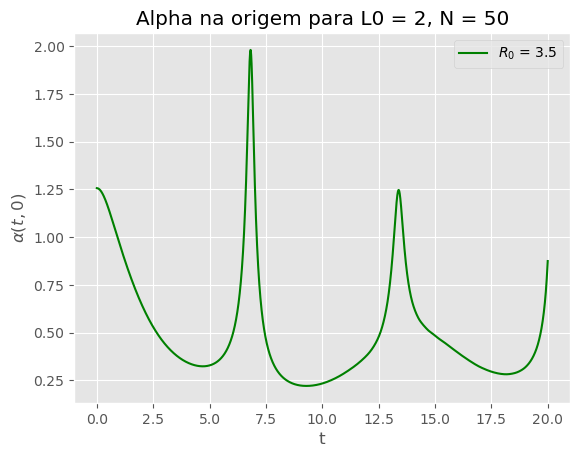

In [20]:
# Searching for critical amplitude:

plt.plot(t1, Alpha_origin, color = "g", label = "$R_0$ = {:}".format(R0))
plt.title("Alpha na origem para L0 = 2, N = {:}".format(N))
plt.ylabel(r"$\alpha(t,0)$")
plt.xlabel("t")
plt.legend()

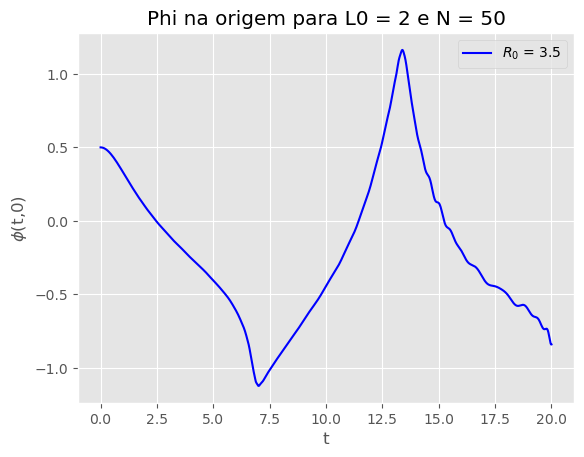

In [21]:
plt.plot(t1, phi_origin, color = "b", label = "$R_0$ = {:}".format(R0))
plt.title("Phi na origem para L0 = 2 e N = {:}".format(N) )
plt.ylabel("$\phi$(t,0)")
plt.xlabel("t")
#plt.xlim(7.2,8.2)
plt.legend()

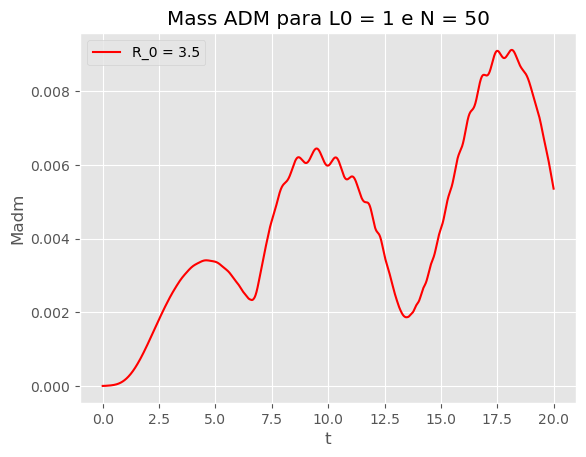

In [22]:
# Mass ADM error

Madm_error = abs(Madm - M0)/M0

plt.plot(t1, Madm_error, color = "r", label ="R_0 = {:}".format(R0))
plt.title("Mass ADM para L0 = 1 e N = {:}".format(N) )
plt.ylabel("Madm")
plt.xlabel("t")
#plt.xlim(7.2,8.2)

plt.legend()

In [23]:
!pip install ffmpeg

  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6083 sha256=403f2df03388d60db83754dfad13c1c0a9b68a3165080ce04d7d78646bda707c
  Stored in directory: /home/henrique/.cache/pip/wheels/1d/57/24/4eff6a03a9ea0e647568e8a5a0546cdf957e3cf005372c0245
Successfully built ffmpeg


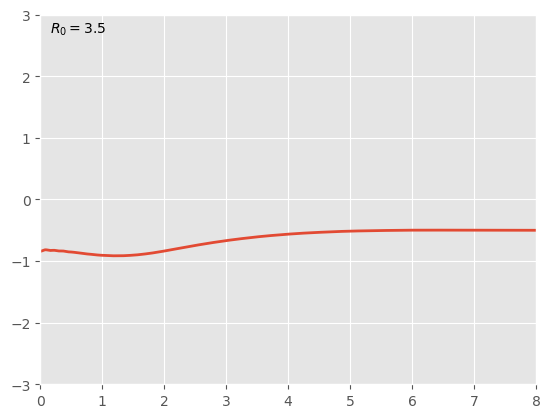

In [27]:


# Animation plot for Phi: Scalar Field

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig = plt.figure()
ax = plt.axes(xlim=(0, 8),ylim = (-3, 3))
line, = ax.plot([], [], lw=2)
initA0_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)
x = rplot
frames_to_show = It // 4  # Mostrar apenas 1/4 dos quadros
indices_to_show = [int(i * (It - 1) / (frames_to_show - 1)) for i in range(frames_to_show)]

def init():
    line.set_data([], [])
    initA0_text.set_text('')
    return line,

def animate(i):
    idx = indices_to_show[i]
    y = phi_set[idx]
    line.set_data(x, y)
    initA0_text.set_text("$R_0 = {:}$".format(R0))
    return line,

anim = FuncAnimation(fig, animate, init_func=init,
                               frames= frames_to_show, interval=0.2, blit=True)

HTML(anim.to_html5_video())
#anim.save('animation_N200_Potential.mp4')